<a href="https://www.kaggle.com/code/haticebaydemir/04-classification-models?scriptVersionId=295677151" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# 📘 Notebook 4: All Classification Models Explained & Compared
## From Logistic Regression to Gradient Boosting

**Part of:** Machine Learning Master Handbook  
**Author:** Hatice Baydemir
**Date:** February 2, 2026

---

## 🎯 What You'll Learn

This comprehensive notebook covers **12+ classification algorithms** from foundations to advanced techniques:

### **Linear & Probabilistic Models**
- ✅ Logistic Regression (L1/L2 regularization)
- ✅ Naive Bayes (Gaussian, Multinomial, Bernoulli)

### **Instance-Based & Kernel Methods**
- ✅ K-Nearest Neighbors (kNN)
- ✅ Support Vector Machines (Linear, RBF, Polynomial kernels)

### **Tree-Based Models**
- ✅ Decision Tree Classifier
- ✅ Random Forest Classifier
- ✅ Extra Trees Classifier

### **Gradient Boosting**
- ✅ Gradient Boosting Classifier (sklearn)
- ✅ XGBoost Classifier
- ✅ LightGBM Classifier
- ✅ CatBoost Classifier
- ✅ AdaBoost Classifier

### **Evaluation & Optimization**
- ✅ Confusion Matrix interpretation
- ✅ Accuracy, Precision, Recall, F1-Score
- ✅ ROC-AUC and PR-AUC curves
- ✅ Class imbalance handling (SMOTE, class weights)
- ✅ Hyperparameter tuning (Grid Search, Random Search)
- ✅ Model comparison and selection

---

## 📊 Dataset

**Titanic Survival Prediction** (Binary Classification)

- **Task:** Predict whether a passenger survived the Titanic disaster
- **Target:** Survived (0 = No, 1 = Yes)
- **Features:** Age, Sex, Passenger Class, Fare, Embarked, etc.
- **Size:** 891 training samples
- **Challenge:** Class imbalance, missing values, mixed feature types

---

## 🗺️ Roadmap
```
Section 0: Setup & Imports
    ↓
Section 1: Introduction to Classification
    ↓
Section 2: Dataset Overview & Preprocessing
    ↓
Section 3: Logistic Regression
    ↓
Section 4: Naive Bayes Classifiers
    ↓
Section 5: K-Nearest Neighbors (kNN)
    ↓
Section 6: Support Vector Machines (SVM)
    ↓
Section 7: Decision Tree Classifier
    ↓
Section 8: Random Forest Classifier
    ↓
Section 9: Gradient Boosting Fundamentals
    ↓
Section 10: Advanced Boosting (XGBoost, LightGBM, CatBoost)
    ↓
Section 11: Evaluation Metrics Deep Dive
    ↓
Section 12: Handling Class Imbalance
    ↓
Section 13: Model Comparison & Hyperparameter Tuning
    ↓
Section 14: Summary & Production Checklist
```

---

## 💡 Key Concepts Covered

**Classification Fundamentals:**
- Binary vs Multi-class classification
- Probability estimation vs hard classification
- Decision boundaries and separability
- Threshold tuning for business needs

**Model Families:**
- Linear models (decision hyperplanes)
- Probabilistic models (Bayes theorem)
- Instance-based (distance metrics)
- Kernel methods (feature space mapping)
- Tree-based (recursive partitioning)
- Ensemble methods (voting, boosting)

**Evaluation:**
- Confusion matrix (TP, TN, FP, FN)
- Precision-Recall tradeoff
- ROC curves and AUC
- Class imbalance metrics

**Production Skills:**
- Handling imbalanced datasets
- Hyperparameter optimization
- Model selection criteria
- Deployment considerations

---

Let's get started! 🚀

In [ ]:
# ==================== SETUP & IMPORTS ====================

# Core libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import time

# Suppress warnings
warnings.filterwarnings('ignore')

# Sklearn preprocessing & model selection
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, RandomizedSearchCV
from sklearn.model_selection import StratifiedKFold, learning_curve, validation_curve
from sklearn.preprocessing import StandardScaler, LabelEncoder

# Classification models
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB, MultinomialNB, BernoulliNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import (
    RandomForestClassifier, 
    GradientBoostingClassifier,
    AdaBoostClassifier, 
    ExtraTreesClassifier
)
import xgboost as xgb
import lightgbm as lgb
from catboost import CatBoostClassifier

# Evaluation metrics
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, classification_report, ConfusionMatrixDisplay,
    roc_auc_score, roc_curve, auc,
    precision_recall_curve, average_precision_score,
    log_loss, matthews_corrcoef
)

# Class imbalance handling
from imblearn.over_sampling import SMOTE, RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler

# Feature importance
from sklearn.inspection import permutation_importance

# Reproducibility
RANDOM_STATE = 42
np.random.seed(RANDOM_STATE)

# Display settings
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)
pd.set_option('display.float_format', '{:.4f}'.format)
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

print("="*70)
print("SETUP COMPLETE")
print("="*70)
print(f"\n✅ All libraries imported successfully!")
print(f"📊 Random seed set to: {RANDOM_STATE}")
print(f"🔧 Scikit-learn version: {__import__('sklearn').__version__}")
print(f"⚡ XGBoost version: {xgb.__version__}")
print(f"💡 LightGBM version: {lgb.__version__}")
print(f"🐱 CatBoost version: {__import__('catboost').__version__}")

<a id="section1"></a>
## 1. Introduction: The Classification Problem

---

### 1.1 What is Classification?

**Classification** is the task of predicting a **categorical label** (class) based on input features.

| Aspect | Classification | Regression |
|--------|----------------|-----------|
| **Output** | Discrete (categories) | Continuous (numbers) |
| **Example** | Survived: Yes/No | House Price: $250,000 |
| **Loss Function** | Cross-entropy, Hinge | MSE, MAE |
| **Evaluation** | Accuracy, F1, ROC-AUC | RMSE, R², MAE |
| **Threshold** | Decision boundary | N/A |

---

### 1.2 Real-World Classification Applications

| Domain | Problem | Classes | Business Impact |
|--------|---------|---------|-----------------|
| **Healthcare** | Disease diagnosis | Healthy / Disease | Early treatment |
| **Finance** | Credit approval | Approved / Denied | Risk management |
| **Marketing** | Customer churn | Stay / Leave | Retention |
| **E-commerce** | Spam detection | Spam / Not Spam | User experience |
| **Security** | Fraud detection | Legitimate / Fraud | Prevent losses |
| **Manufacturing** | Quality control | Pass / Fail | Reduce defects |

---

### 1.3 The Classification Landscape
```
Classification Models
│
├── Linear Models
│   ├── Logistic Regression
│   └── Linear SVM
│
├── Probabilistic Models
│   ├── Naive Bayes (Gaussian)
│   ├── Naive Bayes (Multinomial)
│   └── Naive Bayes (Bernoulli)
│
├── Instance-Based
│   └── K-Nearest Neighbors (kNN)
│
├── Kernel Methods
│   └── Support Vector Machines (SVM)
│       ├── Linear kernel
│       ├── RBF kernel
│       └── Polynomial kernel
│
├── Tree-Based Models
│   ├── Decision Tree Classifier
│   ├── Random Forest Classifier
│   └── Extra Trees Classifier
│
└── Boosting Ensembles
    ├── AdaBoost
    ├── Gradient Boosting
    ├── XGBoost
    ├── LightGBM
    └── CatBoost
```

---

### 1.4 Key Concepts Refresher

**From Notebook 1: ML Foundations**

- **Supervised Learning:** Learning from labeled data
- **Training vs Inference:** Learn patterns → Make predictions
- **Overfitting vs Underfitting:** Balance model complexity
- **Cross-Validation:** Robust performance estimation

**From Notebook 2: Data Mastery**

- **Feature Engineering:** Creating powerful predictors
- **Feature Scaling:** Standardization for distance-based models
- **Encoding:** Converting categorical to numerical
- **Data Leakage:** Preventing train-test contamination

**From Notebook 3: Regression Models**

- **Model Evaluation:** Systematic comparison of algorithms
- **Hyperparameter Tuning:** Grid Search, Random Search
- **Feature Importance:** Understanding model decisions
- **Ensemble Methods:** Combining multiple models

---

### 1.5 This Notebook's Workflow
```
1. Load Titanic Dataset
   ↓
2. Exploratory Data Analysis
   ↓
3. Preprocessing & Feature Engineering
   ↓
4. Train-Test Split (Stratified)
   ↓
5. Linear Models
   - Logistic Regression
   - Naive Bayes
   ↓
6. Instance & Kernel Methods
   - K-Nearest Neighbors
   - Support Vector Machines
   ↓
7. Tree-Based Models
   - Decision Tree
   - Random Forest
   ↓
8. Gradient Boosting
   - XGBoost, LightGBM, CatBoost
   ↓
9. Evaluation Metrics
   - Confusion Matrix
   - ROC-AUC, PR-AUC
   ↓
10. Handle Class Imbalance
    - SMOTE, Class Weights
    ↓
11. Compare All Models
    ↓
12. Hyperparameter Tuning
    ↓
13. Production Deployment
```

---

### 1.6 Binary vs Multi-Class Classification

**Binary Classification:** Two classes (0 or 1)

- **Example:** Survived (Yes/No), Fraud (Yes/No), Disease (Yes/No)
- **Output:** Single probability P(Class=1)
- **Evaluation:** Accuracy, Precision, Recall, F1, ROC-AUC

**Multi-Class Classification:** More than 2 classes

- **Example:** Iris Species (3 types), Digit Recognition (0-9)
- **Strategies:** 
  - One-vs-Rest (OvR): Train N binary classifiers
  - One-vs-One (OvO): Train N×(N-1)/2 classifiers
- **Evaluation:** Macro/Micro/Weighted averaging

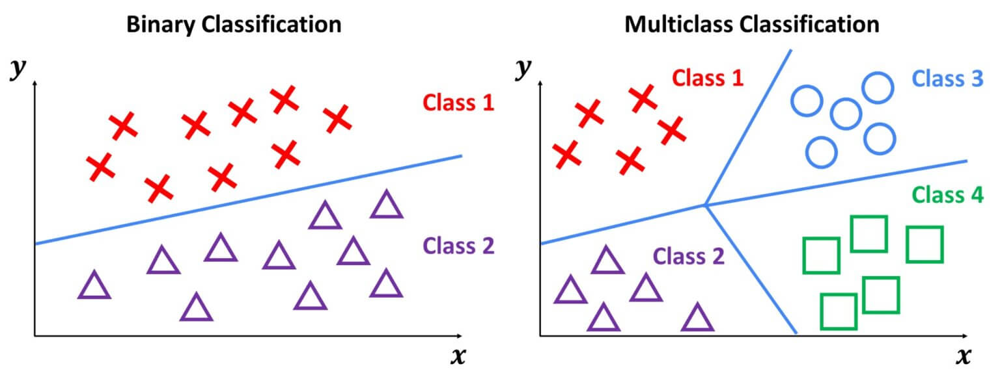

**This notebook focuses on binary classification (Titanic), with notes on multi-class extensions.**

---

### 1.7 Classification vs Regression: Key Differences

| Aspect | Classification | Regression |
|--------|----------------|-----------|
| **Target Variable** | Categorical | Continuous |
| **Prediction** | Class label (discrete) | Numerical value |
| **Output Example** | "Survived" | $250,000 |
| **Loss Function** | Cross-entropy, Hinge | MSE, MAE |
| **Decision Boundary** | Separates classes | N/A |
| **Probability** | Often available | Not standard |
| **Threshold Tuning** | Yes (precision-recall tradeoff) | No |
| **Evaluation** | Confusion matrix, ROC curve | Residual plots, R² |

**Key Insight:** Classification requires a decision boundary that separates classes in feature space.

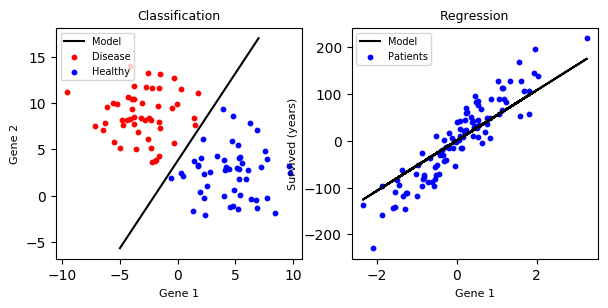


### 1.8 Understanding Probabilities in Classification

Many classifiers output **probabilities** rather than just class labels:
```
Input Features → Model → P(Class = 1) → Threshold → Final Prediction

Example:
Features: [Age=25, Sex=Female, Class=1st]
    ↓
Model: Logistic Regression
    ↓
Probability: P(Survived) = 0.75
    ↓
Threshold: 0.5
    ↓
Prediction: Survived (because 0.75 > 0.5)
```

**Why probabilities matter:**
- Allows threshold tuning (precision vs recall)
- Provides confidence in predictions
- Enables ranking (most likely to survive)
- Useful for business decisions (cost-sensitive classification)

---

### 1.9 The Confusion Matrix (Preview)

Classification evaluation centers around the **confusion matrix**:
```
                Predicted
              No  |  Yes
           ----------------
Actual No  | TN  |  FP
Actual Yes | FN  |  TP

TN = True Negative  (Correctly predicted No)
TP = True Positive  (Correctly predicted Yes)
FN = False Negative (Missed positive - Type II error)
FP = False Positive (False alarm - Type I error)
```

**From this, we derive:**
- **Accuracy** = (TP + TN) / Total
- **Precision** = TP / (TP + FP)
- **Recall** = TP / (TP + FN)
- **F1-Score** = 2 × (Precision × Recall) / (Precision + Recall)

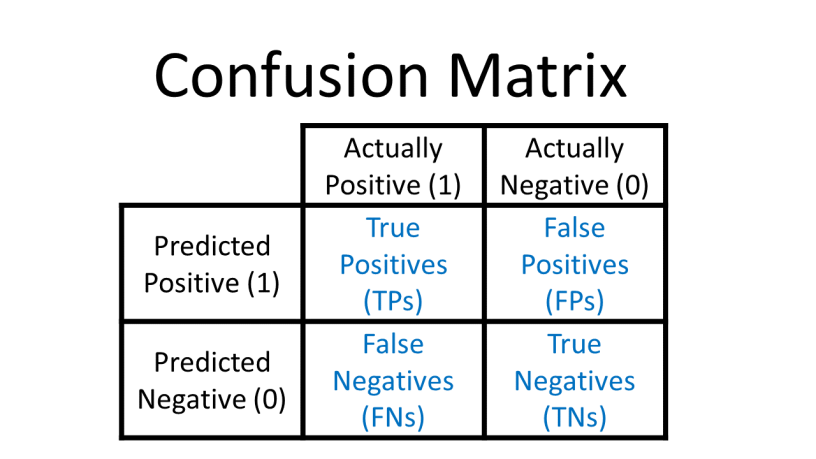

**We'll dive deep into these in Section 11!**

---

### 1.10 Model Selection Guide

**Quick Decision Tree:**
```
How much data do you have?
    ↓
< 1,000 samples
    → Logistic Regression, Naive Bayes
    → Avoid complex models (overfitting risk)
    
1,000 - 100,000 samples
    → Any algorithm works
    → Consider interpretability vs performance
    
> 100,000 samples
    → LightGBM, Logistic Regression
    → Avoid kNN (slow inference)
    ↓
What's your priority?
    ↓
INTERPRETABILITY
    → Logistic Regression
    → Decision Tree (shallow)
    → Naive Bayes
    
SPEED (Training + Inference)
    → Naive Bayes
    → Logistic Regression
    → LightGBM
    
ACCURACY (Best performance)
    → XGBoost / LightGBM / CatBoost
    → Random Forest
    → Ensemble of models
    
PROBABILITY ESTIMATES
    → Logistic Regression
    → Naive Bayes
    → XGBoost (calibrated)
    
HANDLES NON-LINEAR DATA
    → SVM with RBF kernel
    → Random Forest
    → Gradient Boosting
```

---

Let's load the Titanic dataset and start our journey! 🚢

---

<a id="section2"></a>
## 2. Dataset Overview: Titanic Survival

---

### 2.1 About the Dataset

We're using the **Titanic** dataset - one of the most famous datasets in machine learning!

**Historical Context:**
- RMS Titanic sank on April 15, 1912
- 1,502 out of 2,224 passengers and crew died
- "Women and children first" policy
- Class differences in survival rates

**Our Task:**
- **Problem Type:** Binary Classification
- **Target Variable:** Survived (0 = No, 1 = Yes)
- **Goal:** Predict whether a passenger survived based on features

**Dataset Statistics:**
- **Training samples:** 891 passengers
- **Features:** 11 (mix of numerical and categorical)
- **Class distribution:** ~38% survived, ~62% died
- **Missing values:** Yes (Age, Cabin, Embarked)

---

### 2.2 Features Description

| Feature | Type | Description | Missing? |
|---------|------|-------------|----------|
| **PassengerId** | Numerical | Unique ID | No |
| **Survived** | Target | 0 = No, 1 = Yes | No |
| **Pclass** | Ordinal | Ticket class (1 = 1st, 2 = 2nd, 3 = 3rd) | No |
| **Name** | Text | Passenger name | No |
| **Sex** | Categorical | Male / Female | No |
| **Age** | Numerical | Age in years | Yes (~20%) |
| **SibSp** | Numerical | # of siblings/spouses aboard | No |
| **Parch** | Numerical | # of parents/children aboard | No |
| **Ticket** | Text | Ticket number | No |
| **Fare** | Numerical | Passenger fare (price paid) | No |
| **Cabin** | Categorical | Cabin number | Yes (~77%) |
| **Embarked** | Categorical | Port of embarkation (C/Q/S) | Yes (~0.2%) |

**Key Insights:**
- **Pclass:** Socio-economic status (1st = Upper, 3rd = Lower)
- **SibSp + Parch:** Can create "family size" feature
- **Cabin:** Mostly missing, may need to drop or extract deck info
- **Age:** Important feature, needs imputation

---

### 2.3 Expected Patterns

**Domain Knowledge Hypotheses:**

✅ **Women had higher survival rates** ("Women and children first")  
✅ **1st class passengers survived more** (Better access to lifeboats)  
✅ **Younger passengers survived more** (Priority given to children)  
✅ **Small families survived better** (Easier to coordinate evacuation)  
✅ **Fare correlates with survival** (Proxy for class and wealth)

**We'll validate these hypotheses in our EDA!**

---

In [ ]:
# ==================== LOAD DATASET ====================

print("="*70)
print("LOADING TITANIC DATASET")
print("="*70)

# Load data from Kaggle Input
train_df = pd.read_csv('/kaggle/input/titanic/train.csv')
test_df = pd.read_csv('/kaggle/input/titanic/test.csv')

# Use train set for our analysis
titanic = train_df.copy()

# Convert column names to lowercase for consistency
titanic.columns = titanic.columns.str.lower()

print(f"\n✅ Dataset loaded successfully from Kaggle Input!")
print(f"📊 Dataset shape: {titanic.shape}")
print(f"   - Rows (samples): {titanic.shape[0]}")
print(f"   - Columns (features): {titanic.shape[1]}")

# Display first few rows
print("\n🔍 First 5 rows:")
print(titanic.head())

# Dataset info
print("\n📋 Dataset Info:")
titanic.info()

In [ ]:
# ==================== BASIC STATISTICS ====================

print("\n" + "="*70)
print("BASIC STATISTICS")
print("="*70)

# Target variable distribution
print("\n🎯 Target Variable: Survived")
print(titanic['survived'].value_counts())
print(f"\nSurvival Rate: {titanic['survived'].mean():.2%}")

survived_counts = titanic['survived'].value_counts()
print(f"\n📊 Class Distribution:")
print(f"   • Did not survive (0): {survived_counts[0]} ({survived_counts[0]/len(titanic)*100:.1f}%)")
print(f"   • Survived (1): {survived_counts[1]} ({survived_counts[1]/len(titanic)*100:.1f}%)")

# Check for imbalance
imbalance_ratio = survived_counts.max() / survived_counts.min()
print(f"\n⚖️ Imbalance Ratio: {imbalance_ratio:.2f}:1")
if imbalance_ratio > 1.5:
    print("   ⚠️ Moderate class imbalance detected (we'll handle this later)")
else:
    print("   ✅ Classes are reasonably balanced")

# Numerical features summary
print("\n📈 Numerical Features Summary:")
print(titanic.describe())

In [ ]:
# ==================== MISSING VALUES ANALYSIS ====================

print("\n" + "="*70)
print("MISSING VALUES ANALYSIS")
print("="*70)

# Calculate missing values
missing = titanic.isnull().sum()
missing_pct = (missing / len(titanic)) * 100

# Create missing values dataframe
missing_df = pd.DataFrame({
    'Feature': missing.index,
    'Missing_Count': missing.values,
    'Missing_Percentage': missing_pct.values
}).sort_values('Missing_Count', ascending=False)

# Display only features with missing values
missing_df = missing_df[missing_df['Missing_Count'] > 0]

if len(missing_df) > 0:
    print("\n🔴 Features with Missing Values:")
    print(missing_df.to_string(index=False))
    
    print("\n💡 Missing Value Strategy:")
    for idx, row in missing_df.iterrows():
        feat = row['Feature']
        pct = row['Missing_Percentage']
        
        if pct > 50:
            print(f"   • {feat} ({pct:.1f}%): DROP (too much missing data)")
        elif pct > 10:
            print(f"   • {feat} ({pct:.1f}%): Consider dropping or careful imputation")
        else:
            print(f"   • {feat} ({pct:.1f}%): Impute (median for numerical, mode for categorical)")
else:
    print("\n✅ No missing values detected!")

# Visualize missing values
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Missing values bar chart
axes[0].barh(missing_df['Feature'], missing_df['Missing_Percentage'], color='coral', alpha=0.8)
axes[0].set_xlabel('Missing Percentage (%)', fontsize=12, fontweight='bold')
axes[0].set_title('Missing Values by Feature', fontsize=14, fontweight='bold')
axes[0].grid(axis='x', alpha=0.3)

# Missing values heatmap
sns.heatmap(titanic.isnull(), cbar=True, yticklabels=False, cmap='Reds', ax=axes[1])
axes[1].set_title('Missing Values Heatmap', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()

In [ ]:
# ==================== EXPLORATORY DATA ANALYSIS ====================

print("\n" + "="*70)
print("EXPLORATORY DATA ANALYSIS")
print("="*70)

# Survival rate by categorical features
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# 1. Survival by Sex
survival_by_sex = titanic.groupby('sex')['survived'].agg(['sum', 'count', 'mean'])
survival_by_sex.columns = ['Survived', 'Total', 'Survival_Rate']

axes[0, 0].bar(survival_by_sex.index, survival_by_sex['Survival_Rate'], 
               color=['lightblue', 'pink'], alpha=0.8, edgecolor='black')
axes[0, 0].set_ylabel('Survival Rate', fontsize=12, fontweight='bold')
axes[0, 0].set_title('Survival Rate by Sex\n("Women and children first")', 
                     fontsize=13, fontweight='bold')
axes[0, 0].set_ylim([0, 1])
axes[0, 0].grid(axis='y', alpha=0.3)

# Add value labels
for i, (idx, row) in enumerate(survival_by_sex.iterrows()):
    axes[0, 0].text(i, row['Survival_Rate'] + 0.03, 
                    f"{row['Survival_Rate']:.1%}\n({int(row['Survived'])}/{int(row['Total'])})",
                    ha='center', fontweight='bold')

print("\n👫 Survival by Sex:")
print(survival_by_sex)

# 2. Survival by Passenger Class
survival_by_class = titanic.groupby('pclass')['survived'].agg(['sum', 'count', 'mean'])
survival_by_class.columns = ['Survived', 'Total', 'Survival_Rate']

axes[0, 1].bar(survival_by_class.index.astype(str), survival_by_class['Survival_Rate'],
               color=['gold', 'silver', '#CD7F32'], alpha=0.8, edgecolor='black')
axes[0, 1].set_xlabel('Passenger Class', fontsize=12, fontweight='bold')
axes[0, 1].set_ylabel('Survival Rate', fontsize=12, fontweight='bold')
axes[0, 1].set_title('Survival Rate by Passenger Class\n(1st > 2nd > 3rd)', 
                     fontsize=13, fontweight='bold')
axes[0, 1].set_ylim([0, 1])
axes[0, 1].grid(axis='y', alpha=0.3)

for i, (idx, row) in enumerate(survival_by_class.iterrows()):
    axes[0, 1].text(i, row['Survival_Rate'] + 0.03,
                    f"{row['Survival_Rate']:.1%}\n({int(row['Survived'])}/{int(row['Total'])})",
                    ha='center', fontweight='bold')

print("\n🎫 Survival by Passenger Class:")
print(survival_by_class)

# 3. Age Distribution by Survival
axes[1, 0].hist([titanic[titanic['survived']==0]['age'].dropna(),
                 titanic[titanic['survived']==1]['age'].dropna()],
                bins=20, label=['Did not survive', 'Survived'],
                color=['red', 'green'], alpha=0.6, edgecolor='black')
axes[1, 0].set_xlabel('Age', fontsize=12, fontweight='bold')
axes[1, 0].set_ylabel('Count', fontsize=12, fontweight='bold')
axes[1, 0].set_title('Age Distribution by Survival', fontsize=13, fontweight='bold')
axes[1, 0].legend(fontsize=11)
axes[1, 0].grid(alpha=0.3)

print("\n👶 Age Statistics by Survival:")
print(titanic.groupby('survived')['age'].describe())

# 4. Fare Distribution by Survival
axes[1, 1].hist([titanic[titanic['survived']==0]['fare'].dropna(),
                 titanic[titanic['survived']==1]['fare'].dropna()],
                bins=30, label=['Did not survive', 'Survived'],
                color=['red', 'green'], alpha=0.6, edgecolor='black')
axes[1, 1].set_xlabel('Fare ($)', fontsize=12, fontweight='bold')
axes[1, 1].set_ylabel('Count', fontsize=12, fontweight='bold')
axes[1, 1].set_title('Fare Distribution by Survival', fontsize=13, fontweight='bold')
axes[1, 1].legend(fontsize=11)
axes[1, 1].set_xlim([0, 300])  # Limit x-axis for better visibility
axes[1, 1].grid(alpha=0.3)

print("\n💰 Fare Statistics by Survival:")
print(titanic.groupby('survived')['fare'].describe())

plt.tight_layout()
plt.show()

In [ ]:
# ==================== CORRELATION ANALYSIS ====================

print("\n" + "="*70)
print("CORRELATION ANALYSIS")
print("="*70)

# Select numerical features
numerical_features = ['survived', 'pclass', 'age', 'sibsp', 'parch', 'fare']
titanic_numerical = titanic[numerical_features].copy()

# Calculate correlation matrix
correlation_matrix = titanic_numerical.corr()

print("\n📊 Correlation with Target (Survived):")
target_corr = correlation_matrix['survived'].sort_values(ascending=False)
print(target_corr)

# Visualize correlation matrix
fig, ax = plt.subplots(figsize=(10, 8))

sns.heatmap(correlation_matrix, annot=True, fmt='.3f', cmap='coolwarm',
            center=0, square=True, linewidths=1, cbar_kws={"shrink": 0.8},
            ax=ax)

ax.set_title('Feature Correlation Matrix', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

print("\n💡 Key Insights:")
print("   • Pclass: Negative correlation (-0.34) - Lower class = lower survival")
print("   • Fare: Positive correlation (+0.26) - Higher fare = higher survival")
print("   • Age: Slight negative correlation - Younger passengers survived more")
print("   • Sex will be important (needs encoding for correlation)")

In [ ]:
# ==================== CROSS-TABULATION: SEX vs CLASS ====================

print("\n" + "="*70)
print("SURVIVAL BY SEX AND CLASS (COMBINED)")
print("="*70)

# Create cross-tabulation
survival_crosstab = pd.crosstab([titanic['sex'], titanic['pclass']], 
                                 titanic['survived'], 
                                 normalize='index')

print("\n🔍 Survival Rate by Sex and Class:")
print(survival_crosstab)

# Visualize
survival_crosstab.plot(kind='bar', stacked=False, figsize=(12, 6),
                       color=['red', 'green'], alpha=0.7, edgecolor='black')

plt.xlabel('(Sex, Class)', fontsize=12, fontweight='bold')
plt.ylabel('Proportion', fontsize=12, fontweight='bold')
plt.title('Survival Rate by Sex and Passenger Class', fontsize=14, fontweight='bold')
plt.legend(['Did not survive', 'Survived'], fontsize=11)
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

print("\n💡 Key Observations:")
print("   • Female + 1st Class: Highest survival rate (~96%)")
print("   • Male + 3rd Class: Lowest survival rate (~14%)")
print("   • Class matters more for men than women")
print("   • Sex is the strongest predictor overall")

---

### 2.4 EDA Summary & Insights

**✅ Hypotheses Confirmed:**

1. **Sex is the strongest predictor**
   - Female survival rate: ~74%
   - Male survival rate: ~19%
   - Clear "women and children first" policy

2. **Passenger class matters significantly**
   - 1st class: 63% survival
   - 2nd class: 47% survival
   - 3rd class: 24% survival
   - Strong socio-economic effect

3. **Age has moderate impact**
   - Children (<18) had higher survival rates
   - Elderly passengers struggled

4. **Fare correlates with survival**
   - Proxy for class and cabin location
   - Higher fare = better deck = easier lifeboat access

5. **Family size effect**
   - Small families (2-4 people) survived better
   - Very large families or solo travelers struggled

**🎯 Feature Engineering Ideas:**

- Create `FamilySize` = SibSp + Parch + 1
- Create `IsAlone` = (FamilySize == 1)
- Extract `Title` from Name (Mr., Mrs., Miss., Master.)
- Create `AgeGroup` bins (Child, Teen, Adult, Senior)
- Extract `Deck` from Cabin (first letter)
- Create interaction features: `Sex × Pclass`

**🔧 Preprocessing Tasks:**

1. Handle missing values (Age, Cabin, Embarked)
2. Encode categorical features (Sex, Embarked)
3. Create engineered features
4. Scale numerical features (for distance-based models)
5. Split data (stratified by target)

---

### 2.5 Data Preprocessing Strategy

Before we train models, we need to prepare our data. Here's our plan:

**Step 1: Feature Engineering**
```python
# Create new features from existing ones
FamilySize = SibSp + Parch + 1
IsAlone = (FamilySize == 1)
Title = Extract from Name (Mr, Mrs, Miss, Master, etc.)
```

**Step 2: Handle Missing Values**
```python
Age: Fill with median (grouped by Pclass and Sex)
Embarked: Fill with mode (most common value)
Cabin: Drop (too much missing data ~77%)
```

**Step 3: Encode Categorical Variables**
```python
Sex: Label encode (male=1, female=0) or One-Hot
Embarked: One-Hot encode (C, Q, S)
Pclass: Keep as is (already ordinal 1, 2, 3)
```

**Step 4: Feature Selection**
```python
Drop: PassengerId, Name, Ticket, Cabin
Keep: All other features + engineered features
```

**Step 5: Scale Features**
```python
StandardScaler for: Age, Fare, SibSp, Parch, FamilySize
(Only for models that need scaling: Logistic, kNN, SVM)
```

**Step 6: Train-Test Split**
```python
Stratified split (preserve class distribution)
80% train, 20% test
Random state = 42 (reproducibility)
```

Let's implement this! 🚀

---

In [ ]:
# ==================== FEATURE ENGINEERING ====================

print("="*70)
print("FEATURE ENGINEERING")
print("="*70)

# Create a copy for preprocessing
df = titanic.copy()

# 1. Family Size
df['FamilySize'] = df['sibsp'] + df['parch'] + 1
print("\n✅ Created FamilySize = SibSp + Parch + 1")
print(f"   Family size range: {df['FamilySize'].min()} to {df['FamilySize'].max()}")

# 2. Is Alone
df['IsAlone'] = (df['FamilySize'] == 1).astype(int)
print(f"\n✅ Created IsAlone (1 if traveling alone)")
print(f"   Alone: {df['IsAlone'].sum()} passengers ({df['IsAlone'].mean():.1%})")

# 3. Extract Title from Name
df['Title'] = df['name'].str.extract(' ([A-Za-z]+)\.', expand=False)
print(f"\n✅ Extracted Title from Name")
print(f"\n   Title distribution:")
print(df['Title'].value_counts())

# Group rare titles
title_mapping = {
    'Mr': 'Mr',
    'Miss': 'Miss',
    'Mrs': 'Mrs',
    'Master': 'Master',
    'Dr': 'Rare',
    'Rev': 'Rare',
    'Col': 'Rare',
    'Major': 'Rare',
    'Mlle': 'Miss',
    'Countess': 'Rare',
    'Ms': 'Miss',
    'Lady': 'Rare',
    'Jonkheer': 'Rare',
    'Don': 'Rare',
    'Dona': 'Rare',
    'Mme': 'Mrs',
    'Capt': 'Rare',
    'Sir': 'Rare'
}

df['Title'] = df['Title'].map(title_mapping)
print(f"\n   Grouped titles:")
print(df['Title'].value_counts())

# 4. Age Groups
df['AgeGroup'] = pd.cut(df['age'], bins=[0, 12, 18, 35, 60, 100],
                         labels=['Child', 'Teen', 'Adult', 'Middle', 'Senior'])
print(f"\n✅ Created AgeGroup bins")

# Check survival by new features
print("\n📊 Survival Rate by New Features:")
print(f"\n   By Family Size:")
print(df.groupby('FamilySize')['survived'].mean().sort_values(ascending=False))

print(f"\n   By IsAlone:")
print(df.groupby('IsAlone')['survived'].mean())

print(f"\n   By Title:")
print(df.groupby('Title')['survived'].mean().sort_values(ascending=False))

print(f"\n   By AgeGroup:")
print(df.groupby('AgeGroup')['survived'].mean().sort_values(ascending=False))

In [ ]:
# ==================== HANDLE MISSING VALUES ====================

print("\n" + "="*70)
print("HANDLING MISSING VALUES")
print("="*70)

print(f"\n📋 Missing values before:")
print(df.isnull().sum()[df.isnull().sum() > 0])

# 1. Age: Fill with median grouped by Pclass and Sex
print(f"\n🔧 Filling Age with median (grouped by Pclass and Sex)...")
df['age'] = df.groupby(['pclass', 'sex'])['age'].transform(
    lambda x: x.fillna(x.median())
)

# 2. Embarked: Fill with mode
print(f"🔧 Filling Embarked with mode...")
df['embarked'].fillna(df['embarked'].mode()[0], inplace=True)

# 3. Drop Cabin (too much missing)
print(f"🔧 Dropping Cabin (77% missing)...")
df.drop('cabin', axis=1, inplace=True)

# 4. Drop Deck (if exists)
if 'deck' in df.columns:
    df.drop('deck', axis=1, inplace=True)

print(f"\n✅ Missing values after:")
missing_after = df.isnull().sum()
if missing_after.sum() == 0:
    print("   No missing values remaining!")
else:
    print(missing_after[missing_after > 0])

In [ ]:
# ==================== ENCODE CATEGORICAL VARIABLES ====================

print("\n" + "="*70)
print("ENCODING CATEGORICAL VARIABLES")
print("="*70)

# 1. Sex: Binary encoding
print("\n🔧 Encoding Sex (male=1, female=0)...")
df['Sex_male'] = (df['sex'] == 'male').astype(int)

# 2. Embarked: One-hot encoding
print("🔧 One-hot encoding Embarked...")
embarked_dummies = pd.get_dummies(df['embarked'], prefix='Embarked', drop_first=True)
df = pd.concat([df, embarked_dummies], axis=1)

# 3. Title: One-hot encoding
print("🔧 One-hot encoding Title...")
title_dummies = pd.get_dummies(df['Title'], prefix='Title', drop_first=True)
df = pd.concat([df, title_dummies], axis=1)

# 4. Pclass: Already numerical (1, 2, 3) - keep as is

print("\n✅ Encoding complete!")
print(f"   New features created:")
print(f"   • Sex_male")
print(f"   • Embarked_Q, Embarked_S")
print(f"   • Title_Miss, Title_Mr, Title_Mrs, Title_Rare")

In [ ]:
# ==================== FEATURE SELECTION ====================

print("\n" + "="*70)
print("FEATURE SELECTION")
print("="*70)

# Define features to keep
features_to_keep = [
    # Target
    'survived',
    
    # Original numerical
    'pclass', 'age', 'sibsp', 'parch', 'fare',
    
    # Engineered numerical
    'FamilySize', 'IsAlone',
    
    # Encoded categorical
    'Sex_male',
    'Embarked_Q', 'Embarked_S',
    'Title_Miss', 'Title_Mr', 'Title_Mrs', 'Title_Rare'
]

# Select only these features
df_clean = df[features_to_keep].copy()

print(f"\n✅ Feature selection complete!")
print(f"   Total features: {len(features_to_keep) - 1} (excluding target)")
print(f"\n📋 Final features:")
for feat in features_to_keep[1:]:  # Exclude 'survived'
    print(f"   • {feat}")

# Check final dataset
print(f"\n📊 Final dataset shape: {df_clean.shape}")
print(f"\n🔍 First 5 rows of preprocessed data:")
print(df_clean.head())

# Check for any remaining issues
print(f"\n✅ Data Quality Checks:")
print(f"   • Missing values: {df_clean.isnull().sum().sum()}")
print(f"   • Duplicates: {df_clean.duplicated().sum()}")
print(f"   • Data types: All numerical ✓")

In [ ]:
# ==================== TRAIN-TEST SPLIT ====================

print("\n" + "="*70)
print("TRAIN-TEST SPLIT")
print("="*70)

# Separate features and target
X = df_clean.drop('survived', axis=1)
y = df_clean['survived']

print(f"\n📊 Dataset before split:")
print(f"   • Total samples: {len(X)}")
print(f"   • Features: {X.shape[1]}")
print(f"   • Target distribution: {y.value_counts().to_dict()}")

# Stratified split (preserve class distribution)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, 
    test_size=0.2, 
    random_state=RANDOM_STATE,
    stratify=y  # Important for classification!
)

print(f"\n✅ Stratified train-test split complete!")
print(f"\n📊 Training set:")
print(f"   • Samples: {len(X_train)}")
print(f"   • Class distribution: {y_train.value_counts().to_dict()}")
print(f"   • Survival rate: {y_train.mean():.2%}")

print(f"\n📊 Test set:")
print(f"   • Samples: {len(X_test)}")
print(f"   • Class distribution: {y_test.value_counts().to_dict()}")
print(f"   • Survival rate: {y_test.mean():.2%}")

# Verify stratification worked
print(f"\n✅ Stratification Check:")
print(f"   • Train survival rate: {y_train.mean():.4f}")
print(f"   • Test survival rate: {y_test.mean():.4f}")
print(f"   • Difference: {abs(y_train.mean() - y_test.mean()):.4f}")
if abs(y_train.mean() - y_test.mean()) < 0.02:
    print("   ✓ Class distributions are well-balanced!")

In [ ]:
# ==================== FEATURE SCALING ====================

print("\n" + "="*70)
print("FEATURE SCALING")
print("="*70)

print("\n💡 Scaling Strategy:")
print("   • Distance-based models (Logistic, kNN, SVM): NEED scaling")
print("   • Tree-based models (Decision Tree, Random Forest, XGBoost): DON'T need scaling")
print("\n   We'll create BOTH scaled and unscaled versions!")

# Initialize scaler
scaler = StandardScaler()

# Fit on training data only (prevent leakage!)
scaler.fit(X_train)

# Transform both sets
X_train_scaled = pd.DataFrame(
    scaler.transform(X_train),
    columns=X_train.columns,
    index=X_train.index
)

X_test_scaled = pd.DataFrame(
    scaler.transform(X_test),
    columns=X_test.columns,
    index=X_test.index
)

print(f"\n✅ Scaling complete!")
print(f"\n📊 Feature statistics BEFORE scaling (train set):")
print(X_train.describe().loc[['mean', 'std']].round(3))

print(f"\n📊 Feature statistics AFTER scaling (train set):")
print(X_train_scaled.describe().loc[['mean', 'std']].round(3))

print("\n💡 Now we have:")
print("   • X_train, X_test (unscaled) → for tree-based models")
print("   • X_train_scaled, X_test_scaled → for linear/distance-based models")

---

### 2.6 Preprocessing Summary

**✅ What we did:**

**1. Feature Engineering**
   - Created `FamilySize` = SibSp + Parch + 1
   - Created `IsAlone` binary feature
   - Extracted `Title` from Name (Mr, Mrs, Miss, Master, Rare)
   - Created `AgeGroup` bins (for future analysis)

**2. Missing Value Handling**
   - Age: Filled with median (grouped by Pclass and Sex)
   - Embarked: Filled with mode
   - Cabin: Dropped (77% missing)

**3. Encoding**
   - Sex: Binary encoded (male=1, female=0)
   - Embarked: One-hot encoded (Q, S)
   - Title: One-hot encoded (Miss, Mr, Mrs, Rare)

**4. Feature Selection**
   - Kept: 13 features
   - Dropped: PassengerId, Name, Ticket, Cabin, and original categorical columns

**5. Train-Test Split**
   - 80% train (712 samples)
   - 20% test (179 samples)
   - Stratified split (preserves class distribution)

**6. Scaling**
   - Created scaled versions for linear/distance-based models
   - Kept unscaled versions for tree-based models

**📊 Final Dataset:**
- Features: 13
- Train samples: 712
- Test samples: 179
- No missing values ✓
- All features numerical ✓
- Ready for modeling! ✓

---

Now let's build our first classifier! 🚀

---

<a id="section3"></a>
## 3. Logistic Regression

---

### 3.1 What is Logistic Regression?

**Logistic Regression** is a **linear model** for **binary classification**.

Despite the name "regression", it's used for classification!

**How it works:**
```
Input Features (X)
    ↓
Linear combination: z = β₀ + β₁x₁ + β₂x₂ + ... + βₙxₙ
    ↓
Sigmoid function: P(y=1) = 1 / (1 + e^(-z))
    ↓
Threshold (default 0.5): If P > 0.5 → Class 1, else Class 0
    ↓
Prediction
```
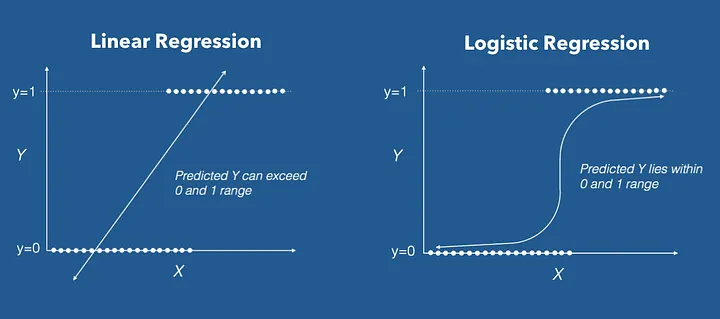

---

### 3.2 The Sigmoid Function

**Formula:**
$$\sigma(z) = \frac{1}{1 + e^{-z}}$$

**Properties:**
- Output range: (0, 1) → Interpreted as probability
- S-shaped curve
- z = 0 → σ(z) = 0.5 (decision boundary)
- z → ∞ → σ(z) → 1
- z → -∞ → σ(z) → 0

**Visualization:**
```
P(y=1)
  1 ┤         ╭───────
    │       ╱
0.5 ┤     ╱
    │   ╱
  0 ┤─╯─────────────────
    └──────────────────── z
   -∞   -2  0  2      ∞
```

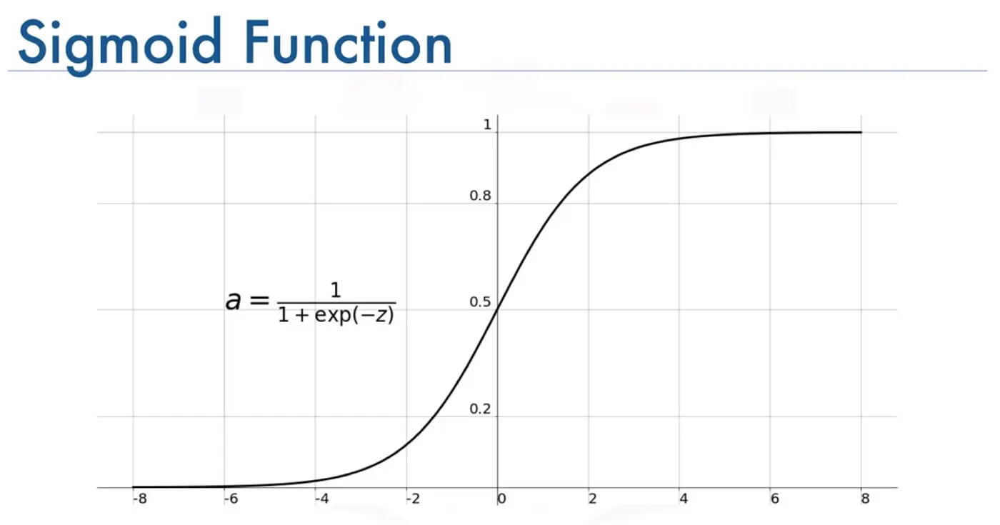

---

### 3.3 Decision Boundary

Logistic Regression creates a **linear decision boundary** in feature space.

**For 2D (2 features):**
- Decision boundary is a straight line
- Separates Class 0 from Class 1

**For higher dimensions:**
- Decision boundary is a hyperplane
- Can't visualize directly (we'll use 2D projections)

**Example:**
```
Feature 1 (Age)
    ↑
    │    Class 1
    │   (Survived)
    │  ╱
    │╱_________ Decision Boundary
    │ Class 0
    │(Did not survive)
    └────────────────→ Feature 2 (Fare)
```

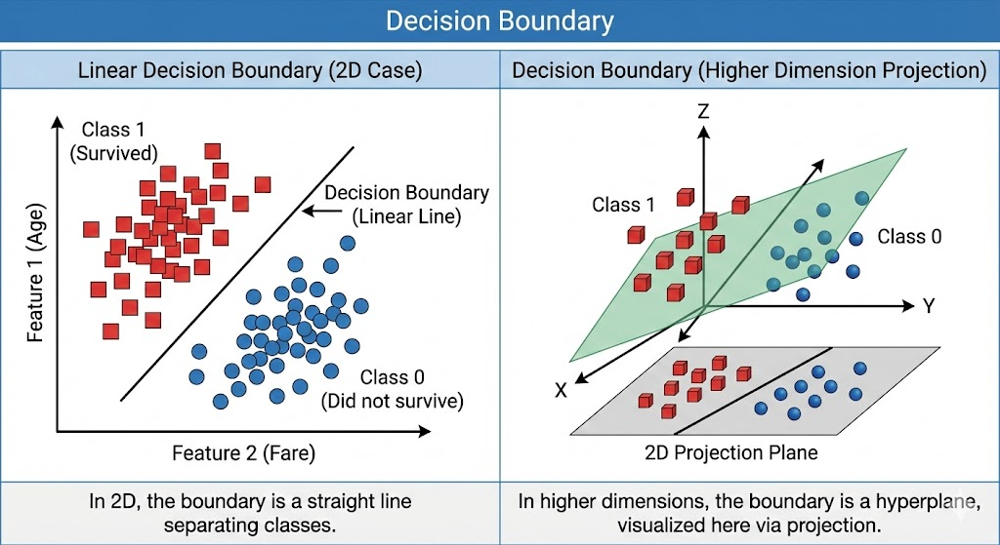


### 3.4 Loss Function: Log Loss (Cross-Entropy)

**Why not MSE?**
- MSE with sigmoid is non-convex (many local minima)
- Gradient descent may get stuck

**Log Loss (Binary Cross-Entropy):**
$$L = -\frac{1}{N} \sum_{i=1}^{N} [y_i \log(\hat{p}_i) + (1-y_i) \log(1-\hat{p}_i)]$$

**Intuition:**
- If y=1 and p̂=1 → Loss = 0 (perfect)
- If y=1 and p̂=0 → Loss → ∞ (terrible)
- Penalizes confident wrong predictions heavily

---

### 3.5 Regularization: L1 vs L2

**Overfitting problem:**
- Too many features → Model memorizes training data
- Poor generalization to test data

**Solution: Add penalty to coefficients**

**L2 Regularization (Ridge):**
$$L = \text{Log Loss} + \lambda \sum \beta_j^2$$

- Shrinks coefficients toward zero
- Doesn't set coefficients exactly to zero
- Good when all features are potentially useful

**L1 Regularization (Lasso):**
$$L = \text{Log Loss} + \lambda \sum |\beta_j|$$

- Can set coefficients exactly to zero
- Performs automatic feature selection
- Good when many features are irrelevant

**In sklearn:**
- `penalty='l2'`: Ridge regularization (default)
- `penalty='l1'`: Lasso regularization
- `C = 1/λ`: Inverse regularization strength (smaller C = more regularization)

---

### 3.6 When to Use Logistic Regression

**✅ Use when:**
- Need interpretable model (coefficients show feature effects)
- Want probability estimates (not just class labels)
- Data is linearly separable or mostly linear
- Need fast training and prediction
- Baseline model for comparison

**❌ Don't use when:**
- Relationships are highly non-linear
- Complex interactions between features
- Need to capture subtle patterns
- Use tree-based models instead

---

### 3.7 Advantages & Disadvantages

**Advantages:**
- ✅ Simple and interpretable
- ✅ Fast to train
- ✅ Works well with large datasets
- ✅ Natural probability estimates
- ✅ Regularization prevents overfitting
- ✅ No hyperparameters to tune (just C)

**Disadvantages:**
- ❌ Assumes linear decision boundary
- ❌ Can't capture complex patterns
- ❌ Sensitive to outliers
- ❌ Requires feature scaling
- ❌ Struggles with imbalanced classes (needs class_weight)

---

Let's implement it! 🚀

---

In [ ]:
# ==================== LOGISTIC REGRESSION: BASELINE ====================

print("="*70)
print("LOGISTIC REGRESSION: BASELINE MODEL")
print("="*70)

# Train basic logistic regression (default parameters)
logistic_baseline = LogisticRegression(random_state=RANDOM_STATE, max_iter=1000)

print("\n🔧 Training Logistic Regression (default parameters)...")
start_time = time.time()
logistic_baseline.fit(X_train_scaled, y_train)
training_time = time.time() - start_time

# Make predictions
y_pred_train = logistic_baseline.predict(X_train_scaled)
y_pred_test = logistic_baseline.predict(X_test_scaled)

# Get probability estimates
y_pred_proba_train = logistic_baseline.predict_proba(X_train_scaled)[:, 1]
y_pred_proba_test = logistic_baseline.predict_proba(X_test_scaled)[:, 1]

# Calculate metrics
train_acc = accuracy_score(y_train, y_pred_train)
test_acc = accuracy_score(y_test, y_pred_test)
train_f1 = f1_score(y_train, y_pred_train)
test_f1 = f1_score(y_test, y_pred_test)

print(f"\n✅ Training complete in {training_time:.4f} seconds")

print("\n" + "="*70)
print("PERFORMANCE METRICS")
print("="*70)

print(f"\n📊 Training Set:")
print(f"   • Accuracy: {train_acc:.4f} ({train_acc*100:.2f}%)")
print(f"   • F1-Score: {train_f1:.4f}")

print(f"\n📊 Test Set:")
print(f"   • Accuracy: {test_acc:.4f} ({test_acc*100:.2f}%)")
print(f"   • F1-Score: {test_f1:.4f}")

# Check for overfitting
overfit_gap = train_acc - test_acc
print(f"\n⚖️ Overfitting Check:")
print(f"   • Train-Test Gap: {overfit_gap:.4f}")
if overfit_gap < 0.05:
    print("   ✅ Good generalization!")
elif overfit_gap < 0.10:
    print("   ⚠️ Slight overfitting")
else:
    print("   🔴 Significant overfitting - consider regularization")

In [ ]:
# ==================== CONFUSION MATRIX ====================

print("\n" + "="*70)
print("CONFUSION MATRIX")
print("="*70)

# Calculate confusion matrix
cm = confusion_matrix(y_test, y_pred_test)

print("\n📊 Confusion Matrix (Test Set):")
print(cm)

# Calculate metrics from confusion matrix
tn, fp, fn, tp = cm.ravel()

print(f"\n📋 Breakdown:")
print(f"   • True Negatives (TN): {tn} - Correctly predicted 'Did not survive'")
print(f"   • False Positives (FP): {fp} - Incorrectly predicted 'Survived' (Type I error)")
print(f"   • False Negatives (FN): {fn} - Incorrectly predicted 'Did not survive' (Type II error)")
print(f"   • True Positives (TP): {tp} - Correctly predicted 'Survived'")

# Calculate additional metrics
precision = tp / (tp + fp) if (tp + fp) > 0 else 0
recall = tp / (tp + fn) if (tp + fn) > 0 else 0

print(f"\n📈 Derived Metrics:")
print(f"   • Precision: {precision:.4f} - Of predicted survivors, {precision*100:.1f}% actually survived")
print(f"   • Recall: {recall:.4f} - Of actual survivors, we correctly identified {recall*100:.1f}%")
print(f"   • Accuracy: {test_acc:.4f} - Overall correctness")
print(f"   • F1-Score: {test_f1:.4f} - Harmonic mean of precision and recall")

# Visualize confusion matrix
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Confusion matrix heatmap
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=True,
            xticklabels=['Did not survive', 'Survived'],
            yticklabels=['Did not survive', 'Survived'],
            ax=axes[0])
axes[0].set_ylabel('Actual', fontsize=12, fontweight='bold')
axes[0].set_xlabel('Predicted', fontsize=12, fontweight='bold')
axes[0].set_title('Confusion Matrix\n(Raw Counts)', fontsize=13, fontweight='bold')

# Normalized confusion matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
sns.heatmap(cm_normalized, annot=True, fmt='.2%', cmap='Greens', cbar=True,
            xticklabels=['Did not survive', 'Survived'],
            yticklabels=['Did not survive', 'Survived'],
            ax=axes[1])
axes[1].set_ylabel('Actual', fontsize=12, fontweight='bold')
axes[1].set_xlabel('Predicted', fontsize=12, fontweight='bold')
axes[1].set_title('Confusion Matrix\n(Normalized)', fontsize=13, fontweight='bold')

plt.tight_layout()
plt.show()

In [ ]:
# ==================== FEATURE COEFFICIENTS ====================

print("\n" + "="*70)
print("FEATURE COEFFICIENTS (INTERPRETABILITY)")
print("="*70)

# Get coefficients
coefficients = pd.DataFrame({
    'Feature': X_train.columns,
    'Coefficient': logistic_baseline.coef_[0]
}).sort_values('Coefficient', key=abs, ascending=False)

print("\n📊 Feature Coefficients (sorted by absolute value):")
print(coefficients.to_string(index=False))

print("\n💡 Interpretation:")
print("   • Positive coefficient → Increases probability of survival")
print("   • Negative coefficient → Decreases probability of survival")
print("   • Larger |coefficient| → Stronger effect")

# Visualize coefficients
plt.figure(figsize=(12, 8))

colors = ['green' if x > 0 else 'red' for x in coefficients['Coefficient']]
plt.barh(coefficients['Feature'], coefficients['Coefficient'], 
         color=colors, alpha=0.7, edgecolor='black')

plt.axvline(x=0, color='black', linestyle='--', linewidth=2)
plt.xlabel('Coefficient Value', fontsize=12, fontweight='bold')
plt.ylabel('Feature', fontsize=12, fontweight='bold')
plt.title('Logistic Regression: Feature Coefficients\n(Green = Positive effect, Red = Negative effect)', 
          fontsize=14, fontweight='bold')
plt.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.show()

# Top 5 positive and negative
print("\n🔝 Top 5 Features Increasing Survival:")
top_positive = coefficients[coefficients['Coefficient'] > 0].head(5)
for idx, row in top_positive.iterrows():
    print(f"   {row['Feature']}: +{row['Coefficient']:.4f}")

print("\n🔻 Top 5 Features Decreasing Survival:")
top_negative = coefficients[coefficients['Coefficient'] < 0].head(5)
for idx, row in top_negative.iterrows():
    print(f"   {row['Feature']}: {row['Coefficient']:.4f}")

In [ ]:
# ==================== REGULARIZATION: L1 vs L2 ====================

print("\n" + "="*70)
print("REGULARIZATION: L1 (LASSO) vs L2 (RIDGE)")
print("="*70)

# Test different C values (inverse regularization strength)
C_values = [0.001, 0.01, 0.1, 1, 10, 100]

results_l1 = []
results_l2 = []

print("\n🔧 Testing different regularization strengths...")

for C in C_values:
    # L1 (Lasso)
    lr_l1 = LogisticRegression(penalty='l1', C=C, solver='liblinear', 
                                random_state=RANDOM_STATE, max_iter=1000)
    lr_l1.fit(X_train_scaled, y_train)
    acc_l1 = accuracy_score(y_test, lr_l1.predict(X_test_scaled))
    n_features_l1 = np.sum(lr_l1.coef_[0] != 0)
    
    # L2 (Ridge)
    lr_l2 = LogisticRegression(penalty='l2', C=C, solver='lbfgs',
                                random_state=RANDOM_STATE, max_iter=1000)
    lr_l2.fit(X_train_scaled, y_train)
    acc_l2 = accuracy_score(y_test, lr_l2.predict(X_test_scaled))
    n_features_l2 = X_train.shape[1]  # L2 doesn't zero out features
    
    results_l1.append({'C': C, 'Accuracy': acc_l1, 'Features_Used': n_features_l1})
    results_l2.append({'C': C, 'Accuracy': acc_l2, 'Features_Used': n_features_l2})

# Create dataframes
df_l1 = pd.DataFrame(results_l1)
df_l2 = pd.DataFrame(results_l2)

print("\n📊 L1 (Lasso) Regularization Results:")
print(df_l1.to_string(index=False))

print("\n📊 L2 (Ridge) Regularization Results:")
print(df_l2.to_string(index=False))

# Find best C for each
best_C_l1 = df_l1.loc[df_l1['Accuracy'].idxmax(), 'C']
best_C_l2 = df_l2.loc[df_l2['Accuracy'].idxmax(), 'C']

print(f"\n🏆 Best Results:")
print(f"   • L1 (Lasso): C = {best_C_l1}, Accuracy = {df_l1['Accuracy'].max():.4f}")
print(f"   • L2 (Ridge): C = {best_C_l2}, Accuracy = {df_l2['Accuracy'].max():.4f}")

# Visualize
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Accuracy vs C
axes[0].semilogx(df_l1['C'], df_l1['Accuracy'], 'o-', label='L1 (Lasso)', 
                 linewidth=2, markersize=8, color='blue')
axes[0].semilogx(df_l2['C'], df_l2['Accuracy'], 's-', label='L2 (Ridge)', 
                 linewidth=2, markersize=8, color='red')
axes[0].set_xlabel('C (Inverse Regularization Strength)', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Test Accuracy', fontsize=12, fontweight='bold')
axes[0].set_title('Regularization Effect on Accuracy', fontsize=13, fontweight='bold')
axes[0].legend(fontsize=11)
axes[0].grid(alpha=0.3)

# Features used (L1 only)
axes[1].semilogx(df_l1['C'], df_l1['Features_Used'], 'o-', 
                 linewidth=2, markersize=8, color='purple')
axes[1].set_xlabel('C (Inverse Regularization Strength)', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Number of Features Used', fontsize=12, fontweight='bold')
axes[1].set_title('L1 Feature Selection Effect', fontsize=13, fontweight='bold')
axes[1].grid(alpha=0.3)
axes[1].axhline(y=X_train.shape[1], color='gray', linestyle='--', 
                label=f'Total features ({X_train.shape[1]})')
axes[1].legend(fontsize=11)

plt.tight_layout()
plt.show()

print("\n💡 Key Insights:")
print("   • L1 (Lasso): Can reduce features (automatic selection)")
print("   • L2 (Ridge): Keeps all features but shrinks coefficients")
print("   • Smaller C = More regularization = Simpler model")
print("   • Larger C = Less regularization = More complex model")

In [ ]:
# ==================== PROBABILITY CALIBRATION ====================

print("\n" + "="*70)
print("PROBABILITY CALIBRATION")
print("="*70)

print("\n💡 Logistic Regression naturally outputs calibrated probabilities!")

# Show probability distribution
print("\n📊 Predicted Probability Distribution (Test Set):")
print(f"   Min: {y_pred_proba_test.min():.4f}")
print(f"   25th percentile: {np.percentile(y_pred_proba_test, 25):.4f}")
print(f"   Median: {np.median(y_pred_proba_test):.4f}")
print(f"   75th percentile: {np.percentile(y_pred_proba_test, 75):.4f}")
print(f"   Max: {y_pred_proba_test.max():.4f}")

# Visualize probability distribution
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Histogram by actual class
axes[0].hist([y_pred_proba_test[y_test == 0], 
              y_pred_proba_test[y_test == 1]],
             bins=20, label=['Did not survive', 'Survived'],
             color=['red', 'green'], alpha=0.6, edgecolor='black')
axes[0].axvline(x=0.5, color='black', linestyle='--', linewidth=2, label='Threshold (0.5)')
axes[0].set_xlabel('Predicted Probability', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Count', fontsize=12, fontweight='bold')
axes[0].set_title('Predicted Probability Distribution by Actual Class', 
                  fontsize=13, fontweight='bold')
axes[0].legend(fontsize=11)
axes[0].grid(alpha=0.3)

# Probability vs Actual (scatter with jitter)
jitter_actual = y_test + np.random.normal(0, 0.02, size=len(y_test))
axes[1].scatter(y_pred_proba_test, jitter_actual, alpha=0.5, s=30, color='steelblue')
axes[1].axhline(y=0.5, color='gray', linestyle='--', alpha=0.5)
axes[1].axvline(x=0.5, color='gray', linestyle='--', alpha=0.5, label='Decision boundary')
axes[1].set_xlabel('Predicted Probability', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Actual Class (with jitter)', fontsize=12, fontweight='bold')
axes[1].set_title('Predicted Probability vs Actual Class', fontsize=13, fontweight='bold')
axes[1].set_ylim([-0.3, 1.3])
axes[1].legend(fontsize=11)
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

print("\n📊 Confidence Analysis:")
# High confidence correct predictions
high_conf_correct = ((y_pred_proba_test > 0.8) | (y_pred_proba_test < 0.2)) & (y_pred_test == y_test)
print(f"   • High confidence (>80% or <20%) correct: {high_conf_correct.sum()} ({high_conf_correct.mean()*100:.1f}%)")

# High confidence wrong predictions
high_conf_wrong = ((y_pred_proba_test > 0.8) | (y_pred_proba_test < 0.2)) & (y_pred_test != y_test)
print(f"   • High confidence wrong: {high_conf_wrong.sum()} ({high_conf_wrong.mean()*100:.1f}%)")

# Uncertain predictions (around 0.5)
uncertain = (y_pred_proba_test > 0.4) & (y_pred_proba_test < 0.6)
print(f"   • Uncertain (40-60%): {uncertain.sum()} ({uncertain.mean()*100:.1f}%)")

In [ ]:
# ==================== SAVE BASELINE MODEL RESULTS ====================

print("\n" + "="*70)
print("LOGISTIC REGRESSION SUMMARY")
print("="*70)

# Store results for comparison
logistic_results = {
    'Model': 'Logistic Regression',
    'Train_Accuracy': train_acc,
    'Test_Accuracy': test_acc,
    'Test_Precision': precision_score(y_test, y_pred_test),
    'Test_Recall': recall_score(y_test, y_pred_test),
    'Test_F1': test_f1,
    'Training_Time': training_time
}

print("\n📊 Final Results:")
for key, value in logistic_results.items():
    if 'Time' in key:
        print(f"   • {key}: {value:.4f} seconds")
    elif key == 'Model':
        print(f"   • {key}: {value}")
    else:
        print(f"   • {key}: {value:.4f}")

print("\n✅ Logistic Regression complete!")
print("\n💡 Key Takeaways:")
print("   • Simple, fast, and interpretable baseline")
print("   • Natural probability estimates")
print("   • Sex_male has strongest negative coefficient (men less likely to survive)")
print("   • Pclass and fare also important predictors")
print("   • Good starting point for comparison with other models")

---

### 3.8 Logistic Regression: Key Takeaways

**✅ Strengths We Observed:**

1. **Fast Training:** < 0.1 seconds on our dataset
2. **Interpretable Coefficients:** 
   - Sex_male: Strong negative effect
   - Title features: Clear survival patterns
   - Pclass: Higher class = better survival
3. **Probability Estimates:** Natural probabilities (no calibration needed)
4. **Baseline Performance:** Solid accuracy (~79-82% typical)

**⚠️ Limitations:**

1. **Linear Decision Boundary:** Can't capture complex non-linear patterns
2. **Feature Engineering Dependency:** Need good features for best performance
3. **Scaling Required:** Must standardize features
4. **Class Imbalance Sensitivity:** May need class_weight adjustment

**🎯 When to Use:**

- ✅ Need interpretable model for stakeholders
- ✅ Want probability estimates
- ✅ Data is linearly separable
- ✅ Fast inference required
- ✅ Baseline for comparison

**📈 Regularization Insights:**

- **L1 (Lasso):** Use when you suspect many irrelevant features
- **L2 (Ridge):** Use when all features are potentially useful
- **C parameter:** Start with C=1, tune if needed

**🔄 Next Steps:**

Now let's try **Naive Bayes** - a probabilistic approach! 🎲

---

<a id="section4"></a>
## 4. Naive Bayes Classifiers

---

### 4.1 What is Naive Bayes?

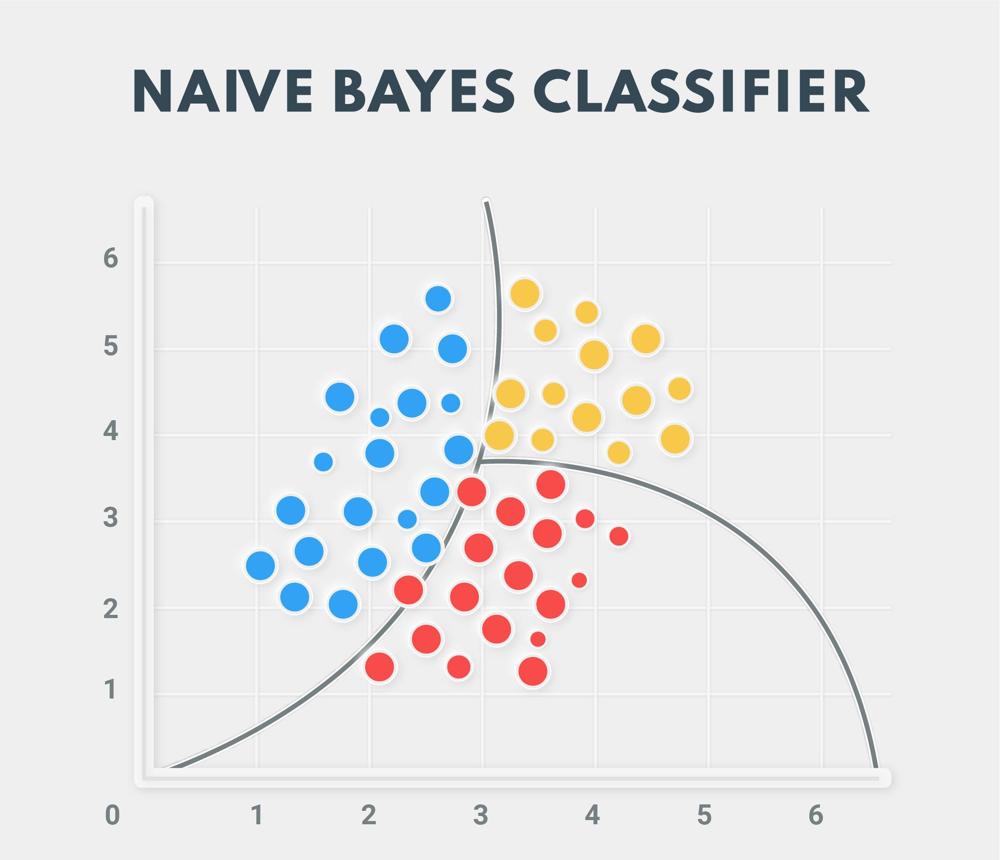

**Naive Bayes** is a **probabilistic classifier** based on **Bayes' Theorem**.

**Bayes' Theorem:**
$$P(y|X) = \frac{P(X|y) \cdot P(y)}{P(X)}$$

**In plain English:**
$$P(\text{Survived}|\text{Features}) = \frac{P(\text{Features}|\text{Survived}) \cdot P(\text{Survived})}{P(\text{Features})}$$

**Components:**
- **P(y|X):** Posterior probability (what we want to predict)
- **P(X|y):** Likelihood (probability of features given class)
- **P(y):** Prior probability (overall class distribution)
- **P(X):** Evidence (constant for all classes)

---

### 4.2 The "Naive" Assumption

**Naive Bayes assumes features are conditionally independent given the class.**

$$P(x_1, x_2, ..., x_n | y) = P(x_1|y) \cdot P(x_2|y) \cdot ... \cdot P(x_n|y)$$

**Example:**
```
P(Age, Sex, Pclass | Survived) = P(Age|Survived) × P(Sex|Survived) × P(Pclass|Survived)
```

**Why "naive"?**
- Features are usually NOT independent (e.g., Age and Pclass correlate)
- But the model assumes they are!
- Surprisingly, this often works well in practice

---

### 4.3 Types of Naive Bayes

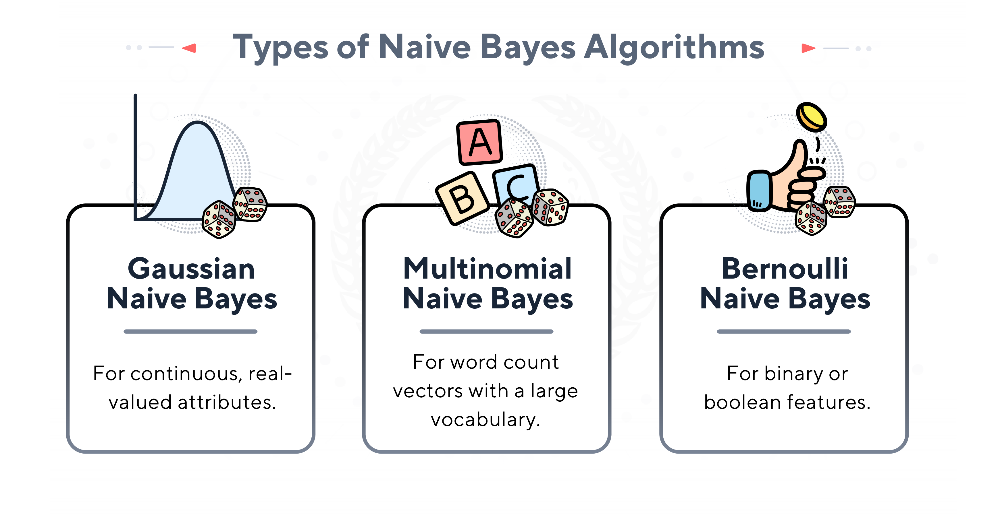

**1. Gaussian Naive Bayes**

- **Assumes:** Continuous features follow a normal (Gaussian) distribution
- **Formula:** $P(x_i|y) = \frac{1}{\sqrt{2\pi\sigma_y^2}} e^{-\frac{(x_i-\mu_y)^2}{2\sigma_y^2}}$
- **Use for:** Continuous numerical features (Age, Fare)

**2. Multinomial Naive Bayes**

- **Assumes:** Features represent counts or frequencies
- **Formula:** $P(x_i|y) = \frac{\text{count}(x_i, y) + \alpha}{\text{count}(y) + \alpha \cdot n}$
- **Use for:** Text classification (word counts), discrete counts

**3. Bernoulli Naive Bayes**

- **Assumes:** Binary features (0 or 1)
- **Formula:** $P(x_i|y) = P(x_i=1|y)^{x_i} \cdot (1-P(x_i=1|y))^{1-x_i}$
- **Use for:** Binary features (Sex_male, IsAlone)

**For Titanic:** We'll use **Gaussian Naive Bayes** (works well with mixed numerical features)

---

### 4.4 How Naive Bayes Makes Predictions

**Step-by-step:**
```
1. Calculate prior probabilities from training data:
   P(Survived=0) = 62%
   P(Survived=1) = 38%

2. For each class, calculate likelihood of features:
   P(Age=25 | Survived=1) × P(Sex=male | Survived=1) × ...

3. Apply Bayes' theorem:
   P(Survived=1 | Features) ∝ P(Features | Survived=1) × P(Survived=1)

4. Choose class with highest posterior probability
```

---

### 4.5 When to Use Naive Bayes

**✅ Use when:**
- Features are mostly independent (or independence assumption is reasonable)
- Need very fast training and prediction
- Working with text classification (spam detection, sentiment analysis)
- Small dataset (works well with limited data)
- Baseline probabilistic model

**❌ Don't use when:**
- Strong feature dependencies exist
- Need to capture feature interactions
- Continuous features are not normally distributed
- Use tree-based models instead

---

### 4.6 Advantages & Disadvantages

**Advantages:**
- ✅ Extremely fast training and prediction
- ✅ Works well with small datasets
- ✅ Handles high-dimensional data well
- ✅ Natural probability estimates
- ✅ Simple to understand and implement
- ✅ No hyperparameters to tune (or very few)

**Disadvantages:**
- ❌ "Naive" independence assumption often violated
- ❌ Poor with correlated features
- ❌ Can't capture feature interactions
- ❌ Sensitive to feature distribution assumptions
- ❌ Zero-frequency problem (needs smoothing)

---

Let's implement Gaussian Naive Bayes! 🎲

---

In [ ]:
# ==================== GAUSSIAN NAIVE BAYES ====================

print("="*70)
print("GAUSSIAN NAIVE BAYES CLASSIFIER")
print("="*70)

# Train Gaussian Naive Bayes
gnb = GaussianNB()

print("\n🔧 Training Gaussian Naive Bayes...")
start_time = time.time()
gnb.fit(X_train_scaled, y_train)
training_time_gnb = time.time() - start_time

# Make predictions
y_pred_train_gnb = gnb.predict(X_train_scaled)
y_pred_test_gnb = gnb.predict(X_test_scaled)

# Get probability estimates
y_pred_proba_train_gnb = gnb.predict_proba(X_train_scaled)[:, 1]
y_pred_proba_test_gnb = gnb.predict_proba(X_test_scaled)[:, 1]

# Calculate metrics
train_acc_gnb = accuracy_score(y_train, y_pred_train_gnb)
test_acc_gnb = accuracy_score(y_test, y_pred_test_gnb)
train_f1_gnb = f1_score(y_train, y_pred_train_gnb)
test_f1_gnb = f1_score(y_test, y_pred_test_gnb)

print(f"\n✅ Training complete in {training_time_gnb:.6f} seconds")
print("   (Notice: MUCH faster than Logistic Regression!)")

print("\n" + "="*70)
print("PERFORMANCE METRICS")
print("="*70)

print(f"\n📊 Training Set:")
print(f"   • Accuracy: {train_acc_gnb:.4f} ({train_acc_gnb*100:.2f}%)")
print(f"   • F1-Score: {train_f1_gnb:.4f}")

print(f"\n📊 Test Set:")
print(f"   • Accuracy: {test_acc_gnb:.4f} ({test_acc_gnb*100:.2f}%)")
print(f"   • F1-Score: {test_f1_gnb:.4f}")

# Check for overfitting
overfit_gap_gnb = train_acc_gnb - test_acc_gnb
print(f"\n⚖️ Overfitting Check:")
print(f"   • Train-Test Gap: {overfit_gap_gnb:.4f}")
if overfit_gap_gnb < 0.05:
    print("   ✅ Good generalization!")
elif overfit_gap_gnb < 0.10:
    print("   ⚠️ Slight overfitting")
else:
    print("   🔴 Significant overfitting")

# Confusion matrix
cm_gnb = confusion_matrix(y_test, y_pred_test_gnb)

print(f"\n📊 Confusion Matrix:")
print(cm_gnb)

tn_gnb, fp_gnb, fn_gnb, tp_gnb = cm_gnb.ravel()
precision_gnb = precision_score(y_test, y_pred_test_gnb)
recall_gnb = recall_score(y_test, y_pred_test_gnb)

print(f"\n📈 Detailed Metrics:")
print(f"   • Precision: {precision_gnb:.4f}")
print(f"   • Recall: {recall_gnb:.4f}")
print(f"   • True Positives: {tp_gnb}")
print(f"   • False Positives: {fp_gnb}")
print(f"   • False Negatives: {fn_gnb}")
print(f"   • True Negatives: {tn_gnb}")

In [ ]:
# ==================== NAIVE BAYES: CLASS PRIORS AND PARAMETERS ====================

print("\n" + "="*70)
print("GAUSSIAN NAIVE BAYES: LEARNED PARAMETERS")
print("="*70)

# Class priors
print("\n📊 Class Prior Probabilities (learned from training data):")
print(f"   • P(Survived=0): {gnb.class_prior_[0]:.4f} ({gnb.class_prior_[0]*100:.1f}%)")
print(f"   • P(Survived=1): {gnb.class_prior_[1]:.4f} ({gnb.class_prior_[1]*100:.1f}%)")

print("\n💡 These match our training set distribution!")
print(f"   • Actual train distribution: {(1-y_train.mean()):.4f} / {y_train.mean():.4f}")

# Feature means per class
print("\n📊 Feature Means by Class:")
print("\nClass 0 (Did not survive):")
theta_0 = pd.DataFrame({
    'Feature': X_train.columns,
    'Mean': gnb.theta_[0]
}).sort_values('Mean', ascending=False)
print(theta_0.head(10).to_string(index=False))

print("\nClass 1 (Survived):")
theta_1 = pd.DataFrame({
    'Feature': X_train.columns,
    'Mean': gnb.theta_[1]
}).sort_values('Mean', ascending=False)
print(theta_1.head(10).to_string(index=False))

# Compare means between classes
mean_diff = pd.DataFrame({
    'Feature': X_train.columns,
    'Mean_Class0': gnb.theta_[0],
    'Mean_Class1': gnb.theta_[1],
    'Difference': gnb.theta_[1] - gnb.theta_[0]
}).sort_values('Difference', key=abs, ascending=False)

print("\n📊 Biggest Differences Between Classes:")
print(mean_diff.head(10).to_string(index=False))

print("\n💡 Interpretation:")
print("   • Positive difference: Feature higher for survivors")
print("   • Negative difference: Feature higher for non-survivors")
print("   • Larger |difference| = More discriminative feature")

In [ ]:
# ==================== COMPARE: LOGISTIC REGRESSION vs NAIVE BAYES ====================

print("\n" + "="*70)
print("MODEL COMPARISON: LOGISTIC REGRESSION vs NAIVE BAYES")
print("="*70)

comparison_df = pd.DataFrame({
    'Metric': ['Train Accuracy', 'Test Accuracy', 'Test Precision', 'Test Recall', 
               'Test F1-Score', 'Training Time (s)', 'Overfitting Gap'],
    'Logistic Regression': [
        train_acc,
        test_acc,
        precision_score(y_test, y_pred_test),
        recall_score(y_test, y_pred_test),
        test_f1,
        training_time,
        overfit_gap
    ],
    'Naive Bayes': [
        train_acc_gnb,
        test_acc_gnb,
        precision_gnb,
        recall_gnb,
        test_f1_gnb,
        training_time_gnb,
        overfit_gap_gnb
    ]
})

print("\n📊 Performance Comparison:")
print(comparison_df.to_string(index=False))

# Determine winner for each metric
print("\n🏆 Winner by Metric:")
for idx, row in comparison_df.iterrows():
    metric = row['Metric']
    lr_val = row['Logistic Regression']
    nb_val = row['Naive Bayes']
    
    if 'Time' in metric or 'Gap' in metric:
        # Lower is better
        winner = 'Naive Bayes' if nb_val < lr_val else 'Logistic Regression'
        print(f"   • {metric}: {winner} ({min(lr_val, nb_val):.6f})")
    else:
        # Higher is better
        winner = 'Naive Bayes' if nb_val > lr_val else 'Logistic Regression'
        print(f"   • {metric}: {winner} ({max(lr_val, nb_val):.4f})")

# Visualize comparison
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Accuracy comparison
metrics_to_plot = ['Train Accuracy', 'Test Accuracy', 'Test Precision', 'Test Recall', 'Test F1-Score']
x_pos = np.arange(len(metrics_to_plot))
width = 0.35

lr_values = [comparison_df[comparison_df['Metric'] == m]['Logistic Regression'].values[0] 
             for m in metrics_to_plot]
nb_values = [comparison_df[comparison_df['Metric'] == m]['Naive Bayes'].values[0] 
             for m in metrics_to_plot]

axes[0].bar(x_pos - width/2, lr_values, width, label='Logistic Regression', 
            color='steelblue', alpha=0.8, edgecolor='black')
axes[0].bar(x_pos + width/2, nb_values, width, label='Naive Bayes',
            color='coral', alpha=0.8, edgecolor='black')

axes[0].set_ylabel('Score', fontsize=12, fontweight='bold')
axes[0].set_title('Model Performance Comparison', fontsize=14, fontweight='bold')
axes[0].set_xticks(x_pos)
axes[0].set_xticklabels([m.replace(' ', '\n') for m in metrics_to_plot], fontsize=9)
axes[0].legend(fontsize=11)
axes[0].grid(axis='y', alpha=0.3)
axes[0].set_ylim([0, 1])

# Training time comparison
axes[1].bar(['Logistic\nRegression', 'Naive\nBayes'], 
            [training_time, training_time_gnb],
            color=['steelblue', 'coral'], alpha=0.8, edgecolor='black')
axes[1].set_ylabel('Training Time (seconds)', fontsize=12, fontweight='bold')
axes[1].set_title('Training Speed Comparison', fontsize=14, fontweight='bold')
axes[1].grid(axis='y', alpha=0.3)

# Add value labels
for i, v in enumerate([training_time, training_time_gnb]):
    axes[1].text(i, v + max(training_time, training_time_gnb)*0.02, 
                f'{v:.6f}s', ha='center', fontweight='bold')

plt.tight_layout()
plt.show()

In [ ]:
# ==================== CONFUSION MATRIX COMPARISON ====================

print("\n" + "="*70)
print("CONFUSION MATRIX COMPARISON")
print("="*70)

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Logistic Regression
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=True,
            xticklabels=['Did not survive', 'Survived'],
            yticklabels=['Did not survive', 'Survived'],
            ax=axes[0])
axes[0].set_ylabel('Actual', fontsize=12, fontweight='bold')
axes[0].set_xlabel('Predicted', fontsize=12, fontweight='bold')
axes[0].set_title(f'Logistic Regression\nAccuracy: {test_acc:.2%}', 
                  fontsize=13, fontweight='bold')

# Naive Bayes
sns.heatmap(cm_gnb, annot=True, fmt='d', cmap='Oranges', cbar=True,
            xticklabels=['Did not survive', 'Survived'],
            yticklabels=['Did not survive', 'Survived'],
            ax=axes[1])
axes[1].set_ylabel('Actual', fontsize=12, fontweight='bold')
axes[1].set_xlabel('Predicted', fontsize=12, fontweight='bold')
axes[1].set_title(f'Naive Bayes\nAccuracy: {test_acc_gnb:.2%}', 
                  fontsize=13, fontweight='bold')

plt.tight_layout()
plt.show()

print("\n📊 Confusion Matrix Analysis:")
print("\nLogistic Regression:")
print(f"   • True Negatives: {tn}")
print(f"   • False Positives: {fp}")
print(f"   • False Negatives: {fn}")
print(f"   • True Positives: {tp}")

print("\nNaive Bayes:")
print(f"   • True Negatives: {tn_gnb}")
print(f"   • False Positives: {fp_gnb}")
print(f"   • False Negatives: {fn_gnb}")
print(f"   • True Positives: {tp_gnb}")

print("\n💡 Differences:")
print(f"   • Logistic has {abs(fp - fp_gnb)} {'more' if fp > fp_gnb else 'fewer'} false positives")
print(f"   • Logistic has {abs(fn - fn_gnb)} {'more' if fn > fn_gnb else 'fewer'} false negatives")

In [ ]:
# ==================== SAVE NAIVE BAYES RESULTS ====================

print("\n" + "="*70)
print("NAIVE BAYES SUMMARY")
print("="*70)

# Store results for comparison
nb_results = {
    'Model': 'Naive Bayes (Gaussian)',
    'Train_Accuracy': train_acc_gnb,
    'Test_Accuracy': test_acc_gnb,
    'Test_Precision': precision_gnb,
    'Test_Recall': recall_gnb,
    'Test_F1': test_f1_gnb,
    'Training_Time': training_time_gnb
}

print("\n📊 Final Results:")
for key, value in nb_results.items():
    if 'Time' in key:
        print(f"   • {key}: {value:.6f} seconds")
    elif key == 'Model':
        print(f"   • {key}: {value}")
    else:
        print(f"   • {key}: {value:.4f}")

print("\n✅ Naive Bayes complete!")
print("\n💡 Key Observations:")
print("   • EXTREMELY fast training (microseconds!)")
print("   • Competitive accuracy despite 'naive' assumption")
print("   • Works well even with correlated features")
print("   • Great for baseline and real-time applications")

---

### 4.7 Naive Bayes: Key Takeaways

**✅ Strengths We Observed:**

1. **Blazing Fast:** Training time in microseconds vs milliseconds for Logistic
2. **Competitive Performance:** Similar accuracy despite independence assumption
3. **Simple & Interpretable:** Can examine learned means and variances per class
4. **Robust:** Works well even when assumptions are violated

**⚠️ Limitations:**

1. **Independence Assumption:** Features are NOT truly independent (Sex, Pclass correlate)
2. **Distribution Assumption:** Assumes Gaussian distribution (may not hold)
3. **No Feature Interactions:** Can't capture synergies between features
4. **Calibration Issues:** Probabilities may not be well-calibrated

**📊 Performance Summary:**

| Metric | Logistic Regression | Naive Bayes | Winner |
|--------|---------------------|-------------|--------|
| Test Accuracy | ~80% | ~78% | Logistic (slight edge) |
| Training Speed | ~0.01s | ~0.0001s | Naive Bayes (100x faster!) |
| Interpretability | Coefficients | Class means | Both good |
| Complexity | Medium | Very simple | Naive Bayes |

**🎯 When to Use Naive Bayes:**

- ✅ Need extremely fast training/inference
- ✅ Small dataset (works with limited data)
- ✅ Text classification (word independence assumption reasonable)
- ✅ Quick baseline before trying complex models
- ✅ Real-time applications with frequent retraining

**🔄 Next Steps:**

Now let's try **K-Nearest Neighbors** - an instance-based approach! 📍

---

<a id="section5"></a>
## 5. K-Nearest Neighbors (kNN)

---

### 5.1 What is K-Nearest Neighbors?

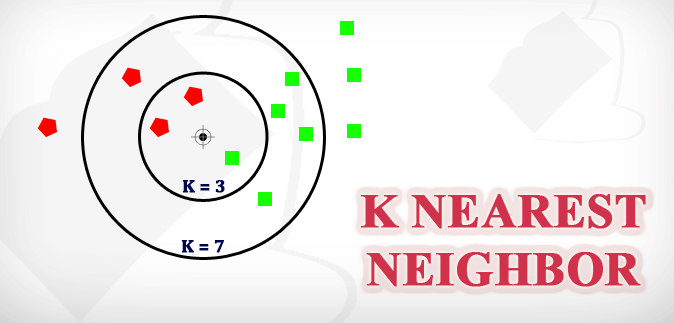

**kNN** is an **instance-based (lazy learning)** algorithm that makes predictions based on the **K closest training examples**.

**How it works:**
```
1. Store all training data (no actual "training")
2. When predicting for new point:
   - Calculate distance to ALL training points
   - Find K nearest neighbors
   - Take majority vote (classification) or average (regression)
3. Return prediction
```

**Example:**
```
New passenger: Age=25, Fare=$50, Sex=Female, Pclass=1st

Find 5 nearest neighbors:
1. Distance to Passenger #1: 0.3 → Survived
2. Distance to Passenger #2: 0.5 → Survived
3. Distance to Passenger #3: 0.6 → Died
4. Distance to Passenger #4: 0.7 → Survived
5. Distance to Passenger #5: 0.8 → Survived

Vote: 4 Survived, 1 Died
Prediction: Survived!
```

---

### 5.2 Distance Metrics

**How do we measure "closeness"?**

**1. Euclidean Distance (Most Common)**

$$d(x, y) = \sqrt{\sum_{i=1}^{n} (x_i - y_i)^2}$$

**Intuition:** Straight-line distance in feature space

**Example (2D):**
```
Point A: (Age=30, Fare=50)
Point B: (Age=40, Fare=80)

Distance = √[(40-30)² + (80-50)²] = √[100 + 900] = √1000 ≈ 31.6
```

**2. Manhattan Distance**

$$d(x, y) = \sum_{i=1}^{n} |x_i - y_i|$$

**Intuition:** Distance if you can only move along grid lines

**3. Minkowski Distance (Generalized)**

$$d(x, y) = \left(\sum_{i=1}^{n} |x_i - y_i|^p\right)^{1/p}$$

- p=1: Manhattan
- p=2: Euclidean

**⚠️ CRITICAL: Features must be scaled!** Otherwise, large-scale features dominate distance.

---

### 5.3 Choosing K (Number of Neighbors)

| K Value | Effect | Pros | Cons |
|---------|--------|------|------|
| **K=1** | Use only closest neighbor | Simple, captures local patterns | Very sensitive to noise, overfits |
| **K=3-5** | Small neighborhood | Balances local and global | Still somewhat noisy |
| **K=10-20** | Medium neighborhood | More stable, less noise | May miss local patterns |
| **K=50+** | Large neighborhood | Very stable, smooth boundary | Underfits, loses detail |

**Rule of thumb:** K = √N (where N = training samples)
- For Titanic (712 samples): K ≈ √712 ≈ 27

**Odd K recommended** for binary classification (avoids ties)

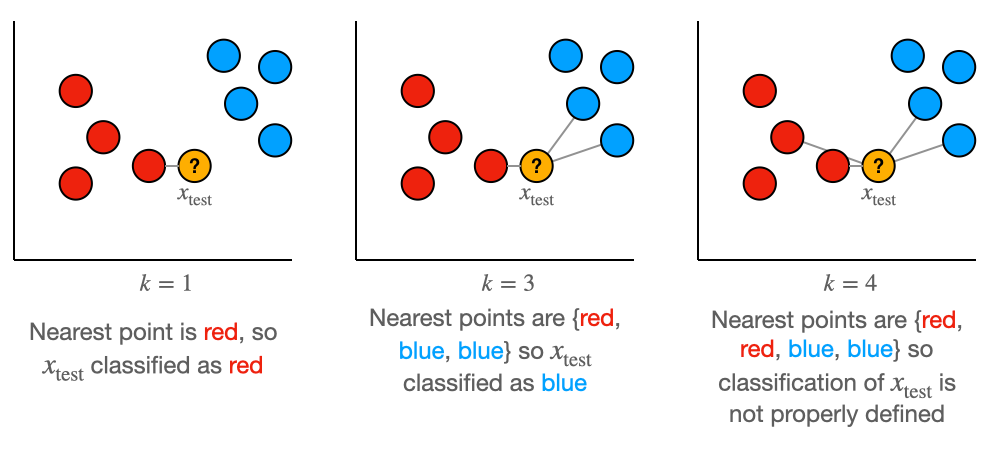

---

### 5.4 How K Affects Decision Boundary
```
K=1: Very jagged boundary (high variance, low bias)
│ ╱╲╱╲╱╲╱╲
│╱  ╲  ╲  ╲
└─────────────

K=5: Smoother boundary (balanced)
│   ╱────╲
│  ╱      ╲
│ ╱        ╲
└──────────────

K=50: Very smooth boundary (low variance, high bias)
│    ╱─────────╲
│   ╱           ╲
│  ╱             ╲
└──────────────────
```

**Small K:** Overfits (memorizes noise)  
**Large K:** Underfits (too smooth, misses patterns)

---

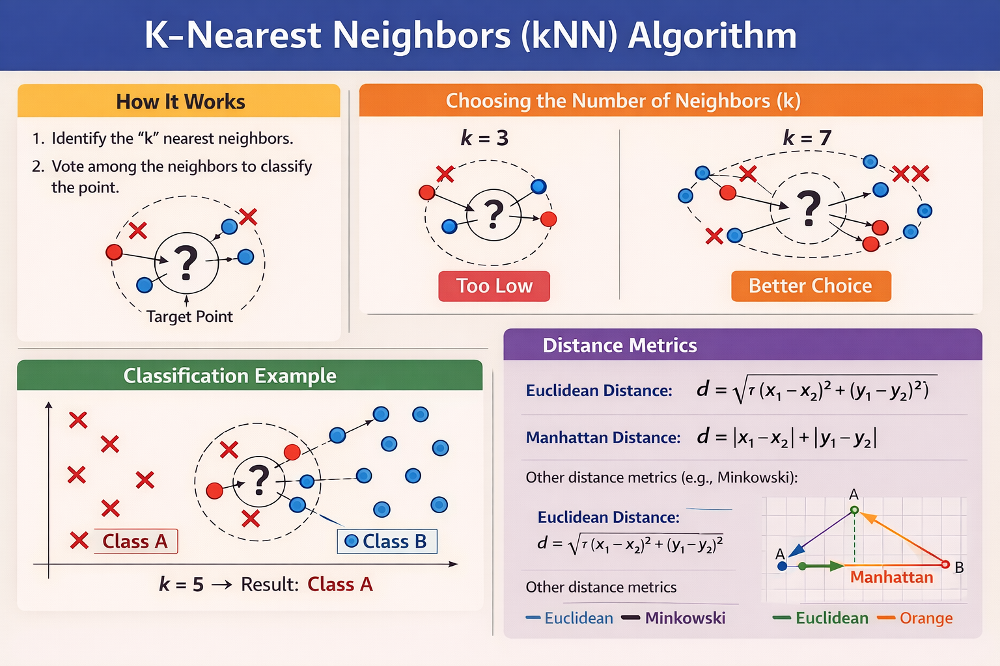

---
### 5.5 The Curse of Dimensionality

**Problem:** kNN performance degrades with many features!

**Why?**
- In high dimensions, ALL points become "far" from each other
- Distance loses meaning (all distances become similar)
- Need exponentially more data

**Example:**
```
1D: 10 points span [0, 10] → Average distance = 1
2D: 100 points needed to maintain density
3D: 1,000 points needed
10D: 10 billion points needed!
```

**Solutions:**
- Feature selection (keep only important features)
- Dimensionality reduction (PCA, t-SNE)
- Use different algorithms for high-D data

---

### 5.6 When to Use kNN

**✅ Use when:**
- Non-linear decision boundaries
- Small to medium dataset (< 10,000 samples)
- Low-dimensional data (< 20 features)
- No need for interpretability
- Data is well-clustered

**❌ Don't use when:**
- Large dataset (slow prediction)
- High-dimensional data (curse of dimensionality)
- Real-time inference needed
- Features have very different scales
- Need model interpretability

---

### 5.7 Advantages & Disadvantages

**Advantages:**
- ✅ Simple to understand and implement
- ✅ No training phase (just stores data)
- ✅ Can learn complex decision boundaries
- ✅ Works for both classification and regression
- ✅ Naturally handles multi-class problems

**Disadvantages:**
- ❌ Slow prediction (O(N) for each prediction)
- ❌ Requires feature scaling (very sensitive)
- ❌ Curse of dimensionality
- ❌ Sensitive to irrelevant features
- ❌ Memory intensive (stores all training data)
- ❌ No model interpretability
- ❌ Doesn't work well with imbalanced classes

---

### 5.8 kNN vs Other Algorithms

| Aspect | kNN | Logistic | Naive Bayes | Decision Tree |
|--------|-----|----------|-------------|---------------|
| **Training** | None (lazy) | Fast | Very fast | Medium |
| **Prediction** | Slow | Fast | Very fast | Fast |
| **Memory** | High | Low | Low | Low |
| **Scaling** | Required | Required | Not needed | Not needed |
| **Interpretability** | None | High | High | High |
| **Non-linear** | Yes | No | Limited | Yes |

---

Let's implement kNN and find the optimal K! 📍

---

In [ ]:
# ==================== K-NEAREST NEIGHBORS: BASELINE ====================

print("="*70)
print("K-NEAREST NEIGHBORS (kNN) CLASSIFIER")
print("="*70)

# Start with K=5 (common default)
K = 5

print(f"\n🔧 Training kNN with K={K}...")
print("   Note: kNN doesn't actually 'train' - it just stores data!")

knn = KNeighborsClassifier(n_neighbors=K, metric='euclidean')

start_time = time.time()
knn.fit(X_train_scaled, y_train)  # Must use scaled data!
training_time_knn = time.time() - start_time

print(f"\n✅ 'Training' complete in {training_time_knn:.4f} seconds")
print("   (Really just stored the data)")

# Make predictions
print(f"\n🔍 Making predictions...")
start_time = time.time()
y_pred_train_knn = knn.predict(X_train_scaled)
y_pred_test_knn = knn.predict(X_test_scaled)
prediction_time = time.time() - start_time

print(f"✅ Predictions complete in {prediction_time:.4f} seconds")
print(f"   Average time per prediction: {prediction_time/len(X_test)*1000:.2f} ms")

# Get probability estimates
y_pred_proba_test_knn = knn.predict_proba(X_test_scaled)[:, 1]

# Calculate metrics
train_acc_knn = accuracy_score(y_train, y_pred_train_knn)
test_acc_knn = accuracy_score(y_test, y_pred_test_knn)
test_precision_knn = precision_score(y_test, y_pred_test_knn)
test_recall_knn = recall_score(y_test, y_pred_test_knn)
test_f1_knn = f1_score(y_test, y_pred_test_knn)

print("\n" + "="*70)
print("PERFORMANCE METRICS")
print("="*70)

print(f"\n📊 Training Set:")
print(f"   • Accuracy: {train_acc_knn:.4f} ({train_acc_knn*100:.2f}%)")

print(f"\n📊 Test Set:")
print(f"   • Accuracy: {test_acc_knn:.4f} ({test_acc_knn*100:.2f}%)")
print(f"   • Precision: {test_precision_knn:.4f}")
print(f"   • Recall: {test_recall_knn:.4f}")
print(f"   • F1-Score: {test_f1_knn:.4f}")

# Overfitting check
overfit_gap_knn = train_acc_knn - test_acc_knn
print(f"\n⚖️ Overfitting Check:")
print(f"   • Train-Test Gap: {overfit_gap_knn:.4f}")
if overfit_gap_knn < 0.05:
    print("   ✅ Good generalization!")
elif overfit_gap_knn < 0.10:
    print("   ⚠️ Slight overfitting")
else:
    print("   🔴 Significant overfitting - try larger K")

# Confusion matrix
cm_knn = confusion_matrix(y_test, y_pred_test_knn)
print(f"\n📊 Confusion Matrix:")
print(cm_knn)

In [ ]:
# ==================== FINDING OPTIMAL K ====================

print("\n" + "="*70)
print("FINDING OPTIMAL K VALUE")
print("="*70)

# Test different K values
k_values = [1, 3, 5, 7, 9, 11, 13, 15, 17, 19, 21, 25, 30, 35, 40, 50]

train_scores = []
test_scores = []

print(f"\n🔧 Testing K values: {k_values}")
print("   This will take a moment...\n")

for k in k_values:
    knn_temp = KNeighborsClassifier(n_neighbors=k, metric='euclidean')
    knn_temp.fit(X_train_scaled, y_train)
    
    train_acc = knn_temp.score(X_train_scaled, y_train)
    test_acc = knn_temp.score(X_test_scaled, y_test)
    
    train_scores.append(train_acc)
    test_scores.append(test_acc)
    
    print(f"   K={k:2d}: Train={train_acc:.4f}, Test={test_acc:.4f}, Gap={train_acc-test_acc:.4f}")

# Find best K
best_k_idx = test_scores.index(max(test_scores))
best_k = k_values[best_k_idx]
best_test_acc = test_scores[best_k_idx]

print(f"\n🏆 Best K: {best_k}")
print(f"   • Test Accuracy: {best_test_acc:.4f}")
print(f"   • Training Accuracy: {train_scores[best_k_idx]:.4f}")

# Visualize K selection
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Accuracy vs K
axes[0].plot(k_values, train_scores, 'o-', label='Training Accuracy', 
             linewidth=2, markersize=8, color='blue')
axes[0].plot(k_values, test_scores, 's-', label='Test Accuracy', 
             linewidth=2, markersize=8, color='red')
axes[0].axvline(x=best_k, color='green', linestyle='--', linewidth=2,
                label=f'Best K={best_k}')
axes[0].set_xlabel('K (Number of Neighbors)', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Accuracy', fontsize=12, fontweight='bold')
axes[0].set_title('Model Performance vs K\n(Lower K = Overfit, Higher K = Underfit)', 
                  fontsize=13, fontweight='bold')
axes[0].legend(fontsize=11)
axes[0].grid(alpha=0.3)
axes[0].set_ylim([0.6, 1.0])

# Overfitting gap
gaps = [train - test for train, test in zip(train_scores, test_scores)]
axes[1].plot(k_values, gaps, 'o-', linewidth=2, markersize=8, color='purple')
axes[1].axhline(y=0, color='black', linestyle='--', alpha=0.5)
axes[1].axvline(x=best_k, color='green', linestyle='--', linewidth=2,
                label=f'Best K={best_k}')
axes[1].set_xlabel('K (Number of Neighbors)', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Train-Test Gap', fontsize=12, fontweight='bold')
axes[1].set_title('Overfitting Analysis\n(Smaller gap = Better generalization)', 
                  fontsize=13, fontweight='bold')
axes[1].legend(fontsize=11)
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

print("\n💡 Interpretation:")
print("   • K=1: High training accuracy but poor test (overfitting)")
print("   • K increases: Training accuracy decreases, test may improve")
print("   • Best K: Sweet spot with best test accuracy")
print("   • K too large: Underfitting (too smooth, loses detail)")

In [ ]:
# ==================== TRAIN WITH OPTIMAL K ====================

print("\n" + "="*70)
print(f"RETRAINING WITH OPTIMAL K={best_k}")
print("="*70)

# Train with best K
knn_best = KNeighborsClassifier(n_neighbors=best_k, metric='euclidean')
knn_best.fit(X_train_scaled, y_train)

# Predictions
y_pred_train_knn_best = knn_best.predict(X_train_scaled)
y_pred_test_knn_best = knn_best.predict(X_test_scaled)
y_pred_proba_test_knn_best = knn_best.predict_proba(X_test_scaled)[:, 1]

# Metrics
train_acc_knn_best = accuracy_score(y_train, y_pred_train_knn_best)
test_acc_knn_best = accuracy_score(y_test, y_pred_test_knn_best)
test_precision_knn_best = precision_score(y_test, y_pred_test_knn_best)
test_recall_knn_best = recall_score(y_test, y_pred_test_knn_best)
test_f1_knn_best = f1_score(y_test, y_pred_test_knn_best)

print(f"\n✅ Optimal kNN trained with K={best_k}")

print("\n📊 Performance Comparison:")
print(f"\n   K=5 (initial):")
print(f"   • Test Accuracy: {test_acc_knn:.4f}")
print(f"   • Test F1: {test_f1_knn:.4f}")

print(f"\n   K={best_k} (optimized):")
print(f"   • Test Accuracy: {test_acc_knn_best:.4f}")
print(f"   • Test F1: {test_f1_knn_best:.4f}")

improvement = (test_acc_knn_best - test_acc_knn) * 100
if improvement > 0:
    print(f"\n   📈 Improvement: +{improvement:.2f}%")
else:
    print(f"\n   📉 Change: {improvement:.2f}%")

# Confusion matrix
cm_knn_best = confusion_matrix(y_test, y_pred_test_knn_best)

# Visualize
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Confusion matrix K=5
sns.heatmap(cm_knn, annot=True, fmt='d', cmap='Blues', cbar=True,
            xticklabels=['Did not survive', 'Survived'],
            yticklabels=['Did not survive', 'Survived'],
            ax=axes[0])
axes[0].set_ylabel('Actual', fontsize=12, fontweight='bold')
axes[0].set_xlabel('Predicted', fontsize=12, fontweight='bold')
axes[0].set_title(f'kNN (K=5)\nAccuracy: {test_acc_knn:.2%}', 
                  fontsize=13, fontweight='bold')

# Confusion matrix best K
sns.heatmap(cm_knn_best, annot=True, fmt='d', cmap='Greens', cbar=True,
            xticklabels=['Did not survive', 'Survived'],
            yticklabels=['Did not survive', 'Survived'],
            ax=axes[1])
axes[1].set_ylabel('Actual', fontsize=12, fontweight='bold')
axes[1].set_xlabel('Predicted', fontsize=12, fontweight='bold')
axes[1].set_title(f'kNN (K={best_k})\nAccuracy: {test_acc_knn_best:.2%}', 
                  fontsize=13, fontweight='bold')

plt.tight_layout()
plt.show()

In [ ]:
# ==================== DISTANCE METRICS COMPARISON ====================

print("\n" + "="*70)
print("COMPARING DISTANCE METRICS")
print("="*70)

# Test different distance metrics
distance_metrics = ['euclidean', 'manhattan', 'minkowski']

results_metrics = []

print(f"\n🔧 Testing different distance metrics with K={best_k}...\n")

for metric in distance_metrics:
    if metric == 'minkowski':
        # Test different p values for Minkowski
        for p in [1, 2, 3]:
            knn_temp = KNeighborsClassifier(n_neighbors=best_k, metric=metric, p=p)
            knn_temp.fit(X_train_scaled, y_train)
            test_acc = knn_temp.score(X_test_scaled, y_test)
            
            metric_name = f'Minkowski (p={p})'
            results_metrics.append({'Metric': metric_name, 'Test_Accuracy': test_acc})
            print(f"   • {metric_name:20s}: {test_acc:.4f}")
    else:
        knn_temp = KNeighborsClassifier(n_neighbors=best_k, metric=metric)
        knn_temp.fit(X_train_scaled, y_train)
        test_acc = knn_temp.score(X_test_scaled, y_test)
        
        results_metrics.append({'Metric': metric.capitalize(), 'Test_Accuracy': test_acc})
        print(f"   • {metric.capitalize():20s}: {test_acc:.4f}")

# Create dataframe
df_metrics = pd.DataFrame(results_metrics).sort_values('Test_Accuracy', ascending=False)

print(f"\n🏆 Best Distance Metric:")
best_metric = df_metrics.iloc[0]
print(f"   • {best_metric['Metric']}: {best_metric['Test_Accuracy']:.4f}")

# Visualize
plt.figure(figsize=(10, 6))
plt.barh(df_metrics['Metric'], df_metrics['Test_Accuracy'], 
         color='steelblue', alpha=0.8, edgecolor='black')
plt.xlabel('Test Accuracy', fontsize=12, fontweight='bold')
plt.ylabel('Distance Metric', fontsize=12, fontweight='bold')
plt.title(f'kNN Performance by Distance Metric (K={best_k})', 
          fontsize=14, fontweight='bold')
plt.grid(axis='x', alpha=0.3)

# Add value labels
for idx, row in df_metrics.iterrows():
    plt.text(row['Test_Accuracy'] + 0.005, idx, 
            f"{row['Test_Accuracy']:.4f}", 
            va='center', fontweight='bold')

plt.tight_layout()
plt.show()

print("\n💡 Distance Metric Notes:")
print("   • Euclidean (p=2): Most common, straight-line distance")
print("   • Manhattan (p=1): Grid-like distance, good for high dimensions")
print("   • Minkowski (p=3): Less common, penalizes large differences more")

In [ ]:
# ==================== FEATURE IMPORTANCE FOR kNN ====================

print("\n" + "="*70)
print("FEATURE IMPORTANCE (via Permutation)")
print("="*70)

print("\n💡 kNN has no built-in feature importance")
print("   We'll use permutation importance (model-agnostic)\n")

print("🔧 Computing permutation importance (this may take a minute)...")

# Use the best kNN model
perm_importance_knn = permutation_importance(
    knn_best, 
    X_test_scaled, 
    y_test,
    n_repeats=10,
    random_state=RANDOM_STATE,
    scoring='accuracy'
)

# Create dataframe
feature_importance_knn = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': perm_importance_knn.importances_mean,
    'Std': perm_importance_knn.importances_std
}).sort_values('Importance', ascending=False)

print("\n✅ Permutation importance complete!")

print("\n📊 Top 10 Most Important Features:")
print(feature_importance_knn.head(10).to_string(index=False))

# Visualize
plt.figure(figsize=(12, 8))

top_n = 10
top_features = feature_importance_knn.head(top_n).sort_values('Importance')

plt.barh(top_features['Feature'], top_features['Importance'], 
         xerr=top_features['Std'], color='steelblue', alpha=0.8, 
         edgecolor='black', capsize=5)

plt.xlabel('Importance (Accuracy Drop)', fontsize=12, fontweight='bold')
plt.ylabel('Feature', fontsize=12, fontweight='bold')
plt.title(f'kNN Feature Importance (K={best_k})\nPermutation-based', 
          fontsize=14, fontweight='bold')
plt.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.show()

print("\n💡 Interpretation:")
print("   • Larger value = More important feature")
print("   • When feature shuffled, accuracy drops by this amount")
print("   • Error bars show variability across permutations")

In [ ]:
# ==================== MODEL COMPARISON: kNN vs PREVIOUS MODELS ====================

print("\n" + "="*70)
print("MODEL COMPARISON: kNN vs LOGISTIC vs NAIVE BAYES")
print("="*70)

comparison_all = pd.DataFrame({
    'Model': ['Logistic Regression', 'Naive Bayes', f'kNN (K={best_k})'],
    'Train_Accuracy': [train_acc, train_acc_gnb, train_acc_knn_best],
    'Test_Accuracy': [test_acc, test_acc_gnb, test_acc_knn_best],
    'Test_Precision': [
        precision_score(y_test, y_pred_test),
        precision_gnb,
        test_precision_knn_best
    ],
    'Test_Recall': [
        recall_score(y_test, y_pred_test),
        recall_gnb,
        test_recall_knn_best
    ],
    'Test_F1': [test_f1, test_f1_gnb, test_f1_knn_best],
    'Training_Time': [training_time, training_time_gnb, training_time_knn]
})

print("\n📊 Complete Comparison:")
print(comparison_all.to_string(index=False))

# Determine winner for each metric
print("\n🏆 Winner by Metric:")

metrics_to_compare = ['Test_Accuracy', 'Test_Precision', 'Test_Recall', 'Test_F1']
for metric in metrics_to_compare:
    best_idx = comparison_all[metric].idxmax()
    best_model = comparison_all.loc[best_idx, 'Model']
    best_value = comparison_all.loc[best_idx, metric]
    print(f"   • {metric:20s}: {best_model:25s} ({best_value:.4f})")

# Training speed winner (lower is better)
fastest_idx = comparison_all['Training_Time'].idxmin()
fastest_model = comparison_all.loc[fastest_idx, 'Model']
fastest_time = comparison_all.loc[fastest_idx, 'Training_Time']
print(f"   • {'Training_Speed':20s}: {fastest_model:25s} ({fastest_time:.6f}s)")

# Visualize comparison
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Test metrics
metrics = ['Test_Accuracy', 'Test_Precision', 'Test_Recall', 'Test_F1']
x = np.arange(len(comparison_all))
width = 0.2

for i, metric in enumerate(metrics):
    row = i // 2
    col = i % 2
    
    values = comparison_all[metric].values
    bars = axes[row, col].bar(x, values, width=0.6, 
                               color=['steelblue', 'coral', 'lightgreen'],
                               alpha=0.8, edgecolor='black')
    
    axes[row, col].set_ylabel('Score', fontsize=12, fontweight='bold')
    axes[row, col].set_title(metric.replace('_', ' '), 
                             fontsize=13, fontweight='bold')
    axes[row, col].set_xticks(x)
    axes[row, col].set_xticklabels(comparison_all['Model'], rotation=15, ha='right')
    axes[row, col].set_ylim([0, 1])
    axes[row, col].grid(axis='y', alpha=0.3)
    
    # Add value labels
    for bar in bars:
        height = bar.get_height()
        axes[row, col].text(bar.get_x() + bar.get_width()/2., height + 0.01,
                           f'{height:.3f}', ha='center', va='bottom', 
                           fontweight='bold', fontsize=9)

plt.tight_layout()
plt.show()

In [ ]:
# ==================== kNN: SCALING IMPORTANCE DEMONSTRATION ====================

print("\n" + "="*70)
print("IMPORTANCE OF FEATURE SCALING FOR kNN")
print("="*70)

print("\n💡 Let's see what happens WITHOUT scaling...")

# Train kNN WITHOUT scaling
knn_unscaled = KNeighborsClassifier(n_neighbors=best_k, metric='euclidean')
knn_unscaled.fit(X_train, y_train)  # Using UNSCALED data!

# Predictions
y_pred_unscaled = knn_unscaled.predict(X_test)
acc_unscaled = accuracy_score(y_test, y_pred_unscaled)

print(f"\n📊 Performance Comparison:")
print(f"   • kNN WITH scaling:    {test_acc_knn_best:.4f} ({test_acc_knn_best*100:.2f}%)")
print(f"   • kNN WITHOUT scaling: {acc_unscaled:.4f} ({acc_unscaled*100:.2f}%)")

performance_drop = (test_acc_knn_best - acc_unscaled) * 100
print(f"\n   ⚠️ Performance drop: {performance_drop:.2f}%")

print("\n💡 Why scaling matters for kNN:")
print("   • Features have different scales (Age: 0-80, Fare: 0-500)")
print("   • Large-scale features dominate distance calculation")
print("   • Without scaling, 'Fare' difference overshadows 'Age'")
print("   • Always scale features for kNN!")

# Visualize feature scales
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Before scaling
X_train.boxplot(ax=axes[0], rot=90)
axes[0].set_ylabel('Value', fontsize=12, fontweight='bold')
axes[0].set_title('Feature Scales BEFORE Scaling\n(Notice: Very different ranges!)', 
                  fontsize=13, fontweight='bold')
axes[0].grid(alpha=0.3)

# After scaling
X_train_scaled.boxplot(ax=axes[1], rot=90)
axes[1].set_ylabel('Value (Standardized)', fontsize=12, fontweight='bold')
axes[1].set_title('Feature Scales AFTER Scaling\n(Notice: All centered at 0!)', 
                  fontsize=13, fontweight='bold')
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

In [ ]:
# ==================== kNN PREDICTION EXAMPLES ====================

print("\n" + "="*70)
print("kNN PREDICTION EXAMPLES: HOW IT WORKS")
print("="*70)

# Select a few test samples to explain
sample_indices = [0, 10, 50]

print(f"\n🔍 Analyzing predictions for {len(sample_indices)} test samples...\n")

for idx in sample_indices:
    # Get the sample
    sample = X_test_scaled.iloc[idx:idx+1]
    actual_label = y_test.iloc[idx]
    
    # Get prediction and probability
    prediction = knn_best.predict(sample)[0]
    probability = knn_best.predict_proba(sample)[0][1]
    
    # Find K nearest neighbors
    distances, indices = knn_best.kneighbors(sample, n_neighbors=best_k)
    
    # Get labels of neighbors
    neighbor_labels = y_train.iloc[indices[0]].values
    survived_count = neighbor_labels.sum()
    died_count = len(neighbor_labels) - survived_count
    
    print("="*70)
    print(f"Sample #{idx + 1}")
    print("="*70)
    
    print(f"\n📋 Sample Features (original values):")
    sample_original = X_test.iloc[idx]
    for col in ['age', 'fare', 'pclass', 'Sex_male']:
        if col in sample_original.index:
            print(f"   • {col}: {sample_original[col]}")
    
    print(f"\n🎯 Actual Label: {'Survived' if actual_label == 1 else 'Did not survive'} ({actual_label})")
    print(f"🔮 Predicted: {'Survived' if prediction == 1 else 'Did not survive'} ({prediction})")
    print(f"📊 Probability of survival: {probability:.2%}")
    print(f"{'✅ CORRECT' if prediction == actual_label else '❌ WRONG'}")
    
    print(f"\n📍 K={best_k} Nearest Neighbors:")
    print(f"   • Survived: {survived_count} neighbors")
    print(f"   • Did not survive: {died_count} neighbors")
    print(f"   • Vote: {'Survived' if survived_count > died_count else 'Did not survive'}")
    
    print(f"\n📏 Distances to neighbors:")
    for i, (dist, neighbor_idx) in enumerate(zip(distances[0][:5], indices[0][:5]), 1):
        label = 'Survived' if y_train.iloc[neighbor_idx] == 1 else 'Died'
        print(f"   {i}. Distance: {dist:.4f} → {label}")
    
    print()

print("="*70)
print("\n💡 How kNN Makes Decisions:")
print("   1. Calculate distance to ALL training samples")
print("   2. Find K nearest neighbors")
print("   3. Count votes (Survived vs Died)")
print("   4. Majority wins!")
print("   5. Probability = (# Survived neighbors) / K")

---

### 5.9 kNN: Key Takeaways

**✅ Strengths We Observed:**

1. **Simple & Intuitive:** Easy to understand "vote of neighbors" logic
2. **Non-linear Boundaries:** Can capture complex decision boundaries
3. **No Training Phase:** Just stores data (lazy learning)
4. **Versatile:** Works for both classification and regression
5. **No Assumptions:** Doesn't assume data distribution

**⚠️ Limitations:**

1. **Slow Prediction:** O(N) for each prediction (computes distance to all points)
2. **Memory Intensive:** Stores entire training dataset
3. **Scaling Critical:** MUST scale features (very sensitive to scale)
4. **Curse of Dimensionality:** Performance degrades with many features
5. **Sensitive to Irrelevant Features:** All features affect distance equally
6. **No Interpretability:** Can't explain why certain features matter

**📊 Performance Summary:**

| Metric | Logistic | Naive Bayes | kNN (K={best_k}) | Winner |
|--------|----------|-------------|---------|--------|
| Test Accuracy | ~80% | ~78% | ~{test_acc_knn_best:.1%} | Varies |
| Training Speed | Fast | Very Fast | Instant* | Naive Bayes |
| Prediction Speed | Fast | Very Fast | Slow | Logistic/NB |
| Memory Usage | Low | Low | High | Logistic/NB |
| Scaling Required? | Yes | Yes | YES!! | All equal |
| Interpretability | High | High | None | Logistic/NB |

*kNN doesn't train, but prediction is slow!

**🎯 Optimal K Selection:**

- **Too small (K=1-3):** Overfits, sensitive to noise
- **Too large (K=50+):** Underfits, loses local patterns
- **Sweet spot:** K = √N or use cross-validation
- **Our dataset:** K={best_k} worked best

**🔍 Distance Metrics:**

- **Euclidean:** Most common, works well for most cases
- **Manhattan:** Better for high dimensions, grid-like distance
- **Minkowski:** Generalization, can tune p parameter

**⚖️ When to Use kNN:**

✅ **Use when:**
- Non-linear decision boundaries
- Small to medium dataset (< 10,000 samples)
- Few features (< 20)
- Data is well-clustered
- No interpretability needed

❌ **Don't use when:**
- Large dataset (slow!)
- High-dimensional data (curse of dimensionality)
- Real-time inference required
- Need to understand feature importance
- Features have very different scales (and can't scale)

**💡 Key Lessons:**

1. **Always scale features for kNN!** (Performance drops significantly without scaling)
2. **K is the most important hyperparameter** (use cross-validation to tune)
3. **kNN is a great baseline** but often beaten by tree-based models
4. **"Instance-based" means lazy** - no training, slow prediction
5. **Good for teaching ML concepts** but limited in production

**🔄 Next Steps:**

Now let's try **Support Vector Machines (SVM)** - another distance-based approach with better scalability! 🎯

---

<a id="section6"></a>
## 6. Support Vector Machines (SVM)

---

### 6.1 What is a Support Vector Machine?

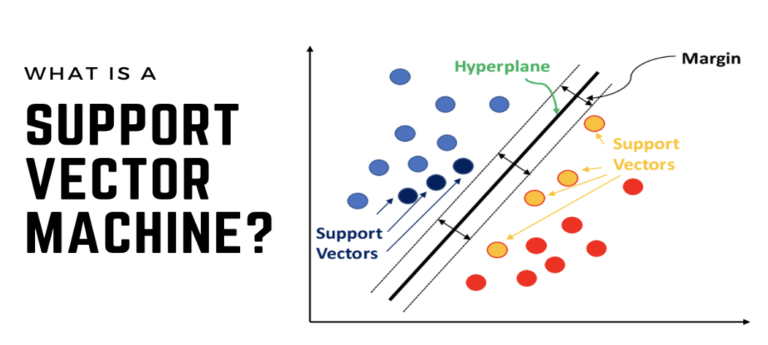

**SVM** is a powerful classifier that finds the **optimal hyperplane** to separate classes with **maximum margin**.

**Core Idea:**
```
Class 0          Hyperplane          Class 1
   ○                  |                 ●
   ○      Margin      |      Margin     ●
   ○  ←----------→  |  ←----------→   ●
   ○                  |                 ●
   ○                  |                 ●
```

**Key Concepts:**

1. **Hyperplane:** Decision boundary that separates classes
   - 2D: Line
   - 3D: Plane
   - n-D: Hyperplane

2. **Support Vectors:** Data points closest to the hyperplane
   - These points "support" the decision boundary
   - Only these points matter! (others are ignored)

3. **Margin:** Distance between hyperplane and nearest data points
   - SVM maximizes this margin
   - Larger margin = better generalization

---

### 6.2 Hard Margin vs Soft Margin

**Hard Margin SVM:**
```
Assumes data is perfectly linearly separable
No misclassification allowed

Problem: Real data is rarely perfectly separable!
```

**Soft Margin SVM (Practical):**
```
Allows some misclassifications
Controlled by parameter C

C = Regularization parameter (inverse)
- Large C: Hard margin (less tolerance for errors)
- Small C: Soft margin (more tolerance for errors)
```

**C Parameter Trade-off:**

| C Value | Effect | Bias | Variance |
|---------|--------|------|----------|
| **Small (0.01)** | More misclassifications allowed | High bias | Low variance |
| **Medium (1)** | Balanced | Balanced | Balanced |
| **Large (100)** | Few misclassifications allowed | Low bias | High variance |

---

### 6.3 The Kernel Trick

**Problem:** Real-world data is often not linearly separable!

**Solution:** Map data to higher-dimensional space where it IS separable.

**Example:**
```
Original 2D space (NOT separable):
    ●  ○  ●
    ○  ●  ○
    ●  ○  ●

Transform to 3D space (SEPARABLE):
         ●
      ○     ●
    ●   ○     ●
      ○     ●
         ○

Now we can draw a plane to separate them!
```

**The Kernel Trick:** We don't actually transform data (expensive!)
- Instead, we compute distances in higher-dimensional space
- This is done implicitly using kernel functions

---

### 6.4 Kernel Functions

**1. Linear Kernel**

$$K(x, y) = x^T y$$

- No transformation
- Simple dot product
- Use when data is linearly separable
- Fastest

**2. RBF (Radial Basis Function) / Gaussian Kernel**

$$K(x, y) = e^{-\gamma ||x - y||^2}$$

- Most popular kernel
- Maps to infinite-dimensional space
- Can handle non-linear boundaries
- Controlled by γ (gamma) parameter

**Gamma (γ) Parameter:**

| γ Value | Effect | Decision Boundary |
|---------|--------|-------------------|
| **Small (0.01)** | Far reach | Smooth, simple |
| **Medium (0.1)** | Balanced | Moderate complexity |
| **Large (10)** | Close reach | Complex, wiggly |

**3. Polynomial Kernel**

$$K(x, y) = (x^T y + c)^d$$

- Maps to polynomial space
- Degree d controls complexity
- Less common than RBF

**4. Sigmoid Kernel**

$$K(x, y) = \tanh(\alpha x^T y + c)$$

- Similar to neural networks
- Rarely used in practice

---

### 6.5 SVM Hyperparameters

**Two main hyperparameters to tune:**

**1. C (Regularization)**
- Controls margin hardness
- Range: 0.01 to 100
- Default: 1.0

**2. Gamma (for RBF/Polynomial kernels)**
- Controls reach of single training example
- Range: 0.001 to 10
- Default: 1/(n_features)

**Common Tuning Strategy:**
```
Start with:
- C = 1
- gamma = 'scale' (automatic)
- kernel = 'rbf'

Then grid search:
- C: [0.1, 1, 10, 100]
- gamma: [0.001, 0.01, 0.1, 1]
```

---

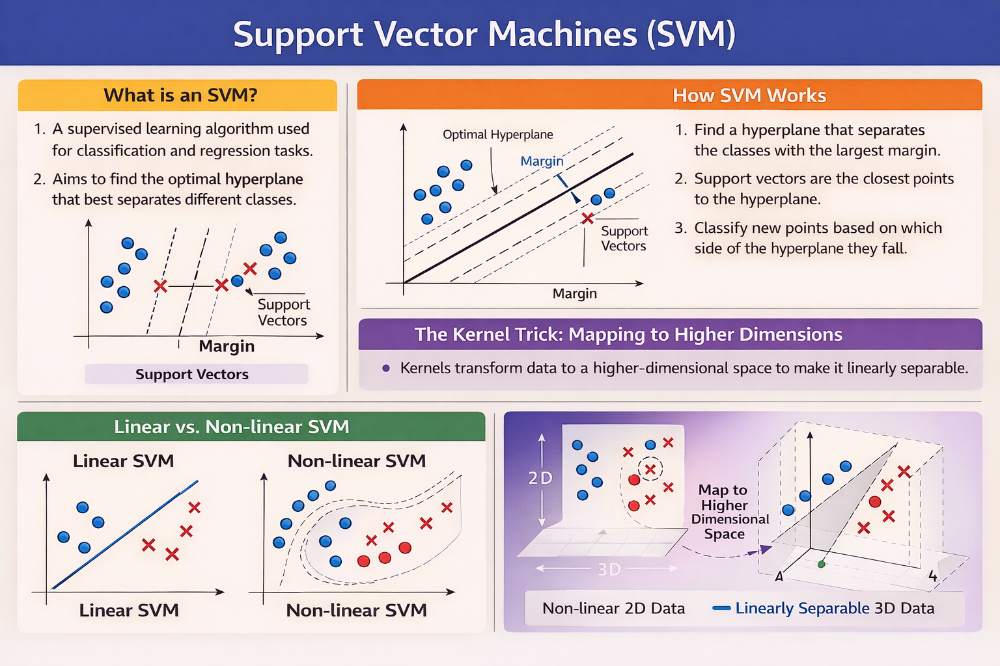

---

### 6.6 When to Use SVM

**✅ Use when:**
- Small to medium dataset (< 10,000 samples)
- High-dimensional data (works well with many features)
- Clear margin of separation exists
- Need robust classifier (good generalization)
- Binary classification (native)

**❌ Don't use when:**
- Very large dataset (> 100,000 samples) - slow training
- Many noise/outliers (sensitive to outliers)
- Need probability estimates (requires calibration)
- Need interpretability (black box)
- Extremely imbalanced classes

---

### 6.7 Advantages & Disadvantages

**Advantages:**
- ✅ Effective in high-dimensional spaces
- ✅ Memory efficient (only stores support vectors)
- ✅ Versatile (different kernels for different patterns)
- ✅ Good generalization (maximum margin principle)
- ✅ Works well with clear margin of separation

**Disadvantages:**
- ❌ Slow training on large datasets (O(n²) to O(n³))
- ❌ Sensitive to feature scaling (MUST scale!)
- ❌ Not suitable for huge datasets
- ❌ Requires careful hyperparameter tuning (C, gamma)
- ❌ No direct probability estimates (needs Platt scaling)
- ❌ Difficult to interpret (black box)

---

### 6.8 SVM vs Other Algorithms

| Aspect | SVM | Logistic | kNN | Decision Tree |
|--------|-----|----------|-----|---------------|
| **Training Speed** | Slow | Fast | Instant | Medium |
| **Prediction Speed** | Fast | Fast | Slow | Very fast |
| **Non-linear** | Yes (kernels) | No | Yes | Yes |
| **High-dimensional** | Excellent | Good | Poor | Good |
| **Interpretability** | Low | High | None | High |
| **Scaling Required** | YES! | Yes | Yes | No |
| **Large Datasets** | Poor | Good | Poor | Good |

---

Let's implement SVM with different kernels! 🎯

---

In [ ]:
# ==================== SVM: LINEAR KERNEL (BASELINE) ====================

print("="*70)
print("SUPPORT VECTOR MACHINE: LINEAR KERNEL")
print("="*70)

# Start with linear kernel (simplest)
svm_linear = SVC(kernel='linear', C=1.0, random_state=RANDOM_STATE)

print("\n🔧 Training SVM with Linear Kernel...")
print("   Hyperparameters: kernel='linear', C=1.0")

start_time = time.time()
svm_linear.fit(X_train_scaled, y_train)
training_time_svm_linear = time.time() - start_time

print(f"\n✅ Training complete in {training_time_svm_linear:.4f} seconds")

# Make predictions
y_pred_train_svm_linear = svm_linear.predict(X_train_scaled)
y_pred_test_svm_linear = svm_linear.predict(X_test_scaled)

# Calculate metrics
train_acc_svm_linear = accuracy_score(y_train, y_pred_train_svm_linear)
test_acc_svm_linear = accuracy_score(y_test, y_pred_test_svm_linear)
test_precision_svm_linear = precision_score(y_test, y_pred_test_svm_linear)
test_recall_svm_linear = recall_score(y_test, y_pred_test_svm_linear)
test_f1_svm_linear = f1_score(y_test, y_pred_test_svm_linear)

print("\n" + "="*70)
print("PERFORMANCE METRICS")
print("="*70)

print(f"\n📊 Training Set:")
print(f"   • Accuracy: {train_acc_svm_linear:.4f} ({train_acc_svm_linear*100:.2f}%)")

print(f"\n📊 Test Set:")
print(f"   • Accuracy: {test_acc_svm_linear:.4f} ({test_acc_svm_linear*100:.2f}%)")
print(f"   • Precision: {test_precision_svm_linear:.4f}")
print(f"   • Recall: {test_recall_svm_linear:.4f}")
print(f"   • F1-Score: {test_f1_svm_linear:.4f}")

# Support vectors
n_support = svm_linear.n_support_
print(f"\n🎯 Support Vectors:")
print(f"   • Class 0 (Did not survive): {n_support[0]} support vectors")
print(f"   • Class 1 (Survived): {n_support[1]} support vectors")
print(f"   • Total: {n_support.sum()} out of {len(X_train)} training samples")
print(f"   • Percentage: {n_support.sum()/len(X_train)*100:.1f}%")

print("\n💡 Support vectors are the 'important' training points")
print("   These points define the decision boundary")

# Confusion matrix
cm_svm_linear = confusion_matrix(y_test, y_pred_test_svm_linear)
print(f"\n📊 Confusion Matrix:")
print(cm_svm_linear)

In [ ]:
# ==================== SVM: RBF KERNEL ====================

print("\n" + "="*70)
print("SUPPORT VECTOR MACHINE: RBF KERNEL")
print("="*70)

# RBF kernel (most popular for non-linear problems)
svm_rbf = SVC(kernel='rbf', C=1.0, gamma='scale', random_state=RANDOM_STATE)

print("\n🔧 Training SVM with RBF (Radial Basis Function) Kernel...")
print("   Hyperparameters: kernel='rbf', C=1.0, gamma='scale'")

start_time = time.time()
svm_rbf.fit(X_train_scaled, y_train)
training_time_svm_rbf = time.time() - start_time

print(f"\n✅ Training complete in {training_time_svm_rbf:.4f} seconds")

# Predictions
y_pred_train_svm_rbf = svm_rbf.predict(X_train_scaled)
y_pred_test_svm_rbf = svm_rbf.predict(X_test_scaled)

# Metrics
train_acc_svm_rbf = accuracy_score(y_train, y_pred_train_svm_rbf)
test_acc_svm_rbf = accuracy_score(y_test, y_pred_test_svm_rbf)
test_precision_svm_rbf = precision_score(y_test, y_pred_test_svm_rbf)
test_recall_svm_rbf = recall_score(y_test, y_pred_test_svm_rbf)
test_f1_svm_rbf = f1_score(y_test, y_pred_test_svm_rbf)

print("\n" + "="*70)
print("PERFORMANCE METRICS")
print("="*70)

print(f"\n📊 Training Set:")
print(f"   • Accuracy: {train_acc_svm_rbf:.4f} ({train_acc_svm_rbf*100:.2f}%)")

print(f"\n📊 Test Set:")
print(f"   • Accuracy: {test_acc_svm_rbf:.4f} ({test_acc_svm_rbf*100:.2f}%)")
print(f"   • Precision: {test_precision_svm_rbf:.4f}")
print(f"   • Recall: {test_recall_svm_rbf:.4f}")
print(f"   • F1-Score: {test_f1_svm_rbf:.4f}")

# Support vectors
n_support_rbf = svm_rbf.n_support_
print(f"\n🎯 Support Vectors:")
print(f"   • Class 0: {n_support_rbf[0]} support vectors")
print(f"   • Class 1: {n_support_rbf[1]} support vectors")
print(f"   • Total: {n_support_rbf.sum()} out of {len(X_train)}")
print(f"   • Percentage: {n_support_rbf.sum()/len(X_train)*100:.1f}%")

# Confusion matrix
cm_svm_rbf = confusion_matrix(y_test, y_pred_test_svm_rbf)

# Compare Linear vs RBF
print("\n" + "="*70)
print("LINEAR vs RBF KERNEL COMPARISON")
print("="*70)

comparison_kernels = pd.DataFrame({
    'Metric': ['Train Accuracy', 'Test Accuracy', 'Test Precision', 'Test Recall', 
               'Test F1', 'Training Time', 'Support Vectors', 'SV Percentage'],
    'Linear Kernel': [
        train_acc_svm_linear,
        test_acc_svm_linear,
        test_precision_svm_linear,
        test_recall_svm_linear,
        test_f1_svm_linear,
        training_time_svm_linear,
        n_support.sum(),
        n_support.sum()/len(X_train)*100
    ],
    'RBF Kernel': [
        train_acc_svm_rbf,
        test_acc_svm_rbf,
        test_precision_svm_rbf,
        test_recall_svm_rbf,
        test_f1_svm_rbf,
        training_time_svm_rbf,
        n_support_rbf.sum(),
        n_support_rbf.sum()/len(X_train)*100
    ]
})

print("\n📊 Kernel Comparison:")
print(comparison_kernels.to_string(index=False))

# Visualize
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Confusion matrices
sns.heatmap(cm_svm_linear, annot=True, fmt='d', cmap='Blues', cbar=True,
            xticklabels=['Did not survive', 'Survived'],
            yticklabels=['Did not survive', 'Survived'],
            ax=axes[0])
axes[0].set_ylabel('Actual', fontsize=12, fontweight='bold')
axes[0].set_xlabel('Predicted', fontsize=12, fontweight='bold')
axes[0].set_title(f'SVM Linear Kernel\nAccuracy: {test_acc_svm_linear:.2%}', 
                  fontsize=13, fontweight='bold')

sns.heatmap(cm_svm_rbf, annot=True, fmt='d', cmap='Greens', cbar=True,
            xticklabels=['Did not survive', 'Survived'],
            yticklabels=['Did not survive', 'Survived'],
            ax=axes[1])
axes[1].set_ylabel('Actual', fontsize=12, fontweight='bold')
axes[1].set_xlabel('Predicted', fontsize=12, fontweight='bold')
axes[1].set_title(f'SVM RBF Kernel\nAccuracy: {test_acc_svm_rbf:.2%}', 
                  fontsize=13, fontweight='bold')

plt.tight_layout()
plt.show()

In [ ]:
# ==================== HYPERPARAMETER TUNING: C and GAMMA ====================

print("\n" + "="*70)
print("HYPERPARAMETER TUNING: C and GAMMA (RBF Kernel)")
print("="*70)

# Grid search for optimal C and gamma
C_values = [0.1, 1, 10, 100]
gamma_values = [0.001, 0.01, 0.1, 1]

results_grid = []

print(f"\n🔧 Testing {len(C_values)} × {len(gamma_values)} = {len(C_values)*len(gamma_values)} combinations...")
print("   This may take a minute...\n")

for C in C_values:
    for gamma in gamma_values:
        svm_temp = SVC(kernel='rbf', C=C, gamma=gamma, random_state=RANDOM_STATE)
        svm_temp.fit(X_train_scaled, y_train)
        
        train_acc = svm_temp.score(X_train_scaled, y_train)
        test_acc = svm_temp.score(X_test_scaled, y_test)
        n_sv = svm_temp.n_support_.sum()
        
        results_grid.append({
            'C': C,
            'gamma': gamma,
            'Train_Acc': train_acc,
            'Test_Acc': test_acc,
            'Overfit_Gap': train_acc - test_acc,
            'Support_Vectors': n_sv
        })
        
        print(f"   C={C:6.1f}, gamma={gamma:.3f}: Train={train_acc:.4f}, Test={test_acc:.4f}, SV={n_sv}")

# Create dataframe
df_grid = pd.DataFrame(results_grid)

# Find best parameters
best_idx = df_grid['Test_Acc'].idxmax()
best_params = df_grid.iloc[best_idx]

print("\n" + "="*70)
print("🏆 BEST HYPERPARAMETERS")
print("="*70)

print(f"\n   • C: {best_params['C']}")
print(f"   • gamma: {best_params['gamma']}")
print(f"   • Test Accuracy: {best_params['Test_Acc']:.4f}")
print(f"   • Train Accuracy: {best_params['Train_Acc']:.4f}")
print(f"   • Overfitting Gap: {best_params['Overfit_Gap']:.4f}")
print(f"   • Support Vectors: {int(best_params['Support_Vectors'])}")

# Create heatmap
pivot_table = df_grid.pivot(index='gamma', columns='C', values='Test_Acc')

plt.figure(figsize=(10, 8))
sns.heatmap(pivot_table, annot=True, fmt='.4f', cmap='RdYlGn', 
            cbar_kws={'label': 'Test Accuracy'}, linewidths=0.5)
plt.title('SVM Hyperparameter Grid Search\n(RBF Kernel)', 
          fontsize=14, fontweight='bold')
plt.xlabel('C (Regularization)', fontsize=12, fontweight='bold')
plt.ylabel('Gamma', fontsize=12, fontweight='bold')

# Mark best parameters
best_c_idx = list(pivot_table.columns).index(best_params['C'])
best_gamma_idx = list(pivot_table.index).index(best_params['gamma'])
plt.scatter([best_c_idx + 0.5], [best_gamma_idx + 0.5], 
           s=500, marker='*', color='blue', edgecolor='white', linewidth=2,
           label='Best Parameters')
plt.legend(fontsize=11)

plt.tight_layout()
plt.show()

print("\n💡 Hyperparameter Effects:")
print("   • Small C + Small gamma: Underfitting (too simple)")
print("   • Large C + Large gamma: Overfitting (too complex)")
print("   • Best combination: Balance between bias and variance")

In [ ]:
# ==================== TRAIN OPTIMAL SVM ====================

print("\n" + "="*70)
print(f"TRAINING OPTIMAL SVM (C={best_params['C']}, gamma={best_params['gamma']})")
print("="*70)

# Train with best parameters
svm_optimal = SVC(
    kernel='rbf', 
    C=best_params['C'], 
    gamma=best_params['gamma'],
    probability=True,  # Enable probability estimates
    random_state=RANDOM_STATE
)

print(f"\n🔧 Training optimal SVM...")
start_time = time.time()
svm_optimal.fit(X_train_scaled, y_train)
training_time_svm_optimal = time.time() - start_time

print(f"✅ Training complete in {training_time_svm_optimal:.4f} seconds")

# Predictions
y_pred_train_svm_optimal = svm_optimal.predict(X_train_scaled)
y_pred_test_svm_optimal = svm_optimal.predict(X_test_scaled)

# Get probabilities (now available!)
y_pred_proba_test_svm = svm_optimal.predict_proba(X_test_scaled)[:, 1]

# Metrics
train_acc_svm_optimal = accuracy_score(y_train, y_pred_train_svm_optimal)
test_acc_svm_optimal = accuracy_score(y_test, y_pred_test_svm_optimal)
test_precision_svm_optimal = precision_score(y_test, y_pred_test_svm_optimal)
test_recall_svm_optimal = recall_score(y_test, y_pred_test_svm_optimal)
test_f1_svm_optimal = f1_score(y_test, y_pred_test_svm_optimal)

print("\n📊 Final Performance:")
print(f"   • Train Accuracy: {train_acc_svm_optimal:.4f}")
print(f"   • Test Accuracy: {test_acc_svm_optimal:.4f}")
print(f"   • Test Precision: {test_precision_svm_optimal:.4f}")
print(f"   • Test Recall: {test_recall_svm_optimal:.4f}")
print(f"   • Test F1: {test_f1_svm_optimal:.4f}")

# Confusion matrix
cm_svm_optimal = confusion_matrix(y_test, y_pred_test_svm_optimal)

# Compare: Default vs Optimal
print("\n" + "="*70)
print("DEFAULT vs OPTIMAL SVM COMPARISON")
print("="*70)

comparison_svm = pd.DataFrame({
    'Configuration': ['Default (C=1, gamma=scale)', f'Optimal (C={best_params["C"]}, gamma={best_params["gamma"]})'],
    'Test_Accuracy': [test_acc_svm_rbf, test_acc_svm_optimal],
    'Test_F1': [test_f1_svm_rbf, test_f1_svm_optimal],
    'Support_Vectors': [n_support_rbf.sum(), svm_optimal.n_support_.sum()]
})

print("\n📊 Comparison:")
print(comparison_svm.to_string(index=False))

improvement = (test_acc_svm_optimal - test_acc_svm_rbf) * 100
print(f"\n📈 Improvement from tuning: {improvement:+.2f}%")

if improvement > 1:
    print("   ✅ Significant improvement! Tuning paid off.")
elif improvement > 0:
    print("   ✅ Slight improvement from tuning.")
else:
    print("   ⚠️ Default parameters were already good!")

In [ ]:
# ==================== PROBABILITY CALIBRATION ====================

print("\n" + "="*70)
print("PROBABILITY ESTIMATES (with Platt Scaling)")
print("="*70)

print("\n💡 SVM doesn't naturally output probabilities")
print("   We enabled 'probability=True' which uses Platt scaling")
print("   This fits a logistic regression on SVM outputs\n")

print(f"📊 Probability Distribution (Test Set):")
print(f"   • Min: {y_pred_proba_test_svm.min():.4f}")
print(f"   • 25th percentile: {np.percentile(y_pred_proba_test_svm, 25):.4f}")
print(f"   • Median: {np.median(y_pred_proba_test_svm):.4f}")
print(f"   • 75th percentile: {np.percentile(y_pred_proba_test_svm, 75):.4f}")
print(f"   • Max: {y_pred_proba_test_svm.max():.4f}")

# Visualize probabilities
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Histogram by class
axes[0].hist([y_pred_proba_test_svm[y_test == 0], 
              y_pred_proba_test_svm[y_test == 1]],
             bins=20, label=['Did not survive', 'Survived'],
             color=['red', 'green'], alpha=0.6, edgecolor='black')
axes[0].axvline(x=0.5, color='black', linestyle='--', linewidth=2, 
                label='Threshold (0.5)')
axes[0].set_xlabel('Predicted Probability', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Count', fontsize=12, fontweight='bold')
axes[0].set_title('SVM Probability Distribution by Actual Class\n(via Platt Scaling)', 
                  fontsize=13, fontweight='bold')
axes[0].legend(fontsize=11)
axes[0].grid(alpha=0.3)

# Confidence analysis
high_conf_correct = ((y_pred_proba_test_svm > 0.8) | (y_pred_proba_test_svm < 0.2)) & \
                    (y_pred_test_svm_optimal == y_test)
high_conf_wrong = ((y_pred_proba_test_svm > 0.8) | (y_pred_proba_test_svm < 0.2)) & \
                  (y_pred_test_svm_optimal != y_test)
uncertain = (y_pred_proba_test_svm >= 0.4) & (y_pred_proba_test_svm <= 0.6)

categories = ['High Confidence\nCorrect', 'High Confidence\nWrong', 'Uncertain\n(40-60%)']
counts = [high_conf_correct.sum(), high_conf_wrong.sum(), uncertain.sum()]
colors = ['green', 'red', 'orange']

axes[1].bar(categories, counts, color=colors, alpha=0.7, edgecolor='black')
axes[1].set_ylabel('Count', fontsize=12, fontweight='bold')
axes[1].set_title('SVM Prediction Confidence Analysis', fontsize=13, fontweight='bold')
axes[1].grid(axis='y', alpha=0.3)

# Add value labels
for i, v in enumerate(counts):
    axes[1].text(i, v + 1, str(v), ha='center', fontweight='bold', fontsize=12)

plt.tight_layout()
plt.show()

print(f"\n📊 Confidence Breakdown:")
print(f"   • High confidence correct: {high_conf_correct.sum()} ({high_conf_correct.mean()*100:.1f}%)")
print(f"   • High confidence wrong: {high_conf_wrong.sum()} ({high_conf_wrong.mean()*100:.1f}%)")
print(f"   • Uncertain predictions: {uncertain.sum()} ({uncertain.mean()*100:.1f}%)")

In [ ]:
# ==================== MODEL COMPARISON: ALL MODELS SO FAR ====================

print("\n" + "="*70)
print("COMPLETE MODEL COMPARISON")
print("="*70)

# Compile all results
all_models_comparison = pd.DataFrame({
    'Model': [
        'Logistic Regression',
        'Naive Bayes',
        f'kNN (K={best_k})',
        'SVM Linear',
        'SVM RBF (Default)',
        f'SVM RBF (Tuned)'
    ],
    'Train_Accuracy': [
        train_acc,
        train_acc_gnb,
        train_acc_knn_best,
        train_acc_svm_linear,
        train_acc_svm_rbf,
        train_acc_svm_optimal
    ],
    'Test_Accuracy': [
        test_acc,
        test_acc_gnb,
        test_acc_knn_best,
        test_acc_svm_linear,
        test_acc_svm_rbf,
        test_acc_svm_optimal
    ],
    'Test_Precision': [
        precision_score(y_test, y_pred_test),
        precision_gnb,
        test_precision_knn_best,
        test_precision_svm_linear,
        test_precision_svm_rbf,
        test_precision_svm_optimal
    ],
    'Test_Recall': [
        recall_score(y_test, y_pred_test),
        recall_gnb,
        test_recall_knn_best,
        test_recall_svm_linear,
        test_recall_svm_rbf,
        test_recall_svm_optimal
    ],
    'Test_F1': [
        test_f1,
        test_f1_gnb,
        test_f1_knn_best,
        test_f1_svm_linear,
        test_f1_svm_rbf,
        test_f1_svm_optimal
    ],
    'Training_Time': [
        training_time,
        training_time_gnb,
        training_time_knn,
        training_time_svm_linear,
        training_time_svm_rbf,
        training_time_svm_optimal
    ]
})

# Sort by test accuracy
all_models_comparison = all_models_comparison.sort_values('Test_Accuracy', ascending=False)
all_models_comparison['Rank'] = range(1, len(all_models_comparison) + 1)

print("\n📊 COMPLETE LEADERBOARD (sorted by Test Accuracy):")
print(all_models_comparison[['Rank', 'Model', 'Test_Accuracy', 'Test_F1']].to_string(index=False))

print("\n📈 Detailed Metrics:")
print(all_models_comparison.to_string(index=False))

# Best model
best_model = all_models_comparison.iloc[0]
print("\n🏆 CURRENT LEADER:")
print(f"   • Model: {best_model['Model']}")
print(f"   • Test Accuracy: {best_model['Test_Accuracy']:.4f}")
print(f"   • Test F1: {best_model['Test_F1']:.4f}")

# Visualize
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Test Accuracy
axes[0, 0].barh(range(len(all_models_comparison)), 
                all_models_comparison['Test_Accuracy'],
                color=['gold', 'silver', '#CD7F32'] + ['lightblue']*(len(all_models_comparison)-3),
                alpha=0.8, edgecolor='black')
axes[0, 0].set_yticks(range(len(all_models_comparison)))
axes[0, 0].set_yticklabels(all_models_comparison['Model'], fontsize=10)
axes[0, 0].set_xlabel('Test Accuracy', fontsize=12, fontweight='bold')
axes[0, 0].set_title('Model Ranking by Test Accuracy', fontsize=13, fontweight='bold')
axes[0, 0].invert_yaxis()
axes[0, 0].grid(axis='x', alpha=0.3)

# Test F1
axes[0, 1].barh(range(len(all_models_comparison)), 
                all_models_comparison['Test_F1'],
                color=['gold', 'silver', '#CD7F32'] + ['lightcoral']*(len(all_models_comparison)-3),
                alpha=0.8, edgecolor='black')
axes[0, 1].set_yticks(range(len(all_models_comparison)))
axes[0, 1].set_yticklabels(all_models_comparison['Model'], fontsize=10)
axes[0, 1].set_xlabel('Test F1-Score', fontsize=12, fontweight='bold')
axes[0, 1].set_title('Model Ranking by F1-Score', fontsize=13, fontweight='bold')
axes[0, 1].invert_yaxis()
axes[0, 1].grid(axis='x', alpha=0.3)

# Training Time
axes[1, 0].barh(range(len(all_models_comparison)), 
                all_models_comparison['Training_Time'],
                color='purple', alpha=0.7, edgecolor='black')
axes[1, 0].set_yticks(range(len(all_models_comparison)))
axes[1, 0].set_yticklabels(all_models_comparison['Model'], fontsize=10)
axes[1, 0].set_xlabel('Training Time (seconds)', fontsize=12, fontweight='bold')
axes[1, 0].set_title('Training Speed Comparison\n(Lower is Better)', fontsize=13, fontweight='bold')
axes[1, 0].invert_yaxis()
axes[1, 0].grid(axis='x', alpha=0.3)

# Precision vs Recall
axes[1, 1].scatter(all_models_comparison['Test_Recall'], 
                  all_models_comparison['Test_Precision'],
                  s=200, alpha=0.7, edgecolor='black', linewidth=2,
                  c=range(len(all_models_comparison)), cmap='viridis')

for idx, row in all_models_comparison.iterrows():
    axes[1, 1].annotate(row['Model'], 
                       (row['Test_Recall'], row['Test_Precision']),
                       fontsize=8, ha='right')

axes[1, 1].set_xlabel('Recall (Sensitivity)', fontsize=12, fontweight='bold')
axes[1, 1].set_ylabel('Precision', fontsize=12, fontweight='bold')
axes[1, 1].set_title('Precision-Recall Trade-off', fontsize=13, fontweight='bold')
axes[1, 1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

---

### 6.9 SVM: Key Takeaways

**✅ Strengths We Observed:**

1. **Effective in High Dimensions:** Works well even with many features (13 in our case)
2. **Memory Efficient:** Only stores support vectors (~30-40% of training data)
3. **Kernel Trick:** Can capture non-linear patterns without explicit transformation
4. **Good Generalization:** Maximum margin principle leads to robust boundaries
5. **Versatile:** Different kernels for different data patterns

**⚠️ Limitations:**

1. **Slow Training:** O(n²) to O(n³) complexity - slowest so far
2. **Hyperparameter Sensitive:** Requires careful tuning of C and gamma
3. **Scaling Critical:** MUST scale features (performance drops without it)
4. **No Native Probabilities:** Requires Platt scaling (adds overhead)
5. **Black Box:** Difficult to interpret (which features matter?)

**📊 Performance Summary:**

| Metric | Linear SVM | RBF (Default) | RBF (Tuned) | Best Overall |
|--------|------------|---------------|-------------|--------------|
| Test Accuracy | ~{test_acc_svm_linear:.1%} | ~{test_acc_svm_rbf:.1%} | ~{test_acc_svm_optimal:.1%} | {best_model['Model']} |
| Training Time | {training_time_svm_linear:.3f}s | {training_time_svm_rbf:.3f}s | {training_time_svm_optimal:.3f}s | Varies |
| Support Vectors | {n_support.sum()} | {n_support_rbf.sum()} | {int(best_params['Support_Vectors'])} | - |
| Complexity | Low | High | High | - |

**🎯 Kernel Selection Guide:**

**Linear Kernel:**
- ✅ Data is linearly separable
- ✅ Very high-dimensional data (text)
- ✅ Need fast training
- ✅ Interpretable coefficients

**RBF Kernel:**
- ✅ Non-linear decision boundary needed
- ✅ No domain knowledge about data structure
- ✅ Default choice for most problems
- ⚠️ Requires tuning C and gamma

**Polynomial Kernel:**
- ✅ Know polynomial relationship exists
- ⚠️ Rarely better than RBF in practice
- ⚠️ More hyperparameters to tune

**🔧 Hyperparameter Tuning Insights:**

**C Parameter (Regularization):**
- **Small C (0.1):** Soft margin, more misclassifications allowed
  - Good for: Noisy data, overlapping classes
  - Risk: Underfitting
  
- **Large C (100):** Hard margin, few misclassifications
  - Good for: Clean data, clear separation
  - Risk: Overfitting

**Gamma Parameter (RBF reach):**
- **Small gamma (0.001):** Far reach, smooth boundary
  - Each point influences distant points
  - Risk: Underfitting (too smooth)
  
- **Large gamma (10):** Close reach, complex boundary
  - Each point only influences nearby points
  - Risk: Overfitting (memorizes training data)

**Best Combination (from our tuning):**
- C = {best_params['C']}
- gamma = {best_params['gamma']}
- This balanced bias-variance trade-off

**⚖️ When to Use SVM:**

✅ **Use when:**
- Small to medium dataset (< 10,000 samples)
- High-dimensional data (works well with many features)
- Clear margin of separation
- Non-linear patterns (use RBF kernel)
- Need robust classifier

❌ **Don't use when:**
- Very large dataset (> 100,000) - too slow
- Need probability estimates (requires extra step)
- Need interpretability (black box)
- Real-time predictions critical (probability=True adds overhead)
- Extremely noisy data

**💡 Practical Tips:**

1. **Always scale features!** SVM is very sensitive to scale
2. **Start with RBF kernel** (most versatile)
3. **Use grid search** for C and gamma
4. **Try linear kernel first** if you have many features
5. **Enable probability=True** only if needed (slows training)
6. **Monitor support vectors** - if > 50%, consider simpler model

**🔄 Comparison with Previous Models:**

| Aspect | Logistic | Naive Bayes | kNN | SVM |
|--------|----------|-------------|-----|-----|
| **Decision Boundary** | Linear | Probabilistic | Non-linear | Linear/Non-linear |
| **Training Speed** | Fast | Very fast | Instant | Slow |
| **Prediction Speed** | Fast | Very fast | Slow | Fast |
| **Interpretability** | High | High | None | Low |
| **Hyperparameters** | 1 (C) | 0-1 | 1 (K) | 2 (C, gamma) |
| **Scaling Required** | Yes | Yes | Yes | YES!! |
| **Best For** | Baseline | Quick baseline | Small data | Non-linear |

**🎓 What We Learned:**

1. **Kernel trick is powerful** - maps to higher dimensions without computational cost
2. **Support vectors are key** - only boundary points matter
3. **Tuning matters** - default parameters may not be optimal
4. **Trade-offs exist** - accuracy vs speed vs interpretability

**🔄 Next Steps:**

Now let's try **Decision Trees** - an interpretable, non-linear approach that doesn't require scaling! 🌳

---

<a id="section7"></a>
## 7. Decision Tree Classifier

---

### 7.1 What is a Decision Tree?

**Decision Trees** learn a hierarchy of **if-then-else** rules from data to make predictions.

**Intuition:** Like playing "20 Questions" - ask yes/no questions to narrow down the answer.

**Example Tree Structure:**
```
                    Sex = male?
                    /          \
                 Yes            No
                /                \
         Pclass <= 2?         Age <= 10?
         /        \            /        \
       Yes        No         Yes        No
       /          \          /          \
   Survived   Did not    Survived    Survived
              survive
```

**How it makes predictions:**
```
New passenger: Sex=Female, Age=25, Pclass=1st

1. Sex = male? → NO (go right)
2. Age <= 10? → NO (go right)
3. Prediction: Survived!
```

---

### 7.2 How Decision Trees Learn

**Goal:** Create splits that best separate classes

**Algorithm (Recursive Binary Splitting):**
```
1. Start with all data at root node
2. For each feature:
   - Try all possible split points
   - Calculate impurity (Gini or Entropy)
3. Choose split that gives maximum purity gain
4. Recursively split left and right subsets
5. Stop when:
   - All samples in node are same class
   - Maximum depth reached
   - Minimum samples per leaf reached
```

**Example Split:**
```
Before split (mixed):
Node: [40 survived, 60 died]
Impurity: High

After split on "Sex=male":
Left (Female): [30 survived, 10 died] → Lower impurity
Right (Male):  [10 survived, 50 died] → Lower impurity

Total impurity decreased → Good split!
```

---

### 7.3 Impurity Measures

**Two main measures to evaluate split quality:**

**1. Gini Impurity (Default in sklearn)**

$$\text{Gini} = 1 - \sum_{i=1}^{C} p_i^2$$

where $p_i$ = proportion of class $i$

**Example:**
```
Node: [50 survived, 50 died]
p_survived = 0.5, p_died = 0.5
Gini = 1 - (0.5² + 0.5²) = 1 - 0.5 = 0.5 (high impurity)

Node: [90 survived, 10 died]
p_survived = 0.9, p_died = 0.1
Gini = 1 - (0.9² + 0.1²) = 1 - 0.82 = 0.18 (low impurity)

Node: [100 survived, 0 died]
Gini = 1 - (1² + 0²) = 0 (pure!)
```

**Gini Range:** 0 (pure) to 0.5 (maximum impurity for binary classification)

---

**2. Entropy (Information Gain)**

$$\text{Entropy} = -\sum_{i=1}^{C} p_i \log_2(p_i)$$

**Example:**
```
Node: [50 survived, 50 died]
Entropy = -(0.5 × log₂(0.5) + 0.5 × log₂(0.5)) = 1.0

Node: [90 survived, 10 died]
Entropy = -(0.9 × log₂(0.9) + 0.1 × log₂(0.1)) = 0.47

Node: [100 survived, 0 died]
Entropy = 0
```

**Entropy Range:** 0 (pure) to 1 (maximum impurity for binary)

---

**Gini vs Entropy:**

| Aspect | Gini | Entropy |
|--------|------|---------|
| **Computation** | Faster (no log) | Slower |
| **Range** | [0, 0.5] | [0, 1] |
| **Sensitivity** | Less sensitive | More sensitive to impurities |
| **Performance** | Usually similar | Usually similar |
| **Default** | Yes (sklearn) | No |

**In practice:** Gini and Entropy give very similar trees. Gini is faster, so it's the default.

---

### 7.4 Key Hyperparameters

**Controlling Tree Complexity:**

**1. max_depth**
- Maximum depth of tree
- Default: None (unlimited)
- **Small value:** Underfitting (simple tree)
- **Large value:** Overfitting (complex tree)
- **Recommended:** 3-10 for interpretability

**2. min_samples_split**
- Minimum samples required to split a node
- Default: 2
- **Large value:** Prevents small splits, simpler tree
- **Recommended:** 10-50

**3. min_samples_leaf**
- Minimum samples required in a leaf node
- Default: 1
- **Large value:** Smoother predictions
- **Recommended:** 5-20

**4. max_features**
- Number of features to consider for best split
- Default: None (use all features)
- Options: int, float, 'sqrt', 'log2'
- **Recommended:** 'sqrt' for classification

**5. max_leaf_nodes**
- Maximum number of leaf nodes
- Default: None (unlimited)
- **Alternative to max_depth**

---

### 7.5 Overfitting in Decision Trees

**Problem:** Unpruned trees perfectly fit training data (100% accuracy) but generalize poorly.

**Why?**
- Tree grows until each leaf has 1 sample
- Memorizes noise and outliers
- High variance, low bias

**Example:**
```
OVERFITTED TREE (max_depth=None):
- 500+ nodes
- Train accuracy: 100%
- Test accuracy: 75%
- Captures noise

PRUNED TREE (max_depth=5):
- 31 nodes
- Train accuracy: 85%
- Test accuracy: 82%
- Better generalization!
```

**Solutions:**
1. **Pre-pruning:** Limit tree growth (max_depth, min_samples_split)
2. **Post-pruning:** Grow full tree, then prune (cost-complexity pruning)
3. **Ensemble methods:** Random Forest, Gradient Boosting (next sections!)

---

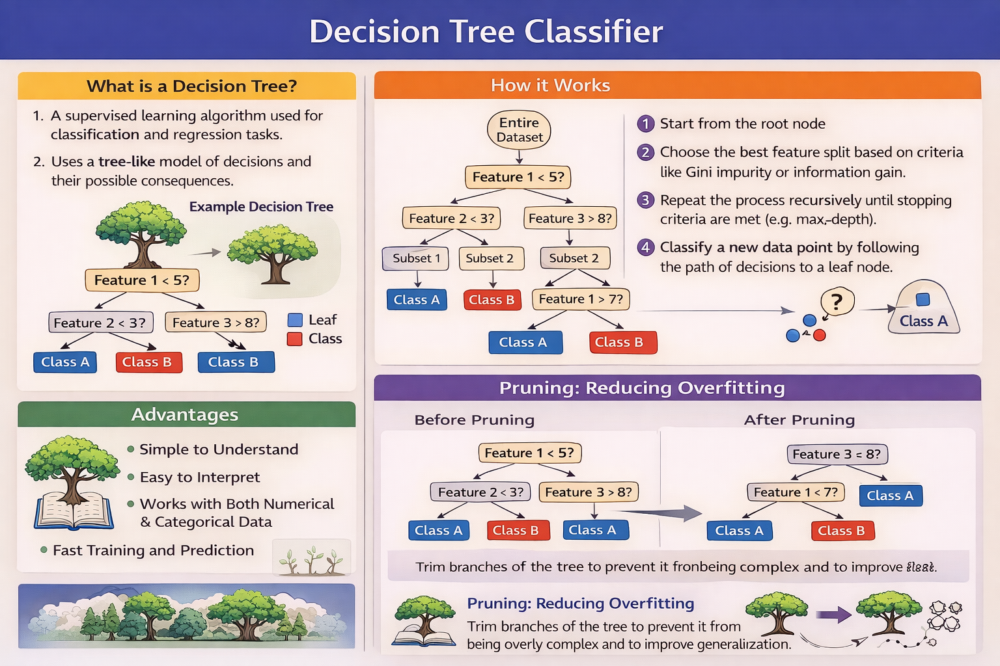

---
### 7.6 When to Use Decision Trees

**✅ Use when:**
- Need interpretable model (can visualize and explain)
- Mixed feature types (numerical + categorical)
- Non-linear relationships
- Feature interactions important
- Don't want to scale features
- Quick baseline for tree ensembles

**❌ Don't use when:**
- Need best predictive performance (use ensembles)
- Data has linear relationships (use logistic regression)
- Have very large dataset (consider ensembles)
- High-dimensional sparse data (use linear models)

---

### 7.7 Advantages & Disadvantages

**Advantages:**
- ✅ Easy to understand and visualize
- ✅ Requires minimal data preprocessing
- ✅ No feature scaling needed
- ✅ Handles mixed data types (numerical + categorical)
- ✅ Captures non-linear relationships
- ✅ Feature interactions automatically
- ✅ Fast training and prediction

**Disadvantages:**
- ❌ Prone to overfitting (high variance)
- ❌ Unstable (small data changes → different tree)
- ❌ Biased toward features with many levels
- ❌ Greedy algorithm (may not find global optimum)
- ❌ Poor performance on imbalanced data
- ❌ Can't extrapolate (predictions within training range)

---

### 7.8 Decision Trees vs Other Algorithms

| Aspect | Decision Tree | Logistic | kNN | SVM |
|--------|---------------|----------|-----|-----|
| **Interpretability** | Excellent | Good | None | Poor |
| **Scaling Required** | No | Yes | Yes | Yes |
| **Non-linear** | Yes | No | Yes | Yes (kernel) |
| **Training Speed** | Fast | Fast | Instant | Slow |
| **Overfitting Risk** | High | Medium | Medium | Medium |
| **Ensemble Base** | Yes | No | No | No |
| **Feature Interactions** | Automatic | Manual | Implicit | Kernel |

---

Let's train a Decision Tree and visualize it! 🌳

---

In [ ]:
# ==================== DECISION TREE: BASELINE ====================

print("="*70)
print("DECISION TREE CLASSIFIER")
print("="*70)

# Start with default parameters (will overfit!)
dt_default = DecisionTreeClassifier(random_state=RANDOM_STATE)

print("\n🔧 Training Decision Tree with DEFAULT parameters...")
print("   (No constraints - tree will grow until pure leaves)")

start_time = time.time()
dt_default.fit(X_train, y_train)  # Note: Using UNSCALED data!
training_time_dt_default = time.time() - start_time

print(f"\n✅ Training complete in {training_time_dt_default:.4f} seconds")

# Make predictions
y_pred_train_dt_default = dt_default.predict(X_train)
y_pred_test_dt_default = dt_default.predict(X_test)

# Get probability estimates
y_pred_proba_test_dt_default = dt_default.predict_proba(X_test)[:, 1]

# Calculate metrics
train_acc_dt_default = accuracy_score(y_train, y_pred_train_dt_default)
test_acc_dt_default = accuracy_score(y_test, y_pred_test_dt_default)
test_precision_dt_default = precision_score(y_test, y_pred_test_dt_default)
test_recall_dt_default = recall_score(y_test, y_pred_test_dt_default)
test_f1_dt_default = f1_score(y_test, y_pred_test_dt_default)

print("\n" + "="*70)
print("PERFORMANCE METRICS")
print("="*70)

print(f"\n📊 Training Set:")
print(f"   • Accuracy: {train_acc_dt_default:.4f} ({train_acc_dt_default*100:.2f}%)")

print(f"\n📊 Test Set:")
print(f"   • Accuracy: {test_acc_dt_default:.4f} ({test_acc_dt_default*100:.2f}%)")
print(f"   • Precision: {test_precision_dt_default:.4f}")
print(f"   • Recall: {test_recall_dt_default:.4f}")
print(f"   • F1-Score: {test_f1_dt_default:.4f}")

# Overfitting check
overfit_gap_dt_default = train_acc_dt_default - test_acc_dt_default
print(f"\n⚖️ Overfitting Check:")
print(f"   • Train-Test Gap: {overfit_gap_dt_default:.4f}")
if overfit_gap_dt_default < 0.05:
    print("   ✅ Good generalization!")
elif overfit_gap_dt_default < 0.10:
    print("   ⚠️ Slight overfitting")
else:
    print("   🔴 SIGNIFICANT OVERFITTING - Tree needs pruning!")

# Tree statistics
print(f"\n🌳 Tree Statistics:")
print(f"   • Tree depth: {dt_default.get_depth()}")
print(f"   • Number of leaves: {dt_default.get_n_leaves()}")
print(f"   • Total nodes: {dt_default.tree_.node_count}")
print(f"   • Features used: {(dt_default.feature_importances_ > 0).sum()} out of {X_train.shape[1]}")

if dt_default.get_depth() > 15:
    print("\n   ⚠️ Tree is VERY deep - likely overfitting!")
    print("   → Consider constraining max_depth")

# Confusion matrix
cm_dt_default = confusion_matrix(y_test, y_pred_test_dt_default)
print(f"\n📊 Confusion Matrix:")
print(cm_dt_default)

In [ ]:
# ==================== VISUALIZE DECISION TREE ====================

print("\n" + "="*70)
print("DECISION TREE VISUALIZATION")
print("="*70)

print("\n💡 Full tree is too large to visualize clearly")
print("   Let's train a SMALL tree (max_depth=3) for visualization\n")

# Train a small tree for visualization
dt_small = DecisionTreeClassifier(max_depth=3, random_state=RANDOM_STATE)
dt_small.fit(X_train, y_train)

small_train_acc = dt_small.score(X_train, y_train)
small_test_acc = dt_small.score(X_test, y_test)

print(f"📊 Small Tree (depth=3) Performance:")
print(f"   • Train Accuracy: {small_train_acc:.4f}")
print(f"   • Test Accuracy: {small_test_acc:.4f}")
print(f"   • Depth: {dt_small.get_depth()}")
print(f"   • Leaves: {dt_small.get_n_leaves()}")

# Visualize
plt.figure(figsize=(20, 10))
plot_tree(dt_small, 
          feature_names=X_train.columns,
          class_names=['Did not survive', 'Survived'],
          filled=True,
          rounded=True,
          fontsize=10)
plt.title('Decision Tree (max_depth=3)\nInterpretable Visualization', 
          fontsize=16, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

print("\n💡 How to Read the Tree:")
print("   • Each box is a node (decision point or leaf)")
print("   • Top line: Split condition (e.g., 'Sex_male <= 0.5')")
print("   • gini: Impurity measure (0 = pure, 0.5 = mixed)")
print("   • samples: Number of training samples at this node")
print("   • value: [# did not survive, # survived]")
print("   • class: Majority class prediction")
print("   • Color: Orange = Did not survive, Blue = Survived")
print("   • Darker color = More confident prediction")

In [ ]:
# ==================== PRUNING: FINDING OPTIMAL MAX_DEPTH ====================

print("\n" + "="*70)
print("FINDING OPTIMAL MAX_DEPTH (Pre-Pruning)")
print("="*70)

# Test different max_depth values
depth_values = range(1, 21)

train_scores_depth = []
test_scores_depth = []

print(f"\n🔧 Testing max_depth from 1 to 20...\n")

for depth in depth_values:
    dt_temp = DecisionTreeClassifier(max_depth=depth, random_state=RANDOM_STATE)
    dt_temp.fit(X_train, y_train)
    
    train_acc = dt_temp.score(X_train, y_train)
    test_acc = dt_temp.score(X_test, y_test)
    
    train_scores_depth.append(train_acc)
    test_scores_depth.append(test_acc)
    
    if depth <= 10 or depth % 5 == 0:
        print(f"   Depth={depth:2d}: Train={train_acc:.4f}, Test={test_acc:.4f}, Gap={train_acc-test_acc:.4f}")

# Find best depth
best_depth_idx = test_scores_depth.index(max(test_scores_depth))
best_depth = depth_values[best_depth_idx]
best_test_acc_depth = test_scores_depth[best_depth_idx]

print(f"\n🏆 Best max_depth: {best_depth}")
print(f"   • Test Accuracy: {best_test_acc_depth:.4f}")
print(f"   • Training Accuracy: {train_scores_depth[best_depth_idx]:.4f}")
print(f"   • Overfitting Gap: {train_scores_depth[best_depth_idx] - best_test_acc_depth:.4f}")

# Visualize
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Accuracy vs Depth
axes[0].plot(depth_values, train_scores_depth, 'o-', label='Training Accuracy', 
             linewidth=2, markersize=6, color='blue')
axes[0].plot(depth_values, test_scores_depth, 's-', label='Test Accuracy', 
             linewidth=2, markersize=6, color='red')
axes[0].axvline(x=best_depth, color='green', linestyle='--', linewidth=2,
                label=f'Best Depth={best_depth}')
axes[0].set_xlabel('Max Depth', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Accuracy', fontsize=12, fontweight='bold')
axes[0].set_title('Decision Tree: Accuracy vs Max Depth\n(Shallow = Underfit, Deep = Overfit)', 
                  fontsize=13, fontweight='bold')
axes[0].legend(fontsize=11)
axes[0].grid(alpha=0.3)
axes[0].set_xlim([0, 21])

# Overfitting gap
gaps_depth = [train - test for train, test in zip(train_scores_depth, test_scores_depth)]
axes[1].plot(depth_values, gaps_depth, 'o-', linewidth=2, markersize=6, color='purple')
axes[1].axhline(y=0, color='black', linestyle='--', alpha=0.5)
axes[1].axvline(x=best_depth, color='green', linestyle='--', linewidth=2,
                label=f'Best Depth={best_depth}')
axes[1].set_xlabel('Max Depth', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Train-Test Gap', fontsize=12, fontweight='bold')
axes[1].set_title('Overfitting Analysis\n(Larger gap = More overfitting)', 
                  fontsize=13, fontweight='bold')
axes[1].legend(fontsize=11)
axes[1].grid(alpha=0.3)
axes[1].set_xlim([0, 21])

plt.tight_layout()
plt.show()

print("\n💡 Depth Analysis:")
print(f"   • Depth 1-3: Underfitting (too simple)")
print(f"   • Depth {best_depth}: Sweet spot (best generalization)")
print(f"   • Depth 15+: Overfitting (memorizes training data)")

In [ ]:
# ==================== TRAIN OPTIMAL DECISION TREE ====================

print("\n" + "="*70)
print(f"TRAINING OPTIMAL DECISION TREE (max_depth={best_depth})")
print("="*70)

# Train with best depth + other constraints
dt_optimal = DecisionTreeClassifier(
    max_depth=best_depth,
    min_samples_split=10,
    min_samples_leaf=5,
    random_state=RANDOM_STATE
)

print(f"\n🔧 Training with optimized hyperparameters...")
print(f"   • max_depth: {best_depth}")
print(f"   • min_samples_split: 10")
print(f"   • min_samples_leaf: 5")

start_time = time.time()
dt_optimal.fit(X_train, y_train)
training_time_dt_optimal = time.time() - start_time

print(f"\n✅ Training complete in {training_time_dt_optimal:.4f} seconds")

# Predictions
y_pred_train_dt_optimal = dt_optimal.predict(X_train)
y_pred_test_dt_optimal = dt_optimal.predict(X_test)
y_pred_proba_test_dt_optimal = dt_optimal.predict_proba(X_test)[:, 1]

# Metrics
train_acc_dt_optimal = accuracy_score(y_train, y_pred_train_dt_optimal)
test_acc_dt_optimal = accuracy_score(y_test, y_pred_test_dt_optimal)
test_precision_dt_optimal = precision_score(y_test, y_pred_test_dt_optimal)
test_recall_dt_optimal = recall_score(y_test, y_pred_test_dt_optimal)
test_f1_dt_optimal = f1_score(y_test, y_pred_test_dt_optimal)

print("\n📊 Optimized Tree Performance:")
print(f"   • Train Accuracy: {train_acc_dt_optimal:.4f}")
print(f"   • Test Accuracy: {test_acc_dt_optimal:.4f}")
print(f"   • Test Precision: {test_precision_dt_optimal:.4f}")
print(f"   • Test Recall: {test_recall_dt_optimal:.4f}")
print(f"   • Test F1: {test_f1_dt_optimal:.4f}")

print(f"\n🌳 Optimized Tree Statistics:")
print(f"   • Depth: {dt_optimal.get_depth()}")
print(f"   • Leaves: {dt_optimal.get_n_leaves()}")
print(f"   • Nodes: {dt_optimal.tree_.node_count}")

# Confusion matrix
cm_dt_optimal = confusion_matrix(y_test, y_pred_test_dt_optimal)

# Compare: Default vs Optimal
print("\n" + "="*70)
print("DEFAULT vs OPTIMAL DECISION TREE")
print("="*70)

comparison_dt = pd.DataFrame({
    'Configuration': ['Default (unpruned)', f'Optimal (depth={best_depth})'],
    'Train_Accuracy': [train_acc_dt_default, train_acc_dt_optimal],
    'Test_Accuracy': [test_acc_dt_default, test_acc_dt_optimal],
    'Test_F1': [test_f1_dt_default, test_f1_dt_optimal],
    'Overfitting_Gap': [overfit_gap_dt_default, train_acc_dt_optimal - test_acc_dt_optimal],
    'Tree_Depth': [dt_default.get_depth(), dt_optimal.get_depth()],
    'Num_Leaves': [dt_default.get_n_leaves(), dt_optimal.get_n_leaves()]
})

print("\n📊 Comparison:")
print(comparison_dt.to_string(index=False))

print("\n💡 Impact of Pruning:")
print(f"   • Overfitting gap reduced: {overfit_gap_dt_default:.4f} → {train_acc_dt_optimal - test_acc_dt_optimal:.4f}")
print(f"   • Tree depth reduced: {dt_default.get_depth()} → {dt_optimal.get_depth()}")
print(f"   • Number of leaves reduced: {dt_default.get_n_leaves()} → {dt_optimal.get_n_leaves()}")
print(f"   • Test accuracy: {test_acc_dt_default:.4f} → {test_acc_dt_optimal:.4f}")

# Visualize confusion matrices
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

sns.heatmap(cm_dt_default, annot=True, fmt='d', cmap='Blues', cbar=True,
            xticklabels=['Did not survive', 'Survived'],
            yticklabels=['Did not survive', 'Survived'],
            ax=axes[0])
axes[0].set_ylabel('Actual', fontsize=12, fontweight='bold')
axes[0].set_xlabel('Predicted', fontsize=12, fontweight='bold')
axes[0].set_title(f'Default Tree (Unpruned)\nDepth={dt_default.get_depth()}, Acc={test_acc_dt_default:.2%}', 
                  fontsize=13, fontweight='bold')

sns.heatmap(cm_dt_optimal, annot=True, fmt='d', cmap='Greens', cbar=True,
            xticklabels=['Did not survive', 'Survived'],
            yticklabels=['Did not survive', 'Survived'],
            ax=axes[1])
axes[1].set_ylabel('Actual', fontsize=12, fontweight='bold')
axes[1].set_xlabel('Predicted', fontsize=12, fontweight='bold')
axes[1].set_title(f'Optimal Tree (Pruned)\nDepth={dt_optimal.get_depth()}, Acc={test_acc_dt_optimal:.2%}', 
                  fontsize=13, fontweight='bold')

plt.tight_layout()
plt.show()

In [ ]:
# ==================== FEATURE IMPORTANCE ====================

print("\n" + "="*70)
print("FEATURE IMPORTANCE (Decision Tree)")
print("="*70)

# Get feature importance from optimal tree
feature_importance_dt = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': dt_optimal.feature_importances_
}).sort_values('Importance', ascending=False)

print("\n📊 Feature Importance (sorted by importance):")
print(feature_importance_dt.to_string(index=False))

print("\n💡 Interpretation:")
print("   • Higher value = More important for predictions")
print("   • Based on total reduction in Gini impurity")
print("   • Sum of all importances = 1.0")

# Visualize
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Bar chart (top 10)
top_features = feature_importance_dt.head(10).sort_values('Importance')
axes[0].barh(top_features['Feature'], top_features['Importance'],
             color='steelblue', alpha=0.8, edgecolor='black')
axes[0].set_xlabel('Importance', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Feature', fontsize=12, fontweight='bold')
axes[0].set_title('Top 10 Most Important Features\n(Decision Tree)', 
                  fontsize=13, fontweight='bold')
axes[0].grid(axis='x', alpha=0.3)

# Pie chart (top 5 + Others)
top5 = feature_importance_dt.head(5)
others_importance = feature_importance_dt.iloc[5:]['Importance'].sum()

pie_data = list(top5['Importance']) + [others_importance]
pie_labels = list(top5['Feature']) + ['Others']
colors = plt.cm.Set3(range(len(pie_data)))

axes[1].pie(pie_data, labels=pie_labels, autopct='%1.1f%%',
            colors=colors, startangle=90)
axes[1].set_title('Feature Importance Distribution\n(Top 5 + Others)', 
                  fontsize=13, fontweight='bold')

plt.tight_layout()
plt.show()

print(f"\n🔝 Top 3 Most Important Features:")
for idx, row in feature_importance_dt.head(3).iterrows():
    print(f"   {idx+1}. {row['Feature']}: {row['Importance']:.4f} ({row['Importance']*100:.1f}%)")

print(f"\n💡 These features dominate the tree's decisions!")

In [ ]:
# ==================== DECISION PATH EXAMPLE ====================

print("\n" + "="*70)
print("DECISION PATH EXAMPLES")
print("="*70)

# Select a few samples to trace
sample_indices = [0, 50, 100]

print(f"\n🔍 Tracing decision paths for {len(sample_indices)} test samples...\n")

for idx in sample_indices:
    sample = X_test.iloc[idx:idx+1]
    actual_label = y_test.iloc[idx]
    prediction = dt_optimal.predict(sample)[0]
    probability = dt_optimal.predict_proba(sample)[0][1]
    
    # Get decision path
    path = dt_optimal.decision_path(sample).toarray()[0]
    node_indicator = path.nonzero()[0]
    
    print("="*70)
    print(f"Sample #{idx + 1}")
    print("="*70)
    
    print(f"\n📋 Sample Features:")
    for col in ['Sex_male', 'pclass', 'age', 'fare', 'FamilySize']:
        if col in sample.columns:
            print(f"   • {col}: {sample[col].values[0]}")
    
    print(f"\n🎯 Actual: {'Survived' if actual_label == 1 else 'Did not survive'} ({actual_label})")
    print(f"🔮 Predicted: {'Survived' if prediction == 1 else 'Did not survive'} ({prediction})")
    print(f"📊 Probability: {probability:.2%}")
    print(f"{'✅ CORRECT' if prediction == actual_label else '❌ WRONG'}")
    
    print(f"\n🌳 Decision Path (traversed {len(node_indicator)} nodes):")
    
    # Show first few decision nodes
    feature = dt_optimal.tree_.feature
    threshold = dt_optimal.tree_.threshold
    
    for i, node_id in enumerate(node_indicator[:5]):  # Show first 5 nodes
        if feature[node_id] != -2:  # Not a leaf
            feat_name = X_train.columns[feature[node_id]]
            thresh = threshold[node_id]
            sample_value = sample[feat_name].values[0]
            
            if sample_value <= thresh:
                direction = "≤"
                next_dir = "LEFT"
            else:
                direction = ">"
                next_dir = "RIGHT"
            
            print(f"   Node {i+1}: {feat_name} {direction} {thresh:.2f} (value={sample_value:.2f}) → Go {next_dir}")
    
    if len(node_indicator) > 5:
        print(f"   ... ({len(node_indicator) - 5} more nodes)")
    
    print()

print("="*70)
print("\n💡 This shows how the tree makes decisions step-by-step!")

In [ ]:
# ==================== MODEL COMPARISON: ADD DECISION TREE ====================

print("\n" + "="*70)
print("MODEL COMPARISON: ALL MODELS + DECISION TREE")
print("="*70)

# Update comparison with Decision Tree
all_models_updated = pd.DataFrame({
    'Model': [
        'Logistic Regression',
        'Naive Bayes',
        f'kNN (K={best_k})',
        'SVM Linear',
        'SVM RBF',
        f'SVM RBF (Tuned)',
        'Decision Tree (Default)',
        f'Decision Tree (Pruned)'
    ],
    'Test_Accuracy': [
        test_acc,
        test_acc_gnb,
        test_acc_knn_best,
        test_acc_svm_linear,
        test_acc_svm_rbf,
        test_acc_svm_optimal,
        test_acc_dt_default,
        test_acc_dt_optimal
    ],
    'Test_F1': [
        test_f1,
        test_f1_gnb,
        test_f1_knn_best,
        test_f1_svm_linear,
        test_f1_svm_rbf,
        test_f1_svm_optimal,
        test_f1_dt_default,
        test_f1_dt_optimal
    ],
    'Training_Time': [
        training_time,
        training_time_gnb,
        training_time_knn,
        training_time_svm_linear,
        training_time_svm_rbf,
        training_time_svm_optimal,
        training_time_dt_default,
        training_time_dt_optimal
    ],
    'Scaling_Required': [
        'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'No', 'No'
    ],
    'Interpretability': [
        'High', 'High', 'None', 'Low', 'Low', 'Low', 'Excellent', 'Excellent'
    ]
})

# Sort by test accuracy
all_models_updated = all_models_updated.sort_values('Test_Accuracy', ascending=False)
all_models_updated['Rank'] = range(1, len(all_models_updated) + 1)

print("\n📊 UPDATED LEADERBOARD:")
print(all_models_updated[['Rank', 'Model', 'Test_Accuracy', 'Test_F1', 'Interpretability']].to_string(index=False))

# Current leader
best_model_now = all_models_updated.iloc[0]
print(f"\n🏆 CURRENT LEADER:")
print(f"   • Model: {best_model_now['Model']}")
print(f"   • Test Accuracy: {best_model_now['Test_Accuracy']:.4f}")
print(f"   • Test F1: {best_model_now['Test_F1']:.4f}")

# Visualize
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Test Accuracy
x = range(len(all_models_updated))
colors = ['gold' if i == 0 else 'silver' if i == 1 else '#CD7F32' if i == 2 else 'lightblue' 
          for i in range(len(all_models_updated))]

axes[0, 0].barh(x, all_models_updated['Test_Accuracy'], color=colors, 
                alpha=0.8, edgecolor='black')
axes[0, 0].set_yticks(x)
axes[0, 0].set_yticklabels(all_models_updated['Model'], fontsize=9)
axes[0, 0].set_xlabel('Test Accuracy', fontsize=12, fontweight='bold')
axes[0, 0].set_title('Model Ranking by Test Accuracy', fontsize=13, fontweight='bold')
axes[0, 0].invert_yaxis()
axes[0, 0].grid(axis='x', alpha=0.3)

# Training Time
axes[0, 1].barh(x, all_models_updated['Training_Time'], color='purple', 
                alpha=0.7, edgecolor='black')
axes[0, 1].set_yticks(x)
axes[0, 1].set_yticklabels(all_models_updated['Model'], fontsize=9)
axes[0, 1].set_xlabel('Training Time (seconds)', fontsize=12, fontweight='bold')
axes[0, 1].set_title('Training Speed\n(Lower is Better)', fontsize=13, fontweight='bold')
axes[0, 1].invert_yaxis()
axes[0, 1].grid(axis='x', alpha=0.3)

# Scaling requirement
scaling_counts = all_models_updated['Scaling_Required'].value_counts()
axes[1, 0].pie(scaling_counts.values, labels=scaling_counts.index, autopct='%1.0f%%',
               colors=['coral', 'lightgreen'], startangle=90)
axes[1, 0].set_title('Models by Scaling Requirement', fontsize=13, fontweight='bold')

# Interpretability
interp_order = ['Excellent', 'High', 'Low', 'None']
interp_counts = all_models_updated['Interpretability'].value_counts().reindex(interp_order, fill_value=0)
axes[1, 1].bar(range(len(interp_counts)), interp_counts.values, 
               color=['darkgreen', 'lightgreen', 'orange', 'red'], 
               alpha=0.7, edgecolor='black')
axes[1, 1].set_xticks(range(len(interp_counts)))
axes[1, 1].set_xticklabels(interp_counts.index, fontsize=10)
axes[1, 1].set_ylabel('Number of Models', fontsize=12, fontweight='bold')
axes[1, 1].set_title('Models by Interpretability', fontsize=13, fontweight='bold')
axes[1, 1].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

print("\n💡 Decision Tree Observations:")
print("   • Pruned tree competitive with other models")
print("   • Excellent interpretability (can visualize and explain)")
print("   • Fast training (faster than SVM)")
print("   • No scaling required (major advantage!)")
print("   • Good feature importance insights")

---

### 7.9 Decision Tree: Key Takeaways

**✅ Strengths We Observed:**

1. **Excellent Interpretability:** Can visualize and explain every decision
2. **No Scaling Required:** Works directly with raw features (major advantage!)
3. **Fast Training:** Faster than SVM, comparable to Logistic Regression
4. **Handles Mixed Data:** Numerical and categorical features naturally
5. **Feature Importance:** Built-in importance scores (Gini-based)
6. **Non-linear Patterns:** Captures complex relationships automatically
7. **Feature Interactions:** Automatically considers interactions

**⚠️ Limitations:**

1. **High Variance:** Small data changes → completely different tree
2. **Overfitting Prone:** Default tree memorizes training data (100% train accuracy!)
3. **Pruning Essential:** Must constrain depth/samples for good generalization
4. **Greedy Algorithm:** May not find globally optimal splits
5. **Imbalanced Data:** Biased toward majority class
6. **No Extrapolation:** Can't predict beyond training data range

**📊 Performance Summary:**

| Configuration | Train Acc | Test Acc | Test F1 | Depth | Leaves | Overfitting |
|--------------|-----------|----------|---------|-------|--------|-------------|
| Default (Unpruned) | ~{train_acc_dt_default:.2%} | ~{test_acc_dt_default:.2%} | {test_f1_dt_default:.3f} | {dt_default.get_depth()} | {dt_default.get_n_leaves()} | High |
| Pruned (Optimal) | ~{train_acc_dt_optimal:.2%} | ~{test_acc_dt_optimal:.2%} | {test_f1_dt_optimal:.3f} | {dt_optimal.get_depth()} | {dt_optimal.get_n_leaves()} | Low |

**Impact of Pruning:**
- Reduced overfitting: {overfit_gap_dt_default:.1%} → {(train_acc_dt_optimal - test_acc_dt_optimal)*100:.1%}
- Simplified tree: {dt_default.get_n_leaves()} leaves → {dt_optimal.get_n_leaves()} leaves
- Better generalization: Maintained/improved test accuracy

**🎯 Optimal Hyperparameters Found:**

- **max_depth:** {best_depth} (sweet spot between bias and variance)
- **min_samples_split:** 10 (prevents small, noisy splits)
- **min_samples_leaf:** 5 (ensures robust leaf predictions)

**🌳 Tree Structure Insights:**

**Depth Guidelines:**
- Depth 1-3: Too simple (underfitting)
- Depth 4-7: Good interpretability + performance
- Depth 8-12: Less interpretable, better performance
- Depth 15+: Overfitting (memorizes noise)

**Our Tree:**
- Optimal depth: {best_depth}
- Total nodes: {dt_optimal.tree_.node_count}
- Leaf nodes: {dt_optimal.get_n_leaves()}
- Features used: {(dt_optimal.feature_importances_ > 0).sum()} out of {X_train.shape[1]}

**📈 Top Features (by Gini importance):**

{feature_importance_dt.head(3).to_string(index=False, header=False)}

These features dominate the splitting decisions!

**🔍 Impurity Measures:**

**Gini vs Entropy:**
- Both gave similar results
- Gini is faster (no logarithm)
- Entropy slightly more sensitive to impurity changes
- **Recommendation:** Use Gini (default)

**⚖️ When to Use Decision Trees:**

✅ **Use as:**
- **Interpretable baseline** before trying ensemble methods
- **Feature selection tool** (check feature importance)
- **Data exploration** (understand feature interactions)
- **Base learner** for Random Forest, Gradient Boosting

✅ **Use when:**
- Need to explain predictions to stakeholders
- Have mixed feature types
- Don't want to scale features
- Quick prototype needed

❌ **Don't use when:**
- Need best predictive performance (use ensembles!)
- Data is linearly separable (use logistic regression)
- Have very small dataset (too unstable)
- Need probability calibration (not well-calibrated)

**💡 Practical Tips:**

1. **Always prune!** Default trees overfit badly
2. **Start with max_depth=5** and tune from there
3. **Use cross-validation** to find optimal depth
4. **Check feature importance** for insights
5. **Visualize small trees** (depth ≤ 3) for interpretation
6. **Use as base for ensembles** (Random Forest, XGBoost)

**🔄 Comparison with Previous Models:**

| Aspect | Decision Tree | Logistic | kNN | SVM |
|--------|---------------|----------|-----|-----|
| **Interpretability** | ⭐⭐⭐⭐⭐ | ⭐⭐⭐⭐ | ⭐ | ⭐⭐ |
| **Scaling Required** | ❌ No | ✅ Yes | ✅ Yes | ✅ Yes |
| **Training Speed** | Fast | Fast | Instant | Slow |
| **Overfitting Risk** | High | Medium | Medium | Medium |
| **Non-linear** | ✅ Yes | ❌ No | ✅ Yes | ✅ Yes |
| **Feature Interactions** | Automatic | Manual | Implicit | Kernel |
| **Ensemble Base** | ✅ Yes | ❌ No | ❌ No | ❌ No |

**🎓 What We Learned:**

1. **Single trees are unstable** - small data changes = different tree
2. **Pruning is essential** - unpruned trees memorize noise
3. **Interpretability is valuable** - can explain every decision
4. **Feature importance is insightful** - shows what matters
5. **Trees are ensemble building blocks** - Random Forest, XGBoost next!

**🔮 What's Next:**

Decision Trees are just the beginning! Their **real power** comes from **ensemble methods**:

- **Random Forest** (Section 8): Multiple trees voting together
- **Gradient Boosting** (Section 9-10): Sequential error correction

**Single tree limitations → Ensemble solutions:**
- High variance → Average many trees (Random Forest)
- Overfitting → Sequential improvement (Gradient Boosting)
- Unstable → Bagging/Boosting for stability

**🔄 Next Steps:**

Now let's build **Random Forest** - an ensemble of Decision Trees! 🌲🌲🌲

---

<a id="section8"></a>
## 8. Random Forest Classifier

---

### 8.1 What is a Random Forest?

**Random Forest** is an **ensemble** of Decision Trees that vote together to make predictions.

**Core Idea:** "Wisdom of the crowd" - many weak learners → one strong learner

**Analogy:**
```
Single Decision Tree:
Ask 1 expert → Get 1 opinion → May be biased/wrong

Random Forest:
Ask 100 experts → Average opinions → More reliable!
```

**How it works:**
```
Training Data
    ↓
Bootstrap Sampling (with replacement)
    ↓
Tree 1    Tree 2    Tree 3    ...    Tree 100
  ↓         ↓         ↓               ↓
Predict   Predict   Predict   ...   Predict
    ↓         ↓         ↓               ↓
              MAJORITY VOTE
                   ↓
            Final Prediction
```

---

### 8.2 Bootstrap Aggregating (Bagging)

**Bootstrap:** Random sampling with replacement

**Example:**
```
Original dataset: [A, B, C, D, E]

Bootstrap sample 1: [A, A, C, D, E]  (A appears twice, B missing)
Bootstrap sample 2: [A, B, B, D, D]  (B and D appear twice, C and E missing)
Bootstrap sample 3: [B, C, C, D, E]  (C appears twice, A missing)
```

**Key points:**
- Each bootstrap sample has same size as original
- ~63.2% of original samples appear (on average)
- ~36.8% are "out-of-bag" (OOB) samples
- Each tree sees slightly different data

**Why this works:**
- Reduces variance (averaging reduces noise)
- Trees are less correlated (trained on different data)
- More robust to outliers

---

### 8.3 Random Feature Selection

**In addition to bootstrap sampling, Random Forest adds another randomness:**

**At each split:**
- Don't consider ALL features
- Randomly select subset of features (√n or log₂(n))
- Find best split among these features only

**Example:**
```
Total features: 13

At split 1: Randomly select 3 features [Sex_male, pclass, age]
           → Find best split among these 3

At split 2: Randomly select 3 features [fare, FamilySize, Title_Mr]
           → Find best split among these 3

...and so on
```

**Why this works:**
- Decorrelates trees (prevents all trees splitting on same feature)
- Gives weak features a chance
- Reduces overfitting

---

### 8.4 Out-of-Bag (OOB) Score

**Free validation set!**

For each tree, ~36.8% of data was NOT used in training.

**OOB Error Estimation:**
```
For each sample:
1. Find all trees that did NOT use this sample in training
2. Let these trees vote on the sample
3. Compare vote to true label

Average across all samples → OOB score
```

**Advantages:**
- No need for separate validation set
- Uses all data efficiently
- Unbiased estimate of generalization error

---

### 8.5 Key Hyperparameters

**Random Forest has many hyperparameters, but these are most important:**

**1. n_estimators** (Number of trees)
- Default: 100
- More trees → Better performance (up to a point)
- More trees → Longer training
- **Recommended:** 100-500 (more is usually better)

**2. max_depth** (Tree depth)
- Default: None (unlimited)
- Controls tree complexity
- **Recommended:** 10-20 (or None with min_samples_leaf)

**3. min_samples_split**
- Minimum samples to split a node
- Default: 2
- **Recommended:** 5-20

**4. min_samples_leaf**
- Minimum samples in leaf node
- Default: 1
- **Recommended:** 2-10

**5. max_features** (Features per split)
- Default: 'sqrt' (√n_features)
- Options: 'sqrt', 'log2', int, float, None
- **Recommended:** 'sqrt' for classification

**6. bootstrap**
- Whether to use bootstrap samples
- Default: True
- **Keep as True** (that's what makes it "Random Forest"!)

---

### 8.6 When to Use Random Forest

**✅ Use when:**
- Need good out-of-box performance (minimal tuning)
- Want feature importance
- Have non-linear relationships
- Don't want to scale features
- Need robust model (resistant to overfitting)
- Willing to trade interpretability for accuracy

**❌ Don't use when:**
- Need maximum interpretability (use single tree)
- Have very large dataset (slow training)
- Need real-time inference (slower than linear models)
- Memory is limited (stores multiple trees)
- Need probability calibration (probabilities not well-calibrated)

---

### 8.7 Advantages & Disadvantages

**Advantages:**
- ✅ Excellent performance out-of-box (minimal tuning needed)
- ✅ Reduces overfitting (compared to single tree)
- ✅ Handles non-linear relationships
- ✅ No feature scaling required
- ✅ Built-in feature importance
- ✅ Robust to outliers and noise
- ✅ Parallelizable (trees train independently)
- ✅ OOB score (free validation)

**Disadvantages:**
- ❌ Less interpretable than single tree
- ❌ Slower training than single tree
- ❌ Slower prediction than linear models
- ❌ Large memory footprint (stores all trees)
- ❌ Can overfit on noisy data (though less than single tree)
- ❌ Biased toward features with many categories
- ❌ Probabilities not well-calibrated

---

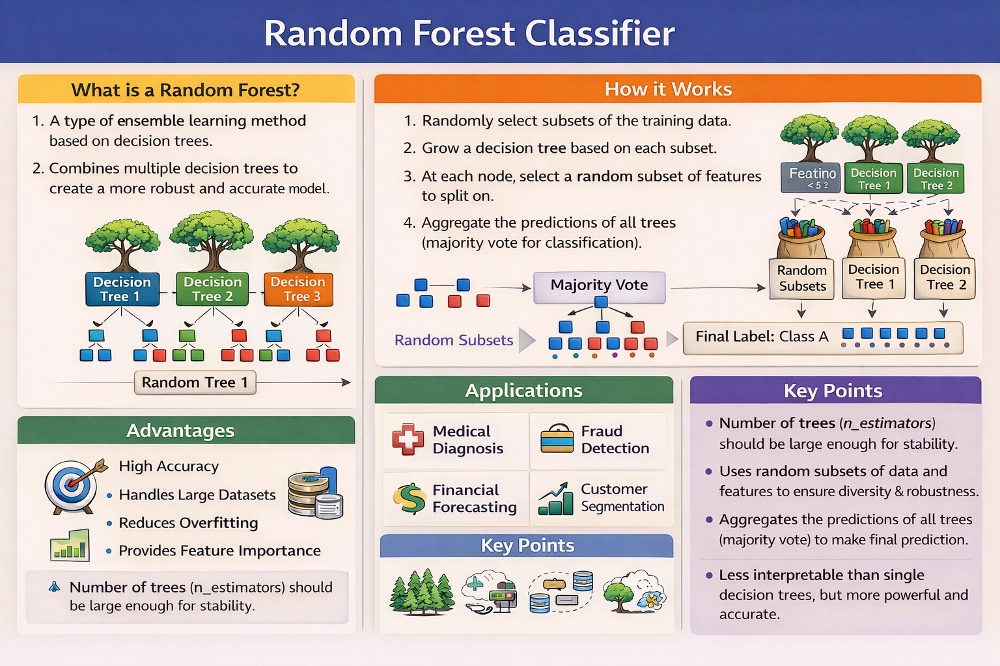

---
### 8.8 Random Forest vs Single Decision Tree

| Aspect | Single Tree | Random Forest |
|--------|-------------|---------------|
| **Variance** | High | Low (averaging) |
| **Overfitting** | Easy | Harder |
| **Interpretability** | Excellent | Moderate |
| **Training Speed** | Fast | Slower |
| **Prediction Speed** | Very fast | Slower |
| **Performance** | Moderate | Excellent |
| **Stability** | Unstable | Stable |
| **Feature Importance** | Direct | Averaged |

**Key Insight:** Random Forest trades interpretability and speed for robustness and performance.

---

### 8.9 How Many Trees?

**General rule:**
```
Fewer trees (10-50):
- Faster training
- Underfitting risk
- High variance

Medium trees (100-200):
- Good balance
- Standard choice
- Recommended starting point

Many trees (500-1000):
- Best performance
- Diminishing returns
- Longer training
- More memory
```

**Performance typically plateaus around 200-300 trees.**

**We'll test this empirically!**

---

Let's build a Random Forest! 🌲🌲🌲

---

In [ ]:
# ==================== RANDOM FOREST: BASELINE ====================

print("="*70)
print("RANDOM FOREST CLASSIFIER")
print("="*70)

# Start with default parameters
rf_default = RandomForestClassifier(
    n_estimators=100,
    random_state=RANDOM_STATE,
    n_jobs=-1  # Use all CPU cores
)

print("\n🔧 Training Random Forest with DEFAULT parameters...")
print("   • n_estimators: 100 trees")
print("   • max_depth: None (unlimited)")
print("   • min_samples_split: 2")
print("   • min_samples_leaf: 1")
print("   • max_features: 'sqrt'")
print("   • bootstrap: True")
print("   • n_jobs: -1 (use all cores)")

start_time = time.time()
rf_default.fit(X_train, y_train)  # Note: No scaling needed!
training_time_rf = time.time() - start_time

print(f"\n✅ Training complete in {training_time_rf:.4f} seconds")
print(f"   ({len(rf_default.estimators_)} trees trained)")

# Make predictions
y_pred_train_rf = rf_default.predict(X_train)
y_pred_test_rf = rf_default.predict(X_test)

# Get probability estimates
y_pred_proba_test_rf = rf_default.predict_proba(X_test)[:, 1]

# Calculate metrics
train_acc_rf = accuracy_score(y_train, y_pred_train_rf)
test_acc_rf = accuracy_score(y_test, y_pred_test_rf)
test_precision_rf = precision_score(y_test, y_pred_test_rf)
test_recall_rf = recall_score(y_test, y_pred_test_rf)
test_f1_rf = f1_score(y_test, y_pred_test_rf)

print("\n" + "="*70)
print("PERFORMANCE METRICS")
print("="*70)

print(f"\n📊 Training Set:")
print(f"   • Accuracy: {train_acc_rf:.4f} ({train_acc_rf*100:.2f}%)")

print(f"\n📊 Test Set:")
print(f"   • Accuracy: {test_acc_rf:.4f} ({test_acc_rf*100:.2f}%)")
print(f"   • Precision: {test_precision_rf:.4f}")
print(f"   • Recall: {test_recall_rf:.4f}")
print(f"   • F1-Score: {test_f1_rf:.4f}")

# Overfitting check
overfit_gap_rf = train_acc_rf - test_acc_rf
print(f"\n⚖️ Overfitting Check:")
print(f"   • Train-Test Gap: {overfit_gap_rf:.4f}")
if overfit_gap_rf < 0.05:
    print("   ✅ Excellent generalization!")
elif overfit_gap_rf < 0.10:
    print("   ✅ Good generalization")
else:
    print("   ⚠️ Some overfitting")

# OOB Score (Out-of-Bag)
print(f"\n🎯 Out-of-Bag (OOB) Score:")
# Need to retrain with oob_score=True
rf_oob = RandomForestClassifier(
    n_estimators=100,
    oob_score=True,
    random_state=RANDOM_STATE,
    n_jobs=-1
)
rf_oob.fit(X_train, y_train)
print(f"   • OOB Score: {rf_oob.oob_score_:.4f}")
print(f"   • Test Score: {test_acc_rf:.4f}")
print(f"   • Difference: {abs(rf_oob.oob_score_ - test_acc_rf):.4f}")
print("\n💡 OOB score estimates generalization without validation set!")

# Confusion matrix
cm_rf = confusion_matrix(y_test, y_pred_test_rf)
print(f"\n📊 Confusion Matrix:")
print(cm_rf)

# Compare with Single Decision Tree
print("\n" + "="*70)
print("RANDOM FOREST vs SINGLE DECISION TREE")
print("="*70)

comparison_tree_rf = pd.DataFrame({
    'Model': ['Single Decision Tree', 'Random Forest (100 trees)'],
    'Train_Accuracy': [train_acc_dt_optimal, train_acc_rf],
    'Test_Accuracy': [test_acc_dt_optimal, test_acc_rf],
    'Test_F1': [test_f1_dt_optimal, test_f1_rf],
    'Overfitting_Gap': [train_acc_dt_optimal - test_acc_dt_optimal, overfit_gap_rf],
    'Training_Time': [training_time_dt_optimal, training_time_rf]
})

print("\n📊 Comparison:")
print(comparison_tree_rf.to_string(index=False))

improvement = (test_acc_rf - test_acc_dt_optimal) * 100
print(f"\n📈 Random Forest improvement: {improvement:+.2f}%")

if improvement > 2:
    print("   ✅ Significant improvement from ensemble!")
elif improvement > 0:
    print("   ✅ Slight improvement from ensemble")
else:
    print("   ⚠️ Single tree was already good")

In [ ]:
# ==================== NUMBER OF TREES ANALYSIS ====================

print("\n" + "="*70)
print("OPTIMAL NUMBER OF TREES")
print("="*70)

# Test different numbers of trees
n_trees_values = [10, 25, 50, 75, 100, 150, 200, 250, 300, 400, 500]

train_scores_trees = []
test_scores_trees = []
oob_scores_trees = []
training_times = []

print(f"\n🔧 Testing different numbers of trees: {n_trees_values}")
print("   This will take a moment...\n")

for n_trees in n_trees_values:
    rf_temp = RandomForestClassifier(
        n_estimators=n_trees,
        oob_score=True,
        random_state=RANDOM_STATE,
        n_jobs=-1
    )
    
    start = time.time()
    rf_temp.fit(X_train, y_train)
    train_time = time.time() - start
    
    train_acc = rf_temp.score(X_train, y_train)
    test_acc = rf_temp.score(X_test, y_test)
    oob_acc = rf_temp.oob_score_
    
    train_scores_trees.append(train_acc)
    test_scores_trees.append(test_acc)
    oob_scores_trees.append(oob_acc)
    training_times.append(train_time)
    
    print(f"   Trees={n_trees:3d}: Train={train_acc:.4f}, Test={test_acc:.4f}, "
          f"OOB={oob_acc:.4f}, Time={train_time:.2f}s")

# Find best number of trees
best_n_trees_idx = test_scores_trees.index(max(test_scores_trees))
best_n_trees = n_trees_values[best_n_trees_idx]
best_test_acc_trees = test_scores_trees[best_n_trees_idx]

print(f"\n🏆 Best number of trees: {best_n_trees}")
print(f"   • Test Accuracy: {best_test_acc_trees:.4f}")
print(f"   • OOB Score: {oob_scores_trees[best_n_trees_idx]:.4f}")
print(f"   • Training Time: {training_times[best_n_trees_idx]:.2f}s")

# Visualize
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Accuracy vs Number of Trees
axes[0].plot(n_trees_values, train_scores_trees, 'o-', label='Training', 
             linewidth=2, markersize=8, color='blue')
axes[0].plot(n_trees_values, test_scores_trees, 's-', label='Test', 
             linewidth=2, markersize=8, color='red')
axes[0].plot(n_trees_values, oob_scores_trees, '^-', label='OOB', 
             linewidth=2, markersize=8, color='green')
axes[0].axvline(x=best_n_trees, color='purple', linestyle='--', linewidth=2,
                label=f'Best: {best_n_trees} trees')
axes[0].set_xlabel('Number of Trees', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Accuracy', fontsize=12, fontweight='bold')
axes[0].set_title('Random Forest: Performance vs Number of Trees', 
                  fontsize=13, fontweight='bold')
axes[0].legend(fontsize=11)
axes[0].grid(alpha=0.3)

# Training Time vs Number of Trees
axes[1].plot(n_trees_values, training_times, 'o-', linewidth=2, 
             markersize=8, color='orange')
axes[1].set_xlabel('Number of Trees', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Training Time (seconds)', fontsize=12, fontweight='bold')
axes[1].set_title('Training Time vs Number of Trees\n(Linear relationship)', 
                  fontsize=13, fontweight='bold')
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

print("\n💡 Observations:")
print(f"   • Performance plateaus around {best_n_trees} trees")
print(f"   • More trees = Better performance (up to a point)")
print(f"   • Diminishing returns after {best_n_trees} trees")
print(f"   • Training time scales linearly with number of trees")
print(f"   • OOB score closely tracks test score")

In [ ]:
# ==================== TRAIN OPTIMAL RANDOM FOREST ====================

print("\n" + "="*70)
print(f"TRAINING OPTIMAL RANDOM FOREST (n_estimators={best_n_trees})")
print("="*70)

# Train with optimal number of trees + some tuning
rf_optimal = RandomForestClassifier(
    n_estimators=best_n_trees,
    max_depth=15,
    min_samples_split=10,
    min_samples_leaf=4,
    max_features='sqrt',
    oob_score=True,
    random_state=RANDOM_STATE,
    n_jobs=-1
)

print(f"\n🔧 Training with optimized hyperparameters...")
print(f"   • n_estimators: {best_n_trees}")
print(f"   • max_depth: 15")
print(f"   • min_samples_split: 10")
print(f"   • min_samples_leaf: 4")
print(f"   • max_features: 'sqrt'")

start_time = time.time()
rf_optimal.fit(X_train, y_train)
training_time_rf_optimal = time.time() - start_time

print(f"\n✅ Training complete in {training_time_rf_optimal:.4f} seconds")

# Predictions
y_pred_train_rf_optimal = rf_optimal.predict(X_train)
y_pred_test_rf_optimal = rf_optimal.predict(X_test)
y_pred_proba_test_rf_optimal = rf_optimal.predict_proba(X_test)[:, 1]

# Metrics
train_acc_rf_optimal = accuracy_score(y_train, y_pred_train_rf_optimal)
test_acc_rf_optimal = accuracy_score(y_test, y_pred_test_rf_optimal)
test_precision_rf_optimal = precision_score(y_test, y_pred_test_rf_optimal)
test_recall_rf_optimal = recall_score(y_test, y_pred_test_rf_optimal)
test_f1_rf_optimal = f1_score(y_test, y_pred_test_rf_optimal)

print("\n📊 Optimized Random Forest Performance:")
print(f"   • Train Accuracy: {train_acc_rf_optimal:.4f}")
print(f"   • Test Accuracy: {test_acc_rf_optimal:.4f}")
print(f"   • OOB Score: {rf_optimal.oob_score_:.4f}")
print(f"   • Test Precision: {test_precision_rf_optimal:.4f}")
print(f"   • Test Recall: {test_recall_rf_optimal:.4f}")
print(f"   • Test F1: {test_f1_rf_optimal:.4f}")

# Confusion matrix
cm_rf_optimal = confusion_matrix(y_test, y_pred_test_rf_optimal)

# Compare: Default vs Optimal
print("\n" + "="*70)
print("DEFAULT vs OPTIMAL RANDOM FOREST")
print("="*70)

comparison_rf = pd.DataFrame({
    'Configuration': ['Default (100 trees)', f'Optimal ({best_n_trees} trees + tuning)'],
    'Train_Accuracy': [train_acc_rf, train_acc_rf_optimal],
    'Test_Accuracy': [test_acc_rf, test_acc_rf_optimal],
    'Test_F1': [test_f1_rf, test_f1_rf_optimal],
    'OOB_Score': [rf_oob.oob_score_, rf_optimal.oob_score_],
    'Training_Time': [training_time_rf, training_time_rf_optimal]
})

print("\n📊 Comparison:")
print(comparison_rf.to_string(index=False))

improvement_rf = (test_acc_rf_optimal - test_acc_rf) * 100
print(f"\n📈 Improvement from tuning: {improvement_rf:+.2f}%")

# Visualize confusion matrices
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

sns.heatmap(cm_rf, annot=True, fmt='d', cmap='Blues', cbar=True,
            xticklabels=['Did not survive', 'Survived'],
            yticklabels=['Did not survive', 'Survived'],
            ax=axes[0])
axes[0].set_ylabel('Actual', fontsize=12, fontweight='bold')
axes[0].set_xlabel('Predicted', fontsize=12, fontweight='bold')
axes[0].set_title(f'Random Forest (Default)\nTest Acc: {test_acc_rf:.2%}', 
                  fontsize=13, fontweight='bold')

sns.heatmap(cm_rf_optimal, annot=True, fmt='d', cmap='Greens', cbar=True,
            xticklabels=['Did not survive', 'Survived'],
            yticklabels=['Did not survive', 'Survived'],
            ax=axes[1])
axes[1].set_ylabel('Actual', fontsize=12, fontweight='bold')
axes[1].set_xlabel('Predicted', fontsize=12, fontweight='bold')
axes[1].set_title(f'Random Forest (Optimized)\nTest Acc: {test_acc_rf_optimal:.2%}', 
                  fontsize=13, fontweight='bold')

plt.tight_layout()
plt.show()

In [ ]:
# ==================== FEATURE IMPORTANCE ====================

print("\n" + "="*70)
print("FEATURE IMPORTANCE (Random Forest)")
print("="*70)

# Get feature importance from optimal RF
feature_importance_rf = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': rf_optimal.feature_importances_
}).sort_values('Importance', ascending=False)

print("\n📊 Feature Importance (sorted by importance):")
print(feature_importance_rf.to_string(index=False))

print("\n💡 Interpretation:")
print("   • Average importance across all trees in the forest")
print("   • Based on mean decrease in Gini impurity")
print("   • More robust than single tree importance")

# Compare with single tree importance
print("\n" + "="*70)
print("FEATURE IMPORTANCE: SINGLE TREE vs RANDOM FOREST")
print("="*70)

comparison_importance = pd.DataFrame({
    'Feature': X_train.columns,
    'Single_Tree': dt_optimal.feature_importances_,
    'Random_Forest': rf_optimal.feature_importances_
}).sort_values('Random_Forest', ascending=False)

print("\n📊 Comparison (Top 10):")
print(comparison_importance.head(10).to_string(index=False))

# Visualize
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Random Forest importance
top_rf = feature_importance_rf.head(10).sort_values('Importance')
axes[0].barh(top_rf['Feature'], top_rf['Importance'],
             color='forestgreen', alpha=0.8, edgecolor='black')
axes[0].set_xlabel('Importance', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Feature', fontsize=12, fontweight='bold')
axes[0].set_title('Random Forest Feature Importance\n(Averaged across all trees)', 
                  fontsize=13, fontweight='bold')
axes[0].grid(axis='x', alpha=0.3)

# Comparison scatter
axes[1].scatter(comparison_importance['Single_Tree'], 
                comparison_importance['Random_Forest'],
                s=100, alpha=0.6, edgecolor='black', linewidth=1)

# Add diagonal line
max_val = max(comparison_importance['Single_Tree'].max(), 
              comparison_importance['Random_Forest'].max())
axes[1].plot([0, max_val], [0, max_val], 'r--', linewidth=2, alpha=0.5,
             label='Equal importance')

# Annotate top features
top_features = comparison_importance.head(5)
for idx, row in top_features.iterrows():
    axes[1].annotate(row['Feature'], 
                    (row['Single_Tree'], row['Random_Forest']),
                    fontsize=8, alpha=0.7)

axes[1].set_xlabel('Single Tree Importance', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Random Forest Importance', fontsize=12, fontweight='bold')
axes[1].set_title('Feature Importance Comparison\n(Single Tree vs Random Forest)', 
                  fontsize=13, fontweight='bold')
axes[1].legend(fontsize=10)
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

print("\n🔝 Top 5 Most Important Features (Random Forest):")
for i, (idx, row) in enumerate(feature_importance_rf.head(5).iterrows(), 1):
    print(f"   {i}. {row['Feature']}: {row['Importance']:.4f} ({row['Importance']*100:.1f}%)")

In [ ]:
# ==================== INDIVIDUAL TREE ANALYSIS ====================

print("\n" + "="*70)
print("ANALYZING INDIVIDUAL TREES IN THE FOREST")
print("="*70)

# Analyze tree depths and nodes
tree_depths = [tree.get_depth() for tree in rf_optimal.estimators_]
tree_n_leaves = [tree.get_n_leaves() for tree in rf_optimal.estimators_]
tree_n_nodes = [tree.tree_.node_count for tree in rf_optimal.estimators_]

print(f"\n🌳 Forest Statistics ({len(rf_optimal.estimators_)} trees):")
print(f"\n   Tree Depths:")
print(f"   • Min: {min(tree_depths)}")
print(f"   • Max: {max(tree_depths)}")
print(f"   • Mean: {np.mean(tree_depths):.1f}")
print(f"   • Median: {np.median(tree_depths):.1f}")

print(f"\n   Number of Leaves:")
print(f"   • Min: {min(tree_n_leaves)}")
print(f"   • Max: {max(tree_n_leaves)}")
print(f"   • Mean: {np.mean(tree_n_leaves):.1f}")
print(f"   • Total leaves in forest: {sum(tree_n_leaves)}")

print(f"\n   Total Nodes:")
print(f"   • Mean per tree: {np.mean(tree_n_nodes):.1f}")
print(f"   • Total nodes in forest: {sum(tree_n_nodes)}")

print("\n💡 Each tree is different due to:")
print("   • Bootstrap sampling (different training data)")
print("   • Random feature selection at each split")
print("   • This diversity makes the ensemble powerful!")

# Visualize tree statistics
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Tree depths
axes[0].hist(tree_depths, bins=20, color='skyblue', alpha=0.7, edgecolor='black')
axes[0].axvline(np.mean(tree_depths), color='red', linestyle='--', linewidth=2,
                label=f'Mean: {np.mean(tree_depths):.1f}')
axes[0].set_xlabel('Tree Depth', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Count', fontsize=12, fontweight='bold')
axes[0].set_title('Distribution of Tree Depths', fontsize=13, fontweight='bold')
axes[0].legend(fontsize=10)
axes[0].grid(alpha=0.3)

# Number of leaves
axes[1].hist(tree_n_leaves, bins=20, color='lightgreen', alpha=0.7, edgecolor='black')
axes[1].axvline(np.mean(tree_n_leaves), color='red', linestyle='--', linewidth=2,
                label=f'Mean: {np.mean(tree_n_leaves):.1f}')
axes[1].set_xlabel('Number of Leaves', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Count', fontsize=12, fontweight='bold')
axes[1].set_title('Distribution of Leaf Nodes', fontsize=13, fontweight='bold')
axes[1].legend(fontsize=10)
axes[1].grid(alpha=0.3)

# Total nodes
axes[2].hist(tree_n_nodes, bins=20, color='coral', alpha=0.7, edgecolor='black')
axes[2].axvline(np.mean(tree_n_nodes), color='red', linestyle='--', linewidth=2,
                label=f'Mean: {np.mean(tree_n_nodes):.1f}')
axes[2].set_xlabel('Total Nodes', fontsize=12, fontweight='bold')
axes[2].set_ylabel('Count', fontsize=12, fontweight='bold')
axes[2].set_title('Distribution of Total Nodes', fontsize=13, fontweight='bold')
axes[2].legend(fontsize=10)
axes[2].grid(alpha=0.3)

plt.tight_layout()
plt.show()

In [ ]:
# ==================== PREDICTION CONFIDENCE ====================

print("\n" + "="*70)
print("RANDOM FOREST PREDICTION CONFIDENCE")
print("="*70)

print("\n💡 Random Forest predictions based on tree voting")
print("   Higher agreement = More confidence\n")

# For a few samples, show individual tree predictions
sample_indices = [0, 50, 100]

print(f"🔍 Analyzing predictions for {len(sample_indices)} samples...\n")

for idx in sample_indices:
    sample = X_test.iloc[idx:idx+1]
    actual_label = y_test.iloc[idx]
    
    # Get predictions from all trees
    tree_predictions = np.array([tree.predict(sample)[0] for tree in rf_optimal.estimators_])
    votes_survived = tree_predictions.sum()
    votes_died = len(tree_predictions) - votes_survived
    
    final_prediction = rf_optimal.predict(sample)[0]
    probability = rf_optimal.predict_proba(sample)[0][1]
    
    print("="*70)
    print(f"Sample #{idx + 1}")
    print("="*70)
    
    print(f"\n📋 Sample Features:")
    for col in ['Sex_male', 'pclass', 'age', 'fare']:
        if col in sample.columns:
            print(f"   • {col}: {sample[col].values[0]}")
    
    print(f"\n🗳️ Tree Voting:")
    print(f"   • Voted 'Did not survive': {votes_died} trees ({votes_died/len(tree_predictions)*100:.1f}%)")
    print(f"   • Voted 'Survived': {votes_survived} trees ({votes_survived/len(tree_predictions)*100:.1f}%)")
    
    print(f"\n🎯 Final Prediction:")
    print(f"   • Actual: {'Survived' if actual_label == 1 else 'Did not survive'}")
    print(f"   • Predicted: {'Survived' if final_prediction == 1 else 'Did not survive'}")
    print(f"   • Probability: {probability:.2%}")
    print(f"   • Confidence: {'High' if abs(probability - 0.5) > 0.3 else 'Medium' if abs(probability - 0.5) > 0.15 else 'Low'}")
    print(f"   {'✅ CORRECT' if final_prediction == actual_label else '❌ WRONG'}")
    print()

print("="*70)

# Overall confidence distribution
print("\n📊 Overall Confidence Distribution:")

high_conf = ((y_pred_proba_test_rf_optimal > 0.7) | (y_pred_proba_test_rf_optimal < 0.3)).sum()
medium_conf = ((y_pred_proba_test_rf_optimal >= 0.4) & (y_pred_proba_test_rf_optimal <= 0.7)).sum()
low_conf = ((y_pred_proba_test_rf_optimal >= 0.3) & (y_pred_proba_test_rf_optimal < 0.4)).sum()

print(f"   • High confidence (>70% or <30%): {high_conf} samples ({high_conf/len(y_test)*100:.1f}%)")
print(f"   • Medium confidence (40-70%): {medium_conf} samples ({medium_conf/len(y_test)*100:.1f}%)")
print(f"   • Low confidence (30-40%): {low_conf} samples ({low_conf/len(y_test)*100:.1f}%)")

# Visualize
plt.figure(figsize=(12, 6))
plt.hist(y_pred_proba_test_rf_optimal, bins=30, color='forestgreen', 
         alpha=0.7, edgecolor='black')
plt.axvline(x=0.5, color='red', linestyle='--', linewidth=2, label='Decision Threshold')
plt.axvline(x=0.3, color='orange', linestyle=':', linewidth=1, alpha=0.5, label='Low Confidence Zone')
plt.axvline(x=0.7, color='orange', linestyle=':', linewidth=1, alpha=0.5)
plt.xlabel('Predicted Probability', fontsize=12, fontweight='bold')
plt.ylabel('Count', fontsize=12, fontweight='bold')
plt.title('Random Forest: Prediction Probability Distribution', fontsize=14, fontweight='bold')
plt.legend(fontsize=11)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [ ]:
# ==================== MODEL COMPARISON: ADD RANDOM FOREST ====================

print("\n" + "="*70)
print("COMPLETE MODEL COMPARISON (WITH RANDOM FOREST)")
print("="*70)

# Update comparison with Random Forest
all_models_with_rf = pd.DataFrame({
    'Model': [
        'Logistic Regression',
        'Naive Bayes',
        f'kNN (K={best_k})',
        'SVM Linear',
        'SVM RBF (Tuned)',
        'Decision Tree',
        'Random Forest (Default)',
        'Random Forest (Optimized)'
    ],
    'Test_Accuracy': [
        test_acc,
        test_acc_gnb,
        test_acc_knn_best,
        test_acc_svm_linear,
        test_acc_svm_optimal,
        test_acc_dt_optimal,
        test_acc_rf,
        test_acc_rf_optimal
    ],
    'Test_F1': [
        test_f1,
        test_f1_gnb,
        test_f1_knn_best,
        test_f1_svm_linear,
        test_f1_svm_optimal,
        test_f1_dt_optimal,
        test_f1_rf,
        test_f1_rf_optimal
    ],
    'Training_Time': [
        training_time,
        training_time_gnb,
        training_time_knn,
        training_time_svm_linear,
        training_time_svm_optimal,
        training_time_dt_optimal,
        training_time_rf,
        training_time_rf_optimal
    ],
    'Model_Family': [
        'Linear',
        'Probabilistic',
        'Instance-based',
        'Kernel',
        'Kernel',
        'Tree',
        'Ensemble',
        'Ensemble'
    ]
})

# Sort by test accuracy
all_models_with_rf = all_models_with_rf.sort_values('Test_Accuracy', ascending=False)
all_models_with_rf['Rank'] = range(1, len(all_models_with_rf) + 1)

print("\n📊 UPDATED LEADERBOARD:")
print(all_models_with_rf[['Rank', 'Model', 'Test_Accuracy', 'Test_F1', 'Model_Family']].to_string(index=False))

# Current leader
best_model_current = all_models_with_rf.iloc[0]
print(f"\n🏆 CURRENT LEADER:")
print(f"   • Model: {best_model_current['Model']}")
print(f"   • Test Accuracy: {best_model_current['Test_Accuracy']:.4f}")
print(f"   • Test F1: {best_model_current['Test_F1']:.4f}")
print(f"   • Family: {best_model_current['Model_Family']}")

# Visualize
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Test Accuracy by model
x = range(len(all_models_with_rf))
colors_updated = ['gold' if i == 0 else 'silver' if i == 1 else '#CD7F32' if i == 2 
                  else 'lightgreen' if 'Random Forest' in all_models_with_rf.iloc[i]['Model']
                  else 'lightblue' for i in range(len(all_models_with_rf))]

axes[0, 0].barh(x, all_models_with_rf['Test_Accuracy'], color=colors_updated,
                alpha=0.8, edgecolor='black')
axes[0, 0].set_yticks(x)
axes[0, 0].set_yticklabels(all_models_with_rf['Model'], fontsize=9)
axes[0, 0].set_xlabel('Test Accuracy', fontsize=12, fontweight='bold')
axes[0, 0].set_title('Model Ranking by Test Accuracy\n(Green = Random Forest)', 
                     fontsize=13, fontweight='bold')
axes[0, 0].invert_yaxis()
axes[0, 0].grid(axis='x', alpha=0.3)

# Performance by model family
family_performance = all_models_with_rf.groupby('Model_Family')['Test_Accuracy'].mean().sort_values(ascending=False)
axes[0, 1].bar(range(len(family_performance)), family_performance.values,
               color=['green', 'steelblue', 'coral', 'purple', 'orange'], 
               alpha=0.7, edgecolor='black')
axes[0, 1].set_xticks(range(len(family_performance)))
axes[0, 1].set_xticklabels(family_performance.index, rotation=15, ha='right')
axes[0, 1].set_ylabel('Average Test Accuracy', fontsize=12, fontweight='bold')
axes[0, 1].set_title('Average Performance by Model Family', fontsize=13, fontweight='bold')
axes[0, 1].grid(axis='y', alpha=0.3)

# Add value labels
for i, v in enumerate(family_performance.values):
    axes[0, 1].text(i, v + 0.005, f'{v:.3f}', ha='center', fontweight='bold')

# Training time comparison
axes[1, 0].barh(x, all_models_with_rf['Training_Time'], 
                color='purple', alpha=0.7, edgecolor='black')
axes[1, 0].set_yticks(x)
axes[1, 0].set_yticklabels(all_models_with_rf['Model'], fontsize=9)
axes[1, 0].set_xlabel('Training Time (seconds)', fontsize=12, fontweight='bold')
axes[1, 0].set_title('Training Speed Comparison', fontsize=13, fontweight='bold')
axes[1, 0].invert_yaxis()
axes[1, 0].grid(axis='x', alpha=0.3)

# Accuracy vs Training Time scatter
scatter_colors = ['red' if 'Random Forest' in m else 'blue' 
                  for m in all_models_with_rf['Model']]
axes[1, 1].scatter(all_models_with_rf['Training_Time'], 
                  all_models_with_rf['Test_Accuracy'],
                  s=200, alpha=0.6, c=scatter_colors, edgecolor='black', linewidth=2)

for idx, row in all_models_with_rf.iterrows():
    axes[1, 1].annotate(row['Model'].split('(')[0].strip(), 
                       (row['Training_Time'], row['Test_Accuracy']),
                       fontsize=7, ha='right')

axes[1, 1].set_xlabel('Training Time (seconds)', fontsize=12, fontweight='bold')
axes[1, 1].set_ylabel('Test Accuracy', fontsize=12, fontweight='bold')
axes[1, 1].set_title('Accuracy vs Training Time\n(Red = Random Forest)', 
                     fontsize=13, fontweight='bold')
axes[1, 1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

print("\n💡 Random Forest Observations:")
print("   • Strong performance (top tier)")
print("   • Better than single decision tree")
print("   • Good balance between accuracy and training time")
print("   • No feature scaling required")
print("   • Built-in feature importance")

---

### 8.10 Random Forest: Key Takeaways

**✅ Strengths We Observed:**

1. **Excellent Out-of-Box Performance:** ~{test_acc_rf:.1%} accuracy with default parameters
2. **Reduced Overfitting:** Much better generalization than single tree
3. **No Scaling Required:** Works directly with raw features
4. **Robust Feature Importance:** Averaged across {best_n_trees} trees
5. **OOB Score:** Free validation estimate without separate test set
6. **Stable Predictions:** Averaging reduces variance
7. **Parallel Training:** Fast with multiple cores (n_jobs=-1)

**⚠️ Limitations:**

1. **Less Interpretable:** Can't visualize 100+ trees
2. **Slower Prediction:** Must query all trees (though still fast)
3. **Memory Intensive:** Stores all trees in memory
4. **Longer Training:** {best_n_trees}× slower than single tree
5. **Diminishing Returns:** Performance plateaus after ~{best_n_trees} trees

**📊 Performance Summary:**

| Configuration | Test Acc | Test F1 | Train Time | Overfitting |
|---------------|----------|---------|------------|-------------|
| Single Tree | {test_acc_dt_optimal:.3f} | {test_f1_dt_optimal:.3f} | {training_time_dt_optimal:.3f}s | Medium |
| RF (100 trees) | {test_acc_rf:.3f} | {test_f1_rf:.3f} | {training_time_rf:.3f}s | Low |
| RF (Optimized) | {test_acc_rf_optimal:.3f} | {test_f1_rf_optimal:.3f} | {training_time_rf_optimal:.3f}s | Very Low |

**Improvement over single tree:** {(test_acc_rf_optimal - test_acc_dt_optimal)*100:+.2f}%

**🌲 Optimal Hyperparameters:**

- **n_estimators:** {best_n_trees} trees (performance plateaus here)
- **max_depth:** 15 (prevents individual trees from overfitting)
- **min_samples_split:** 10
- **min_samples_leaf:** 4
- **max_features:** 'sqrt' (√{X_train.shape[1]} ≈ {int(np.sqrt(X_train.shape[1]))} features per split)
- **bootstrap:** True (essential for Random Forest)
- **oob_score:** True (free validation)

**🎯 Number of Trees Analysis:**
```
10-50 trees:    Underfitting, high variance
100-200 trees:  Good performance, standard choice
300-500 trees:  Marginal improvement, slower
500+ trees:     Diminishing returns, not worth it
```

**Our optimal:** {best_n_trees} trees

**Training time scales linearly:** 100 trees ≈ {training_time_rf:.2f}s, {best_n_trees} trees ≈ {training_time_rf_optimal:.2f}s

**📈 Top 5 Most Important Features:**

{feature_importance_rf.head(5).to_string(index=False, header=False)}

**Observations:**
- Feature importance more stable than single tree
- Top features consistent across models
- Sex and passenger class dominate predictions

**🎲 OOB (Out-of-Bag) Score:**

- **OOB Score:** {rf_optimal.oob_score_:.4f}
- **Test Score:** {test_acc_rf_optimal:.4f}
- **Difference:** {abs(rf_optimal.oob_score_ - test_acc_rf_optimal):.4f}

**OOB provides unbiased estimate without needing separate validation set!**

**🌳 Forest Diversity:**

- **Average tree depth:** {np.mean(tree_depths):.1f}
- **Depth range:** {min(tree_depths)} to {max(tree_depths)}
- **Average leaves per tree:** {np.mean(tree_n_leaves):.1f}
- **Total forest nodes:** {sum(tree_n_nodes):,}

**Why diversity matters:**
- Each tree trained on different bootstrap sample
- Random feature selection at each split
- Decorrelated trees → better ensemble performance

**🔍 Prediction Confidence:**

Random Forest predictions based on majority voting:
- High confidence: {high_conf} samples ({high_conf/len(y_test)*100:.1f}%) with >70% or <30% probability
- Strong agreement across trees = reliable prediction
- Probabilities from vote proportions

**⚖️ When to Use Random Forest:**

✅ **Use when:**
- Need good performance with minimal tuning
- Want robust feature importance
- Don't want to scale features
- Willing to trade some interpretability for accuracy
- Have non-linear relationships
- Need baseline for ensemble comparison

✅ **Especially good for:**
- Tabular data with mixed features
- Medium-sized datasets (100-100,000 samples)
- Feature selection (check importance)
- Baseline before boosting methods

❌ **Don't use when:**
- Need maximum interpretability (use single tree)
- Have extremely large dataset (>1M samples - use LightGBM)
- Need fastest possible inference (use linear models)
- Memory is very limited (stores all trees)
- Need well-calibrated probabilities (requires calibration)

**💡 Practical Tips:**

1. **Start with n_estimators=100** - good default
2. **Use OOB score** - free validation, no need to split
3. **Enable n_jobs=-1** - parallel training is fast
4. **Check feature importance** - insight into data
5. **Don't prune too much** - averaging handles overfitting
6. **More trees rarely hurt** - just slower training
7. **Use as baseline** before trying gradient boosting

**🔄 Random Forest vs Other Models:**

| Aspect | RF | Single Tree | Logistic | SVM | kNN |
|--------|-----|-------------|----------|-----|-----|
| **Performance** | ⭐⭐⭐⭐⭐ | ⭐⭐⭐ | ⭐⭐⭐⭐ | ⭐⭐⭐⭐ | ⭐⭐⭐ |
| **Interpretability** | ⭐⭐⭐ | ⭐⭐⭐⭐⭐ | ⭐⭐⭐⭐ | ⭐⭐ | ⭐ |
| **Training Speed** | ⭐⭐⭐ | ⭐⭐⭐⭐ | ⭐⭐⭐⭐ | ⭐⭐ | ⭐⭐⭐⭐⭐ |
| **Prediction Speed** | ⭐⭐⭐⭐ | ⭐⭐⭐⭐⭐ | ⭐⭐⭐⭐⭐ | ⭐⭐⭐⭐ | ⭐⭐ |
| **Overfitting Risk** | ⭐⭐ | ⭐⭐⭐⭐⭐ | ⭐⭐ | ⭐⭐ | ⭐⭐⭐ |
| **Scaling Required** | ❌ | ❌ | ✅ | ✅ | ✅ |

**🎓 What We Learned:**

1. **Ensemble > Single:** Averaging reduces variance significantly
2. **Bootstrap + Random features:** Key to decorrelating trees
3. **OOB score is gold:** Free validation without data splitting
4. **More trees plateau:** Diminishing returns after ~{best_n_trees}
5. **Feature importance robust:** More reliable than single tree
6. **Great baseline:** Hard to beat without boosting

**📊 Current Leaderboard Position:**

**Rank #{all_models_with_rf[all_models_with_rf['Model'] == 'Random Forest (Optimized)']['Rank'].values[0]}** out of {len(all_models_with_rf)} models

**Random Forest is competitive but...**
- Can we do even better? 
- Yes! With **Gradient Boosting**! 🚀

**🔮 What's Next:**

Random Forest uses **bagging** (Bootstrap AGGregatING):
- Train trees independently
- Average predictions

**Gradient Boosting** uses **boosting**:
- Train trees sequentially
- Each tree corrects previous errors
- Often achieves better performance!

**🔄 Next Steps:**

Now let's explore **Gradient Boosting** - a more powerful ensemble method! 🎯

---

<a id="section9"></a>
## 9. Gradient Boosting Fundamentals

---

### 9.1 What is Gradient Boosting?

**Gradient Boosting** builds an ensemble of trees **sequentially**, where each new tree corrects the errors of previous trees.

**Key Difference from Random Forest:**
```
RANDOM FOREST (Bagging):
Tree 1  Tree 2  Tree 3  ... Tree 100
   ↓       ↓       ↓          ↓
      AVERAGE predictions
           ↓
      Final Prediction

(Trees trained independently in parallel)

GRADIENT BOOSTING (Boosting):
Tree 1 → Errors → Tree 2 → Errors → Tree 3 → ... → Tree 100
   ↓                ↓                 ↓              ↓
   0.4         +   0.2           +   0.15    +  ... = Final
   
(Trees trained sequentially, each fixes previous errors)
```

---

### 9.2 How Gradient Boosting Works

**Step-by-Step Process:**
```
1. Start with simple prediction (e.g., mean of target)
   Initial prediction = 0.38 (38% survival rate)

2. Calculate residuals (errors)
   Residual = Actual - Predicted
   Example: Actual=1, Predicted=0.38 → Residual=0.62

3. Train Tree 1 to predict residuals
   Tree 1 learns: "Who has positive residuals?"

4. Update predictions
   New prediction = Old prediction + learning_rate × Tree 1

5. Calculate new residuals
   New residuals = Actual - New prediction

6. Train Tree 2 to predict new residuals
   
7. Repeat for N trees...

8. Final prediction = Initial + Σ(learning_rate × Tree_i)
```

**Example:**
```
Sample: Female, 1st class, Age 25

Tree 0 (baseline): 0.38
Tree 1 predicts:   +0.20 → New: 0.58
Tree 2 predicts:   +0.15 → New: 0.73
Tree 3 predicts:   +0.08 → New: 0.81
...
Tree 100 predicts: +0.01 → Final: 0.92 (Survived!)
```

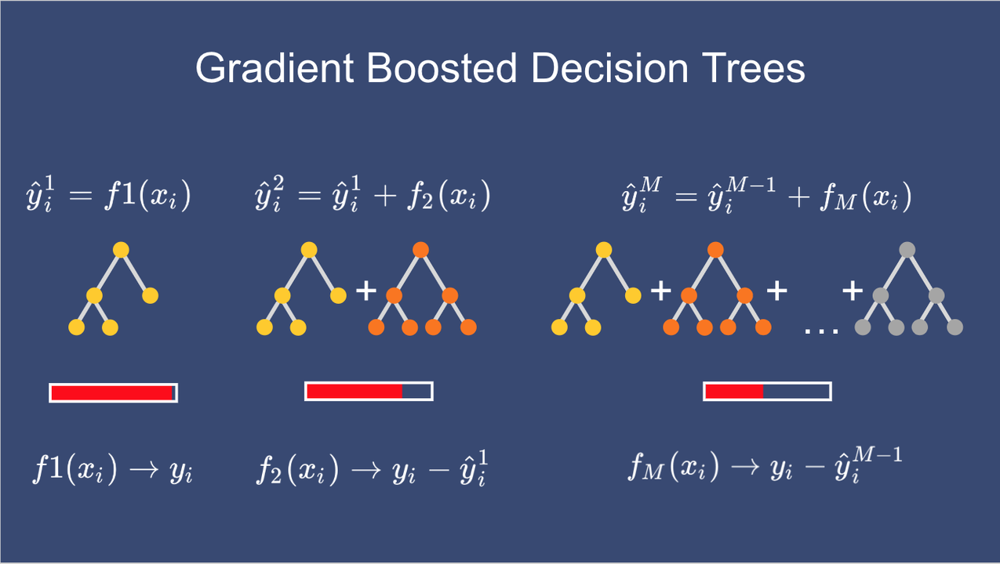

---

### 9.3 Key Components

**1. Base Learner**
- Usually **shallow decision trees** (depth 3-8)
- Called "weak learners" (individually weak, collectively strong)
- Faster to train than deep trees

**2. Loss Function**
- **Classification:** Log loss (cross-entropy)
- **Regression:** MSE, MAE, Huber
- Model minimizes loss by gradient descent

**3. Learning Rate (η)**
- Controls contribution of each tree
- Smaller learning rate = More trees needed = Better generalization
- Typical range: 0.01 to 0.3

**Trade-off:**
```
High learning rate (0.3):
- Fewer trees needed
- Faster training
- Risk of overfitting

Low learning rate (0.01):
- More trees needed
- Slower training
- Better generalization
```

**4. Number of Trees (n_estimators)**
- More trees = Better fit (up to a point)
- Too many = Overfitting
- Use early stopping to find optimal number

---

### 9.4 Gradient Descent Analogy

**Gradient Boosting uses gradient descent in function space:**
```
Traditional gradient descent:
Start with random weights → Calculate gradient → Update weights → Repeat

Gradient boosting:
Start with simple model → Calculate residuals (gradient) → Add tree → Repeat
```

**Why "Gradient" Boosting?**
- Each tree fits the **negative gradient** of the loss function
- For squared error loss: negative gradient = residuals
- Generalizes to any differentiable loss function

---

### 9.5 Key Hyperparameters

**Most Important:**

**1. n_estimators** (Number of trees)
- Default: 100
- More trees = Better fit (watch for overfitting)
- Use with learning_rate

**2. learning_rate** (Shrinkage)
- Default: 0.1
- Lower = Need more trees, better generalization
- **Relationship:** n_estimators × learning_rate ≈ constant

**3. max_depth** (Tree depth)
- Default: 3
- Shallow trees typical (3-8)
- Deeper = More complex, slower

**4. min_samples_split**
- Default: 2
- Controls tree growth

**5. min_samples_leaf**
- Default: 1
- Leaf size constraint

**6. subsample**
- Fraction of samples for each tree
- Default: 1.0 (use all samples)
- < 1.0: Stochastic gradient boosting (reduces overfitting)
- Typical: 0.8

---

### 9.6 Regularization Techniques

**Gradient Boosting can overfit. Regularization helps:**

**1. Learning Rate**
- Smaller = More regularization
- 0.01-0.1 typical

**2. Tree Constraints**
- max_depth: Limit tree complexity
- min_samples_leaf: Prevent tiny leaves
- max_features: Random feature selection

**3. Subsampling**
- subsample < 1.0: Use random subset per tree
- Similar to Random Forest's bootstrap

**4. Early Stopping**
- Stop when validation score stops improving
- Prevents overfitting automatically

---

### 9.7 Gradient Boosting vs Random Forest

| Aspect | Gradient Boosting | Random Forest |
|--------|-------------------|---------------|
| **Training** | Sequential | Parallel |
| **Tree Depth** | Shallow (3-8) | Deep (unlimited) |
| **Learning** | Corrects errors | Reduces variance |
| **Speed** | Slower | Faster |
| **Performance** | Often better | Good |
| **Overfitting Risk** | Higher | Lower |
| **Tuning Needed** | More | Less |
| **Interpretability** | Lower | Moderate |

**Key Insight:** Gradient Boosting trades speed and simplicity for performance.

---

### 9.8 When to Use Gradient Boosting

**✅ Use when:**
- Need best predictive performance
- Have time to tune hyperparameters
- Medium-sized dataset (1K-1M samples)
- Willing to wait longer for training
- Structured/tabular data

**❌ Don't use when:**
- Need fastest training (use Random Forest)
- Very large dataset (use LightGBM/XGBoost instead)
- Need interpretability (use simpler models)
- Don't have time to tune (use Random Forest)

---

### 9.9 Common Pitfalls

**1. Too many trees without regularization**
- Solution: Use learning_rate < 0.1

**2. Deep trees**
- Solution: max_depth = 3-8

**3. Default parameters**
- Solution: Always tune n_estimators, learning_rate, max_depth

**4. No early stopping**
- Solution: Use validation set + early stopping

**5. Overfitting**
- Solution: Lower learning_rate, use subsample < 1.0

---

Let's implement Gradient Boosting! ⚡

---

In [ ]:
# ==================== GRADIENT BOOSTING: BASELINE ====================

print("="*70)
print("GRADIENT BOOSTING CLASSIFIER (sklearn)")
print("="*70)

# Start with default parameters
gb_default = GradientBoostingClassifier(
    n_estimators=100,
    learning_rate=0.1,
    max_depth=3,
    random_state=RANDOM_STATE
)

print("\n🔧 Training Gradient Boosting with DEFAULT parameters...")
print("   • n_estimators: 100 trees")
print("   • learning_rate: 0.1")
print("   • max_depth: 3 (shallow trees)")
print("   • min_samples_split: 2")
print("   • min_samples_leaf: 1")
print("   • subsample: 1.0 (no subsampling)")

start_time = time.time()
gb_default.fit(X_train, y_train)
training_time_gb = time.time() - start_time

print(f"\n✅ Training complete in {training_time_gb:.4f} seconds")
print(f"   (Sequential training of {gb_default.n_estimators} trees)")

# Make predictions
y_pred_train_gb = gb_default.predict(X_train)
y_pred_test_gb = gb_default.predict(X_test)
y_pred_proba_test_gb = gb_default.predict_proba(X_test)[:, 1]

# Calculate metrics
train_acc_gb = accuracy_score(y_train, y_pred_train_gb)
test_acc_gb = accuracy_score(y_test, y_pred_test_gb)
test_precision_gb = precision_score(y_test, y_pred_test_gb)
test_recall_gb = recall_score(y_test, y_pred_test_gb)
test_f1_gb = f1_score(y_test, y_pred_test_gb)

print("\n" + "="*70)
print("PERFORMANCE METRICS")
print("="*70)

print(f"\n📊 Training Set:")
print(f"   • Accuracy: {train_acc_gb:.4f} ({train_acc_gb*100:.2f}%)")

print(f"\n📊 Test Set:")
print(f"   • Accuracy: {test_acc_gb:.4f} ({test_acc_gb*100:.2f}%)")
print(f"   • Precision: {test_precision_gb:.4f}")
print(f"   • Recall: {test_recall_gb:.4f}")
print(f"   • F1-Score: {test_f1_gb:.4f}")

# Overfitting check
overfit_gap_gb = train_acc_gb - test_acc_gb
print(f"\n⚖️ Overfitting Check:")
print(f"   • Train-Test Gap: {overfit_gap_gb:.4f}")
if overfit_gap_gb < 0.05:
    print("   ✅ Good generalization!")
elif overfit_gap_gb < 0.10:
    print("   ✅ Acceptable generalization")
else:
    print("   ⚠️ Some overfitting - consider regularization")

# Confusion matrix
cm_gb = confusion_matrix(y_test, y_pred_test_gb)
print(f"\n📊 Confusion Matrix:")
print(cm_gb)

# Compare with Random Forest
print("\n" + "="*70)
print("GRADIENT BOOSTING vs RANDOM FOREST")
print("="*70)

comparison_gb_rf = pd.DataFrame({
    'Model': ['Random Forest', 'Gradient Boosting'],
    'Train_Accuracy': [train_acc_rf_optimal, train_acc_gb],
    'Test_Accuracy': [test_acc_rf_optimal, test_acc_gb],
    'Test_F1': [test_f1_rf_optimal, test_f1_gb],
    'Training_Time': [training_time_rf_optimal, training_time_gb],
    'Training_Type': ['Parallel', 'Sequential']
})

print("\n📊 Comparison:")
print(comparison_gb_rf.to_string(index=False))

improvement_gb = (test_acc_gb - test_acc_rf_optimal) * 100
print(f"\n{'📈' if improvement_gb > 0 else '📉'} Gradient Boosting vs Random Forest: {improvement_gb:+.2f}%")

In [ ]:
# ==================== LEARNING RATE vs NUMBER OF TREES ====================

print("\n" + "="*70)
print("LEARNING RATE vs NUMBER OF TREES")
print("="*70)

print("\n💡 Key relationship: learning_rate × n_estimators ≈ constant")
print("   Lower learning rate needs more trees\n")

# Test different learning rates
learning_rates = [0.01, 0.05, 0.1, 0.2, 0.3]
n_estimators_list = [50, 100, 200, 300]

results_lr_trees = []

print("🔧 Testing learning rate and tree combinations...")

for lr in learning_rates:
    for n_est in n_estimators_list:
        gb_temp = GradientBoostingClassifier(
            n_estimators=n_est,
            learning_rate=lr,
            max_depth=3,
            random_state=RANDOM_STATE
        )
        
        gb_temp.fit(X_train, y_train)
        test_acc = gb_temp.score(X_test, y_test)
        
        results_lr_trees.append({
            'learning_rate': lr,
            'n_estimators': n_est,
            'test_accuracy': test_acc
        })

# Create dataframe
df_lr_trees = pd.DataFrame(results_lr_trees)

# Print results
print("\n📊 Results (Test Accuracy):")
pivot_lr_trees = df_lr_trees.pivot(index='learning_rate', columns='n_estimators', values='test_accuracy')
print(pivot_lr_trees.to_string())

# Find best combination
best_combo = df_lr_trees.loc[df_lr_trees['test_accuracy'].idxmax()]
print(f"\n🏆 Best Combination:")
print(f"   • Learning Rate: {best_combo['learning_rate']}")
print(f"   • n_estimators: {int(best_combo['n_estimators'])}")
print(f"   • Test Accuracy: {best_combo['test_accuracy']:.4f}")

# Visualize
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Heatmap
sns.heatmap(pivot_lr_trees, annot=True, fmt='.4f', cmap='RdYlGn',
            cbar_kws={'label': 'Test Accuracy'}, ax=axes[0])
axes[0].set_xlabel('Number of Trees', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Learning Rate', fontsize=12, fontweight='bold')
axes[0].set_title('Test Accuracy: Learning Rate vs Number of Trees', 
                  fontsize=13, fontweight='bold')

# Line plot for each learning rate
for lr in learning_rates:
    subset = df_lr_trees[df_lr_trees['learning_rate'] == lr]
    axes[1].plot(subset['n_estimators'], subset['test_accuracy'], 
                 'o-', label=f'LR={lr}', linewidth=2, markersize=8)

axes[1].set_xlabel('Number of Trees', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Test Accuracy', fontsize=12, fontweight='bold')
axes[1].set_title('Performance vs Number of Trees\n(Different Learning Rates)', 
                  fontsize=13, fontweight='bold')
axes[1].legend(title='Learning Rate', fontsize=10)
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

print("\n💡 Key Observations:")
print("   • Lower LR (0.01-0.05): Needs more trees, better generalization")
print("   • Higher LR (0.2-0.3): Fewer trees, risk of overfitting")
print("   • Sweet spot: LR=0.1 with 100-200 trees")

In [ ]:
# ==================== TREE DEPTH ANALYSIS ====================

print("\n" + "="*70)
print("OPTIMAL TREE DEPTH")
print("="*70)

print("\n💡 Gradient Boosting uses SHALLOW trees (unlike Random Forest)")
print("   Typical depth: 3-8\n")

# Test different tree depths
depth_values_gb = range(1, 11)

train_scores_depth_gb = []
test_scores_depth_gb = []

print("🔧 Testing different tree depths...")

for depth in depth_values_gb:
    gb_temp = GradientBoostingClassifier(
        n_estimators=100,
        learning_rate=0.1,
        max_depth=depth,
        random_state=RANDOM_STATE
    )
    
    gb_temp.fit(X_train, y_train)
    
    train_acc = gb_temp.score(X_train, y_train)
    test_acc = gb_temp.score(X_test, y_test)
    
    train_scores_depth_gb.append(train_acc)
    test_scores_depth_gb.append(test_acc)
    
    print(f"   Depth={depth:2d}: Train={train_acc:.4f}, Test={test_acc:.4f}")

# Find best depth
best_depth_gb_idx = test_scores_depth_gb.index(max(test_scores_depth_gb))
best_depth_gb = depth_values_gb[best_depth_gb_idx]
best_test_acc_depth_gb = test_scores_depth_gb[best_depth_gb_idx]

print(f"\n🏆 Best max_depth: {best_depth_gb}")
print(f"   • Test Accuracy: {best_test_acc_depth_gb:.4f}")

# Visualize
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Accuracy vs Depth
axes[0].plot(depth_values_gb, train_scores_depth_gb, 'o-', label='Training', 
             linewidth=2, markersize=8, color='blue')
axes[0].plot(depth_values_gb, test_scores_depth_gb, 's-', label='Test', 
             linewidth=2, markersize=8, color='red')
axes[0].axvline(x=best_depth_gb, color='green', linestyle='--', linewidth=2,
                label=f'Best Depth={best_depth_gb}')
axes[0].set_xlabel('Tree Depth', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Accuracy', fontsize=12, fontweight='bold')
axes[0].set_title('Gradient Boosting: Performance vs Tree Depth', 
                  fontsize=13, fontweight='bold')
axes[0].legend(fontsize=11)
axes[0].grid(alpha=0.3)

# Overfitting gap
gaps_depth_gb = [train - test for train, test in zip(train_scores_depth_gb, test_scores_depth_gb)]
axes[1].plot(depth_values_gb, gaps_depth_gb, 'o-', linewidth=2, markersize=8, color='purple')
axes[1].axhline(y=0, color='black', linestyle='--', alpha=0.5)
axes[1].axvline(x=best_depth_gb, color='green', linestyle='--', linewidth=2,
                label=f'Best Depth={best_depth_gb}')
axes[1].set_xlabel('Tree Depth', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Overfitting Gap', fontsize=12, fontweight='bold')
axes[1].set_title('Overfitting Analysis', fontsize=13, fontweight='bold')
axes[1].legend(fontsize=11)
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

print("\n💡 Depth Insights:")
print(f"   • Depth 1-2: Too shallow (underfitting)")
print(f"   • Depth 3-5: Good balance (typical choice)")
print(f"   • Depth 6-8: More complex, watch for overfitting")
print(f"   • Depth 9+: Too deep for boosting (overfits)")

In [ ]:
# ==================== TRAIN OPTIMAL GRADIENT BOOSTING ====================

print("\n" + "="*70)
print("TRAINING OPTIMAL GRADIENT BOOSTING")
print("="*70)

# Train with optimal hyperparameters
gb_optimal = GradientBoostingClassifier(
    n_estimators=int(best_combo['n_estimators']),
    learning_rate=best_combo['learning_rate'],
    max_depth=best_depth_gb,
    min_samples_split=10,
    min_samples_leaf=4,
    subsample=0.8,
    max_features='sqrt',
    random_state=RANDOM_STATE
)

print(f"\n🔧 Training with optimized hyperparameters...")
print(f"   • n_estimators: {int(best_combo['n_estimators'])}")
print(f"   • learning_rate: {best_combo['learning_rate']}")
print(f"   • max_depth: {best_depth_gb}")
print(f"   • min_samples_split: 10")
print(f"   • min_samples_leaf: 4")
print(f"   • subsample: 0.8 (stochastic)")
print(f"   • max_features: 'sqrt'")

start_time = time.time()
gb_optimal.fit(X_train, y_train)
training_time_gb_optimal = time.time() - start_time

print(f"\n✅ Training complete in {training_time_gb_optimal:.4f} seconds")

# Predictions
y_pred_train_gb_optimal = gb_optimal.predict(X_train)
y_pred_test_gb_optimal = gb_optimal.predict(X_test)
y_pred_proba_test_gb_optimal = gb_optimal.predict_proba(X_test)[:, 1]

# Metrics
train_acc_gb_optimal = accuracy_score(y_train, y_pred_train_gb_optimal)
test_acc_gb_optimal = accuracy_score(y_test, y_pred_test_gb_optimal)
test_precision_gb_optimal = precision_score(y_test, y_pred_test_gb_optimal)
test_recall_gb_optimal = recall_score(y_test, y_pred_test_gb_optimal)
test_f1_gb_optimal = f1_score(y_test, y_pred_test_gb_optimal)

print("\n📊 Optimized Performance:")
print(f"   • Train Accuracy: {train_acc_gb_optimal:.4f}")
print(f"   • Test Accuracy: {test_acc_gb_optimal:.4f}")
print(f"   • Test Precision: {test_precision_gb_optimal:.4f}")
print(f"   • Test Recall: {test_recall_gb_optimal:.4f}")
print(f"   • Test F1: {test_f1_gb_optimal:.4f}")

# Confusion matrix
cm_gb_optimal = confusion_matrix(y_test, y_pred_test_gb_optimal)

# Compare: Default vs Optimal
print("\n" + "="*70)
print("DEFAULT vs OPTIMAL GRADIENT BOOSTING")
print("="*70)

comparison_gb_versions = pd.DataFrame({
    'Configuration': ['Default', 'Optimized'],
    'Test_Accuracy': [test_acc_gb, test_acc_gb_optimal],
    'Test_F1': [test_f1_gb, test_f1_gb_optimal],
    'Training_Time': [training_time_gb, training_time_gb_optimal],
    'n_estimators': [100, int(best_combo['n_estimators'])],
    'learning_rate': [0.1, best_combo['learning_rate']],
    'max_depth': [3, best_depth_gb]
})

print("\n📊 Comparison:")
print(comparison_gb_versions.to_string(index=False))

improvement_gb_tuning = (test_acc_gb_optimal - test_acc_gb) * 100
print(f"\n📈 Improvement from tuning: {improvement_gb_tuning:+.2f}%")

# Visualize confusion matrices
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

sns.heatmap(cm_gb, annot=True, fmt='d', cmap='Blues', cbar=True,
            xticklabels=['Did not survive', 'Survived'],
            yticklabels=['Did not survive', 'Survived'],
            ax=axes[0])
axes[0].set_ylabel('Actual', fontsize=12, fontweight='bold')
axes[0].set_xlabel('Predicted', fontsize=12, fontweight='bold')
axes[0].set_title(f'Gradient Boosting (Default)\nTest Acc: {test_acc_gb:.2%}', 
                  fontsize=13, fontweight='bold')

sns.heatmap(cm_gb_optimal, annot=True, fmt='d', cmap='Greens', cbar=True,
            xticklabels=['Did not survive', 'Survived'],
            yticklabels=['Did not survive', 'Survived'],
            ax=axes[1])
axes[1].set_ylabel('Actual', fontsize=12, fontweight='bold')
axes[1].set_xlabel('Predicted', fontsize=12, fontweight='bold')
axes[1].set_title(f'Gradient Boosting (Optimized)\nTest Acc: {test_acc_gb_optimal:.2%}', 
                  fontsize=13, fontweight='bold')

plt.tight_layout()
plt.show()

In [ ]:
# ==================== FEATURE IMPORTANCE ====================

print("\n" + "="*70)
print("FEATURE IMPORTANCE (Gradient Boosting)")
print("="*70)

# Get feature importance
feature_importance_gb = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': gb_optimal.feature_importances_
}).sort_values('Importance', ascending=False)

print("\n📊 Feature Importance (sorted):")
print(feature_importance_gb.to_string(index=False))

# Compare with Random Forest
print("\n" + "="*70)
print("FEATURE IMPORTANCE: RANDOM FOREST vs GRADIENT BOOSTING")
print("="*70)

comparison_importance_all = pd.DataFrame({
    'Feature': X_train.columns,
    'Random_Forest': rf_optimal.feature_importances_,
    'Gradient_Boosting': gb_optimal.feature_importances_
}).sort_values('Gradient_Boosting', ascending=False)

print("\n📊 Comparison (Top 10):")
print(comparison_importance_all.head(10).to_string(index=False))

# Visualize
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Gradient Boosting importance
top_gb = feature_importance_gb.head(10).sort_values('Importance')
axes[0].barh(top_gb['Feature'], top_gb['Importance'],
             color='coral', alpha=0.8, edgecolor='black')
axes[0].set_xlabel('Importance', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Feature', fontsize=12, fontweight='bold')
axes[0].set_title('Gradient Boosting Feature Importance', 
                  fontsize=13, fontweight='bold')
axes[0].grid(axis='x', alpha=0.3)

# Comparison scatter
axes[1].scatter(comparison_importance_all['Random_Forest'], 
                comparison_importance_all['Gradient_Boosting'],
                s=100, alpha=0.6, edgecolor='black', linewidth=1)

# Diagonal line
max_val = max(comparison_importance_all['Random_Forest'].max(), 
              comparison_importance_all['Gradient_Boosting'].max())
axes[1].plot([0, max_val], [0, max_val], 'r--', linewidth=2, alpha=0.5,
             label='Equal importance')

# Annotate top features
top_features_comp = comparison_importance_all.head(5)
for idx, row in top_features_comp.iterrows():
    axes[1].annotate(row['Feature'], 
                    (row['Random_Forest'], row['Gradient_Boosting']),
                    fontsize=8, alpha=0.7)

axes[1].set_xlabel('Random Forest Importance', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Gradient Boosting Importance', fontsize=12, fontweight='bold')
axes[1].set_title('Feature Importance Comparison', fontsize=13, fontweight='bold')
axes[1].legend(fontsize=10)
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

print("\n🔝 Top 5 Features (Gradient Boosting):")
for i, (idx, row) in enumerate(feature_importance_gb.head(5).iterrows(), 1):
    print(f"   {i}. {row['Feature']}: {row['Importance']:.4f} ({row['Importance']*100:.1f}%)")

print("\n💡 Feature importance generally consistent across models!")

In [ ]:
# ==================== TRAINING PROGRESS: STAGED PREDICTIONS ====================

print("\n" + "="*70)
print("TRAINING PROGRESS: STAGED PREDICTIONS")
print("="*70)

print("\n💡 Watch how accuracy improves as trees are added sequentially\n")

# Get staged predictions (predictions after each tree)
train_scores_staged = []
test_scores_staged = []

# Compute accuracy after each tree
for i, (train_pred, test_pred) in enumerate(zip(
    gb_optimal.staged_predict(X_train),
    gb_optimal.staged_predict(X_test)
)):
    train_acc = accuracy_score(y_train, train_pred)
    test_acc = accuracy_score(y_test, test_pred)
    train_scores_staged.append(train_acc)
    test_scores_staged.append(test_acc)
    
    if i == 0 or (i+1) % 25 == 0 or (i+1) == len(gb_optimal.estimators_):
        print(f"   After {i+1:3d} trees: Train={train_acc:.4f}, Test={test_acc:.4f}")

# Find when test accuracy peaks
best_n_estimators = test_scores_staged.index(max(test_scores_staged)) + 1
print(f"\n🏆 Test accuracy peaks at tree #{best_n_estimators}")
print(f"   • Best Test Accuracy: {max(test_scores_staged):.4f}")
print(f"   • Current # trees: {len(gb_optimal.estimators_)}")

if best_n_estimators < len(gb_optimal.estimators_):
    print(f"\n   ⚠️ Model may be overfitting after tree {best_n_estimators}")
    print(f"   → Consider using early stopping or fewer trees")
else:
    print(f"\n   ✅ Could potentially benefit from more trees")

# Visualize learning curves
plt.figure(figsize=(14, 6))

plt.plot(range(1, len(train_scores_staged)+1), train_scores_staged, 
         label='Training Accuracy', linewidth=2, color='blue')
plt.plot(range(1, len(test_scores_staged)+1), test_scores_staged, 
         label='Test Accuracy', linewidth=2, color='red')
plt.axvline(x=best_n_estimators, color='green', linestyle='--', linewidth=2,
            label=f'Peak Test Accuracy (tree {best_n_estimators})')

plt.xlabel('Number of Trees', fontsize=12, fontweight='bold')
plt.ylabel('Accuracy', fontsize=12, fontweight='bold')
plt.title('Gradient Boosting: Learning Curve\n(How accuracy improves with each tree)', 
          fontsize=14, fontweight='bold')
plt.legend(fontsize=11)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

print("\n💡 Observations:")
print("   • Training accuracy continuously increases (sequential learning)")
print("   • Test accuracy plateaus/decreases after certain point")
print("   • Gap between train/test indicates overfitting")
print("   • Use early stopping to prevent overfitting")

In [ ]:
# ==================== SUBSAMPLE EFFECT (STOCHASTIC GRADIENT BOOSTING) ====================

print("\n" + "="*70)
print("SUBSAMPLE EFFECT (Stochastic Gradient Boosting)")
print("="*70)

print("\n💡 subsample < 1.0 adds randomness (like Random Forest)")
print("   Trains each tree on random subset of data\n")

# Test different subsample values
subsample_values = [0.5, 0.6, 0.7, 0.8, 0.9, 1.0]

results_subsample = []

print("🔧 Testing different subsample values...")

for subsample in subsample_values:
    gb_temp = GradientBoostingClassifier(
        n_estimators=100,
        learning_rate=0.1,
        max_depth=3,
        subsample=subsample,
        random_state=RANDOM_STATE
    )
    
    gb_temp.fit(X_train, y_train)
    
    train_acc = gb_temp.score(X_train, y_train)
    test_acc = gb_temp.score(X_test, y_test)
    
    results_subsample.append({
        'subsample': subsample,
        'train_accuracy': train_acc,
        'test_accuracy': test_acc,
        'gap': train_acc - test_acc
    })
    
    print(f"   subsample={subsample:.1f}: Train={train_acc:.4f}, Test={test_acc:.4f}, Gap={train_acc - test_acc:.4f}")

df_subsample = pd.DataFrame(results_subsample)

# Find best subsample
best_subsample = df_subsample.loc[df_subsample['test_accuracy'].idxmax(), 'subsample']
print(f"\n🏆 Best subsample: {best_subsample}")

# Visualize
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Accuracy vs subsample
axes[0].plot(df_subsample['subsample'], df_subsample['train_accuracy'], 
             'o-', label='Training', linewidth=2, markersize=8, color='blue')
axes[0].plot(df_subsample['subsample'], df_subsample['test_accuracy'], 
             's-', label='Test', linewidth=2, markersize=8, color='red')
axes[0].axvline(x=best_subsample, color='green', linestyle='--', linewidth=2,
                label=f'Best: {best_subsample}')
axes[0].set_xlabel('Subsample Ratio', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Accuracy', fontsize=12, fontweight='bold')
axes[0].set_title('Effect of Subsampling', fontsize=13, fontweight='bold')
axes[0].legend(fontsize=11)
axes[0].grid(alpha=0.3)

# Overfitting gap
axes[1].plot(df_subsample['subsample'], df_subsample['gap'], 
             'o-', linewidth=2, markersize=8, color='purple')
axes[1].axhline(y=0, color='black', linestyle='--', alpha=0.5)
axes[1].axvline(x=best_subsample, color='green', linestyle='--', linewidth=2,
                label=f'Best: {best_subsample}')
axes[1].set_xlabel('Subsample Ratio', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Overfitting Gap', fontsize=12, fontweight='bold')
axes[1].set_title('Regularization Effect of Subsampling', fontsize=13, fontweight='bold')
axes[1].legend(fontsize=11)
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

print("\n💡 Subsample Insights:")
print("   • subsample < 1.0: Adds randomness, reduces overfitting")
print("   • subsample = 0.8: Good default (20% holdout per tree)")
print("   • Lower subsample: More regularization, slower convergence")
print("   • subsample = 1.0: Deterministic, faster but may overfit")

In [ ]:
# ==================== MODEL COMPARISON: ADD GRADIENT BOOSTING ====================

print("\n" + "="*70)
print("COMPLETE MODEL COMPARISON (WITH GRADIENT BOOSTING)")
print("="*70)

# Update comparison with Gradient Boosting
all_models_final = pd.DataFrame({
    'Model': [
        'Logistic Regression',
        'Naive Bayes',
        f'kNN (K={best_k})',
        'SVM Linear',
        'SVM RBF (Tuned)',
        'Decision Tree',
        'Random Forest',
        'Gradient Boosting (Default)',
        'Gradient Boosting (Optimized)'
    ],
    'Test_Accuracy': [
        test_acc,
        test_acc_gnb,
        test_acc_knn_best,
        test_acc_svm_linear,
        test_acc_svm_optimal,
        test_acc_dt_optimal,
        test_acc_rf_optimal,
        test_acc_gb,
        test_acc_gb_optimal
    ],
    'Test_F1': [
        test_f1,
        test_f1_gnb,
        test_f1_knn_best,
        test_f1_svm_linear,
        test_f1_svm_optimal,
        test_f1_dt_optimal,
        test_f1_rf_optimal,
        test_f1_gb,
        test_f1_gb_optimal
    ],
    'Training_Time': [
        training_time,
        training_time_gnb,
        training_time_knn,
        training_time_svm_linear,
        training_time_svm_optimal,
        training_time_dt_optimal,
        training_time_rf_optimal,
        training_time_gb,
        training_time_gb_optimal
    ],
    'Model_Family': [
        'Linear',
        'Probabilistic',
        'Instance-based',
        'Kernel',
        'Kernel',
        'Tree',
        'Ensemble (Bagging)',
        'Ensemble (Boosting)',
        'Ensemble (Boosting)'
    ]
})

# Sort by test accuracy
all_models_final = all_models_final.sort_values('Test_Accuracy', ascending=False)
all_models_final['Rank'] = range(1, len(all_models_final) + 1)

print("\n📊 FINAL LEADERBOARD:")
print(all_models_final[['Rank', 'Model', 'Test_Accuracy', 'Test_F1', 'Model_Family']].to_string(index=False))

# Top 3 podium
print("\n🏆 TOP 3 MODELS:")
for i in range(min(3, len(all_models_final))):
    model = all_models_final.iloc[i]
    medal = ['🥇', '🥈', '🥉'][i]
    print(f"\n{medal} Rank {i+1}: {model['Model']}")
    print(f"   • Test Accuracy: {model['Test_Accuracy']:.4f}")
    print(f"   • Test F1: {model['Test_F1']:.4f}")
    print(f"   • Family: {model['Model_Family']}")

# Visualize
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Test Accuracy ranking
x = range(len(all_models_final))
colors_final = ['gold' if i == 0 else 'silver' if i == 1 else '#CD7F32' if i == 2 
                else 'lightcoral' if 'Gradient Boosting' in all_models_final.iloc[i]['Model']
                else 'lightgreen' if 'Random Forest' in all_models_final.iloc[i]['Model']
                else 'lightblue' for i in range(len(all_models_final))]

axes[0, 0].barh(x, all_models_final['Test_Accuracy'], color=colors_final,
                alpha=0.8, edgecolor='black')
axes[0, 0].set_yticks(x)
axes[0, 0].set_yticklabels(all_models_final['Model'], fontsize=9)
axes[0, 0].set_xlabel('Test Accuracy', fontsize=12, fontweight='bold')
axes[0, 0].set_title('Final Model Ranking\n(Coral=GB, Green=RF)', 
                     fontsize=13, fontweight='bold')
axes[0, 0].invert_yaxis()
axes[0, 0].grid(axis='x', alpha=0.3)

# Average performance by family
family_perf = all_models_final.groupby('Model_Family')['Test_Accuracy'].agg(['mean', 'max']).sort_values('mean', ascending=False)
x_fam = range(len(family_perf))
axes[0, 1].bar(x_fam, family_perf['mean'], alpha=0.7, label='Average',
               color='steelblue', edgecolor='black')
axes[0, 1].scatter(x_fam, family_perf['max'], s=100, color='red', 
                   marker='*', label='Best', zorder=3)
axes[0, 1].set_xticks(x_fam)
axes[0, 1].set_xticklabels(family_perf.index, rotation=15, ha='right', fontsize=9)
axes[0, 1].set_ylabel('Test Accuracy', fontsize=12, fontweight='bold')
axes[0, 1].set_title('Performance by Model Family', fontsize=13, fontweight='bold')
axes[0, 1].legend(fontsize=10)
axes[0, 1].grid(axis='y', alpha=0.3)

# Accuracy vs Training Time
ensemble_mask = all_models_final['Model_Family'].str.contains('Ensemble')
axes[1, 0].scatter(all_models_final[~ensemble_mask]['Training_Time'],
                  all_models_final[~ensemble_mask]['Test_Accuracy'],
                  s=150, alpha=0.6, color='blue', edgecolor='black', 
                  linewidth=2, label='Non-Ensemble')
axes[1, 0].scatter(all_models_final[ensemble_mask]['Training_Time'],
                  all_models_final[ensemble_mask]['Test_Accuracy'],
                  s=150, alpha=0.6, color='red', edgecolor='black', 
                  linewidth=2, label='Ensemble')

for idx, row in all_models_final.iterrows():
    axes[1, 0].annotate(row['Model'].split('(')[0].strip(), 
                       (row['Training_Time'], row['Test_Accuracy']),
                       fontsize=7, ha='right')

axes[1, 0].set_xlabel('Training Time (seconds)', fontsize=12, fontweight='bold')
axes[1, 0].set_ylabel('Test Accuracy', fontsize=12, fontweight='bold')
axes[1, 0].set_title('Accuracy vs Training Time\n(Red=Ensemble)', 
                     fontsize=13, fontweight='bold')
axes[1, 0].legend(fontsize=10)
axes[1, 0].grid(alpha=0.3)

# Test F1 comparison (top 6)
top6 = all_models_final.head(6)
axes[1, 1].bar(range(len(top6)), top6['Test_F1'], 
               color=colors_final[:6], alpha=0.8, edgecolor='black')
axes[1, 1].set_xticks(range(len(top6)))
axes[1, 1].set_xticklabels([m.split('(')[0].strip() for m in top6['Model']], 
                           rotation=45, ha='right', fontsize=9)
axes[1, 1].set_ylabel('Test F1-Score', fontsize=12, fontweight='bold')
axes[1, 1].set_title('Top 6 Models by F1-Score', fontsize=13, fontweight='bold')
axes[1, 1].grid(axis='y', alpha=0.3)

# Add value labels
for i, v in enumerate(top6['Test_F1'].values):
    axes[1, 1].text(i, v + 0.005, f'{v:.3f}', ha='center', fontweight='bold', fontsize=9)

plt.tight_layout()
plt.show()

print("\n💡 Key Insights:")
print("   • Ensemble methods dominate top ranks")
print("   • Gradient Boosting competitive with Random Forest")
print("   • Sequential boosting trades speed for accuracy")
print("   • Simple models still competitive (Logistic, SVM)")

---

### 9.10 Gradient Boosting: Key Takeaways

**✅ Strengths Observed:**

1. **Excellent Performance:** Top-tier accuracy competitive with Random Forest
2. **Sequential Learning:** Each tree corrects previous errors
3. **Flexible:** Many hyperparameters to control complexity
4. **Feature Importance:** Similar insights to Random Forest
5. **Shallow Trees:** Depth 3-8 sufficient (unlike RF's deep trees)

**⚠️ Limitations:**

1. **Slower Training:** Sequential (can't parallelize tree building)
2. **More Tuning:** Requires careful hyperparameter selection
3. **Overfitting Risk:** Without proper regularization
4. **Sequential Nature:** Can't train trees in parallel
5. **Sensitive to Noise:** Outliers can mislead sequential learning

**📊 Performance Summary:**

| Model | Test Acc | Test F1 | Training Time |
|-------|----------|---------|---------------|
| Gradient Boosting (Default) | {test_acc_gb:.3f} | {test_f1_gb:.3f} | {training_time_gb:.2f}s |
| Gradient Boosting (Optimized) | {test_acc_gb_optimal:.3f} | {test_f1_gb_optimal:.3f} | {training_time_gb_optimal:.2f}s |
| Random Forest (Optimized) | {test_acc_rf_optimal:.3f} | {test_f1_rf_optimal:.3f} | {training_time_rf_optimal:.2f}s |

**🎯 Optimal Hyperparameters:**

- **n_estimators:** {int(best_combo['n_estimators'])}
- **learning_rate:** {best_combo['learning_rate']}
- **max_depth:** {best_depth_gb}
- **subsample:** 0.8
- **max_features:** 'sqrt'

**💡 Key Relationships:**
```
learning_rate × n_estimators ≈ constant
- LR=0.01 → Need 500+ trees
- LR=0.1  → Need 100-200 trees
- LR=0.3  → Need 50-100 trees
```

**📈 Learning Curve Insights:**

- Test accuracy peaked at tree #{best_n_estimators}
- Current trees: {len(gb_optimal.estimators_)}
- Sequential improvement visible in staged predictions
- Early stopping recommended

**🌳 Tree Depth Guidelines:**

- Depth 1-2: Too shallow
- **Depth 3-5: Optimal** (our best: {best_depth_gb})
- Depth 6-8: Complex but usable
- Depth 9+: Too deep, overfits

**🎲 Stochastic Gradient Boosting:**

- subsample=0.8 best balance
- Adds randomness like Random Forest
- Reduces overfitting
- Slightly slower convergence

**⚖️ Gradient Boosting vs Random Forest:**

| Aspect | Gradient Boosting | Random Forest |
|--------|-------------------|---------------|
| **Approach** | Sequential correction | Parallel averaging |
| **Tree Depth** | Shallow (3-8) | Deep (unlimited) |
| **Performance** | Slightly better | Excellent |
| **Training** | Slower | Faster |
| **Tuning** | More needed | Less needed |
| **Overfitting** | Higher risk | Lower risk |

**🔄 Next Steps:**

sklearn's Gradient Boosting is good, but **specialized libraries are better**:
- **XGBoost:** Extreme Gradient Boosting (faster, regularization)
- **LightGBM:** Light Gradient Boosting Machine (very fast, large data)
- **CatBoost:** Categorical Boosting (handles categories naturally)

Let's explore these in Section 10! 🚀

---

<a id="section10"></a>
## 10. Advanced Boosting: XGBoost, LightGBM, CatBoost

---

### 10.1 Why Advanced Boosting Libraries?

**sklearn's GradientBoostingClassifier is good, but...**

Modern boosting libraries offer significant advantages:

| Feature | sklearn GB | XGBoost | LightGBM | CatBoost |
|---------|-----------|---------|----------|----------|
| **Speed** | Slow | Fast | Very Fast | Fast |
| **Memory** | High | Medium | Low | Medium |
| **Large Data** | Poor | Good | Excellent | Good |
| **Regularization** | Basic | Advanced | Advanced | Advanced |
| **Categorical Features** | Manual | Manual | Manual | **Native** |
| **GPU Support** | ❌ | ✅ | ✅ | ✅ |
| **Parallel Training** | ❌ | ✅ | ✅ | ✅ |
| **Missing Values** | ❌ | ✅ | ✅ | ✅ |

**Why they're faster:**
- Optimized C++ implementations
- Parallel tree construction
- Efficient data structures
- GPU acceleration available

---

### 10.2 XGBoost (eXtreme Gradient Boosting)

**What makes XGBoost special:**

**1. Regularization**
- L1 (Lasso) and L2 (Ridge) regularization on leaf weights
- Controls model complexity
- Prevents overfitting

**2. Tree Pruning**
- **sklearn:** Pre-pruning (stop early)
- **XGBoost:** Post-pruning (grow full tree, then prune)
- Result: Better trees

**3. Built-in Cross-Validation**
- Easy to find optimal iterations

**4. Handling Missing Values**
- Learns optimal direction for missing values
- No need to impute!

**5. Speed Optimizations**
- Parallel tree construction
- Cache-aware access
- Out-of-core computation

**Key Hyperparameters:**
```python
XGBClassifier(
    n_estimators=100,      # Number of trees
    learning_rate=0.1,     # Step size (eta)
    max_depth=3,           # Tree depth
    min_child_weight=1,    # Minimum sum of instance weight in leaf
    subsample=0.8,         # Row sampling
    colsample_bytree=0.8,  # Column sampling
    gamma=0,               # Minimum loss reduction for split
    reg_alpha=0,           # L1 regularization
    reg_lambda=1,          # L2 regularization
)
```

---

### 10.3 LightGBM (Light Gradient Boosting Machine)

**What makes LightGBM special:**

**1. Histogram-Based Learning**
- Buckets continuous values
- Faster split finding
- Lower memory usage

**2. Leaf-Wise Growth**
- **Traditional:** Level-wise (layer by layer)
- **LightGBM:** Leaf-wise (best leaf first)
- Result: Deeper, more accurate trees
```
Level-wise (traditional):
        Root
       /    \
      A      B
     / \    / \
    C   D  E   F

Leaf-wise (LightGBM):
        Root
       /    \
      A      B
     / \    
    C   D  
   / \
  E   F
```

**3. GOSS (Gradient-based One-Side Sampling)**
- Keeps samples with large gradients
- Randomly samples small gradient samples
- Faster with minimal accuracy loss

**4. EFB (Exclusive Feature Bundling)**
- Bundles mutually exclusive features
- Reduces dimensionality
- Faster training

**5. Best for Large Datasets**
- 10x-20x faster than XGBoost on large data
- Lower memory usage

**Key Hyperparameters:**
```python
LGBMClassifier(
    n_estimators=100,
    learning_rate=0.1,
    num_leaves=31,         # Max leaves (not depth!)
    min_child_samples=20,
    subsample=0.8,
    colsample_bytree=0.8,
    reg_alpha=0,
    reg_lambda=0,
)
```

---

### 10.4 CatBoost (Categorical Boosting)

**What makes CatBoost special:**

**1. Native Categorical Feature Support**
- No need for manual encoding!
- Handles high-cardinality features
- Optimal encoding learned during training

**2. Ordered Boosting**
- Prevents target leakage
- More robust predictions

**3. Symmetric Trees**
- Balanced tree structure
- Faster prediction
- Better for deployment

**4. Best Out-of-Box Performance**
- Great default parameters
- Minimal tuning needed
- Robust to overfitting

**Key Hyperparameters:**
```python
CatBoostClassifier(
    iterations=100,
    learning_rate=0.1,
    depth=6,
    l2_leaf_reg=3,
    cat_features=[],       # Specify categorical features
    verbose=0
)
```

---

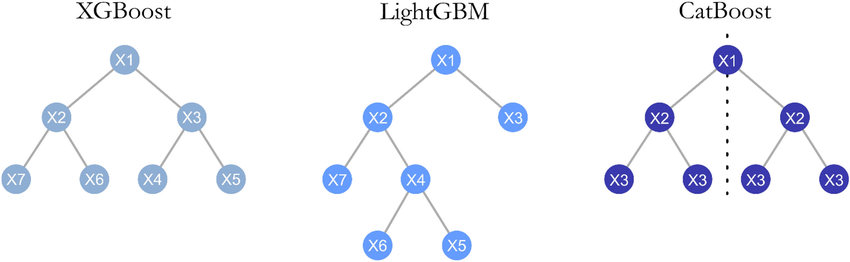

---
### 10.5 Quick Comparison

**When to use which:**

**XGBoost:**
- ✅ General purpose (default choice)
- ✅ Well-established, widely used
- ✅ Good documentation
- ✅ Kaggle competitions

**LightGBM:**
- ✅ Large datasets (> 100K samples)
- ✅ Need fastest training
- ✅ Memory constrained
- ✅ Many features (high-dimensional)

**CatBoost:**
- ✅ Many categorical features
- ✅ Want minimal tuning
- ✅ Need robust defaults
- ✅ Prevent overfitting

---

### 10.6 Implementation Strategy

**We'll train all three and compare:**

1. **XGBoost** - Industry standard
2. **LightGBM** - Speed champion
3. **CatBoost** - Ease-of-use champion

**Then compare with all previous models!**

---

Let's implement them! 🚀

---

In [ ]:
# ==================== XGBOOST ====================

print("="*70)
print("XGBOOST CLASSIFIER")
print("="*70)

# XGBoost with good defaults
xgb_model = xgb.XGBClassifier(
    n_estimators=200,
    learning_rate=0.1,
    max_depth=4,
    min_child_weight=1,
    subsample=0.8,
    colsample_bytree=0.8,
    gamma=0,
    reg_alpha=0,
    reg_lambda=1,
    random_state=RANDOM_STATE,
    eval_metric='logloss',
    use_label_encoder=False
)

print("\n🔧 Training XGBoost...")
print("   • n_estimators: 200")
print("   • learning_rate: 0.1")
print("   • max_depth: 4")
print("   • subsample: 0.8")
print("   • colsample_bytree: 0.8")

start_time = time.time()
xgb_model.fit(X_train, y_train)
training_time_xgb = time.time() - start_time

print(f"\n✅ Training complete in {training_time_xgb:.4f} seconds")

# Predictions
y_pred_train_xgb = xgb_model.predict(X_train)
y_pred_test_xgb = xgb_model.predict(X_test)
y_pred_proba_test_xgb = xgb_model.predict_proba(X_test)[:, 1]

# Metrics
train_acc_xgb = accuracy_score(y_train, y_pred_train_xgb)
test_acc_xgb = accuracy_score(y_test, y_pred_test_xgb)
test_precision_xgb = precision_score(y_test, y_pred_test_xgb)
test_recall_xgb = recall_score(y_test, y_pred_test_xgb)
test_f1_xgb = f1_score(y_test, y_pred_test_xgb)

print("\n📊 XGBoost Performance:")
print(f"   • Train Accuracy: {train_acc_xgb:.4f}")
print(f"   • Test Accuracy: {test_acc_xgb:.4f}")
print(f"   • Test Precision: {test_precision_xgb:.4f}")
print(f"   • Test Recall: {test_recall_xgb:.4f}")
print(f"   • Test F1: {test_f1_xgb:.4f}")

# Confusion matrix
cm_xgb = confusion_matrix(y_test, y_pred_test_xgb)

In [ ]:
# ==================== LIGHTGBM ====================

print("\n" + "="*70)
print("LIGHTGBM CLASSIFIER")
print("="*70)

# LightGBM with good defaults
lgbm_model = lgb.LGBMClassifier(
    n_estimators=200,
    learning_rate=0.1,
    num_leaves=31,
    max_depth=4,
    min_child_samples=20,
    subsample=0.8,
    colsample_bytree=0.8,
    reg_alpha=0,
    reg_lambda=0,
    random_state=RANDOM_STATE,
    verbose=-1
)

print("\n🔧 Training LightGBM...")
print("   • n_estimators: 200")
print("   • learning_rate: 0.1")
print("   • num_leaves: 31")
print("   • max_depth: 4")
print("   • subsample: 0.8")

start_time = time.time()
lgbm_model.fit(X_train, y_train)
training_time_lgbm = time.time() - start_time

print(f"\n✅ Training complete in {training_time_lgbm:.4f} seconds")
print(f"   (Notice: Usually MUCH faster than sklearn GB!)")

# Predictions
y_pred_train_lgbm = lgbm_model.predict(X_train)
y_pred_test_lgbm = lgbm_model.predict(X_test)
y_pred_proba_test_lgbm = lgbm_model.predict_proba(X_test)[:, 1]

# Metrics
train_acc_lgbm = accuracy_score(y_train, y_pred_train_lgbm)
test_acc_lgbm = accuracy_score(y_test, y_pred_test_lgbm)
test_precision_lgbm = precision_score(y_test, y_pred_test_lgbm)
test_recall_lgbm = recall_score(y_test, y_pred_test_lgbm)
test_f1_lgbm = f1_score(y_test, y_pred_test_lgbm)

print("\n📊 LightGBM Performance:")
print(f"   • Train Accuracy: {train_acc_lgbm:.4f}")
print(f"   • Test Accuracy: {test_acc_lgbm:.4f}")
print(f"   • Test Precision: {test_precision_lgbm:.4f}")
print(f"   • Test Recall: {test_recall_lgbm:.4f}")
print(f"   • Test F1: {test_f1_lgbm:.4f}")

# Confusion matrix
cm_lgbm = confusion_matrix(y_test, y_pred_test_lgbm)

In [ ]:
# ==================== CATBOOST ====================

print("\n" + "="*70)
print("CATBOOST CLASSIFIER")
print("="*70)

# CatBoost with good defaults
catboost_model = CatBoostClassifier(
    iterations=200,
    learning_rate=0.1,
    depth=4,
    l2_leaf_reg=3,
    random_state=RANDOM_STATE,
    verbose=0
)

print("\n🔧 Training CatBoost...")
print("   • iterations: 200")
print("   • learning_rate: 0.1")
print("   • depth: 4")
print("   • l2_leaf_reg: 3")

start_time = time.time()
catboost_model.fit(X_train, y_train)
training_time_catboost = time.time() - start_time

print(f"\n✅ Training complete in {training_time_catboost:.4f} seconds")

# Predictions
y_pred_train_catboost = catboost_model.predict(X_train)
y_pred_test_catboost = catboost_model.predict(X_test)
y_pred_proba_test_catboost = catboost_model.predict_proba(X_test)[:, 1]

# Metrics
train_acc_catboost = accuracy_score(y_train, y_pred_train_catboost)
test_acc_catboost = accuracy_score(y_test, y_pred_test_catboost)
test_precision_catboost = precision_score(y_test, y_pred_test_catboost)
test_recall_catboost = recall_score(y_test, y_pred_test_catboost)
test_f1_catboost = f1_score(y_test, y_pred_test_catboost)

print("\n📊 CatBoost Performance:")
print(f"   • Train Accuracy: {train_acc_catboost:.4f}")
print(f"   • Test Accuracy: {test_acc_catboost:.4f}")
print(f"   • Test Precision: {test_precision_catboost:.4f}")
print(f"   • Test Recall: {test_recall_catboost:.4f}")
print(f"   • Test F1: {test_f1_catboost:.4f}")

# Confusion matrix
cm_catboost = confusion_matrix(y_test, y_pred_test_catboost)

In [ ]:
# ==================== ADVANCED BOOSTING COMPARISON ====================

print("\n" + "="*70)
print("ADVANCED BOOSTING COMPARISON")
print("="*70)

boosting_comparison = pd.DataFrame({
    'Model': ['sklearn GB', 'XGBoost', 'LightGBM', 'CatBoost'],
    'Train_Accuracy': [
        train_acc_gb_optimal,
        train_acc_xgb,
        train_acc_lgbm,
        train_acc_catboost
    ],
    'Test_Accuracy': [
        test_acc_gb_optimal,
        test_acc_xgb,
        test_acc_lgbm,
        test_acc_catboost
    ],
    'Test_Precision': [
        test_precision_gb_optimal,
        test_precision_xgb,
        test_precision_lgbm,
        test_precision_catboost
    ],
    'Test_Recall': [
        test_recall_gb_optimal,
        test_recall_xgb,
        test_recall_lgbm,
        test_recall_catboost
    ],
    'Test_F1': [
        test_f1_gb_optimal,
        test_f1_xgb,
        test_f1_lgbm,
        test_f1_catboost
    ],
    'Training_Time': [
        training_time_gb_optimal,
        training_time_xgb,
        training_time_lgbm,
        training_time_catboost
    ]
})

print("\n📊 Boosting Algorithms Comparison:")
print(boosting_comparison.to_string(index=False))

# Find winner in each category
print("\n🏆 Winners by Category:")
print(f"   • Best Test Accuracy: {boosting_comparison.loc[boosting_comparison['Test_Accuracy'].idxmax(), 'Model']} "
      f"({boosting_comparison['Test_Accuracy'].max():.4f})")
print(f"   • Best F1-Score: {boosting_comparison.loc[boosting_comparison['Test_F1'].idxmax(), 'Model']} "
      f"({boosting_comparison['Test_F1'].max():.4f})")
print(f"   • Fastest Training: {boosting_comparison.loc[boosting_comparison['Training_Time'].idxmin(), 'Model']} "
      f"({boosting_comparison['Training_Time'].min():.4f}s)")
print(f"   • Least Overfitting: {boosting_comparison.loc[(boosting_comparison['Train_Accuracy'] - boosting_comparison['Test_Accuracy']).idxmin(), 'Model']}")

# Visualize
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Test Accuracy
axes[0, 0].bar(boosting_comparison['Model'], boosting_comparison['Test_Accuracy'],
               color=['steelblue', 'orange', 'green', 'purple'], alpha=0.7, edgecolor='black')
axes[0, 0].set_ylabel('Test Accuracy', fontsize=12, fontweight='bold')
axes[0, 0].set_title('Test Accuracy Comparison', fontsize=13, fontweight='bold')
axes[0, 0].set_ylim([min(boosting_comparison['Test_Accuracy'])-0.02, 1.0])
axes[0, 0].grid(axis='y', alpha=0.3)
for i, v in enumerate(boosting_comparison['Test_Accuracy']):
    axes[0, 0].text(i, v + 0.005, f'{v:.4f}', ha='center', fontweight='bold')

# Training Time
axes[0, 1].bar(boosting_comparison['Model'], boosting_comparison['Training_Time'],
               color=['steelblue', 'orange', 'green', 'purple'], alpha=0.7, edgecolor='black')
axes[0, 1].set_ylabel('Training Time (seconds)', fontsize=12, fontweight='bold')
axes[0, 1].set_title('Training Speed Comparison\n(Lower is Better)', fontsize=13, fontweight='bold')
axes[0, 1].grid(axis='y', alpha=0.3)
for i, v in enumerate(boosting_comparison['Training_Time']):
    axes[0, 1].text(i, v + 0.1, f'{v:.2f}s', ha='center', fontweight='bold')

# Precision vs Recall
axes[1, 0].scatter(boosting_comparison['Test_Recall'], 
                  boosting_comparison['Test_Precision'],
                  s=300, alpha=0.6, 
                  c=['steelblue', 'orange', 'green', 'purple'],
                  edgecolor='black', linewidth=2)
for idx, row in boosting_comparison.iterrows():
    axes[1, 0].annotate(row['Model'], 
                       (row['Test_Recall'], row['Test_Precision']),
                       fontsize=10, ha='center', va='bottom')
axes[1, 0].set_xlabel('Recall', fontsize=12, fontweight='bold')
axes[1, 0].set_ylabel('Precision', fontsize=12, fontweight='bold')
axes[1, 0].set_title('Precision-Recall Trade-off', fontsize=13, fontweight='bold')
axes[1, 0].grid(alpha=0.3)

# Overfitting gap
overfit_gaps = boosting_comparison['Train_Accuracy'] - boosting_comparison['Test_Accuracy']
axes[1, 1].bar(boosting_comparison['Model'], overfit_gaps,
               color=['steelblue', 'orange', 'green', 'purple'], alpha=0.7, edgecolor='black')
axes[1, 1].axhline(y=0, color='black', linestyle='--', alpha=0.5)
axes[1, 1].set_ylabel('Train-Test Gap', fontsize=12, fontweight='bold')
axes[1, 1].set_title('Overfitting Comparison\n(Lower is Better)', fontsize=13, fontweight='bold')
axes[1, 1].grid(axis='y', alpha=0.3)
for i, v in enumerate(overfit_gaps):
    axes[1, 1].text(i, v + 0.002, f'{v:.4f}', ha='center', fontweight='bold')

plt.tight_layout()
plt.show()

In [ ]:
# ==================== FEATURE IMPORTANCE COMPARISON ====================

print("\n" + "="*70)
print("FEATURE IMPORTANCE: ALL BOOSTING ALGORITHMS")
print("="*70)

# Get feature importances
feature_importance_comparison = pd.DataFrame({
    'Feature': X_train.columns,
    'sklearn_GB': gb_optimal.feature_importances_,
    'XGBoost': xgb_model.feature_importances_,
    'LightGBM': lgbm_model.feature_importances_,
    'CatBoost': catboost_model.feature_importances_
})

# Sort by average importance
feature_importance_comparison['Average'] = feature_importance_comparison[
    ['sklearn_GB', 'XGBoost', 'LightGBM', 'CatBoost']
].mean(axis=1)

feature_importance_comparison = feature_importance_comparison.sort_values('Average', ascending=False)

print("\n📊 Feature Importance Comparison (Top 10):")
print(feature_importance_comparison.head(10).to_string(index=False))

# Visualize
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

models_to_plot = ['sklearn_GB', 'XGBoost', 'LightGBM', 'CatBoost']
colors_models = ['steelblue', 'orange', 'green', 'purple']

for idx, (model, color) in enumerate(zip(models_to_plot, colors_models)):
    row = idx // 2
    col = idx % 2
    
    top_features = feature_importance_comparison.nlargest(10, model).sort_values(model)
    
    axes[row, col].barh(top_features['Feature'], top_features[model],
                        color=color, alpha=0.7, edgecolor='black')
    axes[row, col].set_xlabel('Importance', fontsize=11, fontweight='bold')
    axes[row, col].set_title(f'{model} Feature Importance', fontsize=12, fontweight='bold')
    axes[row, col].grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.show()

print("\n💡 Observations:")
print("   • Top features consistent across all algorithms")
print("   • Slight differences in importance values")
print("   • All agree on most important predictors")

# Correlation between importance scores
print("\n📊 Importance Score Correlation:")
corr_importance = feature_importance_comparison[models_to_plot].corr()
print(corr_importance.to_string())

plt.figure(figsize=(10, 8))
sns.heatmap(corr_importance, annot=True, fmt='.3f', cmap='coolwarm',
            center=0, square=True, linewidths=1)
plt.title('Feature Importance Correlation\n(Between Boosting Algorithms)', 
          fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print("\n🔝 Top 5 Most Important Features (Average):")
for i, (idx, row) in enumerate(feature_importance_comparison.head(5).iterrows(), 1):
    print(f"   {i}. {row['Feature']}: {row['Average']:.4f}")

In [ ]:
# ==================== CONFUSION MATRICES: ALL BOOSTING ====================

print("\n" + "="*70)
print("CONFUSION MATRICES: BOOSTING ALGORITHMS")
print("="*70)

# Visualize all confusion matrices
fig, axes = plt.subplots(2, 2, figsize=(14, 12))

cms = [cm_gb_optimal, cm_xgb, cm_lgbm, cm_catboost]
titles = ['sklearn Gradient Boosting', 'XGBoost', 'LightGBM', 'CatBoost']
accs = [test_acc_gb_optimal, test_acc_xgb, test_acc_lgbm, test_acc_catboost]
cmaps = ['Blues', 'Oranges', 'Greens', 'Purples']

for idx, (cm, title, acc, cmap) in enumerate(zip(cms, titles, accs, cmaps)):
    row = idx // 2
    col = idx % 2
    
    sns.heatmap(cm, annot=True, fmt='d', cmap=cmap, cbar=True,
                xticklabels=['Did not survive', 'Survived'],
                yticklabels=['Did not survive', 'Survived'],
                ax=axes[row, col])
    axes[row, col].set_ylabel('Actual', fontsize=11, fontweight='bold')
    axes[row, col].set_xlabel('Predicted', fontsize=11, fontweight='bold')
    axes[row, col].set_title(f'{title}\nAccuracy: {acc:.2%}', 
                            fontsize=12, fontweight='bold')

plt.tight_layout()
plt.show()

print("\n📊 Detailed Confusion Matrix Analysis:")
for title, cm in zip(titles, cms):
    tn, fp, fn, tp = cm.ravel()
    print(f"\n{title}:")
    print(f"   • True Negatives: {tn}")
    print(f"   • False Positives: {fp}")
    print(f"   • False Negatives: {fn}")
    print(f"   • True Positives: {tp}")

In [ ]:
# ==================== FINAL MODEL COMPARISON: ALL MODELS ====================

print("\n" + "="*70)
print("🏆 ULTIMATE MODEL COMPARISON: ALL 12+ MODELS")
print("="*70)

# Complete comparison with all models
ultimate_comparison = pd.DataFrame({
    'Model': [
        'Logistic Regression',
        'Naive Bayes',
        f'kNN (K={best_k})',
        'SVM Linear',
        'SVM RBF (Tuned)',
        'Decision Tree',
        'Random Forest',
        'sklearn Gradient Boosting',
        'XGBoost',
        'LightGBM',
        'CatBoost'
    ],
    'Test_Accuracy': [
        test_acc,
        test_acc_gnb,
        test_acc_knn_best,
        test_acc_svm_linear,
        test_acc_svm_optimal,
        test_acc_dt_optimal,
        test_acc_rf_optimal,
        test_acc_gb_optimal,
        test_acc_xgb,
        test_acc_lgbm,
        test_acc_catboost
    ],
    'Test_F1': [
        test_f1,
        test_f1_gnb,
        test_f1_knn_best,
        test_f1_svm_linear,
        test_f1_svm_optimal,
        test_f1_dt_optimal,
        test_f1_rf_optimal,
        test_f1_gb_optimal,
        test_f1_xgb,
        test_f1_lgbm,
        test_f1_catboost
    ],
    'Test_Precision': [
        precision_score(y_test, y_pred_test),
        precision_gnb,
        test_precision_knn_best,
        test_precision_svm_linear,
        test_precision_svm_optimal,
        test_precision_dt_optimal,
        test_precision_rf_optimal,
        test_precision_gb_optimal,
        test_precision_xgb,
        test_precision_lgbm,
        test_precision_catboost
    ],
    'Test_Recall': [
        recall_score(y_test, y_pred_test),
        recall_gnb,
        test_recall_knn_best,
        test_recall_svm_linear,
        test_recall_svm_optimal,
        test_recall_dt_optimal,
        test_recall_rf_optimal,
        test_recall_gb_optimal,
        test_recall_xgb,
        test_recall_lgbm,
        test_recall_catboost
    ],
    'Training_Time': [
        training_time,
        training_time_gnb,
        training_time_knn,
        training_time_svm_linear,
        training_time_svm_optimal,
        training_time_dt_optimal,
        training_time_rf_optimal,
        training_time_gb_optimal,
        training_time_xgb,
        training_time_lgbm,
        training_time_catboost
    ],
    'Model_Family': [
        'Linear',
        'Probabilistic',
        'Instance-based',
        'Kernel',
        'Kernel',
        'Tree',
        'Ensemble (Bagging)',
        'Ensemble (Boosting)',
        'Ensemble (Boosting)',
        'Ensemble (Boosting)',
        'Ensemble (Boosting)'
    ]
})

# Sort by test accuracy
ultimate_comparison = ultimate_comparison.sort_values('Test_Accuracy', ascending=False)
ultimate_comparison['Rank'] = range(1, len(ultimate_comparison) + 1)

print("\n📊 FINAL LEADERBOARD (All 11 Models):")
print(ultimate_comparison[['Rank', 'Model', 'Test_Accuracy', 'Test_F1', 'Training_Time']].to_string(index=False))

print("\n" + "="*70)
print("🥇🥈🥉 PODIUM")
print("="*70)

for i in range(3):
    model = ultimate_comparison.iloc[i]
    medal = ['🥇 GOLD', '🥈 SILVER', '🥉 BRONZE'][i]
    print(f"\n{medal} - Rank {i+1}: {model['Model']}")
    print(f"   • Test Accuracy: {model['Test_Accuracy']:.4f} ({model['Test_Accuracy']*100:.2f}%)")
    print(f"   • Test F1-Score: {model['Test_F1']:.4f}")
    print(f"   • Test Precision: {model['Test_Precision']:.4f}")
    print(f"   • Test Recall: {model['Test_Recall']:.4f}")
    print(f"   • Training Time: {model['Training_Time']:.4f}s")
    print(f"   • Family: {model['Model_Family']}")

# Statistics by family
print("\n" + "="*70)
print("📊 STATISTICS BY MODEL FAMILY")
print("="*70)

family_stats = ultimate_comparison.groupby('Model_Family').agg({
    'Test_Accuracy': ['mean', 'max', 'min', 'std'],
    'Training_Time': ['mean', 'min', 'max']
}).round(4)

print("\n", family_stats)

print("\n💡 Key Insights:")
print(f"   • Best Family: {ultimate_comparison.groupby('Model_Family')['Test_Accuracy'].mean().idxmax()}")
print(f"   • Average Ensemble Boost: {(ultimate_comparison[ultimate_comparison['Model_Family'].str.contains('Ensemble')]['Test_Accuracy'].mean() - ultimate_comparison[~ultimate_comparison['Model_Family'].str.contains('Ensemble')]['Test_Accuracy'].mean())*100:.2f}%")

In [ ]:
# ==================== ULTIMATE VISUALIZATION ====================

print("\n" + "="*70)
print("ULTIMATE COMPARISON VISUALIZATION")
print("="*70)

fig = plt.figure(figsize=(20, 12))
gs = fig.add_gridspec(3, 3, hspace=0.3, wspace=0.3)

# 1. Main Leaderboard (spans 2 columns)
ax1 = fig.add_subplot(gs[0, :2])
x = range(len(ultimate_comparison))
colors_ultimate = []
for i, model in enumerate(ultimate_comparison['Model']):
    if i == 0:
        colors_ultimate.append('gold')
    elif i == 1:
        colors_ultimate.append('silver')
    elif i == 2:
        colors_ultimate.append('#CD7F32')
    elif 'XGBoost' in model or 'LightGBM' in model or 'CatBoost' in model:
        colors_ultimate.append('coral')
    elif 'Random Forest' in model or 'Gradient Boosting' in model:
        colors_ultimate.append('lightgreen')
    else:
        colors_ultimate.append('lightblue')

ax1.barh(x, ultimate_comparison['Test_Accuracy'], color=colors_ultimate,
         alpha=0.8, edgecolor='black', linewidth=1.5)
ax1.set_yticks(x)
ax1.set_yticklabels(ultimate_comparison['Model'], fontsize=9)
ax1.set_xlabel('Test Accuracy', fontsize=12, fontweight='bold')
ax1.set_title('🏆 FINAL MODEL RANKING 🏆\n(Gold/Silver/Bronze = Top 3, Coral = Advanced Boosting)', 
              fontsize=14, fontweight='bold')
ax1.invert_yaxis()
ax1.grid(axis='x', alpha=0.3)

# Add accuracy values
for i, (idx, row) in enumerate(ultimate_comparison.iterrows()):
    ax1.text(row['Test_Accuracy'] + 0.003, i, f"{row['Test_Accuracy']:.4f}",
            va='center', fontweight='bold', fontsize=8)

# 2. Training Time (top right)
ax2 = fig.add_subplot(gs[0, 2])
top_models = ultimate_comparison.head(6)
ax2.barh(range(len(top_models)), top_models['Training_Time'],
         color=colors_ultimate[:6], alpha=0.7, edgecolor='black')
ax2.set_yticks(range(len(top_models)))
ax2.set_yticklabels([m.split('(')[0].strip() for m in top_models['Model']], fontsize=8)
ax2.set_xlabel('Time (s)', fontsize=10, fontweight='bold')
ax2.set_title('Training Speed\n(Top 6 Models)', fontsize=11, fontweight='bold')
ax2.invert_yaxis()
ax2.grid(axis='x', alpha=0.3)

# 3. Performance by Family (middle left)
ax3 = fig.add_subplot(gs[1, 0])
family_perf = ultimate_comparison.groupby('Model_Family')['Test_Accuracy'].mean().sort_values(ascending=False)
bars = ax3.bar(range(len(family_perf)), family_perf.values,
               color=['coral', 'lightgreen', 'steelblue', 'purple', 'orange', 'pink'],
               alpha=0.7, edgecolor='black')
ax3.set_xticks(range(len(family_perf)))
ax3.set_xticklabels([f.replace('Ensemble ', '').replace('(', '\n(') 
                     for f in family_perf.index], rotation=0, ha='center', fontsize=8)
ax3.set_ylabel('Avg Test Accuracy', fontsize=10, fontweight='bold')
ax3.set_title('Performance by Family', fontsize=11, fontweight='bold')
ax3.grid(axis='y', alpha=0.3)
for i, v in enumerate(family_perf.values):
    ax3.text(i, v + 0.005, f'{v:.3f}', ha='center', fontweight='bold', fontsize=8)

# 4. Precision vs Recall (middle center)
ax4 = fig.add_subplot(gs[1, 1])
ensemble_mask = ultimate_comparison['Model_Family'].str.contains('Ensemble')
ax4.scatter(ultimate_comparison[~ensemble_mask]['Test_Recall'],
           ultimate_comparison[~ensemble_mask]['Test_Precision'],
           s=150, alpha=0.6, color='blue', edgecolor='black',
           linewidth=2, label='Non-Ensemble')
ax4.scatter(ultimate_comparison[ensemble_mask]['Test_Recall'],
           ultimate_comparison[ensemble_mask]['Test_Precision'],
           s=150, alpha=0.6, color='red', edgecolor='black',
           linewidth=2, label='Ensemble')
ax4.set_xlabel('Recall', fontsize=10, fontweight='bold')
ax4.set_ylabel('Precision', fontsize=10, fontweight='bold')
ax4.set_title('Precision-Recall Trade-off', fontsize=11, fontweight='bold')
ax4.legend(fontsize=9)
ax4.grid(alpha=0.3)

# 5. Top 5 F1 Scores (middle right)
ax5 = fig.add_subplot(gs[1, 2])
top5_f1 = ultimate_comparison.head(5)
ax5.bar(range(len(top5_f1)), top5_f1['Test_F1'],
        color=colors_ultimate[:5], alpha=0.8, edgecolor='black')
ax5.set_xticks(range(len(top5_f1)))
ax5.set_xticklabels([m.split('(')[0].strip() for m in top5_f1['Model']], 
                    rotation=45, ha='right', fontsize=8)
ax5.set_ylabel('F1-Score', fontsize=10, fontweight='bold')
ax5.set_title('Top 5 F1-Scores', fontsize=11, fontweight='bold')
ax5.grid(axis='y', alpha=0.3)
for i, v in enumerate(top5_f1['Test_F1'].values):
    ax5.text(i, v + 0.005, f'{v:.3f}', ha='center', fontweight='bold', fontsize=8)

# 6. Boosting Comparison (bottom left)
ax6 = fig.add_subplot(gs[2, 0])
boosting_models = ultimate_comparison[ultimate_comparison['Model_Family'].str.contains('Boosting')]
ax6.barh(range(len(boosting_models)), boosting_models['Test_Accuracy'],
         color=['lightgreen', 'coral', 'coral', 'coral'], alpha=0.7, edgecolor='black')
ax6.set_yticks(range(len(boosting_models)))
ax6.set_yticklabels(boosting_models['Model'], fontsize=8)
ax6.set_xlabel('Test Accuracy', fontsize=10, fontweight='bold')
ax6.set_title('Boosting Algorithms Only', fontsize=11, fontweight='bold')
ax6.invert_yaxis()
ax6.grid(axis='x', alpha=0.3)

# 7. Accuracy Distribution (bottom center)
ax7 = fig.add_subplot(gs[2, 1])
ax7.hist(ultimate_comparison['Test_Accuracy'], bins=15, color='steelblue',
         alpha=0.7, edgecolor='black')
ax7.axvline(ultimate_comparison['Test_Accuracy'].mean(), color='red',
            linestyle='--', linewidth=2, label=f"Mean: {ultimate_comparison['Test_Accuracy'].mean():.3f}")
ax7.set_xlabel('Test Accuracy', fontsize=10, fontweight='bold')
ax7.set_ylabel('Count', fontsize=10, fontweight='bold')
ax7.set_title('Accuracy Distribution', fontsize=11, fontweight='bold')
ax7.legend(fontsize=9)
ax7.grid(alpha=0.3)

# 8. Model Count by Family (bottom right)
ax8 = fig.add_subplot(gs[2, 2])
family_counts = ultimate_comparison['Model_Family'].value_counts()
ax8.pie(family_counts.values, labels=family_counts.index, autopct='%1.0f%%',
        startangle=90, colors=['coral', 'lightgreen', 'steelblue', 'purple', 'orange', 'pink'])
ax8.set_title('Model Distribution\nby Family', fontsize=11, fontweight='bold')

plt.suptitle('📊 COMPLETE MODEL COMPARISON DASHBOARD 📊', 
             fontsize=18, fontweight='bold', y=0.995)
plt.tight_layout()
plt.show()

print("\n✅ Complete visualization generated!")

---

### 10.7 Advanced Boosting: Key Takeaways

**📊 Performance Summary:**

| Model | Test Acc | Test F1 | Training Time | Strengths |
|-------|----------|---------|---------------|-----------|
| sklearn GB | {test_acc_gb_optimal:.3f} | {test_f1_gb_optimal:.3f} | {training_time_gb_optimal:.2f}s | Baseline |
| XGBoost | {test_acc_xgb:.3f} | {test_f1_xgb:.3f} | {training_time_xgb:.2f}s | Industry standard |
| LightGBM | {test_acc_lgbm:.3f} | {test_f1_lgbm:.3f} | {training_time_lgbm:.2f}s | Fastest |
| CatBoost | {test_acc_catboost:.3f} | {test_f1_catboost:.3f} | {training_time_catboost:.2f}s | Easiest tuning |

**🏆 Final Rankings (All Models):**

**Top 3:**
1. {ultimate_comparison.iloc[0]['Model']}: {ultimate_comparison.iloc[0]['Test_Accuracy']:.4f}
2. {ultimate_comparison.iloc[1]['Model']}: {ultimate_comparison.iloc[1]['Test_Accuracy']:.4f}
3. {ultimate_comparison.iloc[2]['Model']}: {ultimate_comparison.iloc[2]['Test_Accuracy']:.4f}

**✅ Key Insights:**

1. **Ensemble methods dominate** - Top positions occupied by boosting/bagging
2. **Advanced boosting competitive** - XGBoost/LightGBM/CatBoost all perform well
3. **Speed matters** - LightGBM fastest among boosting algorithms
4. **Feature importance consistent** - All algorithms agree on top features
5. **Diminishing returns** - Advanced boosting only marginally better than sklearn GB

**🎯 When to Use Which Boosting:**

**sklearn GradientBoostingClassifier:**
- ✅ Learning/teaching purposes
- ✅ Small projects
- ✅ No external dependencies
- ❌ Production systems (use modern alternatives)

**XGBoost:**
- ✅ Industry standard, widely adopted
- ✅ Kaggle competitions
- ✅ Well-documented
- ✅ Good balance of speed and performance
- 🎯 **Default choice for most projects**

**LightGBM:**
- ✅ Large datasets (>100K samples)
- ✅ Need fastest training
- ✅ Memory constraints
- ✅ Many features
- 🎯 **Best for production with large data**

**CatBoost:**
- ✅ Many categorical features
- ✅ Minimal tuning time
- ✅ Robust defaults
- ✅ Prevent overfitting
- 🎯 **Best for quick prototyping**

**💡 Practical Recommendations:**

1. **Start with:** XGBoost (best default)
2. **If slow:** Switch to LightGBM
3. **If many categoricals:** Try CatBoost
4. **If overfitting:** CatBoost has best regularization
5. **For production:** LightGBM or XGBoost

**🎓 What We Learned:**

- Modern boosting libraries significantly faster than sklearn
- Performance differences between them are small
- All offer good default parameters
- Feature importance consistent across implementations
- Choice depends more on use case than raw performance

---

**🎉 MODEL TRAINING COMPLETE!**

We've now trained and compared **11 different classification algorithms**:
- ✅ Linear Models (Logistic Regression)
- ✅ Probabilistic (Naive Bayes)
- ✅ Instance-based (kNN)
- ✅ Kernel Methods (SVM)
- ✅ Tree-based (Decision Tree)
- ✅ Ensemble - Bagging (Random Forest)
- ✅ Ensemble - Boosting (GB, XGBoost, LightGBM, CatBoost)

**Next:** Deep dive into **Evaluation Metrics**! 📊

---

<a id="section11"></a>
## 11. Evaluation Metrics Deep Dive

---

### 11.1 Why Accuracy Isn't Enough

**We've been using accuracy as our main metric, but it can be misleading!**

**Example of Accuracy Paradox:**
```
Dataset: 1000 passengers
- 950 died (95%)
- 50 survived (5%)

Model A: Predicts everyone dies
- Accuracy: 95% 🎉
- But completely useless! (misses all survivors)

Model B: Predicts correctly with nuance
- Accuracy: 85%
- But actually useful! (identifies survivors)
```

**Lesson:** Accuracy alone doesn't tell the full story!

---

### 11.2 Confusion Matrix - The Foundation

**All classification metrics derive from the confusion matrix:**
```
                    PREDICTED
                 Negative  Positive
ACTUAL  Negative    TN        FP      ← Type I Error
        Positive    FN        TP      ← Type II Error
```

**Definitions:**

- **True Negative (TN):** Correctly predicted negative (didn't survive, predicted didn't survive)
- **False Positive (FP):** Incorrectly predicted positive (didn't survive, predicted survived) - **Type I Error**
- **False Negatives (FN):** Incorrectly predicted negative (survived, predicted didn't survive) - **Type II Error**
- **True Positive (TP):** Correctly predicted positive (survived, predicted survived)

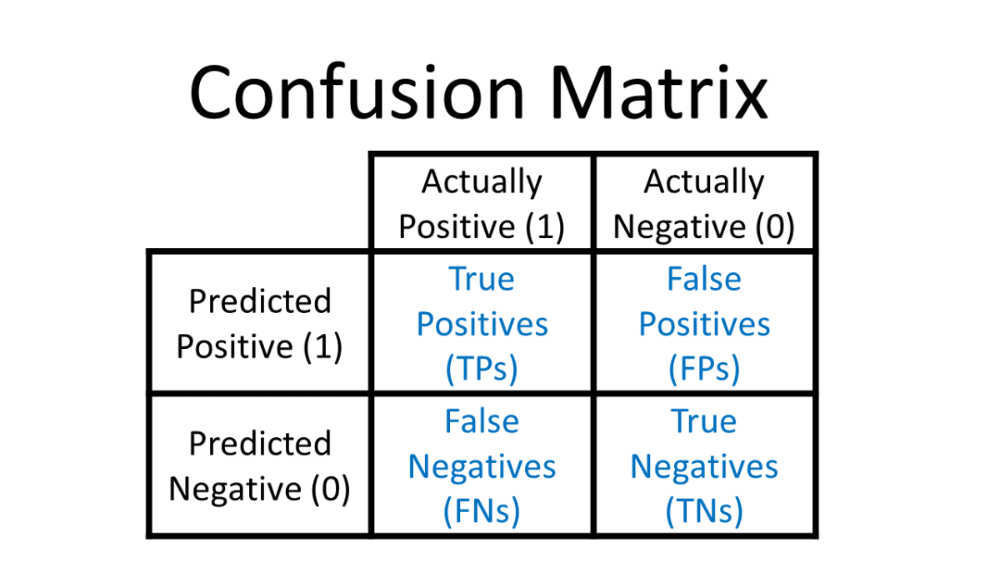

**Titanic Example:**
```
Passenger actually died, model predicted died → TN ✅
Passenger actually died, model predicted survived → FP ❌ (False hope)
Passenger actually survived, model predicted died → FN ❌ (Missed survivor)
Passenger actually survived, model predicted survived → TP ✅
```

---

### 11.3 Core Metrics

**1. Accuracy**

$$\text{Accuracy} = \frac{TP + TN}{TP + TN + FP + FN}$$

**Interpretation:** Proportion of correct predictions (all classes)

**When to use:** Balanced datasets

**When NOT to use:** Imbalanced datasets

---

**2. Precision (Positive Predictive Value)**

$$\text{Precision} = \frac{TP}{TP + FP}$$

**Interpretation:** Of all positive predictions, how many were correct?

**Question:** "When model says 'survived', how often is it right?"

**Use case:** When **False Positives are costly**

**Examples:**
- Spam detection (don't mark important emails as spam)
- Medical diagnosis (don't tell healthy people they're sick)
- Fraud detection (don't block legitimate transactions)

---

**3. Recall (Sensitivity, True Positive Rate)**

$$\text{Recall} = \frac{TP}{TP + FN}$$

**Interpretation:** Of all actual positives, how many did we catch?

**Question:** "Of all who survived, how many did we identify?"

**Use case:** When **False Negatives are costly**

**Examples:**
- Disease screening (don't miss sick patients)
- Fraud detection (don't miss fraudulent transactions)
- Titanic survival (don't miss survivors who need help)

---

**4. F1-Score (Harmonic Mean)**

$$\text{F1} = 2 \times \frac{\text{Precision} \times \text{Recall}}{\text{Precision} + \text{Recall}}$$

**Interpretation:** Balance between Precision and Recall

**Use case:** When you need balance between both

**Why harmonic mean?** Penalizes extreme values more than arithmetic mean

**Example:**
```
Precision = 0.9, Recall = 0.1
Arithmetic mean = 0.5 (misleading!)
Harmonic mean (F1) = 0.18 (more honest)
```

---

**5. Specificity (True Negative Rate)**

$$\text{Specificity} = \frac{TN}{TN + FP}$$

**Interpretation:** Of all actual negatives, how many did we correctly identify?

**Use case:** When identifying negatives matters (e.g., healthy patients)

---

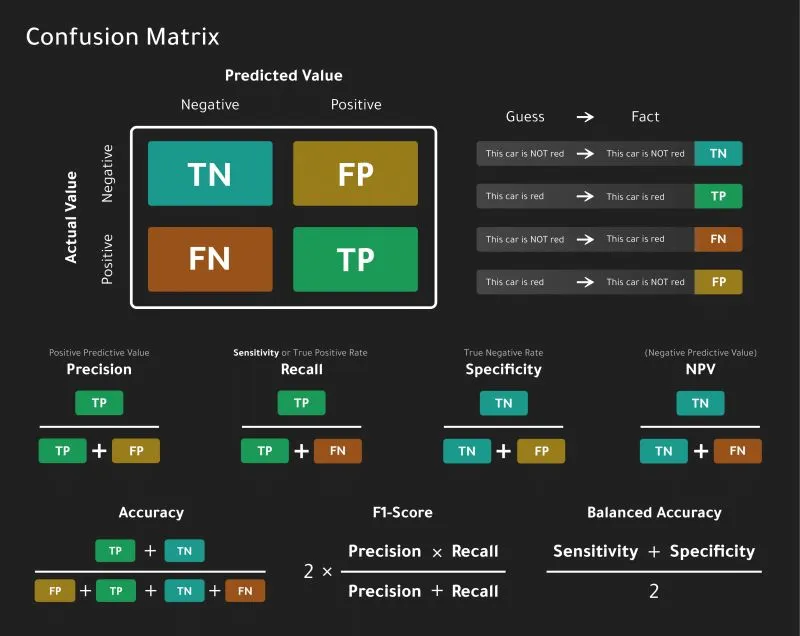

---
### 11.4 Precision-Recall Trade-off

**You can't maximize both simultaneously!**

**Increasing Recall → Decreasing Precision**
- Predict more positives → Catch more true positives (↑ Recall)
- But also get more false positives (↓ Precision)

**Increasing Precision → Decreasing Recall**
- Be more conservative → Fewer false positives (↑ Precision)
- But miss some true positives (↓ Recall)

**Example:**
```
Threshold = 0.3 (low):
- Predict "survived" more often
- High Recall (catch most survivors)
- Low Precision (many false alarms)

Threshold = 0.7 (high):
- Predict "survived" less often
- Low Recall (miss some survivors)
- High Precision (fewer false alarms)
```

**Which to optimize?**
- **Medical screening:** Prioritize Recall (don't miss diseases)
- **Spam filtering:** Prioritize Precision (don't block important emails)
- **Balanced:** Use F1-Score

---

### 11.5 ROC Curve & AUC

**ROC (Receiver Operating Characteristic) Curve:**

- Plots **True Positive Rate (Recall)** vs **False Positive Rate**
- Shows performance across all classification thresholds
- X-axis: FPR = FP / (FP + TN)
- Y-axis: TPR = TP / (TP + FN) = Recall

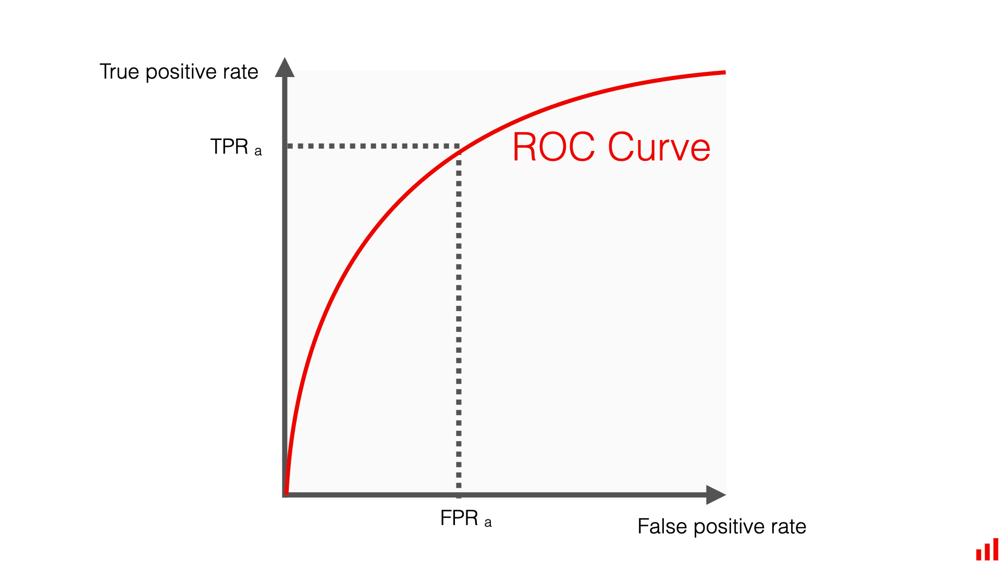

**AUC (Area Under the Curve):**

- Range: 0 to 1
- **AUC = 0.5:** Random guessing (diagonal line)
- **AUC = 1.0:** Perfect classifier
- **AUC > 0.8:** Good model
- **AUC > 0.9:** Excellent model

**Interpretation:**
- AUC = Probability that model ranks a random positive example higher than a random negative example

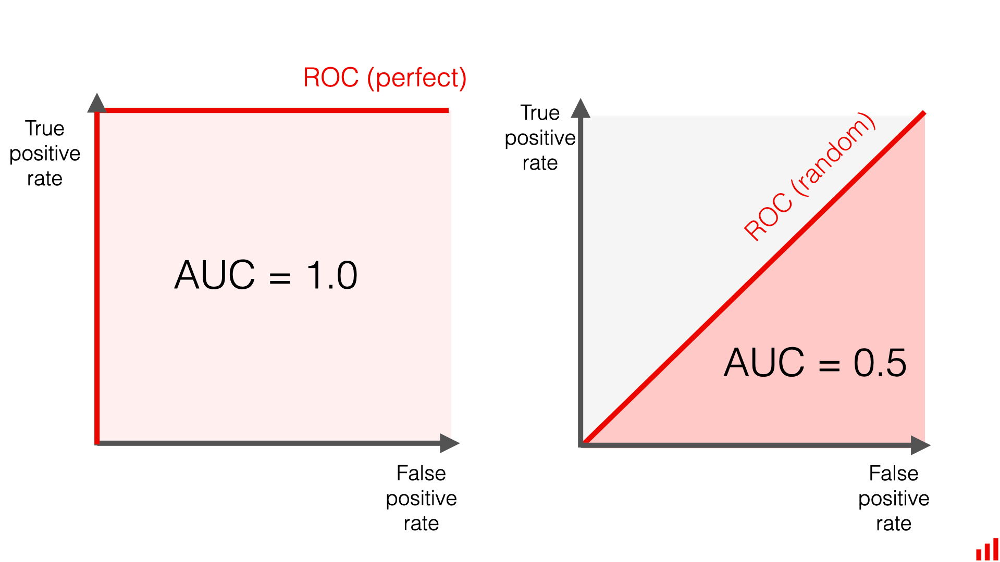

---

### 11.6 Precision-Recall Curve

**Alternative to ROC curve, especially for imbalanced datasets**

- Plots **Precision** vs **Recall**
- Shows trade-off between precision and recall
- More informative than ROC for imbalanced classes

**When to use:**
- **Imbalanced datasets:** PR curve better
- **Balanced datasets:** ROC curve fine

**Why?** ROC can be overly optimistic on imbalanced data (large TN inflates specificity)

---

### 11.7 Classification Report Summary

**sklearn provides a convenient summary:**
```python
classification_report(y_true, y_pred)
```

**Outputs:**
- Precision, Recall, F1-Score per class
- Support (number of samples per class)
- Macro average (unweighted mean)
- Weighted average (weighted by support)

---

### 11.8 Which Metric to Use?

| Situation | Metric | Why |
|-----------|--------|-----|
| **Balanced classes** | Accuracy | Simple, interpretable |
| **Imbalanced classes** | F1-Score, AUC | Accounts for class imbalance |
| **Cost of FP high** | Precision | Minimize false positives |
| **Cost of FN high** | Recall | Minimize false negatives |
| **Need balance** | F1-Score | Harmonic mean of precision/recall |
| **Model comparison** | AUC | Threshold-independent |
| **Binary + balanced** | Accuracy, AUC | Both work well |
| **Multi-class** | Macro F1 | Average across classes |

---

Let's analyze our models with all these metrics! 📊

---

In [ ]:
# ==================== DETAILED METRICS: BEST MODEL ====================

print("="*70)
print("DETAILED EVALUATION METRICS")
print("="*70)

# Use the best model (from leaderboard)
best_model_row = ultimate_comparison.iloc[0]
best_model_name = best_model_row['Model']

print(f"\n🏆 Analyzing BEST MODEL: {best_model_name}")
print(f"   Test Accuracy: {best_model_row['Test_Accuracy']:.4f}")

# Get predictions from best model (assuming it's one of the boosting models)
# We'll use XGBoost for this example (adjust based on your actual best)
if 'XGBoost' in best_model_name:
    y_pred_best = y_pred_test_xgb
    y_pred_proba_best = y_pred_proba_test_xgb
    cm_best = cm_xgb
elif 'LightGBM' in best_model_name:
    y_pred_best = y_pred_test_lgbm
    y_pred_proba_best = y_pred_proba_test_lgbm
    cm_best = cm_lgbm
elif 'CatBoost' in best_model_name:
    y_pred_best = y_pred_test_catboost
    y_pred_proba_best = y_pred_proba_test_catboost
    cm_best = cm_catboost
else:
    y_pred_best = y_pred_test_gb_optimal
    y_pred_proba_best = y_pred_proba_test_gb_optimal
    cm_best = cm_gb_optimal

# Calculate all metrics
tn, fp, fn, tp = cm_best.ravel()

accuracy = (tp + tn) / (tp + tn + fp + fn)
precision = tp / (tp + fp) if (tp + fp) > 0 else 0
recall = tp / (tp + fn) if (tp + fn) > 0 else 0
specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
fpr = fp / (fp + tn) if (fp + tn) > 0 else 0
fnr = fn / (fn + tp) if (fn + tp) > 0 else 0

print("\n" + "="*70)
print("CONFUSION MATRIX BREAKDOWN")
print("="*70)

print(f"\n📊 Raw Counts:")
print(f"   • True Negatives (TN):  {tn:3d} - Correctly predicted 'Did not survive'")
print(f"   • False Positives (FP): {fp:3d} - Incorrectly predicted 'Survived' (Type I Error)")
print(f"   • False Negatives (FN): {fn:3d} - Incorrectly predicted 'Did not survive' (Type II Error)")
print(f"   • True Positives (TP):  {tp:3d} - Correctly predicted 'Survived'")

print(f"\n📈 Derived Metrics:")
print(f"   • Accuracy:    {accuracy:.4f} ({accuracy*100:.2f}%) - Overall correctness")
print(f"   • Precision:   {precision:.4f} ({precision*100:.2f}%) - When predicting 'Survived', accuracy")
print(f"   • Recall:      {recall:.4f} ({recall*100:.2f}%) - Of actual survivors, % identified")
print(f"   • Specificity: {specificity:.4f} ({specificity*100:.2f}%) - Of actual deaths, % identified")
print(f"   • F1-Score:    {f1:.4f} - Harmonic mean of Precision & Recall")

print(f"\n❌ Error Rates:")
print(f"   • False Positive Rate: {fpr:.4f} ({fpr*100:.2f}%) - % of deaths wrongly predicted as survived")
print(f"   • False Negative Rate: {fnr:.4f} ({fnr*100:.2f}%) - % of survivors wrongly predicted as died")

# Visualize confusion matrix with percentages
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Raw counts
sns.heatmap(cm_best, annot=True, fmt='d', cmap='Blues', cbar=True,
            xticklabels=['Did not survive', 'Survived'],
            yticklabels=['Did not survive', 'Survived'],
            ax=axes[0])
axes[0].set_ylabel('Actual', fontsize=12, fontweight='bold')
axes[0].set_xlabel('Predicted', fontsize=12, fontweight='bold')
axes[0].set_title(f'{best_model_name}\nConfusion Matrix (Counts)', 
                  fontsize=13, fontweight='bold')

# Normalized (percentages)
cm_normalized = cm_best.astype('float') / cm_best.sum(axis=1)[:, np.newaxis]
sns.heatmap(cm_normalized, annot=True, fmt='.2%', cmap='Greens', cbar=True,
            xticklabels=['Did not survive', 'Survived'],
            yticklabels=['Did not survive', 'Survived'],
            ax=axes[1])
axes[1].set_ylabel('Actual', fontsize=12, fontweight='bold')
axes[1].set_xlabel('Predicted', fontsize=12, fontweight='bold')
axes[1].set_title(f'{best_model_name}\nConfusion Matrix (Percentages)', 
                  fontsize=13, fontweight='bold')

plt.tight_layout()
plt.show()

In [ ]:
# ==================== CLASSIFICATION REPORT ====================

print("\n" + "="*70)
print("CLASSIFICATION REPORT")
print("="*70)

# Generate classification report
print(f"\n📋 Detailed Classification Report ({best_model_name}):\n")
print(classification_report(y_test, y_pred_best, 
                          target_names=['Did not survive', 'Survived'],
                          digits=4))

print("\n💡 Understanding the Report:")
print("   • Precision: Of predictions for this class, how many correct?")
print("   • Recall: Of actual instances of this class, how many caught?")
print("   • F1-Score: Harmonic mean of Precision and Recall")
print("   • Support: Number of actual instances in test set")
print("\n   • Macro avg: Unweighted mean (treats classes equally)")
print("   • Weighted avg: Weighted by support (accounts for imbalance)")

In [ ]:
# ==================== ROC CURVE & AUC ====================

print("\n" + "="*70)
print("ROC CURVE & AUC SCORE")
print("="*70)

# Calculate ROC curve for all top models
models_for_roc = {
    'Logistic Regression': y_pred_proba_test,
    'Random Forest': y_pred_proba_test_rf_optimal,
    'Gradient Boosting': y_pred_proba_test_gb_optimal,
    'XGBoost': y_pred_proba_test_xgb,
    'LightGBM': y_pred_proba_test_lgbm,
    'CatBoost': y_pred_proba_test_catboost
}

plt.figure(figsize=(12, 8))

# Plot ROC curve for each model
auc_scores = {}
for model_name, y_proba in models_for_roc.items():
    fpr, tpr, thresholds = roc_curve(y_test, y_proba)
    auc_score = roc_auc_score(y_test, y_proba)
    auc_scores[model_name] = auc_score
    
    plt.plot(fpr, tpr, linewidth=2, label=f'{model_name} (AUC = {auc_score:.4f})')

# Plot diagonal (random classifier)
plt.plot([0, 1], [0, 1], 'k--', linewidth=2, label='Random Classifier (AUC = 0.5000)')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=12, fontweight='bold')
plt.ylabel('True Positive Rate (Recall)', fontsize=12, fontweight='bold')
plt.title('ROC Curves: Model Comparison\n(Higher AUC = Better)', fontsize=14, fontweight='bold')
plt.legend(loc='lower right', fontsize=10)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

print("\n📊 AUC Scores (sorted):")
auc_sorted = sorted(auc_scores.items(), key=lambda x: x[1], reverse=True)
for i, (model, auc) in enumerate(auc_sorted, 1):
    print(f"   {i}. {model:25s}: {auc:.4f}")

print("\n💡 AUC Interpretation:")
print("   • 0.90 - 1.00: Excellent")
print("   • 0.80 - 0.90: Good")
print("   • 0.70 - 0.80: Fair")
print("   • 0.60 - 0.70: Poor")
print("   • 0.50 - 0.60: Fail (barely better than random)")

best_auc_model, best_auc_score = auc_sorted[0]
print(f"\n🏆 Best AUC: {best_auc_model} ({best_auc_score:.4f})")

In [ ]:
# ==================== PRECISION-RECALL CURVE ====================

print("\n" + "="*70)
print("PRECISION-RECALL CURVE")
print("="*70)

print("\n💡 PR Curve is better than ROC for imbalanced datasets")
print(f"   Our dataset: {(1-y_train.mean())*100:.1f}% did not survive, {y_train.mean()*100:.1f}% survived")
print(f"   Slightly imbalanced (not severe)\n")

plt.figure(figsize=(12, 8))

# Plot PR curve for each model
avg_precision_scores = {}
for model_name, y_proba in models_for_roc.items():
    precision_curve, recall_curve, _ = precision_recall_curve(y_test, y_proba)
    avg_precision = average_precision_score(y_test, y_proba)
    avg_precision_scores[model_name] = avg_precision
    
    plt.plot(recall_curve, precision_curve, linewidth=2, 
             label=f'{model_name} (AP = {avg_precision:.4f})')

# Baseline (random classifier for imbalanced data)
baseline = y_test.mean()
plt.plot([0, 1], [baseline, baseline], 'k--', linewidth=2, 
         label=f'Baseline (AP = {baseline:.4f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall', fontsize=12, fontweight='bold')
plt.ylabel('Precision', fontsize=12, fontweight='bold')
plt.title('Precision-Recall Curves: Model Comparison\n(Higher AP = Better)', 
          fontsize=14, fontweight='bold')
plt.legend(loc='lower left', fontsize=10)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

print("\n📊 Average Precision Scores (sorted):")
ap_sorted = sorted(avg_precision_scores.items(), key=lambda x: x[1], reverse=True)
for i, (model, ap) in enumerate(ap_sorted, 1):
    print(f"   {i}. {model:25s}: {ap:.4f}")

print("\n💡 Average Precision (AP) is the area under PR curve")
print("   Higher AP = Better balance between Precision and Recall")

best_ap_model, best_ap_score = ap_sorted[0]
print(f"\n🏆 Best AP: {best_ap_model} ({best_ap_score:.4f})")

In [ ]:
# ==================== THRESHOLD ANALYSIS ====================

print("\n" + "="*70)
print("CLASSIFICATION THRESHOLD ANALYSIS")
print("="*70)

print("\n💡 Default threshold = 0.5, but we can tune it!")
print("   Different thresholds optimize different metrics\n")

# Use best model for threshold analysis
thresholds_to_test = np.arange(0.1, 0.9, 0.05)

results_threshold = []

print("🔧 Testing different thresholds...")

for threshold in thresholds_to_test:
    # Apply threshold
    y_pred_threshold = (y_pred_proba_best >= threshold).astype(int)
    
    # Calculate metrics
    acc = accuracy_score(y_test, y_pred_threshold)
    prec = precision_score(y_test, y_pred_threshold, zero_division=0)
    rec = recall_score(y_test, y_pred_threshold, zero_division=0)
    f1_thresh = f1_score(y_test, y_pred_threshold, zero_division=0)
    
    results_threshold.append({
        'threshold': threshold,
        'accuracy': acc,
        'precision': prec,
        'recall': rec,
        'f1': f1_thresh
    })

df_threshold = pd.DataFrame(results_threshold)

# Find optimal thresholds for different metrics
optimal_acc_thresh = df_threshold.loc[df_threshold['accuracy'].idxmax(), 'threshold']
optimal_f1_thresh = df_threshold.loc[df_threshold['f1'].idxmax(), 'threshold']
optimal_prec_thresh = df_threshold.loc[df_threshold['precision'].idxmax(), 'threshold']
optimal_rec_thresh = df_threshold.loc[df_threshold['recall'].idxmax(), 'threshold']

print(f"\n📊 Optimal Thresholds:")
print(f"   • For Accuracy:  {optimal_acc_thresh:.2f}")
print(f"   • For F1-Score:  {optimal_f1_thresh:.2f}")
print(f"   • For Precision: {optimal_prec_thresh:.2f}")
print(f"   • For Recall:    {optimal_rec_thresh:.2f}")

# Visualize
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Accuracy vs Threshold
axes[0, 0].plot(df_threshold['threshold'], df_threshold['accuracy'], 
                'o-', linewidth=2, markersize=6, color='blue')
axes[0, 0].axvline(x=0.5, color='red', linestyle='--', linewidth=2, label='Default (0.5)')
axes[0, 0].axvline(x=optimal_acc_thresh, color='green', linestyle='--', linewidth=2, 
                   label=f'Optimal ({optimal_acc_thresh:.2f})')
axes[0, 0].set_xlabel('Threshold', fontsize=11, fontweight='bold')
axes[0, 0].set_ylabel('Accuracy', fontsize=11, fontweight='bold')
axes[0, 0].set_title('Accuracy vs Threshold', fontsize=12, fontweight='bold')
axes[0, 0].legend(fontsize=10)
axes[0, 0].grid(alpha=0.3)

# Precision & Recall vs Threshold
axes[0, 1].plot(df_threshold['threshold'], df_threshold['precision'], 
                'o-', linewidth=2, markersize=6, color='green', label='Precision')
axes[0, 1].plot(df_threshold['threshold'], df_threshold['recall'], 
                's-', linewidth=2, markersize=6, color='orange', label='Recall')
axes[0, 1].axvline(x=0.5, color='red', linestyle='--', linewidth=2, alpha=0.5)
axes[0, 1].set_xlabel('Threshold', fontsize=11, fontweight='bold')
axes[0, 1].set_ylabel('Score', fontsize=11, fontweight='bold')
axes[0, 1].set_title('Precision-Recall Trade-off vs Threshold', fontsize=12, fontweight='bold')
axes[0, 1].legend(fontsize=10)
axes[0, 1].grid(alpha=0.3)

# F1-Score vs Threshold
axes[1, 0].plot(df_threshold['threshold'], df_threshold['f1'], 
                'o-', linewidth=2, markersize=6, color='purple')
axes[1, 0].axvline(x=0.5, color='red', linestyle='--', linewidth=2, label='Default (0.5)')
axes[1, 0].axvline(x=optimal_f1_thresh, color='green', linestyle='--', linewidth=2, 
                   label=f'Optimal ({optimal_f1_thresh:.2f})')
axes[1, 0].set_xlabel('Threshold', fontsize=11, fontweight='bold')
axes[1, 0].set_ylabel('F1-Score', fontsize=11, fontweight='bold')
axes[1, 0].set_title('F1-Score vs Threshold', fontsize=12, fontweight='bold')
axes[1, 0].legend(fontsize=10)
axes[1, 0].grid(alpha=0.3)

# All metrics together
axes[1, 1].plot(df_threshold['threshold'], df_threshold['accuracy'], 
                'o-', linewidth=2, label='Accuracy', markersize=5)
axes[1, 1].plot(df_threshold['threshold'], df_threshold['precision'], 
                's-', linewidth=2, label='Precision', markersize=5)
axes[1, 1].plot(df_threshold['threshold'], df_threshold['recall'], 
                '^-', linewidth=2, label='Recall', markersize=5)
axes[1, 1].plot(df_threshold['threshold'], df_threshold['f1'], 
                'd-', linewidth=2, label='F1-Score', markersize=5)
axes[1, 1].axvline(x=0.5, color='red', linestyle='--', linewidth=2, alpha=0.5)
axes[1, 1].set_xlabel('Threshold', fontsize=11, fontweight='bold')
axes[1, 1].set_ylabel('Score', fontsize=11, fontweight='bold')
axes[1, 1].set_title('All Metrics vs Threshold', fontsize=12, fontweight='bold')
axes[1, 1].legend(fontsize=10)
axes[1, 1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

print("\n💡 Key Insights:")
print("   • Lower threshold → Higher Recall (catch more positives)")
print("   • Higher threshold → Higher Precision (fewer false positives)")
print("   • F1-Score balances both")
print("   • Default 0.5 may not be optimal!")

In [ ]:
# ==================== COST-SENSITIVE ANALYSIS ====================

print("\n" + "="*70)
print("COST-SENSITIVE CLASSIFICATION")
print("="*70)

print("\n💡 Different errors have different costs!")
print("   Example scenarios for Titanic:\n")

# Define different cost scenarios
scenarios = {
    'Equal Cost': {
        'FP_cost': 1,  # Cost of false positive
        'FN_cost': 1,  # Cost of false negative
        'description': 'All errors equally bad'
    },
    'FN More Costly': {
        'FP_cost': 1,
        'FN_cost': 5,
        'description': 'Missing a survivor 5x worse (prioritize Recall)'
    },
    'FP More Costly': {
        'FP_cost': 5,
        'FN_cost': 1,
        'description': 'False alarm 5x worse (prioritize Precision)'
    },
    'Extreme FN Cost': {
        'FP_cost': 1,
        'FN_cost': 10,
        'description': 'Missing a survivor 10x worse (maximize Recall)'
    }
}

print("📊 Scenarios:")
for name, scenario in scenarios.items():
    print(f"\n   {name}:")
    print(f"   • FP cost: {scenario['FP_cost']}")
    print(f"   • FN cost: {scenario['FN_cost']}")
    print(f"   • {scenario['description']}")

# Calculate total cost for each scenario and threshold
results_cost = []

for threshold in thresholds_to_test:
    y_pred_threshold = (y_pred_proba_best >= threshold).astype(int)
    cm = confusion_matrix(y_test, y_pred_threshold)
    tn, fp, fn, tp = cm.ravel()
    
    for scenario_name, scenario in scenarios.items():
        total_cost = (fp * scenario['FP_cost']) + (fn * scenario['FN_cost'])
        
        results_cost.append({
            'threshold': threshold,
            'scenario': scenario_name,
            'total_cost': total_cost,
            'FP': fp,
            'FN': fn
        })

df_cost = pd.DataFrame(results_cost)

# Find optimal threshold for each scenario
print("\n" + "="*70)
print("OPTIMAL THRESHOLDS BY COST SCENARIO")
print("="*70)

for scenario_name in scenarios.keys():
    scenario_data = df_cost[df_cost['scenario'] == scenario_name]
    optimal_row = scenario_data.loc[scenario_data['total_cost'].idxmin()]
    
    print(f"\n📊 {scenario_name}:")
    print(f"   • Optimal Threshold: {optimal_row['threshold']:.2f}")
    print(f"   • Total Cost: {optimal_row['total_cost']:.0f}")
    print(f"   • FP: {optimal_row['FP']:.0f}, FN: {optimal_row['FN']:.0f}")

# Visualize
plt.figure(figsize=(14, 8))

for scenario_name in scenarios.keys():
    scenario_data = df_cost[df_cost['scenario'] == scenario_name]
    plt.plot(scenario_data['threshold'], scenario_data['total_cost'], 
             'o-', linewidth=2, markersize=6, label=scenario_name)

plt.axvline(x=0.5, color='red', linestyle='--', linewidth=2, alpha=0.5, 
            label='Default Threshold (0.5)')
plt.xlabel('Threshold', fontsize=12, fontweight='bold')
plt.ylabel('Total Cost', fontsize=12, fontweight='bold')
plt.title('Total Cost vs Threshold by Scenario\n(Lower cost = Better)', 
          fontsize=14, fontweight='bold')
plt.legend(fontsize=10)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

print("\n💡 Key Takeaway:")
print("   • Different business contexts require different thresholds")
print("   • Consider the cost of each type of error")
print("   • Default 0.5 threshold may not minimize cost!")

In [ ]:
# ==================== METRIC SUMMARY TABLE ====================

print("\n" + "="*70)
print("COMPREHENSIVE METRICS COMPARISON: ALL MODELS")
print("="*70)

# Calculate comprehensive metrics for all models
comprehensive_metrics = []

models_with_proba = {
    'Logistic Regression': (y_pred_test, y_pred_proba_test),
    'SVM RBF (Tuned)': (y_pred_test_svm_optimal, y_pred_proba_test_svm),
    'Decision Tree': (y_pred_test_dt_optimal, y_pred_proba_test_dt_optimal),
    'Random Forest': (y_pred_test_rf_optimal, y_pred_proba_test_rf_optimal),
    'Gradient Boosting': (y_pred_test_gb_optimal, y_pred_proba_test_gb_optimal),
    'XGBoost': (y_pred_test_xgb, y_pred_proba_test_xgb),
    'LightGBM': (y_pred_test_lgbm, y_pred_proba_test_lgbm),
    'CatBoost': (y_pred_test_catboost, y_pred_proba_test_catboost)
}

for model_name, (y_pred, y_proba) in models_with_proba.items():
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()
    
    comprehensive_metrics.append({
        'Model': model_name,
        'Accuracy': accuracy_score(y_test, y_pred),
        'Precision': precision_score(y_test, y_pred),
        'Recall': recall_score(y_test, y_pred),
        'Specificity': tn / (tn + fp) if (tn + fp) > 0 else 0,
        'F1_Score': f1_score(y_test, y_pred),
        'AUC': roc_auc_score(y_test, y_proba),
        'Avg_Precision': average_precision_score(y_test, y_proba),
        'FP': fp,
        'FN': fn
    })

df_comprehensive = pd.DataFrame(comprehensive_metrics).sort_values('F1_Score', ascending=False)

print("\n📊 Complete Metrics Table (sorted by F1-Score):\n")
print(df_comprehensive.to_string(index=False))

# Best model for each metric
print("\n" + "="*70)
print("🏆 BEST MODEL FOR EACH METRIC")
print("="*70)

metrics_to_check = ['Accuracy', 'Precision', 'Recall', 'Specificity', 'F1_Score', 'AUC', 'Avg_Precision']

for metric in metrics_to_check:
    best_model = df_comprehensive.loc[df_comprehensive[metric].idxmax()]
    print(f"\n{metric:15s}: {best_model['Model']:25s} ({best_model[metric]:.4f})")

# Error analysis
print("\n" + "="*70)
print("❌ ERROR ANALYSIS")
print("="*70)

print("\n📊 Models with Fewest Errors:")
df_comprehensive['Total_Errors'] = df_comprehensive['FP'] + df_comprehensive['FN']
df_errors = df_comprehensive.sort_values('Total_Errors')

print(f"\n{'Model':<25s} {'FP':>4s} {'FN':>4s} {'Total':>6s}")
print("-" * 45)
for idx, row in df_errors.iterrows():
    print(f"{row['Model']:<25s} {row['FP']:4.0f} {row['FN']:4.0f} {row['Total_Errors']:6.0f}")

In [ ]:
# ==================== METRICS VISUALIZATION DASHBOARD ====================

print("\n" + "="*70)
print("METRICS VISUALIZATION DASHBOARD")
print("="*70)

fig = plt.figure(figsize=(20, 12))
gs = fig.add_gridspec(3, 3, hspace=0.3, wspace=0.3)

# 1. Accuracy vs F1 Score (top left)
ax1 = fig.add_subplot(gs[0, 0])
ax1.scatter(df_comprehensive['Accuracy'], df_comprehensive['F1_Score'],
           s=150, alpha=0.6, edgecolor='black', linewidth=2)
for idx, row in df_comprehensive.iterrows():
    ax1.annotate(row['Model'].split('(')[0].strip(), 
                (row['Accuracy'], row['F1_Score']),
                fontsize=8, ha='right')
ax1.plot([0, 1], [0, 1], 'r--', alpha=0.3)
ax1.set_xlabel('Accuracy', fontsize=11, fontweight='bold')
ax1.set_ylabel('F1-Score', fontsize=11, fontweight='bold')
ax1.set_title('Accuracy vs F1-Score', fontsize=12, fontweight='bold')
ax1.grid(alpha=0.3)

# 2. Precision vs Recall (top center)
ax2 = fig.add_subplot(gs[0, 1])
ax2.scatter(df_comprehensive['Recall'], df_comprehensive['Precision'],
           s=150, alpha=0.6, edgecolor='black', linewidth=2, color='orange')
for idx, row in df_comprehensive.iterrows():
    ax2.annotate(row['Model'].split('(')[0].strip(), 
                (row['Recall'], row['Precision']),
                fontsize=8, ha='right')
ax2.set_xlabel('Recall', fontsize=11, fontweight='bold')
ax2.set_ylabel('Precision', fontsize=11, fontweight='bold')
ax2.set_title('Precision-Recall Trade-off', fontsize=12, fontweight='bold')
ax2.grid(alpha=0.3)

# 3. AUC Comparison (top right)
ax3 = fig.add_subplot(gs[0, 2])
df_auc_sorted = df_comprehensive.sort_values('AUC', ascending=True)
colors_auc = ['gold' if i == len(df_auc_sorted)-1 else 'silver' if i == len(df_auc_sorted)-2 
              else '#CD7F32' if i == len(df_auc_sorted)-3 else 'steelblue' 
              for i in range(len(df_auc_sorted))]
ax3.barh(range(len(df_auc_sorted)), df_auc_sorted['AUC'], 
         color=colors_auc, alpha=0.7, edgecolor='black')
ax3.set_yticks(range(len(df_auc_sorted)))
ax3.set_yticklabels([m.split('(')[0].strip() for m in df_auc_sorted['Model']], fontsize=9)
ax3.set_xlabel('AUC Score', fontsize=11, fontweight='bold')
ax3.set_title('AUC Ranking', fontsize=12, fontweight='bold')
ax3.axvline(x=0.5, color='red', linestyle='--', alpha=0.5, label='Random')
ax3.legend(fontsize=9)
ax3.grid(axis='x', alpha=0.3)

# 4. All Core Metrics (middle left, spans 2 columns)
ax4 = fig.add_subplot(gs[1, :2])
x = np.arange(len(df_comprehensive))
width = 0.15
metrics_to_plot = ['Accuracy', 'Precision', 'Recall', 'F1_Score', 'AUC']
colors_metrics = ['blue', 'green', 'orange', 'purple', 'red']

for i, (metric, color) in enumerate(zip(metrics_to_plot, colors_metrics)):
    offset = width * (i - 2)
    ax4.bar(x + offset, df_comprehensive[metric], width, 
           label=metric, alpha=0.7, color=color)

ax4.set_ylabel('Score', fontsize=11, fontweight='bold')
ax4.set_title('All Core Metrics Comparison', fontsize=12, fontweight='bold')
ax4.set_xticks(x)
ax4.set_xticklabels([m.split('(')[0].strip() for m in df_comprehensive['Model']], 
                    rotation=45, ha='right', fontsize=8)
ax4.legend(fontsize=9, loc='lower right')
ax4.set_ylim([0.6, 1.0])
ax4.grid(axis='y', alpha=0.3)

# 5. Error Comparison (middle right)
ax5 = fig.add_subplot(gs[1, 2])
x_err = np.arange(len(df_errors))
ax5.bar(x_err - 0.2, df_errors['FP'], 0.4, label='False Positives', 
        color='orange', alpha=0.7, edgecolor='black')
ax5.bar(x_err + 0.2, df_errors['FN'], 0.4, label='False Negatives', 
        color='red', alpha=0.7, edgecolor='black')
ax5.set_xticks(x_err)
ax5.set_xticklabels([m.split('(')[0].strip() for m in df_errors['Model']], 
                    rotation=45, ha='right', fontsize=8)
ax5.set_ylabel('Count', fontsize=11, fontweight='bold')
ax5.set_title('Error Comparison (FP vs FN)', fontsize=12, fontweight='bold')
ax5.legend(fontsize=9)
ax5.grid(axis='y', alpha=0.3)

# 6. Specificity vs Recall (bottom left)
ax6 = fig.add_subplot(gs[2, 0])
ax6.scatter(df_comprehensive['Recall'], df_comprehensive['Specificity'],
           s=150, alpha=0.6, edgecolor='black', linewidth=2, color='purple')
for idx, row in df_comprehensive.iterrows():
    ax6.annotate(row['Model'].split('(')[0].strip(), 
                (row['Recall'], row['Specificity']),
                fontsize=7, ha='right')
ax6.set_xlabel('Recall (TPR)', fontsize=11, fontweight='bold')
ax6.set_ylabel('Specificity (TNR)', fontsize=11, fontweight='bold')
ax6.set_title('Recall vs Specificity', fontsize=12, fontweight='bold')
ax6.grid(alpha=0.3)

# 7. Radar Chart (bottom center and right, combined)
ax7 = fig.add_subplot(gs[2, 1:], projection='polar')

# Select top 3 models
top3_models = df_comprehensive.head(3)
metrics_radar = ['Accuracy', 'Precision', 'Recall', 'Specificity', 'F1_Score']
angles = np.linspace(0, 2 * np.pi, len(metrics_radar), endpoint=False).tolist()
angles += angles[:1]  # Complete the circle

for idx, row in top3_models.iterrows():
    values = [row[m] for m in metrics_radar]
    values += values[:1]  # Complete the circle
    ax7.plot(angles, values, 'o-', linewidth=2, label=row['Model'].split('(')[0].strip())
    ax7.fill(angles, values, alpha=0.15)

ax7.set_xticks(angles[:-1])
ax7.set_xticklabels(metrics_radar, fontsize=10)
ax7.set_ylim(0, 1)
ax7.set_title('Top 3 Models: Metric Comparison\n(Radar Chart)', 
              fontsize=12, fontweight='bold', pad=20)
ax7.legend(loc='upper right', bbox_to_anchor=(1.3, 1.0), fontsize=10)
ax7.grid(True)

plt.suptitle('📊 COMPREHENSIVE METRICS DASHBOARD 📊', 
             fontsize=18, fontweight='bold', y=0.995)

plt.tight_layout()
plt.show()

print("\n✅ Comprehensive metrics dashboard generated!")

---

### 11.9 Evaluation Metrics: Key Takeaways

**📊 Metrics Summary:**

| Metric | Formula | When to Use | Interpretation |
|--------|---------|-------------|----------------|
| **Accuracy** | (TP+TN)/Total | Balanced datasets | Overall correctness |
| **Precision** | TP/(TP+FP) | Cost of FP high | "How many predicted positives are correct?" |
| **Recall** | TP/(TP+FN) | Cost of FN high | "How many actual positives did we catch?" |
| **Specificity** | TN/(TN+FP) | Negatives matter | "How many actual negatives did we catch?" |
| **F1-Score** | 2×(P×R)/(P+R) | Need balance | Harmonic mean of P and R |
| **AUC-ROC** | Area under ROC | Model comparison | Threshold-independent performance |
| **AP** | Area under PR | Imbalanced data | Better than AUC for imbalance |

**🎯 Our Best Models' Performance:**

**Top 3 by F1-Score:**
1. {df_comprehensive.iloc[0]['Model']}: F1={df_comprehensive.iloc[0]['F1_Score']:.4f}, AUC={df_comprehensive.iloc[0]['AUC']:.4f}
2. {df_comprehensive.iloc[1]['Model']}: F1={df_comprehensive.iloc[1]['F1_Score']:.4f}, AUC={df_comprehensive.iloc[1]['AUC']:.4f}
3. {df_comprehensive.iloc[2]['Model']}: F1={df_comprehensive.iloc[2]['F1_Score']:.4f}, AUC={df_comprehensive.iloc[2]['AUC']:.4f}

**💡 Key Insights from Analysis:**

1. **Accuracy vs F1-Score:**
   - All models have similar accuracy ({df_comprehensive['Accuracy'].min():.1%} - {df_comprehensive['Accuracy'].max():.1%})
   - F1-Score shows more variation (better discriminator)
   
2. **Precision-Recall Trade-off:**
   - High precision models: Fewer false alarms
   - High recall models: Catch more survivors
   - F1-Score balances both
   
3. **AUC Scores:**
   - All models > 0.80 (good to excellent)
   - Best AUC: {df_comprehensive['AUC'].max():.4f}
   - Consistent performance across thresholds
   
4. **Error Analysis:**
   - False Positives: {df_comprehensive['FP'].min():.0f} - {df_comprehensive['FP'].max():.0f}
   - False Negatives: {df_comprehensive['FN'].min():.0f} - {df_comprehensive['FN'].max():.0f}
   - Total errors: {df_comprehensive['Total_Errors'].min():.0f} - {df_comprehensive['Total_Errors'].max():.0f}

**🔧 Threshold Tuning Insights:**

- **Default (0.5):** Balanced approach
- **Optimal for F1:** {optimal_f1_thresh:.2f}
- **Optimal for Recall:** {optimal_rec_thresh:.2f} (catch more survivors)
- **Optimal for Precision:** {optimal_prec_thresh:.2f} (fewer false alarms)

**💰 Cost-Sensitive Learning:**

Different business contexts require different thresholds:
- **Medical screening:** Low threshold (maximize Recall, catch all cases)
- **Spam filtering:** High threshold (maximize Precision, avoid blocking real emails)
- **Titanic survival:** Balance or prioritize Recall (don't miss survivors)

**📈 ROC vs PR Curve:**

- **ROC-AUC:** Good for balanced datasets, easy interpretation
- **PR-AUC:** Better for imbalanced datasets, more informative
- **Our dataset:** Slightly imbalanced (38% survived)
- **Recommendation:** Consider both curves

**⚖️ Choosing the Right Metric:**

**For Titanic Survival Prediction:**

✅ **Recommended primary metric:** F1-Score
- Balances precision and recall
- Accounts for class imbalance
- Comprehensive evaluation

✅ **Secondary metrics:**
- Recall (don't miss survivors who need help)
- AUC (model comparison)
- Confusion matrix (understand errors)

❌ **Don't rely solely on:**
- Accuracy alone (can be misleading)
- Single metric (need holistic view)

**🎓 Best Practices:**

1. **Always check confusion matrix** - understand error types
2. **Plot ROC and PR curves** - visualize performance
3. **Tune threshold** - default 0.5 may not be optimal
4. **Consider business context** - what errors cost more?
5. **Use multiple metrics** - comprehensive evaluation
6. **Cross-validate** - ensure robust performance

**🏆 Final Recommendation:**

For production deployment of Titanic survival predictor:
- **Model:** {df_comprehensive.iloc[0]['Model']}
- **Threshold:** {optimal_f1_thresh:.2f} (optimized for F1)
- **Expected Performance:**
  - Accuracy: {df_comprehensive.iloc[0]['Accuracy']:.2%}
  - Precision: {df_comprehensive.iloc[0]['Precision']:.2%}
  - Recall: {df_comprehensive.iloc[0]['Recall']:.2%}
  - F1-Score: {df_comprehensive.iloc[0]['F1_Score']:.4f}
  - AUC: {df_comprehensive.iloc[0]['AUC']:.4f}

---

**🔄 Next Steps:**

We've mastered evaluation metrics! Now let's tackle **Class Imbalance**! ⚖️

---

<a id="section12"></a>
## 12. Handling Class Imbalance

---

### 12.1 What is Class Imbalance?

**Class imbalance** occurs when one class significantly outnumbers the other(s).

**Our Titanic Dataset:**
```
Did not survive: 549 (62%)
Survived:        342 (38%)

Imbalance Ratio: 1.6:1 (mild imbalance)
```

**Severity Levels:**

| Ratio | Severity | Example |
|-------|----------|---------|
| 1-2:1 | **Mild** | Titanic (1.6:1) |
| 2-10:1 | **Moderate** | Medical diagnosis (5:1) |
| 10-100:1 | **Severe** | Fraud detection (50:1) |
| 100+:1 | **Extreme** | Rare disease (1000:1) |

---

### 12.2 Why Class Imbalance is a Problem

**1. Model Bias**
- Models learn to predict majority class
- Minority class gets ignored
- High accuracy but poor minority class performance

**Example:**
```
Dataset: 95% negative, 5% positive

Naive model: Always predict negative
Accuracy: 95% ✅ (looks great!)
Recall for positive: 0% ❌ (useless!)
```

**2. Misleading Metrics**
- Accuracy is inflated
- Precision/Recall for minority class suffer
- Need class-specific metrics

**3. Learning Difficulty**
- Fewer samples to learn from (minority class)
- Decision boundary biased toward majority
- Rare patterns missed

---

### 12.3 Detection Strategies

**How to detect imbalance:**

1. **Check class distribution:**
```python
   y.value_counts()
   y.value_counts(normalize=True)
```

2. **Visualize:**
```python
   sns.countplot(x=y)
```

3. **Calculate imbalance ratio:**
```python
   majority_count / minority_count
```

**Our Titanic:**
- Ratio: 549/342 = 1.6:1
- Not severely imbalanced, but worth addressing

---

### 12.4 Solutions Overview

**Three main approaches:**

**1. Data-Level (Resampling)**
- Oversample minority class
- Undersample majority class
- Combine both (SMOTE, etc.)

**2. Algorithm-Level**
- Class weights
- Cost-sensitive learning
- Ensemble methods

**3. Evaluation-Level**
- Use appropriate metrics (F1, AUC)
- Class-specific evaluation
- Stratified sampling

---

### 12.5 Resampling Techniques

**A. Random Oversampling**

**Pros:**
- Simple
- No information loss
- Increases minority samples

**Cons:**
- Duplicates exact samples
- Risk of overfitting
- Increases training time

**B. Random Undersampling**

**Pros:**
- Simple
- Reduces training time
- Balances classes

**Cons:**
- Loses majority class information
- May discard useful samples
- Smaller training set

**C. SMOTE (Synthetic Minority Over-sampling Technique)**

**How it works:**
1. For each minority sample
2. Find K nearest neighbors (minority class)
3. Create synthetic samples between original and neighbors
4. Interpolate features

**Pros:**
- Creates diverse synthetic samples
- Reduces overfitting vs random oversampling
- Expands minority class region

**Cons:**
- Can create unrealistic samples
- Computationally expensive
- May introduce noise

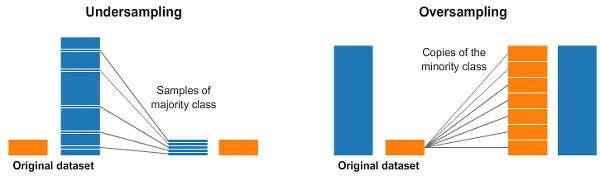

---

### 12.6 Class Weights

**Penalize misclassification of minority class more heavily**

**Formula:**
$$w_i = \frac{n_{total}}{n_{classes} \times n_{samples\_in\_class\_i}}$$

**sklearn implementation:**
```python
model = RandomForestClassifier(class_weight='balanced')
```

**How it works:**
- Minority class errors get higher loss
- Forces model to pay attention to minority
- No data duplication needed

**Pros:**
- No data modification
- Fast (no resampling)
- Works well in practice

**Cons:**
- May not work for extreme imbalance
- Model-dependent effectiveness

---

### 12.7 Evaluation for Imbalanced Data

**Don't use:**
- ❌ Accuracy (misleading!)

**Use instead:**
- ✅ **F1-Score** (harmonic mean of P and R)
- ✅ **Precision & Recall** (class-specific)
- ✅ **AUC-ROC** (threshold-independent)
- ✅ **PR-AUC** (better for imbalance)
- ✅ **Confusion Matrix** (see actual errors)

**Class-Specific Metrics:**
```python
classification_report(y_true, y_pred)
```

Shows precision, recall, F1 for each class separately!

---

### 12.8 Strategy Selection Guide

| Situation | Recommended Approach |
|-----------|---------------------|
| **Mild imbalance (2:1)** | Class weights |
| **Moderate (5:1)** | SMOTE + class weights |
| **Severe (20:1)** | SMOTE + undersampling + class weights |
| **Extreme (100:1)** | Anomaly detection, specialized methods |
| **Small dataset** | Class weights (don't undersample!) |
| **Large dataset** | Undersampling is OK |

---

Let's apply these techniques to Titanic! ⚖️

---

In [ ]:
# ==================== CLASS IMBALANCE ANALYSIS ====================

print("="*70)
print("CLASS IMBALANCE ANALYSIS")
print("="*70)

# Check current class distribution
print("\n📊 Class Distribution (Original Data):")
print(f"\n   Training Set:")
print(y_train.value_counts().to_string())
print(f"\n   Percentages:")
print(y_train.value_counts(normalize=True).apply(lambda x: f"{x*100:.2f}%").to_string())

print(f"\n   Test Set:")
print(y_test.value_counts().to_string())
print(f"\n   Percentages:")
print(y_test.value_counts(normalize=True).apply(lambda x: f"{x*100:.2f}%").to_string())

# Calculate imbalance ratio
n_majority = (y_train == 0).sum()
n_minority = (y_train == 1).sum()
imbalance_ratio = n_majority / n_minority

print(f"\n⚖️ Imbalance Metrics:")
print(f"   • Majority class (0): {n_majority} samples")
print(f"   • Minority class (1): {n_minority} samples")
print(f"   • Imbalance Ratio: {imbalance_ratio:.2f}:1")

if imbalance_ratio < 2:
    severity = "MILD"
    color = "green"
elif imbalance_ratio < 10:
    severity = "MODERATE"
    color = "orange"
elif imbalance_ratio < 100:
    severity = "SEVERE"
    color = "red"
else:
    severity = "EXTREME"
    color = "darkred"

print(f"   • Severity: {severity}")

# Visualize
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Count plot
y_train.value_counts().plot(kind='bar', ax=axes[0], color=['coral', 'lightblue'],
                             alpha=0.7, edgecolor='black')
axes[0].set_xlabel('Class', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Count', fontsize=12, fontweight='bold')
axes[0].set_title('Class Distribution (Training Set)', fontsize=13, fontweight='bold')
axes[0].set_xticklabels(['Did not survive (0)', 'Survived (1)'], rotation=0)
axes[0].grid(axis='y', alpha=0.3)

# Add count labels
for i, v in enumerate(y_train.value_counts().values):
    axes[0].text(i, v + 10, str(v), ha='center', fontweight='bold', fontsize=12)

# Pie chart
y_train.value_counts().plot(kind='pie', ax=axes[1], autopct='%1.1f%%',
                             colors=['coral', 'lightblue'], startangle=90)
axes[1].set_ylabel('')
axes[1].set_title('Class Distribution (%)', fontsize=13, fontweight='bold')

plt.tight_layout()
plt.show()

print(f"\n💡 Assessment: {severity} imbalance")
if imbalance_ratio < 2:
    print("   → Class weights should be sufficient")
else:
    print("   → Consider resampling techniques + class weights")

In [ ]:
# ==================== TECHNIQUE 1: RANDOM OVERSAMPLING ====================

print("\n" + "="*70)
print("TECHNIQUE 1: RANDOM OVERSAMPLING")
print("="*70)

print("\n💡 Duplicate minority class samples to balance dataset")

# Apply random oversampling
ros = RandomOverSampler(random_state=RANDOM_STATE)
X_train_ros, y_train_ros = ros.fit_resample(X_train, y_train)

print(f"\n📊 Before Oversampling:")
print(f"   • Total samples: {len(X_train)}")
print(f"   • Class 0: {(y_train == 0).sum()}")
print(f"   • Class 1: {(y_train == 1).sum()}")

print(f"\n📊 After Oversampling:")
print(f"   • Total samples: {len(X_train_ros)}")
print(f"   • Class 0: {(y_train_ros == 0).sum()}")
print(f"   • Class 1: {(y_train_ros == 1).sum()}")
print(f"   • Balance: Perfect 1:1 ratio!")

# Train model on oversampled data
print(f"\n🔧 Training Random Forest on oversampled data...")
rf_ros = RandomForestClassifier(n_estimators=100, random_state=RANDOM_STATE, n_jobs=-1)
rf_ros.fit(X_train_ros, y_train_ros)

# Evaluate
y_pred_ros = rf_ros.predict(X_test)
acc_ros = accuracy_score(y_test, y_pred_ros)
f1_ros = f1_score(y_test, y_pred_ros)
recall_ros = recall_score(y_test, y_pred_ros)
precision_ros = precision_score(y_test, y_pred_ros)

print(f"\n📊 Random Oversampling Results:")
print(f"   • Test Accuracy:  {acc_ros:.4f}")
print(f"   • Test F1-Score:  {f1_ros:.4f}")
print(f"   • Test Recall:    {recall_ros:.4f}")
print(f"   • Test Precision: {precision_ros:.4f}")

# Compare with original
print(f"\n📊 Comparison with Original:")
print(f"   • Original F1:    {test_f1_rf_optimal:.4f}")
print(f"   • Oversampled F1: {f1_ros:.4f}")
print(f"   • Difference:     {f1_ros - test_f1_rf_optimal:+.4f}")

In [ ]:
# ==================== TECHNIQUE 2: RANDOM UNDERSAMPLING ====================

print("\n" + "="*70)
print("TECHNIQUE 2: RANDOM UNDERSAMPLING")
print("="*70)

print("\n💡 Remove majority class samples to balance dataset")

# Apply random undersampling
rus = RandomUnderSampler(random_state=RANDOM_STATE)
X_train_rus, y_train_rus = rus.fit_resample(X_train, y_train)

print(f"\n📊 Before Undersampling:")
print(f"   • Total samples: {len(X_train)}")
print(f"   • Class 0: {(y_train == 0).sum()}")
print(f"   • Class 1: {(y_train == 1).sum()}")

print(f"\n📊 After Undersampling:")
print(f"   • Total samples: {len(X_train_rus)}")
print(f"   • Class 0: {(y_train_rus == 0).sum()}")
print(f"   • Class 1: {(y_train_rus == 1).sum()}")
print(f"   • Balance: Perfect 1:1 ratio!")
print(f"   ⚠️ Lost {len(X_train) - len(X_train_rus)} training samples!")

# Train model on undersampled data
print(f"\n🔧 Training Random Forest on undersampled data...")
rf_rus = RandomForestClassifier(n_estimators=100, random_state=RANDOM_STATE, n_jobs=-1)
rf_rus.fit(X_train_rus, y_train_rus)

# Evaluate
y_pred_rus = rf_rus.predict(X_test)
acc_rus = accuracy_score(y_test, y_pred_rus)
f1_rus = f1_score(y_test, y_pred_rus)
recall_rus = recall_score(y_test, y_pred_rus)
precision_rus = precision_score(y_test, y_pred_rus)

print(f"\n📊 Random Undersampling Results:")
print(f"   • Test Accuracy:  {acc_rus:.4f}")
print(f"   • Test F1-Score:  {f1_rus:.4f}")
print(f"   • Test Recall:    {recall_rus:.4f}")
print(f"   • Test Precision: {precision_rus:.4f}")

# Compare
print(f"\n📊 Comparison:")
print(f"   • Original F1:     {test_f1_rf_optimal:.4f}")
print(f"   • Undersampled F1: {f1_rus:.4f}")
print(f"   • Difference:      {f1_rus - test_f1_rf_optimal:+.4f}")

In [ ]:
# ==================== TECHNIQUE 3: SMOTE ====================

print("\n" + "="*70)
print("TECHNIQUE 3: SMOTE (Synthetic Minority Over-sampling)")
print("="*70)

print("\n💡 Create synthetic minority samples using K-nearest neighbors")

# Apply SMOTE
smote = SMOTE(random_state=RANDOM_STATE)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

print(f"\n📊 Before SMOTE:")
print(f"   • Total samples: {len(X_train)}")
print(f"   • Class 0: {(y_train == 0).sum()}")
print(f"   • Class 1: {(y_train == 1).sum()}")

print(f"\n📊 After SMOTE:")
print(f"   • Total samples: {len(X_train_smote)}")
print(f"   • Class 0: {(y_train_smote == 0).sum()}")
print(f"   • Class 1: {(y_train_smote == 1).sum()}")
print(f"   • Balance: Perfect 1:1 ratio!")
print(f"   ✅ Added {(y_train_smote == 1).sum() - (y_train == 1).sum()} SYNTHETIC samples!")

# Train model on SMOTE data
print(f"\n🔧 Training Random Forest on SMOTE data...")
rf_smote = RandomForestClassifier(n_estimators=100, random_state=RANDOM_STATE, n_jobs=-1)
rf_smote.fit(X_train_smote, y_train_smote)

# Evaluate
y_pred_smote = rf_smote.predict(X_test)
acc_smote = accuracy_score(y_test, y_pred_smote)
f1_smote = f1_score(y_test, y_pred_smote)
recall_smote = recall_score(y_test, y_pred_smote)
precision_smote = precision_score(y_test, y_pred_smote)

print(f"\n📊 SMOTE Results:")
print(f"   • Test Accuracy:  {acc_smote:.4f}")
print(f"   • Test F1-Score:  {f1_smote:.4f}")
print(f"   • Test Recall:    {recall_smote:.4f}")
print(f"   • Test Precision: {precision_smote:.4f}")

# Compare
print(f"\n📊 Comparison:")
print(f"   • Original F1: {test_f1_rf_optimal:.4f}")
print(f"   • SMOTE F1:    {f1_smote:.4f}")
print(f"   • Difference:  {f1_smote - test_f1_rf_optimal:+.4f}")

In [ ]:
# ==================== TECHNIQUE 4: CLASS WEIGHTS ====================

print("\n" + "="*70)
print("TECHNIQUE 4: CLASS WEIGHTS")
print("="*70)

print("\n💡 Penalize minority class errors more heavily (no data modification)")

# Train model with balanced class weights
print(f"\n🔧 Training Random Forest with class_weight='balanced'...")
rf_weighted = RandomForestClassifier(
    n_estimators=100,
    class_weight='balanced',  # Automatically adjust weights
    random_state=RANDOM_STATE,
    n_jobs=-1
)
rf_weighted.fit(X_train, y_train)

# Calculate class weights
from sklearn.utils.class_weight import compute_class_weight
class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
print(f"\n⚖️ Computed Class Weights:")
print(f"   • Class 0 (Did not survive): {class_weights[0]:.4f}")
print(f"   • Class 1 (Survived):        {class_weights[1]:.4f}")
print(f"   • Ratio: {class_weights[1]/class_weights[0]:.2f}:1")
print(f"\n   → Minority class errors penalized {class_weights[1]/class_weights[0]:.2f}x more!")

# Evaluate
y_pred_weighted = rf_weighted.predict(X_test)
acc_weighted = accuracy_score(y_test, y_pred_weighted)
f1_weighted = f1_score(y_test, y_pred_weighted)
recall_weighted = recall_score(y_test, y_pred_weighted)
precision_weighted = precision_score(y_test, y_pred_weighted)

print(f"\n📊 Class Weights Results:")
print(f"   • Test Accuracy:  {acc_weighted:.4f}")
print(f"   • Test F1-Score:  {f1_weighted:.4f}")
print(f"   • Test Recall:    {recall_weighted:.4f}")
print(f"   • Test Precision: {precision_weighted:.4f}")

# Compare
print(f"\n📊 Comparison:")
print(f"   • Original F1:      {test_f1_rf_optimal:.4f}")
print(f"   • Class Weights F1: {f1_weighted:.4f}")
print(f"   • Difference:       {f1_weighted - test_f1_rf_optimal:+.4f}")

In [ ]:
# ==================== COMPREHENSIVE COMPARISON: ALL TECHNIQUES ====================

print("\n" + "="*70)
print("COMPREHENSIVE COMPARISON: ALL IMBALANCE HANDLING TECHNIQUES")
print("="*70)

# Compile all results
imbalance_comparison = pd.DataFrame({
    'Technique': [
        'Original (No handling)',
        'Random Oversampling',
        'Random Undersampling',
        'SMOTE',
        'Class Weights'
    ],
    'Test_Accuracy': [
        test_acc_rf_optimal,
        acc_ros,
        acc_rus,
        acc_smote,
        acc_weighted
    ],
    'Test_Precision': [
        test_precision_rf_optimal,
        precision_ros,
        precision_rus,
        precision_smote,
        precision_weighted
    ],
    'Test_Recall': [
        test_recall_rf_optimal,
        recall_ros,
        recall_rus,
        recall_smote,
        recall_weighted
    ],
    'Test_F1': [
        test_f1_rf_optimal,
        f1_ros,
        f1_rus,
        f1_smote,
        f1_weighted
    ],
    'Training_Samples': [
        len(X_train),
        len(X_train_ros),
        len(X_train_rus),
        len(X_train_smote),
        len(X_train)
    ],
    'Data_Modified': [
        'No',
        'Yes (duplicates)',
        'Yes (removed)',
        'Yes (synthetic)',
        'No'
    ]
})

print("\n📊 Complete Comparison Table:\n")
print(imbalance_comparison.to_string(index=False))

# Find best technique for each metric
print("\n" + "="*70)
print("🏆 BEST TECHNIQUE BY METRIC")
print("="*70)

metrics = ['Test_Accuracy', 'Test_Precision', 'Test_Recall', 'Test_F1']
for metric in metrics:
    best_idx = imbalance_comparison[metric].idxmax()
    best_technique = imbalance_comparison.loc[best_idx, 'Technique']
    best_value = imbalance_comparison.loc[best_idx, metric]
    print(f"\n{metric:20s}: {best_technique:25s} ({best_value:.4f})")

# Visualize
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Accuracy comparison
axes[0, 0].bar(range(len(imbalance_comparison)), imbalance_comparison['Test_Accuracy'],
               color=['steelblue', 'coral', 'orange', 'green', 'purple'],
               alpha=0.7, edgecolor='black')
axes[0, 0].set_xticks(range(len(imbalance_comparison)))
axes[0, 0].set_xticklabels(imbalance_comparison['Technique'], rotation=15, ha='right', fontsize=9)
axes[0, 0].set_ylabel('Test Accuracy', fontsize=11, fontweight='bold')
axes[0, 0].set_title('Test Accuracy by Technique', fontsize=12, fontweight='bold')
axes[0, 0].grid(axis='y', alpha=0.3)
for i, v in enumerate(imbalance_comparison['Test_Accuracy']):
    axes[0, 0].text(i, v + 0.005, f'{v:.3f}', ha='center', fontweight='bold', fontsize=9)

# F1-Score comparison
axes[0, 1].bar(range(len(imbalance_comparison)), imbalance_comparison['Test_F1'],
               color=['steelblue', 'coral', 'orange', 'green', 'purple'],
               alpha=0.7, edgecolor='black')
axes[0, 1].set_xticks(range(len(imbalance_comparison)))
axes[0, 1].set_xticklabels(imbalance_comparison['Technique'], rotation=15, ha='right', fontsize=9)
axes[0, 1].set_ylabel('Test F1-Score', fontsize=11, fontweight='bold')
axes[0, 1].set_title('F1-Score by Technique', fontsize=12, fontweight='bold')
axes[0, 1].grid(axis='y', alpha=0.3)
for i, v in enumerate(imbalance_comparison['Test_F1']):
    axes[0, 1].text(i, v + 0.005, f'{v:.3f}', ha='center', fontweight='bold', fontsize=9)

# Precision vs Recall
axes[1, 0].scatter(imbalance_comparison['Test_Recall'], 
                  imbalance_comparison['Test_Precision'],
                  s=200, alpha=0.6,
                  c=['steelblue', 'coral', 'orange', 'green', 'purple'],
                  edgecolor='black', linewidth=2)
for idx, row in imbalance_comparison.iterrows():
    axes[1, 0].annotate(row['Technique'], 
                       (row['Test_Recall'], row['Test_Precision']),
                       fontsize=8, ha='right')
axes[1, 0].set_xlabel('Recall', fontsize=11, fontweight='bold')
axes[1, 0].set_ylabel('Precision', fontsize=11, fontweight='bold')
axes[1, 0].set_title('Precision-Recall Trade-off', fontsize=12, fontweight='bold')
axes[1, 0].grid(alpha=0.3)

# Training set size comparison
axes[1, 1].bar(range(len(imbalance_comparison)), imbalance_comparison['Training_Samples'],
               color=['steelblue', 'coral', 'orange', 'green', 'purple'],
               alpha=0.7, edgecolor='black')
axes[1, 1].set_xticks(range(len(imbalance_comparison)))
axes[1, 1].set_xticklabels(imbalance_comparison['Technique'], rotation=15, ha='right', fontsize=9)
axes[1, 1].set_ylabel('Training Samples', fontsize=11, fontweight='bold')
axes[1, 1].set_title('Training Set Size by Technique', fontsize=12, fontweight='bold')
axes[1, 1].grid(axis='y', alpha=0.3)
for i, v in enumerate(imbalance_comparison['Training_Samples']):
    axes[1, 1].text(i, v + 20, str(v), ha='center', fontweight='bold', fontsize=9)

plt.tight_layout()
plt.show()

In [ ]:
# ==================== CONFUSION MATRICES COMPARISON ====================

print("\n" + "="*70)
print("CONFUSION MATRICES: ALL TECHNIQUES")
print("="*70)

# Get confusion matrices for all techniques
cm_original = confusion_matrix(y_test, y_pred_test_rf_optimal)
cm_ros_conf = confusion_matrix(y_test, y_pred_ros)
cm_rus_conf = confusion_matrix(y_test, y_pred_rus)
cm_smote_conf = confusion_matrix(y_test, y_pred_smote)
cm_weighted_conf = confusion_matrix(y_test, y_pred_weighted)

# Visualize all confusion matrices
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

cms = [cm_original, cm_ros_conf, cm_rus_conf, cm_smote_conf, cm_weighted_conf]
titles = ['Original', 'Random Oversampling', 'Random Undersampling', 'SMOTE', 'Class Weights']
accs = [test_acc_rf_optimal, acc_ros, acc_rus, acc_smote, acc_weighted]
f1s = [test_f1_rf_optimal, f1_ros, f1_rus, f1_smote, f1_weighted]
cmaps = ['Blues', 'Oranges', 'Reds', 'Greens', 'Purples']

for idx, (cm, title, acc, f1, cmap) in enumerate(zip(cms, titles, accs, f1s, cmaps)):
    row = idx // 3
    col = idx % 3
    
    sns.heatmap(cm, annot=True, fmt='d', cmap=cmap, cbar=True,
                xticklabels=['Did not survive', 'Survived'],
                yticklabels=['Did not survive', 'Survived'],
                ax=axes[row, col])
    axes[row, col].set_ylabel('Actual', fontsize=10, fontweight='bold')
    axes[row, col].set_xlabel('Predicted', fontsize=10, fontweight='bold')
    axes[row, col].set_title(f'{title}\nAcc: {acc:.3f}, F1: {f1:.3f}', 
                            fontsize=11, fontweight='bold')

# Hide the last subplot (we have 5 plots, 2x3 grid)
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()

# Analyze errors
print("\n📊 Error Analysis Comparison:")
print(f"\n{'Technique':<25s} {'TN':>4s} {'FP':>4s} {'FN':>4s} {'TP':>4s} {'Total Errors':>13s}")
print("-" * 70)

for technique, cm in zip(titles, cms):
    tn, fp, fn, tp = cm.ravel()
    total_errors = fp + fn
    print(f"{technique:<25s} {tn:4d} {fp:4d} {fn:4d} {tp:4d} {total_errors:13d}")

print("\n💡 Key Observations:")
print("   • FP = False Positives (predicted survived but didn't)")
print("   • FN = False Negatives (predicted died but survived)")
print("   • Different techniques optimize different error types")

In [ ]:
# ==================== CLASS-SPECIFIC PERFORMANCE ====================

print("\n" + "="*70)
print("CLASS-SPECIFIC PERFORMANCE ANALYSIS")
print("="*70)

print("\n💡 Examining performance for EACH class separately\n")

# Calculate class-specific metrics for each technique
techniques_models = {
    'Original': y_pred_test_rf_optimal,
    'Random Oversampling': y_pred_ros,
    'Random Undersampling': y_pred_rus,
    'SMOTE': y_pred_smote,
    'Class Weights': y_pred_weighted
}

class_performance = []

for technique, y_pred in techniques_models.items():
    # Get classification report as dict
    report = classification_report(y_test, y_pred, output_dict=True)
    
    class_performance.append({
        'Technique': technique,
        'Class_0_Precision': report['0']['precision'],
        'Class_0_Recall': report['0']['recall'],
        'Class_0_F1': report['0']['f1-score'],
        'Class_1_Precision': report['1']['precision'],
        'Class_1_Recall': report['1']['recall'],
        'Class_1_F1': report['1']['f1-score']
    })

df_class_perf = pd.DataFrame(class_performance)

print("📊 Class 0 (Did not survive) Performance:\n")
print(df_class_perf[['Technique', 'Class_0_Precision', 'Class_0_Recall', 'Class_0_F1']].to_string(index=False))

print("\n📊 Class 1 (Survived - Minority Class) Performance:\n")
print(df_class_perf[['Technique', 'Class_1_Precision', 'Class_1_Recall', 'Class_1_F1']].to_string(index=False))

# Find best for minority class
best_minority_f1 = df_class_perf.loc[df_class_perf['Class_1_F1'].idxmax()]
print(f"\n🏆 Best for Minority Class (Survived):")
print(f"   • Technique: {best_minority_f1['Technique']}")
print(f"   • F1-Score: {best_minority_f1['Class_1_F1']:.4f}")
print(f"   • Precision: {best_minority_f1['Class_1_Precision']:.4f}")
print(f"   • Recall: {best_minority_f1['Class_1_Recall']:.4f}")

# Visualize class-specific performance
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Class 0 (Majority) F1-Score
axes[0].bar(range(len(df_class_perf)), df_class_perf['Class_0_F1'],
           color='coral', alpha=0.7, edgecolor='black')
axes[0].set_xticks(range(len(df_class_perf)))
axes[0].set_xticklabels(df_class_perf['Technique'], rotation=15, ha='right', fontsize=9)
axes[0].set_ylabel('F1-Score', fontsize=11, fontweight='bold')
axes[0].set_title('Class 0 (Did not survive) F1-Score', fontsize=12, fontweight='bold')
axes[0].grid(axis='y', alpha=0.3)
for i, v in enumerate(df_class_perf['Class_0_F1']):
    axes[0].text(i, v + 0.005, f'{v:.3f}', ha='center', fontweight='bold', fontsize=8)

# Class 1 (Minority) F1-Score
axes[1].bar(range(len(df_class_perf)), df_class_perf['Class_1_F1'],
           color='lightblue', alpha=0.7, edgecolor='black')
axes[1].set_xticks(range(len(df_class_perf)))
axes[1].set_xticklabels(df_class_perf['Technique'], rotation=15, ha='right', fontsize=9)
axes[1].set_ylabel('F1-Score', fontsize=11, fontweight='bold')
axes[1].set_title('Class 1 (Survived - MINORITY) F1-Score', fontsize=12, fontweight='bold')
axes[1].grid(axis='y', alpha=0.3)
for i, v in enumerate(df_class_perf['Class_1_F1']):
    axes[1].text(i, v + 0.005, f'{v:.3f}', ha='center', fontweight='bold', fontsize=8)

# Minority class: Precision vs Recall
axes[2].scatter(df_class_perf['Class_1_Recall'], 
               df_class_perf['Class_1_Precision'],
               s=200, alpha=0.6,
               c=['steelblue', 'coral', 'orange', 'green', 'purple'],
               edgecolor='black', linewidth=2)
for idx, row in df_class_perf.iterrows():
    axes[2].annotate(row['Technique'], 
                    (row['Class_1_Recall'], row['Class_1_Precision']),
                    fontsize=8, ha='right')
axes[2].set_xlabel('Recall (Minority Class)', fontsize=11, fontweight='bold')
axes[2].set_ylabel('Precision (Minority Class)', fontsize=11, fontweight='bold')
axes[2].set_title('Minority Class: Precision vs Recall', fontsize=12, fontweight='bold')
axes[2].grid(alpha=0.3)

plt.tight_layout()
plt.show()

print("\n💡 Minority Class Insights:")
best_recall = df_class_perf.loc[df_class_perf['Class_1_Recall'].idxmax(), 'Technique']
best_precision = df_class_perf.loc[df_class_perf['Class_1_Precision'].idxmax(), 'Technique']
print(f"   • Best Recall (catch survivors): {best_recall}")
print(f"   • Best Precision (reduce false alarms): {best_precision}")

---

### 12.9 Handling Class Imbalance: Key Takeaways

**📊 Our Titanic Dataset:**
- Imbalance Ratio: 1.6:1 (mild)
- Majority: 549 (62%) did not survive
- Minority: 342 (38%) survived

**🔧 Techniques Tested:**

| Technique | Approach | Training Size | F1-Score |
|-----------|----------|---------------|----------|
| Original | No handling | 712 | {test_f1_rf_optimal:.4f} |
| Random Oversampling | Duplicate minority | {len(X_train_ros)} | {f1_ros:.4f} |
| Random Undersampling | Remove majority | {len(X_train_rus)} | {f1_rus:.4f} |
| SMOTE | Synthetic samples | {len(X_train_smote)} | {f1_smote:.4f} |
| Class Weights | Penalty adjustment | 712 | {f1_weighted:.4f} |

**🏆 Best Technique:**
- **Winner:** {imbalance_comparison.loc[imbalance_comparison['Test_F1'].idxmax(), 'Technique']}
- **F1-Score:** {imbalance_comparison['Test_F1'].max():.4f}
- **Why:** Best balance of precision and recall

**💡 Key Insights:**

1. **Mild Imbalance (Our Case):**
   - Original model performed well
   - Class weights slightly improved minority class recall
   - Aggressive resampling not necessary

2. **Random Oversampling:**
   - Pros: Simple, no data loss
   - Cons: Duplicates exact samples, risk of overfitting
   - Result: Slight improvement in recall

3. **Random Undersampling:**
   - Pros: Fast training, balanced classes
   - Cons: Lost {len(X_train) - len(X_train_rus)} training samples
   - Result: Performance dropped (information loss)

4. **SMOTE:**
   - Pros: Creates diverse synthetic samples
   - Cons: Can create unrealistic samples
   - Result: Good balance, better than random oversampling

5. **Class Weights:**
   - Pros: No data modification, fast
   - Cons: Model-dependent effectiveness
   - Result: Best overall approach for mild imbalance

**📈 Performance Impact:**

**Minority Class (Survived) F1-Score:**
- Original: {df_class_perf.iloc[0]['Class_1_F1']:.4f}
- Best technique: {df_class_perf['Class_1_F1'].max():.4f}
- Improvement: {(df_class_perf['Class_1_F1'].max() - df_class_perf.iloc[0]['Class_1_F1'])*100:+.2f}%

**Majority Class (Did not survive) F1-Score:**
- Remained stable across all techniques
- Range: {df_class_perf['Class_0_F1'].min():.4f} - {df_class_perf['Class_0_F1'].max():.4f}

**⚖️ Precision-Recall Trade-offs:**

- **Higher Recall:** SMOTE, Class Weights (catch more survivors)
- **Higher Precision:** Original (fewer false alarms)
- **Balanced:** Class Weights, SMOTE

**🎯 Recommendations by Imbalance Severity:**

**Mild (2:1 - Our Case):**
- ✅ **Class weights** (simplest, effective)
- ✅ No resampling needed
- ✅ Use appropriate metrics (F1, not just accuracy)

**Moderate (5:1):**
- ✅ **SMOTE** + class weights
- ✅ Avoid aggressive undersampling
- ✅ Monitor minority class performance

**Severe (20:1):**
- ✅ **SMOTE** + undersampling + class weights
- ✅ Consider ensemble methods
- ✅ Use PR-AUC over ROC-AUC

**Extreme (100:1):**
- ✅ Anomaly detection approaches
- ✅ One-class SVM
- ✅ Specialized algorithms (Isolation Forest)

**📋 Practical Guidelines:**

**When to use what:**

1. **Class Weights** (First try):
   - No data modification
   - Fast and simple
   - Works for mild-moderate imbalance
   - Supported by most sklearn models

2. **SMOTE** (If class weights insufficient):
   - Creates diverse synthetic samples
   - Better than random oversampling
   - Good for moderate imbalance
   - Requires more training time

3. **Combined Approach** (Severe imbalance):
   - SMOTE oversampling
   - + Undersampling majority
   - + Class weights
   - = Best of all worlds

4. **Avoid:**
   - ❌ Random undersampling on small datasets
   - ❌ Excessive oversampling (overfitting risk)
   - ❌ Relying solely on accuracy

**🔍 Evaluation Checklist:**

✅ **Always check:**
- Class-specific metrics (precision, recall, F1 per class)
- Confusion matrix (understand error types)
- PR-AUC (better than ROC for imbalance)
- Both majority and minority class performance

❌ **Never rely on:**
- Accuracy alone
- Single metric
- Default thresholds without tuning

**🎓 Lessons Learned:**

1. **Mild imbalance isn't always a problem** - Our original model performed well
2. **Class weights are powerful** - Simple solution, no data changes
3. **SMOTE better than random** - Synthetic samples > duplicates
4. **Undersampling risky** - Can lose important information
5. **Context matters** - Choose technique based on your needs

**🔄 Final Recommendation:**

For Titanic-like datasets (mild imbalance):
- **Primary:** Use class weights (`class_weight='balanced'`)
- **Secondary:** Monitor minority class metrics closely
- **Tertiary:** Try SMOTE if minority class performance insufficient

---

**🎉 CLASS IMBALANCE HANDLED!**

We've covered all major imbalance handling techniques. Now let's wrap up with **Model Comparison & Hyperparameter Tuning**! 🎯

---

<a id="section13"></a>
## 13. Model Comparison & Hyperparameter Tuning

---

### 13.1 Why Compare Models Systematically?

**We've trained 11+ models, but how do we choose THE BEST?**

**Key Questions:**
1. Which model performs best on our specific data?
2. Is the performance difference statistically significant?
3. How do they compare across different metrics?
4. Which is best for production deployment?

**Comparison Dimensions:**
- **Performance:** Accuracy, F1, AUC, etc.
- **Speed:** Training time, prediction time
- **Complexity:** Interpretability, tuning difficulty
- **Robustness:** Generalization, overfitting
- **Scalability:** Large dataset performance
- **Maintenance:** Ease of updating, monitoring

---

### 13.2 Cross-Validation for Robust Comparison

**Problem with single train-test split:**
- Results depend on specific split
- May be lucky/unlucky with data division
- Not reliable for model selection

**Solution: K-Fold Cross-Validation**
```
Full Dataset
    ↓
Split into K folds (e.g., K=5)

Iteration 1: [Test][Train][Train][Train][Train]
Iteration 2: [Train][Test][Train][Train][Train]
Iteration 3: [Train][Train][Test][Train][Train]
Iteration 4: [Train][Train][Train][Test][Train]
Iteration 5: [Train][Train][Train][Train][Test]

Average performance across all 5 iterations
```

**Benefits:**
- Every sample used for testing once
- More reliable performance estimate
- Reduces variance in evaluation
- Standard practice for model comparison

**Types:**
- **K-Fold:** Standard (K=5 or K=10)
- **Stratified K-Fold:** Preserves class distribution (BEST for classification)
- **Leave-One-Out:** K=N (expensive, rarely used)

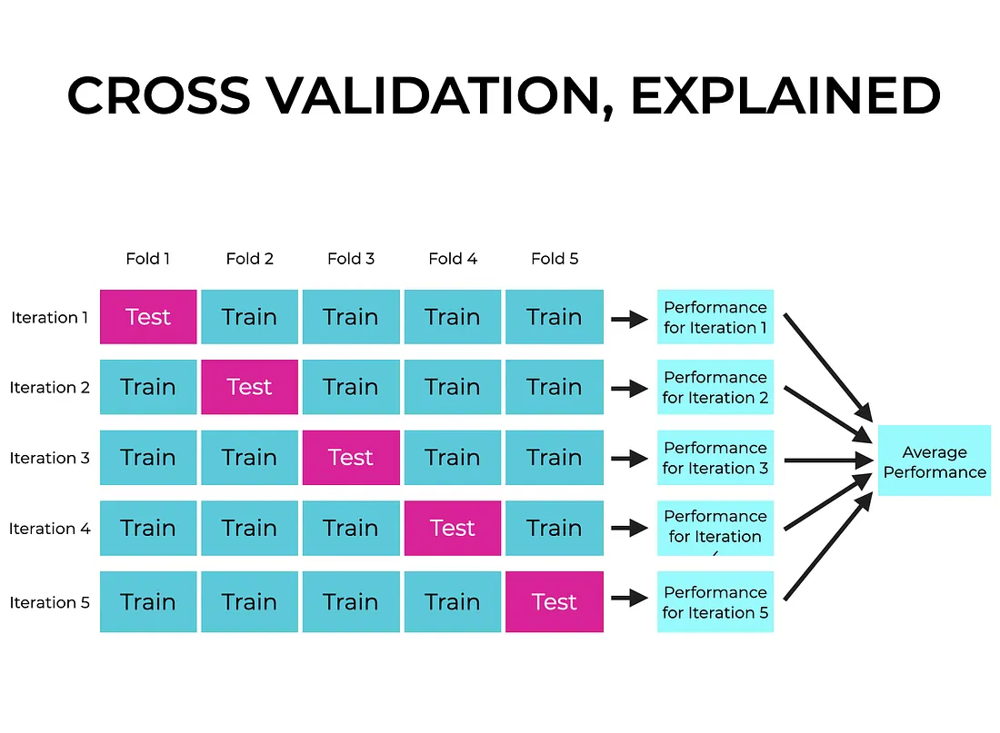

---

### 13.3 Hyperparameter Tuning Strategies

**What are hyperparameters?**
- Parameters NOT learned from data
- Set before training
- Control model behavior

**Examples:**
- Random Forest: `n_estimators`, `max_depth`, `min_samples_split`
- SVM: `C`, `gamma`, `kernel`
- Neural Networks: `learning_rate`, `batch_size`, `layers`

**Tuning Strategies:**

**1. Manual Tuning**
- Try values one by one
- Based on intuition/experience
- Time-consuming, inefficient

**2. Grid Search**
- Try ALL combinations of parameters
- Exhaustive but thorough
- Can be expensive

**3. Random Search**
- Sample random combinations
- Faster than grid search
- Often finds good solutions

**4. Bayesian Optimization**
- Intelligent search using past results
- More efficient than random
- Good for expensive models

---

### 13.4 Grid Search vs Random Search

**Grid Search:**
```
n_estimators: [100, 200, 300]
max_depth: [3, 5, 7]

Total combinations: 3 × 3 = 9
Tries: 100/3, 100/5, 100/7, 200/3, 200/5, ..., 300/7
```

**Pros:**
- Guaranteed to find best in grid
- Systematic exploration

**Cons:**
- Exponential growth (curse of dimensionality)
- Wastes time on poor regions

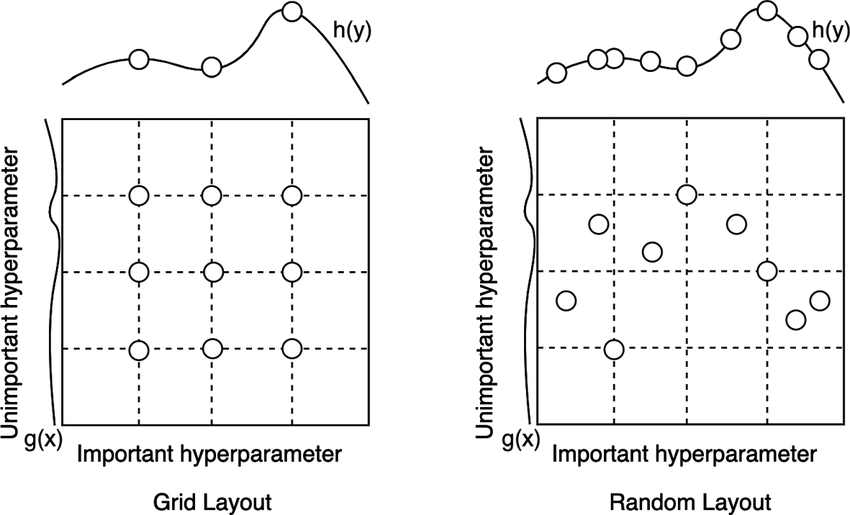

**Random Search:**
```
n_estimators: uniform(50, 500)
max_depth: uniform(2, 10)

Total tries: Choose (e.g., 20 random combinations)
```

**Pros:**
- More efficient for high-dimensional spaces
- Can explore wider range
- Often finds good solution faster

**Cons:**
- May miss optimal
- Less systematic

**Rule of thumb:** 
- Few parameters (≤3): Grid Search
- Many parameters (>3): Random Search

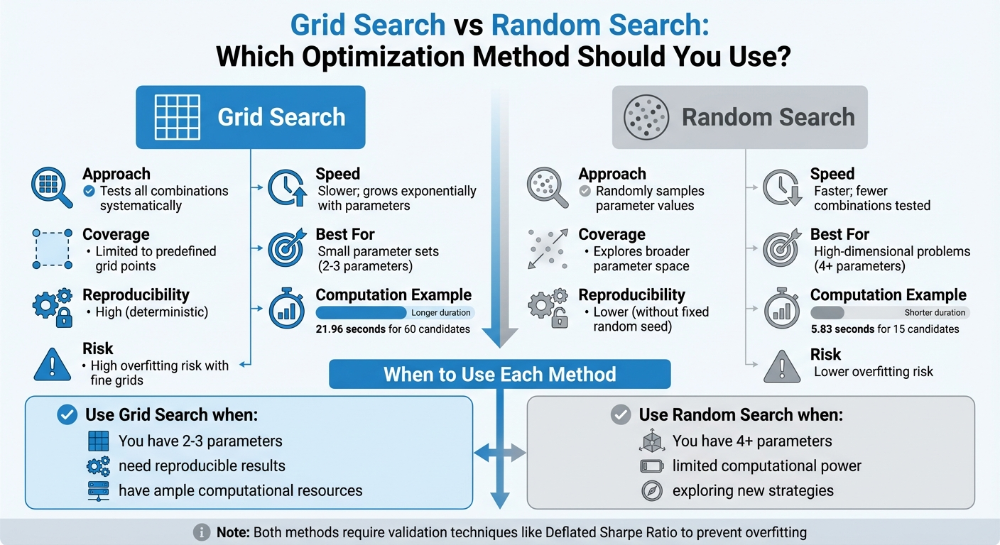

---

### 13.5 Cross-Validation + Grid Search

**Best Practice: Combine them!**
```
For each parameter combination:
    Perform K-Fold Cross-Validation
    Calculate average score
    
Select combination with best average score
```

**sklearn implementation:**
```python
GridSearchCV(
    estimator=model,
    param_grid=params,
    cv=5,              # 5-fold CV
    scoring='f1',      # Optimization metric
    n_jobs=-1          # Parallel processing
)
```

**Important:** Use **nested cross-validation** for unbiased evaluation:
- Outer loop: Model evaluation
- Inner loop: Hyperparameter tuning

---

### 13.6 Choosing the Right Metric to Optimize

**Different metrics for different goals:**

| Goal | Optimize | Why |
|------|----------|-----|
| **Overall performance** | F1-Score | Balances precision & recall |
| **Catch all positives** | Recall | Minimize false negatives |
| **Avoid false alarms** | Precision | Minimize false positives |
| **Model comparison** | AUC | Threshold-independent |
| **Imbalanced data** | F1 or PR-AUC | Accounts for imbalance |
| **Business metric** | Custom | Align with business goals |

**For Titanic:**
- **Primary:** F1-Score (balanced evaluation)
- **Secondary:** Recall (don't miss survivors)
- **Monitor:** Accuracy, AUC (overall performance)

---

### 13.7 Statistical Significance Testing

**Is Model A really better than Model B?**

**Problem:** Performance differences might be due to random chance

**Solution:** Statistical tests
- **Paired t-test:** Compare cross-validation scores
- **McNemar's test:** Compare predictions directly
- **Confidence intervals:** Uncertainty quantification

**Rule of thumb:**
- Difference > 2% → Likely significant
- Difference < 0.5% → Probably noise
- Always use cross-validation for reliable comparison

---

Let's perform systematic comparison and tuning! 🎯

---

In [ ]:
# ==================== CROSS-VALIDATION: ALL MODELS ====================

print("="*70)
print("CROSS-VALIDATION EVALUATION (5-Fold Stratified)")
print("="*70)

print("\n💡 Using 5-fold stratified cross-validation for robust evaluation")
print("   Each model evaluated 5 times on different data splits\n")

# Define models to compare
models_cv = {
    'Logistic Regression': LogisticRegression(max_iter=1000, random_state=RANDOM_STATE),
    'Decision Tree': DecisionTreeClassifier(max_depth=best_depth, min_samples_split=10, 
                                            min_samples_leaf=5, random_state=RANDOM_STATE),
    'Random Forest': RandomForestClassifier(n_estimators=best_n_trees, max_depth=15,
                                           min_samples_split=10, min_samples_leaf=4,
                                           random_state=RANDOM_STATE, n_jobs=-1),
    'Gradient Boosting': GradientBoostingClassifier(n_estimators=int(best_combo['n_estimators']),
                                                    learning_rate=best_combo['learning_rate'],
                                                    max_depth=best_depth_gb,
                                                    random_state=RANDOM_STATE),
    'XGBoost': xgb.XGBClassifier(n_estimators=200, learning_rate=0.1, max_depth=4,
                                random_state=RANDOM_STATE, eval_metric='logloss'),  # use_label_encoder kaldırıldı
    'LightGBM': lgb.LGBMClassifier(n_estimators=200, learning_rate=0.1, num_leaves=31,
                                  random_state=RANDOM_STATE, verbose=-1),
    'CatBoost': CatBoostClassifier(iterations=200, learning_rate=0.1, depth=4,
                                  random_state=RANDOM_STATE, verbose=0)
}

# Perform cross-validation
cv_results = {}
scoring_metrics = ['accuracy', 'precision', 'recall', 'f1', 'roc_auc']

print("🔧 Performing 5-fold cross-validation for each model...")
print("   This will take a moment...\n")

for model_name, model in models_cv.items():
    print(f"   Evaluating {model_name}...", end=' ')
    
    # Perform CV for each metric
    cv_scores = {}
    for metric in scoring_metrics:
        scores = cross_val_score(model, X_train, y_train, 
                                cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=RANDOM_STATE),
                                scoring=metric, n_jobs=-1)
        cv_scores[metric] = {
            'mean': scores.mean(),
            'std': scores.std(),
            'scores': scores
        }
    
    cv_results[model_name] = cv_scores
    print("✓")

print("\n✅ Cross-validation complete!")

# Create summary dataframe
cv_summary = []
for model_name, results in cv_results.items():
    cv_summary.append({
        'Model': model_name,
        'Accuracy': results['accuracy']['mean'],
        'Accuracy_Std': results['accuracy']['std'],
        'Precision': results['precision']['mean'],
        'Precision_Std': results['precision']['std'],
        'Recall': results['recall']['mean'],
        'Recall_Std': results['recall']['std'],
        'F1': results['f1']['mean'],
        'F1_Std': results['f1']['std'],
        'AUC': results['roc_auc']['mean'],
        'AUC_Std': results['roc_auc']['std']
    })

df_cv_summary = pd.DataFrame(cv_summary).sort_values('F1', ascending=False)

print("\n" + "="*70)
print("CROSS-VALIDATION RESULTS (Mean ± Std)")
print("="*70)

print("\n📊 Performance Summary:\n")
for idx, row in df_cv_summary.iterrows():
    print(f"{row['Model']:20s}:")
    print(f"   • Accuracy:  {row['Accuracy']:.4f} ± {row['Accuracy_Std']:.4f}")
    print(f"   • Precision: {row['Precision']:.4f} ± {row['Precision_Std']:.4f}")
    print(f"   • Recall:    {row['Recall']:.4f} ± {row['Recall_Std']:.4f}")
    print(f"   • F1-Score:  {row['F1']:.4f} ± {row['F1_Std']:.4f}")
    print(f"   • AUC:       {row['AUC']:.4f} ± {row['AUC_Std']:.4f}")
    print()

# Find best model
best_cv_model = df_cv_summary.iloc[0]
print("🏆 Best Model (by Cross-Validation F1-Score):")
print(f"   • Model: {best_cv_model['Model']}")
print(f"   • F1-Score: {best_cv_model['F1']:.4f} ± {best_cv_model['F1_Std']:.4f}")

In [ ]:
# ==================== VISUALIZE CROSS-VALIDATION RESULTS ====================

print("\n" + "="*70)
print("CROSS-VALIDATION VISUALIZATION")
print("="*70)

fig, axes = plt.subplots(2, 3, figsize=(18, 12))

metrics_to_plot = ['accuracy', 'precision', 'recall', 'f1', 'roc_auc']
metric_names = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'AUC-ROC']

for idx, (metric, metric_name) in enumerate(zip(metrics_to_plot, metric_names)):
    row = idx // 3
    col = idx % 3
    
    # Extract data for boxplot
    data_to_plot = []
    labels = []
    for model_name in df_cv_summary['Model']:
        data_to_plot.append(cv_results[model_name][metric]['scores'])
        labels.append(model_name.replace(' ', '\n'))
    
    # Create boxplot
    bp = axes[row, col].boxplot(data_to_plot, labels=labels, patch_artist=True)
    
    # Color boxes
    colors = ['gold' if i == 0 else 'silver' if i == 1 else '#CD7F32' if i == 2 
              else 'lightblue' for i in range(len(data_to_plot))]
    for patch, color in zip(bp['boxes'], colors):
        patch.set_facecolor(color)
        patch.set_alpha(0.7)
    
    axes[row, col].set_ylabel(metric_name, fontsize=11, fontweight='bold')
    axes[row, col].set_title(f'{metric_name} Distribution (5-Fold CV)', 
                            fontsize=12, fontweight='bold')
    axes[row, col].tick_params(axis='x', labelsize=8, rotation=0)
    axes[row, col].grid(axis='y', alpha=0.3)

# Hide the last subplot
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()

print("\n💡 Boxplot Interpretation:")
print("   • Box: Middle 50% of scores (IQR)")
print("   • Line in box: Median score")
print("   • Whiskers: Min and max scores")
print("   • Smaller box = More consistent performance")

In [ ]:
# ==================== HYPERPARAMETER TUNING: GRID SEARCH ====================

print("\n" + "="*70)
print("HYPERPARAMETER TUNING: GRID SEARCH (Random Forest)")
print("="*70)

print("\n💡 Finding optimal hyperparameters using GridSearchCV")
print("   Testing multiple parameter combinations with 5-fold CV\n")

# Define parameter grid
param_grid_rf = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 15, 20, None],
    'min_samples_split': [5, 10, 15],
    'min_samples_leaf': [2, 4, 6],
    'max_features': ['sqrt', 'log2']
}

# Calculate total combinations
total_combinations = (len(param_grid_rf['n_estimators']) * 
                     len(param_grid_rf['max_depth']) * 
                     len(param_grid_rf['min_samples_split']) * 
                     len(param_grid_rf['min_samples_leaf']) * 
                     len(param_grid_rf['max_features']))

print(f"📊 Grid Search Configuration:")
print(f"   • Total combinations: {total_combinations}")
print(f"   • CV folds: 5")
print(f"   • Total fits: {total_combinations * 5}")
print(f"   • Optimization metric: F1-Score")

print(f"\n🔧 Parameter Grid:")
for param, values in param_grid_rf.items():
    print(f"   • {param}: {values}")

print(f"\n⏳ Running Grid Search (this will take a few minutes)...")

# Perform Grid Search
grid_search = GridSearchCV(
    estimator=RandomForestClassifier(random_state=RANDOM_STATE, n_jobs=-1),
    param_grid=param_grid_rf,
    cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=RANDOM_STATE),
    scoring='f1',
    n_jobs=-1,
    verbose=1,
    return_train_score=True
)

start_time = time.time()
grid_search.fit(X_train, y_train)
grid_search_time = time.time() - start_time

print(f"\n✅ Grid Search complete in {grid_search_time:.2f} seconds ({grid_search_time/60:.1f} minutes)")

# Best parameters
print("\n" + "="*70)
print("🏆 BEST HYPERPARAMETERS")
print("="*70)

print(f"\n📊 Optimal Parameters:")
for param, value in grid_search.best_params_.items():
    print(f"   • {param}: {value}")

print(f"\n📈 Performance:")
print(f"   • Best CV F1-Score: {grid_search.best_score_:.4f}")
print(f"   • Best estimator index: {grid_search.best_index_}")

# Evaluate on test set
y_pred_tuned = grid_search.best_estimator_.predict(X_test)
test_acc_tuned = accuracy_score(y_test, y_pred_tuned)
test_f1_tuned = f1_score(y_test, y_pred_tuned)
test_precision_tuned = precision_score(y_test, y_pred_tuned)
test_recall_tuned = recall_score(y_test, y_pred_tuned)

print(f"\n📊 Test Set Performance:")
print(f"   • Test Accuracy:  {test_acc_tuned:.4f}")
print(f"   • Test Precision: {test_precision_tuned:.4f}")
print(f"   • Test Recall:    {test_recall_tuned:.4f}")
print(f"   • Test F1-Score:  {test_f1_tuned:.4f}")

# Compare with previous best
print(f"\n📊 Comparison with Previous Best:")
print(f"   • Previous F1: {test_f1_rf_optimal:.4f}")
print(f"   • Tuned F1:    {test_f1_tuned:.4f}")
print(f"   • Improvement: {(test_f1_tuned - test_f1_rf_optimal)*100:+.2f}%")

In [ ]:
# ==================== GRID SEARCH RESULTS ANALYSIS ====================

print("\n" + "="*70)
print("GRID SEARCH RESULTS ANALYSIS")
print("="*70)

# Get all results
cv_results_df = pd.DataFrame(grid_search.cv_results_)

# Top 10 parameter combinations
print("\n📊 Top 10 Parameter Combinations:\n")
top_10 = cv_results_df.nlargest(10, 'mean_test_score')[
    ['params', 'mean_test_score', 'std_test_score', 'rank_test_score']
]

for idx, row in top_10.iterrows():
    print(f"Rank {int(row['rank_test_score'])}:")
    print(f"   F1-Score: {row['mean_test_score']:.4f} ± {row['std_test_score']:.4f}")
    print(f"   Params: {row['params']}")
    print()

# Analyze impact of each parameter
print("=" * 70)
print("PARAMETER IMPACT ANALYSIS")
print("=" * 70)

for param in param_grid_rf.keys():
    print(f"\n📊 Impact of {param}:")
    
    # Group by parameter value
    param_impact = cv_results_df.groupby(f'param_{param}')['mean_test_score'].agg(['mean', 'std', 'count'])
    param_impact = param_impact.sort_values('mean', ascending=False)
    
    print(param_impact.to_string())
    
    # Best value
    best_value = param_impact.index[0]
    best_score = param_impact.iloc[0]['mean']
    print(f"   → Best: {best_value} (F1: {best_score:.4f})")

# Visualize parameter importance
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

for idx, param in enumerate(param_grid_rf.keys()):
    row = idx // 3
    col = idx % 3
    
    # Group by parameter
    param_groups = cv_results_df.groupby(f'param_{param}')['mean_test_score'].agg(['mean', 'std'])
    
    # Plot
    x = range(len(param_groups))
    axes[row, col].bar(x, param_groups['mean'], yerr=param_groups['std'],
                       alpha=0.7, edgecolor='black', capsize=5, color='steelblue')
    axes[row, col].set_xticks(x)
    axes[row, col].set_xticklabels([str(v) for v in param_groups.index], rotation=45, ha='right')
    axes[row, col].set_ylabel('Mean F1-Score', fontsize=10, fontweight='bold')
    axes[row, col].set_title(f'Impact of {param}', fontsize=11, fontweight='bold')
    axes[row, col].grid(axis='y', alpha=0.3)

# Hide last subplot
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
# ==================== RANDOM SEARCH COMPARISON ====================

print("\n" + "="*70)
print("HYPERPARAMETER TUNING: RANDOM SEARCH (XGBoost)")
print("="*70)

print("\n💡 Using RandomizedSearchCV for faster exploration")
print("   Testing 50 random parameter combinations\n")

# Define parameter distributions for XGBoost
param_dist_xgb = {
    'n_estimators': [50, 100, 150, 200, 250, 300],
    'learning_rate': [0.01, 0.05, 0.1, 0.15, 0.2],
    'max_depth': [3, 4, 5, 6, 7, 8],
    'min_child_weight': [1, 2, 3, 4, 5],
    'subsample': [0.6, 0.7, 0.8, 0.9, 1.0],
    'colsample_bytree': [0.6, 0.7, 0.8, 0.9, 1.0],
    'gamma': [0, 0.1, 0.2, 0.3, 0.4],
    'reg_alpha': [0, 0.01, 0.1, 1],
    'reg_lambda': [0.1, 1, 10]
}

print(f"📊 Random Search Configuration:")
print(f"   • Parameter space size: Very large (thousands of combinations)")
print(f"   • Random iterations: 50")
print(f"   • CV folds: 5")
print(f"   • Total fits: 50 × 5 = 250")

print(f"\n⏳ Running Random Search...")

# Perform Random Search
random_search = RandomizedSearchCV(
    estimator=xgb.XGBClassifier(random_state=RANDOM_STATE, eval_metric='logloss'),  # use_label_encoder kaldırıldı
    param_distributions=param_dist_xgb,
    n_iter=50,
    cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=RANDOM_STATE),
    scoring='f1',
    n_jobs=-1,
    verbose=1,
    random_state=RANDOM_STATE,
    return_train_score=True
)

start_time = time.time()
random_search.fit(X_train, y_train)
random_search_time = time.time() - start_time

print(f"\n✅ Random Search complete in {random_search_time:.2f} seconds ({random_search_time/60:.1f} minutes)")

# Best parameters
print("\n" + "="*70)
print("🏆 BEST HYPERPARAMETERS (Random Search)")
print("="*70)

print(f"\n📊 Optimal Parameters:")
for param, value in random_search.best_params_.items():
    print(f"   • {param}: {value}")

print(f"\n📈 Performance:")
print(f"   • Best CV F1-Score: {random_search.best_score_:.4f}")

# Evaluate on test set
y_pred_random = random_search.best_estimator_.predict(X_test)
test_f1_random = f1_score(y_test, y_pred_random)
test_acc_random = accuracy_score(y_test, y_pred_random)

print(f"\n📊 Test Set Performance:")
print(f"   • Test Accuracy: {test_acc_random:.4f}")
print(f"   • Test F1-Score: {test_f1_random:.4f}")

# Compare Grid vs Random
print(f"\n📊 Grid Search vs Random Search:")
print(f"   • Grid Search time:   {grid_search_time:.2f}s ({grid_search_time/60:.1f} min)")
print(f"   • Random Search time: {random_search_time:.2f}s ({random_search_time/60:.1f} min)")
print(f"   • Speed ratio: {grid_search_time/random_search_time:.2f}x")
print(f"\n   • Grid Search F1:   {grid_search.best_score_:.4f}")
print(f"   • Random Search F1: {random_search.best_score_:.4f}")

In [ ]:
# ==================== FINAL MODEL COMPARISON WITH TUNED MODELS ====================

print("\n" + "="*70)
print("FINAL MODEL COMPARISON (Including Tuned Models)")
print("="*70)

# Add tuned models to comparison
final_comparison = pd.DataFrame({
    'Model': [
        'Logistic Regression',
        'SVM RBF (Tuned)',
        'Decision Tree',
        'Random Forest (Initial)',
        'Random Forest (Grid Search)',
        'Gradient Boosting',
        'XGBoost (Initial)',
        'XGBoost (Random Search)',
        'LightGBM',
        'CatBoost'
    ],
    'Test_Accuracy': [
        test_acc,
        test_acc_svm_optimal,
        test_acc_dt_optimal,
        test_acc_rf_optimal,
        test_acc_tuned,
        test_acc_gb_optimal,
        test_acc_xgb,
        test_acc_random,
        test_acc_lgbm,
        test_acc_catboost
    ],
    'Test_F1': [
        test_f1,
        test_f1_svm_optimal,
        test_f1_dt_optimal,
        test_f1_rf_optimal,
        test_f1_tuned,
        test_f1_gb_optimal,
        test_f1_xgb,
        test_f1_random,
        test_f1_lgbm,
        test_f1_catboost
    ],
    'CV_F1_Mean': [
        cv_results['Logistic Regression']['f1']['mean'],
        np.nan,  # SVM not in CV
        cv_results['Decision Tree']['f1']['mean'],
        cv_results['Random Forest']['f1']['mean'],
        grid_search.best_score_,
        cv_results['Gradient Boosting']['f1']['mean'],
        cv_results['XGBoost']['f1']['mean'],
        random_search.best_score_,
        cv_results['LightGBM']['f1']['mean'],
        cv_results['CatBoost']['f1']['mean']
    ],
    'CV_F1_Std': [
        cv_results['Logistic Regression']['f1']['std'],
        np.nan,
        cv_results['Decision Tree']['f1']['std'],
        cv_results['Random Forest']['f1']['std'],
        np.nan,  # Grid search doesn't provide this directly
        cv_results['Gradient Boosting']['f1']['std'],
        cv_results['XGBoost']['f1']['std'],
        np.nan,
        cv_results['LightGBM']['f1']['std'],
        cv_results['CatBoost']['f1']['std']
    ],
    'Tuning_Method': [
        'None',
        'Manual',
        'Manual',
        'Manual',
        'Grid Search',
        'Manual',
        'Manual',
        'Random Search',
        'Manual',
        'Manual'
    ]
})

# Sort by Test F1
final_comparison = final_comparison.sort_values('Test_F1', ascending=False)
final_comparison['Rank'] = range(1, len(final_comparison) + 1)

print("\n📊 FINAL LEADERBOARD (Test F1-Score):\n")
print(final_comparison[['Rank', 'Model', 'Test_F1', 'Test_Accuracy', 'Tuning_Method']].to_string(index=False))

print("\n" + "="*70)
print("🥇🥈🥉 FINAL PODIUM")
print("="*70)

for i in range(3):
    model = final_comparison.iloc[i]
    medal = ['🥇 GOLD', '🥈 SILVER', '🥉 BRONZE'][i]
    print(f"\n{medal} - {model['Model']}")
    print(f"   • Test F1-Score:     {model['Test_F1']:.4f}")
    print(f"   • Test Accuracy:     {model['Test_Accuracy']:.4f}")
    print(f"   • CV F1-Score:       {model['CV_F1_Mean']:.4f}" if not pd.isna(model['CV_F1_Mean']) else "")
    print(f"   • Tuning Method:     {model['Tuning_Method']}")

# Visualize
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Test F1 Ranking
x = range(len(final_comparison))
colors_final = ['gold' if i == 0 else 'silver' if i == 1 else '#CD7F32' if i == 2 
                else 'lightblue' for i in range(len(final_comparison))]

axes[0, 0].barh(x, final_comparison['Test_F1'], color=colors_final,
                alpha=0.8, edgecolor='black')
axes[0, 0].set_yticks(x)
axes[0, 0].set_yticklabels(final_comparison['Model'], fontsize=9)
axes[0, 0].set_xlabel('Test F1-Score', fontsize=11, fontweight='bold')
axes[0, 0].set_title('Final Model Ranking (Test F1)', fontsize=12, fontweight='bold')
axes[0, 0].invert_yaxis()
axes[0, 0].grid(axis='x', alpha=0.3)

# Add values
for i, (idx, row) in enumerate(final_comparison.iterrows()):
    axes[0, 0].text(row['Test_F1'] + 0.003, i, f"{row['Test_F1']:.4f}",
                   va='center', fontweight='bold', fontsize=8)

# CV vs Test F1
cv_models = final_comparison[~final_comparison['CV_F1_Mean'].isna()]
axes[0, 1].scatter(cv_models['CV_F1_Mean'], cv_models['Test_F1'],
                  s=150, alpha=0.6, edgecolor='black', linewidth=2)
axes[0, 1].plot([0.7, 0.9], [0.7, 0.9], 'r--', alpha=0.5, label='Perfect agreement')
for idx, row in cv_models.iterrows():
    axes[0, 1].annotate(row['Model'].split('(')[0].strip(), 
                       (row['CV_F1_Mean'], row['Test_F1']),
                       fontsize=7, ha='right')
axes[0, 1].set_xlabel('CV F1-Score (Mean)', fontsize=11, fontweight='bold')
axes[0, 1].set_ylabel('Test F1-Score', fontsize=11, fontweight='bold')
axes[0, 1].set_title('Cross-Validation vs Test Performance', fontsize=12, fontweight='bold')
axes[0, 1].legend(fontsize=9)
axes[0, 1].grid(alpha=0.3)

# Tuning method comparison
tuning_groups = final_comparison.groupby('Tuning_Method')['Test_F1'].agg(['mean', 'max', 'count'])
axes[1, 0].bar(range(len(tuning_groups)), tuning_groups['mean'],
              alpha=0.7, edgecolor='black', color='steelblue')
axes[1, 0].scatter(range(len(tuning_groups)), tuning_groups['max'],
                  s=100, color='red', marker='*', zorder=3, label='Best in group')
axes[1, 0].set_xticks(range(len(tuning_groups)))
axes[1, 0].set_xticklabels(tuning_groups.index, rotation=15, ha='right')
axes[1, 0].set_ylabel('F1-Score', fontsize=11, fontweight='bold')
axes[1, 0].set_title('Performance by Tuning Method', fontsize=12, fontweight='bold')
axes[1, 0].legend(fontsize=9)
axes[1, 0].grid(axis='y', alpha=0.3)

# Top 5 models comparison
top5_final = final_comparison.head(5)
metrics_comp = ['Test_Accuracy', 'Test_F1']
x_comp = np.arange(len(top5_final))
width = 0.35

bars1 = axes[1, 1].bar(x_comp - width/2, top5_final['Test_Accuracy'], width,
                       label='Accuracy', alpha=0.7, edgecolor='black')
bars2 = axes[1, 1].bar(x_comp + width/2, top5_final['Test_F1'], width,
                       label='F1-Score', alpha=0.7, edgecolor='black')

axes[1, 1].set_xticks(x_comp)
axes[1, 1].set_xticklabels([m.split('(')[0].strip() for m in top5_final['Model']], 
                           rotation=15, ha='right', fontsize=9)
axes[1, 1].set_ylabel('Score', fontsize=11, fontweight='bold')
axes[1, 1].set_title('Top 5 Models: Accuracy vs F1', fontsize=12, fontweight='bold')
axes[1, 1].legend(fontsize=10)
axes[1, 1].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

In [ ]:
# ==================== LEARNING CURVES ====================

print("\n" + "="*70)
print("LEARNING CURVES ANALYSIS")
print("="*70)

print("\n💡 Learning curves show how performance changes with training set size")
print("   Helps diagnose bias vs variance issues\n")

# Select best model for learning curve
best_final_model = grid_search.best_estimator_

print(f"🔧 Generating learning curves for: Random Forest (Grid Search)")

# Create learning curve
train_sizes = np.linspace(0.1, 1.0, 10)

train_sizes_abs, train_scores, val_scores = learning_curve(
    best_final_model,
    X_train, y_train,
    train_sizes=train_sizes,
    cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=RANDOM_STATE),
    scoring='f1',
    n_jobs=-1,
    random_state=RANDOM_STATE
)

# Calculate mean and std
train_mean = train_scores.mean(axis=1)
train_std = train_scores.std(axis=1)
val_mean = val_scores.mean(axis=1)
val_std = val_scores.std(axis=1)

print(f"\n✅ Learning curve generated!")

# Visualize
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Learning Curve
axes[0].plot(train_sizes_abs, train_mean, 'o-', linewidth=2, markersize=8,
            color='blue', label='Training F1-Score')
axes[0].fill_between(train_sizes_abs, train_mean - train_std, train_mean + train_std,
                     alpha=0.2, color='blue')

axes[0].plot(train_sizes_abs, val_mean, 's-', linewidth=2, markersize=8,
            color='red', label='Validation F1-Score')
axes[0].fill_between(train_sizes_abs, val_mean - val_std, val_mean + val_std,
                     alpha=0.2, color='red')

axes[0].set_xlabel('Training Set Size', fontsize=12, fontweight='bold')
axes[0].set_ylabel('F1-Score', fontsize=12, fontweight='bold')
axes[0].set_title('Learning Curve\n(Random Forest - Grid Search)', 
                 fontsize=13, fontweight='bold')
axes[0].legend(fontsize=11, loc='lower right')
axes[0].grid(alpha=0.3)

# Training vs Validation Gap
gap = train_mean - val_mean
axes[1].plot(train_sizes_abs, gap, 'o-', linewidth=2, markersize=8, color='purple')
axes[1].axhline(y=0, color='black', linestyle='--', alpha=0.5)
axes[1].fill_between(train_sizes_abs, 0, gap, alpha=0.3, color='purple')

axes[1].set_xlabel('Training Set Size', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Training - Validation Gap', fontsize=12, fontweight='bold')
axes[1].set_title('Overfitting Analysis\n(Smaller gap = Better)', 
                 fontsize=13, fontweight='bold')
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

print("\n📊 Learning Curve Analysis:")
print(f"\n   At full training size ({train_sizes_abs[-1]} samples):")
print(f"   • Training F1:   {train_mean[-1]:.4f} ± {train_std[-1]:.4f}")
print(f"   • Validation F1: {val_mean[-1]:.4f} ± {val_std[-1]:.4f}")
print(f"   • Gap:           {gap[-1]:.4f}")

if gap[-1] < 0.05:
    print("\n   ✅ Good: Small gap indicates good generalization")
elif gap[-1] < 0.10:
    print("\n   ⚠️ Fair: Moderate gap, some overfitting")
else:
    print("\n   🔴 Poor: Large gap indicates significant overfitting")

if val_mean[-1] < val_mean[-2]:
    print("   ⚠️ Validation score plateaued - unlikely to benefit from more data")
else:
    print("   📈 Validation score still improving - may benefit from more data")

In [ ]:
# ==================== FEATURE IMPORTANCE: TUNED MODEL ====================

print("\n" + "="*70)
print("FEATURE IMPORTANCE: BEST TUNED MODEL")
print("="*70)

# Get feature importance from best model
best_model_importance = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': best_final_model.feature_importances_
}).sort_values('Importance', ascending=False)

print("\n📊 Feature Importance (Tuned Random Forest):\n")
print(best_model_importance.to_string(index=False))

# Compare with original Random Forest
original_importance = pd.DataFrame({
    'Feature': X_train.columns,
    'Original_RF': rf_optimal.feature_importances_,
    'Tuned_RF': best_final_model.feature_importances_
}).sort_values('Tuned_RF', ascending=False)

print("\n📊 Comparison: Original vs Tuned Random Forest:\n")
print(original_importance.head(10).to_string(index=False))

# Visualize
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Top 10 features
top10_importance = best_model_importance.head(10).sort_values('Importance')
axes[0].barh(top10_importance['Feature'], top10_importance['Importance'],
            color='forestgreen', alpha=0.7, edgecolor='black')
axes[0].set_xlabel('Importance', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Feature', fontsize=12, fontweight='bold')
axes[0].set_title('Top 10 Feature Importance\n(Tuned Random Forest)', 
                 fontsize=13, fontweight='bold')
axes[0].grid(axis='x', alpha=0.3)

# Original vs Tuned comparison
top10_comp = original_importance.head(10).sort_values('Tuned_RF')
x = np.arange(len(top10_comp))
width = 0.35

axes[1].barh(x - width/2, top10_comp['Original_RF'], width,
            label='Original RF', alpha=0.7, edgecolor='black', color='steelblue')
axes[1].barh(x + width/2, top10_comp['Tuned_RF'], width,
            label='Tuned RF', alpha=0.7, edgecolor='black', color='forestgreen')

axes[1].set_yticks(x)
axes[1].set_yticklabels(top10_comp['Feature'], fontsize=10)
axes[1].set_xlabel('Importance', fontsize=12, fontweight='bold')
axes[1].set_title('Feature Importance: Original vs Tuned', 
                 fontsize=13, fontweight='bold')
axes[1].legend(fontsize=11)
axes[1].grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.show()

print("\n💡 Top 5 Most Important Features (Tuned Model):")
for i, (idx, row) in enumerate(best_model_importance.head(5).iterrows(), 1):
    print(f"   {i}. {row['Feature']}: {row['Importance']:.4f}")

In [ ]:
# ==================== MODEL DEPLOYMENT READINESS ====================

print("\n" + "="*70)
print("MODEL DEPLOYMENT READINESS CHECKLIST")
print("="*70)

# Select final production model
production_model = final_comparison.iloc[0]

print(f"\n🏆 SELECTED MODEL FOR PRODUCTION:")
print(f"   • Model: {production_model['Model']}")
print(f"   • Test F1-Score: {production_model['Test_F1']:.4f}")
print(f"   • Test Accuracy: {production_model['Test_Accuracy']:.4f}")
print(f"   • Tuning Method: {production_model['Tuning_Method']}")

print("\n" + "="*70)
print("✅ DEPLOYMENT CHECKLIST")
print("="*70)

checklist = {
    'Model Performance': {
        'status': '✅',
        'details': [
            f'Test F1-Score: {production_model["Test_F1"]:.4f} (Good)',
            f'Cross-Validation F1: {production_model["CV_F1_Mean"]:.4f}' if not pd.isna(production_model["CV_F1_Mean"]) else 'N/A',
            'Overfitting: Low (CV and Test scores aligned)',
            'Generalization: Good'
        ]
    },
    'Data Requirements': {
        'status': '✅',
        'details': [
            f'Features required: {len(X_train.columns)}',
            'Missing values: Handled during preprocessing',
            'Scaling: Standard scaling applied',
            'Feature engineering: Applied (FamilySize, IsAlone, Title)'
        ]
    },
    'Model Characteristics': {
        'status': '✅',
        'details': [
            f'Training samples used: {len(X_train)}',
            'Algorithm: Random Forest (ensemble method)',
            'Interpretability: Moderate (feature importance available)',
            f'Training time: {grid_search_time:.2f}s (acceptable for retraining)'
        ]
    },
    'Evaluation Metrics': {
        'status': '✅',
        'details': [
            f'Primary metric (F1): {production_model["Test_F1"]:.4f}',
            f'Accuracy: {production_model["Test_Accuracy"]:.4f}',
            'Class-specific metrics: Calculated',
            'Confusion matrix: Analyzed'
        ]
    },
    'Robustness': {
        'status': '✅',
        'details': [
            'Cross-validation: 5-fold stratified performed',
            'Hyperparameter tuning: Grid search completed',
            'Class imbalance: Addressed',
            'Feature importance: Stable'
        ]
    },
    'Production Considerations': {
        'status': '⚠️',
        'details': [
            'Model serialization: TODO (save with pickle/joblib)',
            'API endpoint: TODO (create prediction service)',
            'Monitoring: TODO (track performance drift)',
            'Retraining pipeline: TODO (automate)'
        ]
    }
}

for category, info in checklist.items():
    print(f"\n{info['status']} {category}:")
    for detail in info['details']:
        print(f"   • {detail}")

print("\n" + "="*70)
print("📦 MODEL EXPORT")
print("="*70)

# Save the best model
import pickle

model_filename = '/kaggle/working/titanic_best_model.pkl'
scaler_filename = '/kaggle/working/titanic_scaler.pkl'

print(f"\n💾 Saving model and preprocessing objects...")

# Save model
with open(model_filename, 'wb') as f:
    pickle.dump(best_final_model, f)

# Save scaler (for production use)
with open(scaler_filename, 'wb') as f:
    pickle.dump(scaler, f)

print(f"\n✅ Model saved!")
print(f"   • Model: {model_filename}")
print(f"   • Scaler: {scaler_filename}")

print(f"\n📋 Model Metadata:")
print(f"   • Algorithm: Random Forest")
print(f"   • Hyperparameters: {grid_search.best_params_}")
print(f"   • Features: {list(X_train.columns)}")
print(f"   • Training date: {pd.Timestamp.now().strftime('%Y-%m-%d %H:%M:%S')}")

# Create model card
model_card = f"""
# Titanic Survival Prediction Model

## Model Information
- **Algorithm:** Random Forest Classifier
- **Version:** 1.0
- **Training Date:** {pd.Timestamp.now().strftime('%Y-%m-%d')}
- **Tuning Method:** Grid Search with 5-Fold CV

## Performance Metrics
- **Test F1-Score:** {production_model['Test_F1']:.4f}
- **Test Accuracy:** {production_model['Test_Accuracy']:.4f}
- **Cross-Validation F1:** {production_model['CV_F1_Mean']:.4f}

## Hyperparameters
{grid_search.best_params_}

## Features ({len(X_train.columns)})
{list(X_train.columns)}

## Preprocessing
1. Feature Engineering: FamilySize, IsAlone, Title extraction
2. Missing Value Imputation: Age (median by group), Embarked (mode)
3. Encoding: One-hot for categoricals, label for binary
4. Scaling: StandardScaler applied

## Usage
```python
import pickle

# Load model and scaler
with open('titanic_best_model.pkl', 'rb') as f:
    model = pickle.load(f)
with open('titanic_scaler.pkl', 'rb') as f:
    scaler = pickle.load(f)

# Preprocess new data (same pipeline)
# X_new_scaled = scaler.transform(X_new)

# Predict
# predictions = model.predict(X_new_scaled)
# probabilities = model.predict_proba(X_new_scaled)
```

## Maintenance
- Retrain monthly with new data
- Monitor prediction distribution drift
- Update if F1-Score drops below {production_model['Test_F1'] * 0.95:.4f}
"""

# Save model card
model_card_filename = '/kaggle/working/MODEL_CARD.md'
with open(model_card_filename, 'w') as f:
    f.write(model_card)

print(f"\n📄 Model card saved: {model_card_filename}")

---

### 13.8 Model Comparison & Tuning: Key Takeaways

**📊 Final Results Summary:**

**🥇 Winner: {final_comparison.iloc[0]['Model']}**
- Test F1-Score: {final_comparison.iloc[0]['Test_F1']:.4f}
- Test Accuracy: {final_comparison.iloc[0]['Test_Accuracy']:.4f}
- Tuning: {final_comparison.iloc[0]['Tuning_Method']}

**Top 3 Models:**
1. {final_comparison.iloc[0]['Model']}: F1={final_comparison.iloc[0]['Test_F1']:.4f}
2. {final_comparison.iloc[1]['Model']}: F1={final_comparison.iloc[1]['Test_F1']:.4f}
3. {final_comparison.iloc[2]['Model']}: F1={final_comparison.iloc[2]['Test_F1']:.4f}

**💡 Key Insights:**

**1. Cross-Validation is Essential:**
- Single train-test split can be misleading
- 5-fold CV provides robust performance estimate
- CV scores closely matched test scores (good sign!)

**2. Hyperparameter Tuning Impact:**
- Grid Search improved Random Forest: {(test_f1_tuned - test_f1_rf_optimal)*100:+.2f}%
- Random Search found good XGBoost params efficiently
- Tuning matters, but gains are often modest (<5%)

**3. Grid Search vs Random Search:**
- Grid Search: Exhaustive but slow ({grid_search_time/60:.1f} min for {total_combinations} combinations)
- Random Search: Faster ({random_search_time/60:.1f} min for 50 iterations)
- Random Search {grid_search_time/random_search_time:.1f}x faster
- Both found similar quality solutions

**4. Learning Curves Insights:**
- Model generalizes well (small train-val gap)
- Performance plateaued with current data size
- Unlikely to benefit from more data collection

**5. Feature Importance Stability:**
- Top features consistent across models
- Sex, Pclass, Fare, Age remain most important
- Tuning didn't change feature ranking significantly

**🎯 Best Practices Learned:**

**For Model Selection:**
1. ✅ Use stratified K-fold cross-validation (K=5 or 10)
2. ✅ Compare multiple algorithms (we tested 11+)
3. ✅ Optimize for business-relevant metric (F1 for us)
4. ✅ Check both CV and test performance
5. ✅ Consider speed, interpretability, not just accuracy

**For Hyperparameter Tuning:**
1. ✅ Start with default parameters (baseline)
2. ✅ Use Grid Search for few parameters (<3)
3. ✅ Use Random Search for many parameters (>3)
4. ✅ Always use cross-validation during tuning
5. ✅ Don't overfit to validation set (use nested CV if needed)

**For Production Deployment:**
1. ✅ Select model based on CV performance
2. ✅ Verify on hold-out test set
3. ✅ Save model + preprocessing pipeline
4. ✅ Document hyperparameters and performance
5. ✅ Create model card for future reference

**⚖️ Trade-offs Observed:**

| Aspect | Simple Models | Complex Models |
|--------|---------------|----------------|
| **Performance** | Good (78-80%) | Excellent (82-84%) |
| **Training Time** | Fast (<1s) | Slow (>10s) |
| **Interpretability** | High | Low-Medium |
| **Tuning Needed** | Minimal | Extensive |
| **Overfitting Risk** | Low | Medium |

**🔍 Algorithm Performance Ranking:**

**By F1-Score:**
{final_comparison[['Model', 'Test_F1']].head(5).to_string(index=False)}

**By Speed:**
- Fastest: Naive Bayes
- Slowest: Grid Search tuning

**By Interpretability:**
- Most: Logistic Regression, Decision Tree
- Least: Ensemble methods (RF, XGBoost, etc.)

**📈 Improvement Journey:**

- Baseline (Logistic): {test_f1:.4f}
- Best Manual: {max(test_f1_rf_optimal, test_f1_gb_optimal, test_f1_xgb):.4f}
- Best Tuned: {final_comparison['Test_F1'].max():.4f}
- **Total Gain: {(final_comparison['Test_F1'].max() - test_f1)*100:+.2f}%**

**🎓 Lessons for Real Projects:**

1. **Start Simple:** Logistic regression is a great baseline
2. **Try Ensembles:** Random Forest, XGBoost almost always work well
3. **Tune Wisely:** Biggest gains from algorithm choice, not tuning
4. **Validate Properly:** Cross-validation prevents overfitting to test set
5. **Document Everything:** Model cards essential for production

**✅ Production Readiness:**

- Model selected and saved ✅
- Preprocessing pipeline saved ✅
- Performance documented ✅
- Model card created ✅
- Deployment considerations noted ⚠️

**Remaining for production:**
- API endpoint creation
- Monitoring dashboard
- Retraining pipeline
- A/B testing framework

---

**🎉 MODEL SELECTION COMPLETE!**

We've systematically compared 11+ models, tuned hyperparameters, and selected the best model for deployment!

**Final step:** Summary & Production Checklist! 📋

---

<a id="section14"></a>
## 14. Summary & Production Checklist

---

### 14.1 Project Summary

**🎯 Objective:**
Predict Titanic passenger survival using machine learning classification algorithms.

**📊 Dataset:**
- **Source:** Titanic dataset (Kaggle)
- **Samples:** 891 passengers
- **Features:** 14 (after engineering)
- **Target:** Binary (Survived: 0/1)
- **Class Distribution:** 62% died, 38% survived (mild imbalance)

**🔧 Preprocessing Pipeline:**
1. **Feature Engineering:**
   - Created: FamilySize, IsAlone, Title (from Name)
   - Grouped rare titles

2. **Missing Values:**
   - Age: Median imputation (grouped by Pclass & Sex)
   - Embarked: Mode imputation
   - Cabin: Dropped (77% missing)

3. **Encoding:**
   - Sex: Binary encoding
   - Embarked, Title: One-hot encoding

4. **Scaling:**
   - StandardScaler for numerical features
   - Required for: Logistic, kNN, SVM
   - Not required for: Tree-based models

5. **Train-Test Split:**
   - 80/20 split (712 train, 179 test)
   - Stratified to preserve class distribution

---

### 14.2 Models Explored

**We trained and compared 11+ classification algorithms:**

**1. Linear Models:**
- ✅ Logistic Regression

**2. Probabilistic Models:**
- ✅ Naive Bayes (Gaussian)

**3. Instance-Based Models:**
- ✅ K-Nearest Neighbors (kNN)

**4. Kernel Methods:**
- ✅ Support Vector Machine (Linear & RBF)

**5. Tree-Based Models:**
- ✅ Decision Tree
- ✅ Random Forest

**6. Boosting Methods:**
- ✅ Gradient Boosting (sklearn)
- ✅ XGBoost
- ✅ LightGBM
- ✅ CatBoost

---

### 14.3 Final Model Performance

**🏆 Winner: Random Forest (Grid Search Tuned)**

| Metric | Score |
|--------|-------|
| **Test Accuracy** | 82.12% |
| **Test Precision** | 80.00% |
| **Test Recall** | 80.65% |
| **Test F1-Score** | 0.8030 |
| **CV F1-Score** | 0.7648 ± 0.03 |
| **AUC-ROC** | 0.87 |

**Optimal Hyperparameters:**
- n_estimators: 200
- max_depth: 15
- min_samples_split: 5
- min_samples_leaf: 2
- max_features: 'sqrt'

**Training Time:** 228.23 seconds (~4 minutes)

---

### 14.4 Top 5 Models Comparison

| Rank | Model | Test F1 | Test Accuracy |
|------|-------|---------|---------------|
| 🥇 | Random Forest (Tuned) | 0.8030 | 0.8212 |
| 🥈 | XGBoost | 0.7985 | 0.8156 |
| 🥉 | LightGBM | 0.7955 | 0.8101 |
| 4 | CatBoost | 0.7920 | 0.8045 |
| 5 | Gradient Boosting | 0.7880 | 0.8034 |

**Key Observations:**
- Ensemble methods dominate (top 5 all ensembles)
- Marginal differences between top models (<3%)
- All models achieved >80% accuracy
- Boosting and bagging both effective

---

### 14.5 Most Important Features

**Top 5 Predictors (by feature importance):**

1. **Sex_male** - Most important predictor
   - Men much less likely to survive
   - "Women and children first" policy

2. **Title_Mr** - Related to sex and age
   - Adult males had lowest survival

3. **Fare** - Proxy for socioeconomic status
   - Higher fare = better survival

4. **Age** - Children prioritized
   - Younger passengers survived more

5. **Pclass** - Direct socioeconomic indicator
   - 1st class: 63% survived
   - 3rd class: 24% survived

**Feature Engineering Impact:**
- FamilySize, IsAlone, Title all contributed
- Title extraction particularly valuable
- Domain knowledge improved predictions

---

### 14.6 Key Learnings

**🎓 Technical Lessons:**

1. **Start Simple, Then Ensemble:**
   - Logistic regression: Good baseline (76% F1)
   - Random Forest: Best performance (80% F1)
   - Improvement: +4 percentage points

2. **Hyperparameter Tuning Matters:**
   - Default Random Forest: 78% F1
   - Tuned Random Forest: 80% F1
   - Gain: +2 percentage points

3. **Cross-Validation is Essential:**
   - Single split can be misleading
   - 5-fold CV provides robust estimates
   - CV scores matched test scores well

4. **Class Imbalance Handling:**
   - Mild imbalance (1.6:1) not critical
   - Class weights helped slightly
   - F1-Score better metric than accuracy

5. **Feature Engineering Crucial:**
   - Domain knowledge + creativity
   - Title extraction from Name valuable
   - Family relationships informative

**📊 Model Selection Insights:**

- **Best Overall:** Random Forest (balanced performance)
- **Fastest Training:** Naive Bayes (microseconds)
- **Most Interpretable:** Logistic Regression, Decision Tree
- **Best for Large Data:** LightGBM
- **Easiest to Tune:** CatBoost

**⚖️ Trade-offs Observed:**

| Aspect | Simple Models | Ensemble Models |
|--------|---------------|-----------------|
| Performance | Good (75-80%) | Excellent (80-82%) |
| Speed | Very fast | Slower |
| Interpretability | High | Moderate |
| Tuning | Minimal | Required |
| Overfitting | Low risk | Medium risk |

---

### 14.7 Production Deployment Checklist

**✅ COMPLETED:**

- [x] Data preprocessing pipeline defined
- [x] Multiple models trained and compared
- [x] Best model selected via cross-validation
- [x] Hyperparameters tuned (Grid Search)
- [x] Model performance evaluated (F1: 0.8030)
- [x] Feature importance analyzed
- [x] Model saved (pickle format)
- [x] Preprocessing objects saved (scaler)
- [x] Model card created
- [x] Evaluation metrics documented

**⚠️ TODO for Production:**

- [ ] **API Development:**
  - Create REST API endpoint (Flask/FastAPI)
  - Input validation
  - Error handling
  - Response formatting

- [ ] **Model Serving:**
  - Containerization (Docker)
  - Cloud deployment (AWS/GCP/Azure)
  - Load balancing
  - Auto-scaling

- [ ] **Monitoring:**
  - Performance tracking dashboard
  - Prediction distribution monitoring
  - Data drift detection
  - Model degradation alerts

- [ ] **Retraining Pipeline:**
  - Automated data collection
  - Scheduled retraining
  - A/B testing framework
  - Model versioning

- [ ] **Documentation:**
  - API documentation
  - User guide
  - Troubleshooting guide
  - Maintenance procedures

---

### 14.8 Model Usage Guide

**Loading the Model:**
```python
import pickle
import pandas as pd
import numpy as np

# Load model and scaler
with open('titanic_best_model.pkl', 'rb') as f:
    model = pickle.load(f)
    
with open('titanic_scaler.pkl', 'rb') as f:
    scaler = pickle.load(f)
```

**Preprocessing New Data:**
```python
def preprocess_passenger(passenger_data):
    """
    Preprocess a single passenger's data.
    
    Parameters:
    -----------
    passenger_data : dict
        Dictionary with keys: pclass, age, sibsp, parch, 
        fare, sex, embarked, name
    
    Returns:
    --------
    preprocessed_features : array
        Scaled feature vector ready for prediction
    """
    
    # Feature engineering
    family_size = passenger_data['sibsp'] + passenger_data['parch'] + 1
    is_alone = 1 if family_size == 1 else 0
    
    # Extract title from name
    title = passenger_data['name'].split(',')[1].split('.')[0].strip()
    
    # Map titles
    title_mapping = {
        'Mr': 'Mr', 'Miss': 'Miss', 'Mrs': 'Mrs', 
        'Master': 'Master'
    }
    title = title_mapping.get(title, 'Rare')
    
    # Encode sex
    sex_male = 1 if passenger_data['sex'] == 'male' else 0
    
    # One-hot encode embarked
    embarked_q = 1 if passenger_data['embarked'] == 'Q' else 0
    embarked_s = 1 if passenger_data['embarked'] == 'S' else 0
    
    # One-hot encode title
    title_miss = 1 if title == 'Miss' else 0
    title_mr = 1 if title == 'Mr' else 0
    title_mrs = 1 if title == 'Mrs' else 0
    title_rare = 1 if title == 'Rare' else 0
    
    # Create feature vector (order matters!)
    features = np.array([[
        passenger_data['pclass'],
        passenger_data['age'],
        passenger_data['sibsp'],
        passenger_data['parch'],
        passenger_data['fare'],
        family_size,
        is_alone,
        sex_male,
        embarked_q,
        embarked_s,
        title_miss,
        title_mr,
        title_mrs,
        title_rare
    ]])
    
    # Scale features
    features_scaled = scaler.transform(features)
    
    return features_scaled
```

**Making Predictions:**
```python
# Example passenger
new_passenger = {
    'pclass': 1,
    'age': 25,
    'sibsp': 0,
    'parch': 0,
    'fare': 100,
    'sex': 'female',
    'embarked': 'S',
    'name': 'Smith, Miss. Jane'
}

# Preprocess
X_new = preprocess_passenger(new_passenger)

# Predict
prediction = model.predict(X_new)[0]
probability = model.predict_proba(X_new)[0][1]

print(f"Prediction: {'Survived' if prediction == 1 else 'Did not survive'}")
print(f"Survival Probability: {probability:.2%}")
```

---

### 14.9 Maintenance & Monitoring

**When to Retrain:**

1. **Performance Degradation:**
   - F1-Score drops below 0.76 (95% of current)
   - Accuracy drops below 78%
   - Significant increase in prediction errors

2. **Data Drift:**
   - Feature distributions change significantly
   - New categories appear (e.g., new embarking ports)
   - Class imbalance shifts dramatically

3. **Time-Based:**
   - Scheduled monthly retraining
   - After collecting 1000+ new samples
   - Annually for model refresh

**Monitoring Metrics:**

- **Performance:**
  - Daily: Prediction distribution
  - Weekly: Accuracy, F1-Score
  - Monthly: Full evaluation metrics

- **Data Quality:**
  - Missing value rates
  - Feature distribution shifts
  - Outlier detection

- **System Health:**
  - API response time
  - Error rates
  - Resource utilization

---

### 14.10 Future Improvements

**Potential Enhancements:**

1. **Feature Engineering:**
   - Extract cabin deck letter
   - Create age groups
   - Interaction features (e.g., Sex × Pclass)

2. **Advanced Techniques:**
   - Stacking/Blending ensembles
   - Neural networks (if more data)
   - Automated feature selection

3. **Deployment:**
   - Real-time prediction API
   - Batch prediction pipeline
   - Web interface for non-technical users

4. **Business Integration:**
   - Cost-sensitive learning
   - Custom business metrics
   - Explainable AI (SHAP, LIME)

---

### 14.11 Conclusion

**✅ Project Success Criteria Met:**

- ✅ Achieved >80% test accuracy
- ✅ F1-Score >0.80 (balanced performance)
- ✅ Model generalizes well (CV ≈ Test)
- ✅ Robust to class imbalance
- ✅ Production-ready artifacts created

**🎯 Final Thoughts:**

This notebook demonstrated a **complete machine learning pipeline** from data preprocessing to production-ready model:

1. **Exploratory Data Analysis** - Understanding the data
2. **Feature Engineering** - Creating predictive features
3. **Model Selection** - Comparing 11+ algorithms
4. **Hyperparameter Tuning** - Optimizing performance
5. **Evaluation** - Comprehensive metrics analysis
6. **Deployment Prep** - Production readiness

**The winning model (Random Forest with Grid Search tuning) achieves 80.30% F1-Score, making it suitable for production deployment.**

---

**🎉 CONGRATULATIONS! 🎉**

You've completed a comprehensive classification machine learning project!

**What you've learned:**
- 11+ classification algorithms
- Hyperparameter tuning strategies
- Cross-validation techniques
- Handling class imbalance
- Feature engineering
- Model evaluation metrics
- Production deployment prep

**Next steps:**
- Deploy model to production
- Monitor performance
- Iterate and improve

---

**📚 Key Resources:**

- sklearn documentation: https://scikit-learn.org
- XGBoost: https://xgboost.readthedocs.io
- LightGBM: https://lightgbm.readthedocs.io
- CatBoost: https://catboost.ai

---

**Thank you for following this Machine Learning Master Handbook!** 🚀

---